# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Intro</span></span></center></h1> 
Welcome to the [facial expression competition](https://www.kaggle.com/c/challenges-in-representation-learning-facial-expression-recognition-challenge).



<table>
    <tr>
        <td><img src="https://i.ibb.co/B394D0t/12.png" width="100%" height="100%"></td>
        <td><img src="https://i.ibb.co/5xV8MZj/40.png" width="100%" height="100%"></td>
        <td><img src="https://i.ibb.co/bFgXc43/19.png" width="100%" height="100%"></td>
    </tr>
</table>
The data consists of 48x48 pixel grayscale images of faces. The faces have been automatically registered so that the face is more or less centered and occupies about the same amount of space in each image. The task is to categorize each face based on the emotion shown in the facial expression in to one of seven categories:

| categorie  | emotion  |
|:---:|:---|
| 0  | Angry  |
| 1  |  Disgust |
| 2  |  Fear |
| 3  |  Happy |
| 4  |  Sad |
| 5  |  Surprise |
| 6  | Neutral |

We define a simple CNN model and compare the predicted results with ge given labels.

Do you need an idea to deploy your project? Look [here](https://www.kaggle.com/drcapa/facial-expression-telegram-bot).

<font size="4"><span style="color: royalblue;">Please vote the notebook up if it is helpful.</span></font>
Feel free to leave a comment above the notebook. Thank you. 

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;">Libraries</span></center></h1> 
We load some standard libraries and packages of sklearn and keras.

In [32]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix

from keras import models
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras.optimizers import RMSprop,Adam
from keras.utils import to_categorical

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Path</span></span></center></h1> 
Define the input path and show all files.

In [33]:
path = '/kaggle/input/challenges-in-representation-learning-facial-expression-recognition-challenge/'
os.listdir(path)

['icml_face_data.csv',
 'fer2013.tar.gz',
 'example_submission.csv',
 'train.csv',
 'test.csv']

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Load Data</span></span></center></h1> 
Load the image data with labels.

In [34]:
data = pd.read_csv(path+'icml_face_data.csv')

In [35]:
data.head()

,emotion,Usage,pixels
0,0,Training,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...
1,0,Training,151 150 147 155 148 133 111 140 170 174 182 15...
2,2,Training,231 212 156 164 174 138 161 173 182 200 106 38...
3,4,Training,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...
4,6,Training,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...


# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Functions</span></span></center></h1> 
We define some helper functions for preparing and ploting the data.

In [36]:
def prepare_data(data):
    """ Prepare data for modeling 
        input: data frame with labels und pixel data
        output: image and label array """
    
    image_array = np.zeros(shape=(len(data), 48, 48))
    image_label = np.array(list(map(int, data['emotion'])))
    
    for i, row in enumerate(data.index):
        image = np.fromstring(data.loc[row, ' pixels'], dtype=int, sep=' ')
        image = np.reshape(image, (48, 48))
        image_array[i] = image
        
    return image_array, image_label

def plot_examples(label=0):
    fig, axs = plt.subplots(1, 5, figsize=(25, 12))
    fig.subplots_adjust(hspace = .2, wspace=.2)
    axs = axs.ravel()
    for i in range(5):
        idx = data[data['emotion']==label].index[i]
        axs[i].imshow(train_images[idx][:,:,0], cmap='gray')
        axs[i].set_title(emotions[train_labels[idx].argmax()])
        axs[i].set_xticklabels([])
        axs[i].set_yticklabels([])
        
def plot_all_emotions():
    fig, axs = plt.subplots(1, 7, figsize=(30, 12))
    fig.subplots_adjust(hspace = .2, wspace=.2)
    axs = axs.ravel()
    for i in range(7):
        idx = data[data['emotion']==i].index[i]
        axs[i].imshow(train_images[idx][:,:,0], cmap='gray')
        axs[i].set_title(emotions[train_labels[idx].argmax()])
        axs[i].set_xticklabels([])
        axs[i].set_yticklabels([])
        
def plot_image_and_emotion(test_image_array, test_image_label, pred_test_labels, image_number):
    """ Function to plot the image and compare the prediction results with the label """
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=False)
    
    bar_label = emotions.values()
    
    axs[0].imshow(test_image_array[image_number], 'gray')
    axs[0].set_title(emotions[test_image_label[image_number]])
    
    axs[1].bar(bar_label, pred_test_labels[image_number], color='orange', alpha=0.7)
    axs[1].grid()
    
    plt.show()
    
def plot_compare_distributions(array1, array2, title1='', title2=''):
    df_array1 = pd.DataFrame()
    df_array2 = pd.DataFrame()
    df_array1['emotion'] = array1.argmax(axis=1)
    df_array2['emotion'] = array2.argmax(axis=1)
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=False)
    x = emotions.values()
    
    y = df_array1['emotion'].value_counts()
    keys_missed = list(set(emotions.keys()).difference(set(y.keys())))
    for key_missed in keys_missed:
        y[key_missed] = 0
    axs[0].bar(x, y.sort_index(), color='orange')
    axs[0].set_title(title1)
    axs[0].grid()
    
    y = df_array2['emotion'].value_counts()
    keys_missed = list(set(emotions.keys()).difference(set(y.keys())))
    for key_missed in keys_missed:
        y[key_missed] = 0
    axs[1].bar(x, y.sort_index())
    axs[1].set_title(title2)
    axs[1].grid()
    
    plt.show()

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Overview</span></span></center></h1> 

In [37]:
data[' Usage'].value_counts()

Training       28709
PublicTest      3589
PrivateTest     3589
Name:  Usage, dtype: int64

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Prepare Data</span></span></center></h1> 

In [38]:
emotions = {0: 'Angry', 1: 'Disgust', 2: 'Fear', 3: 'Happy', 4: 'Sad', 5: 'Surprise', 6: 'Neutral'}

Define training, validation and test data:

In [39]:
train_image_array, train_image_label = prepare_data(data[data[' Usage']=='Training'])
val_image_array, val_image_label = prepare_data(data[data[' Usage']=='PrivateTest'])
test_image_array, test_image_label = prepare_data(data[data[' Usage']=='PublicTest'])

Reshape and scale the images:

In [40]:
train_images = train_image_array.reshape((train_image_array.shape[0], 48, 48, 1))
train_images = train_images.astype('float32')/255
val_images = val_image_array.reshape((val_image_array.shape[0], 48, 48, 1))
val_images = val_images.astype('float32')/255
test_images = test_image_array.reshape((test_image_array.shape[0], 48, 48, 1))
test_images = test_images.astype('float32')/255

Encoding of the target value:

In [41]:
train_labels = to_categorical(train_image_label)
val_labels = to_categorical(val_image_label)
test_labels = to_categorical(test_image_label)

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Some Examples</span></span></center></h1> 

## All Emotions

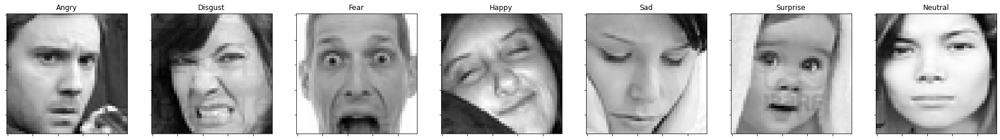

In [42]:
plot_all_emotions()

## Angry

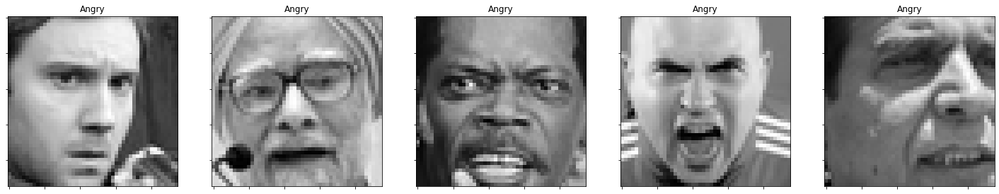

In [43]:
plot_examples(label=0)

## Disgust

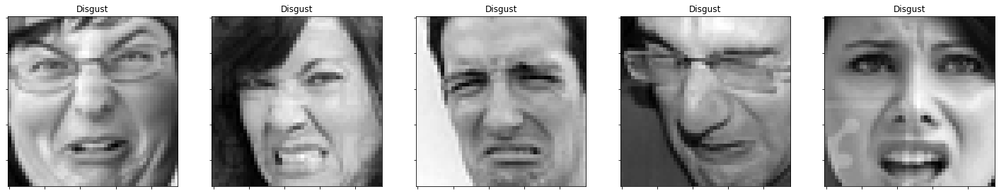

In [44]:
plot_examples(label=1)

## Fear

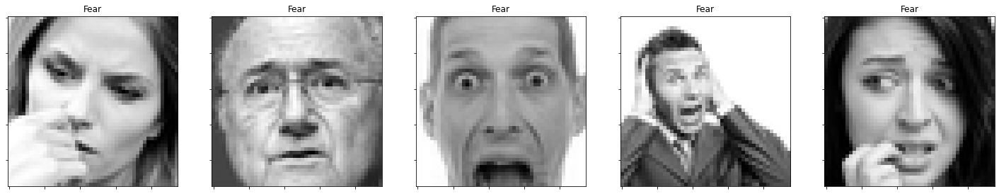

In [45]:
plot_examples(label=2)

## Happy

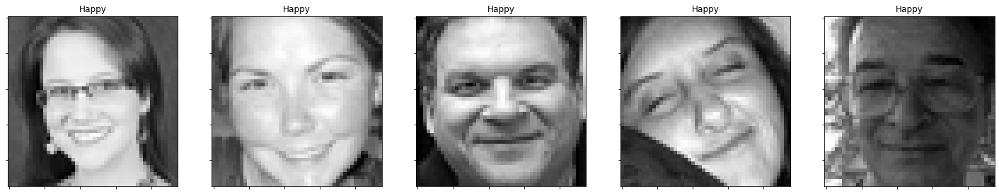

In [46]:
plot_examples(label=3)


## Sad

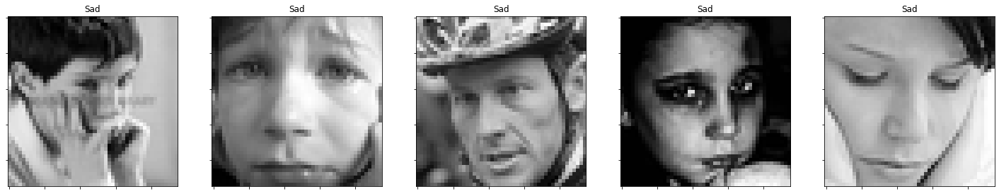

In [47]:
plot_examples(label=4)

## Surprise

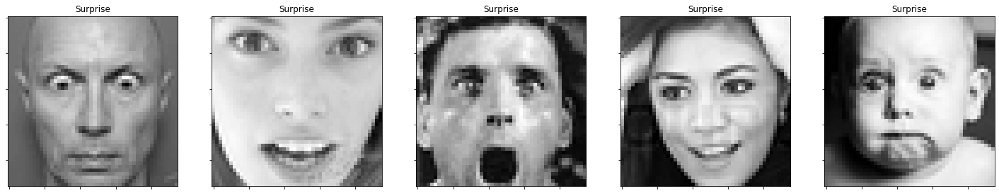

In [48]:
plot_examples(label=5)

## Neutral

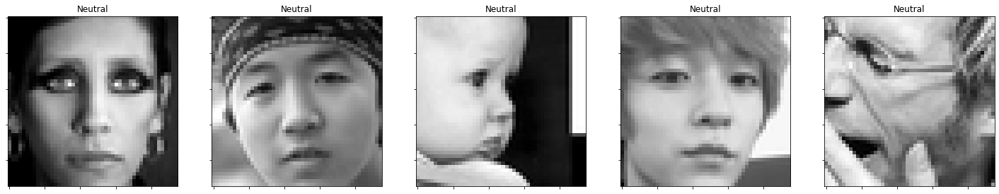

In [49]:
plot_examples(label=6)

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Distribution Of Labels</span></span></center></h1> 

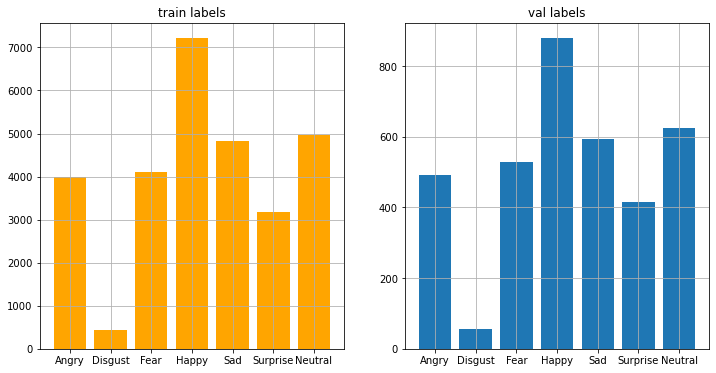

In [50]:
plot_compare_distributions(train_labels, val_labels, title1='train labels', title2='val labels')

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Class Weights</span></span></center></h1> 
Calculate the class weights of the label distribution:

In [51]:
class_weight = dict(zip(range(0, 7), (((data[data[' Usage']=='Training']['emotion'].value_counts()).sort_index())/len(data[data[' Usage']=='Training']['emotion'])).tolist()))

In [52]:
class_weight

{0: 0.1391549688251071,
 1: 0.01518687519593159,
 2: 0.14270786164617366,
 3: 0.2513149186666202,
 4: 0.16823992476226968,
 5: 0.11045316799609878,
 6: 0.17294228290779895}

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Model</span></span></center></h1> 
We define a simple CNN model:

In [53]:
model = models.Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(48, 48, 1)))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPool2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dense(7, activation='softmax'))

In [54]:
model.compile(optimizer=Adam(lr=1e-3), loss='categorical_crossentropy', metrics=['accuracy'])

In [55]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 46, 46, 32)        320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 23, 23, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 21, 21, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 10, 10, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 64)          36928     
_________________________________________________________________
flatten (Flatten)            (None, 4096)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                2

In [56]:
history = model.fit(train_images, train_labels,
                    validation_data=(val_images, val_labels),
                    class_weight = class_weight,
                    epochs=12,
                    batch_size=64)

Epoch 1/12
449/449 [==============================] - 45s 101ms/step - loss: 0.2648 - accuracy: 0.3285 - val_loss: 1.5743 - val_accuracy: 0.3943
Epoch 2/12
449/449 [==============================] - 45s 100ms/step - loss: 0.2285 - accuracy: 0.4335 - val_loss: 1.5436 - val_accuracy: 0.4305
Epoch 3/12
449/449 [==============================] - 44s 99ms/step - loss: 0.2065 - accuracy: 0.4908 - val_loss: 1.3308 - val_accuracy: 0.4982
Epoch 4/12
449/449 [==============================] - 44s 97ms/step - loss: 0.1930 - accuracy: 0.5244 - val_loss: 1.3867 - val_accuracy: 0.4926
Epoch 5/12
449/449 [==============================] - 44s 97ms/step - loss: 0.1830 - accuracy: 0.5484 - val_loss: 1.2619 - val_accuracy: 0.5261
Epoch 6/12
449/449 [==============================] - 44s 98ms/step - loss: 0.1750 - accuracy: 0.5690 - val_loss: 1.2663 - val_accuracy: 0.5350
Epoch 7/12
449/449 [==============================] - 44s 97ms/step - loss: 0.1664 - accuracy: 0.5900 - val_loss: 1.2530 - val_accurac

In [57]:
test_loss, test_acc = model.evaluate(test_images, test_labels)
print('test caccuracy:', test_acc)

113/113 [==============================] - 2s 13ms/step - loss: 1.3784 - accuracy: 0.5419
test caccuracy: 0.5419337153434753


In [58]:
pred_test_labels = model.predict(test_images)

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Analyse Convergence</span></span></center></h1> 

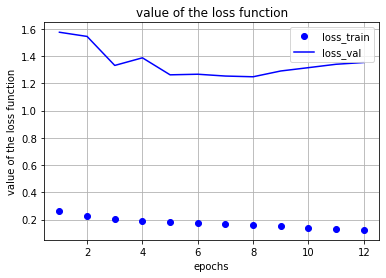

In [59]:
loss = history.history['loss']
loss_val = history.history['val_loss']
epochs = range(1, len(loss)+1)
plt.plot(epochs, loss, 'bo', label='loss_train')
plt.plot(epochs, loss_val, 'b', label='loss_val')
plt.title('value of the loss function')
plt.xlabel('epochs')
plt.ylabel('value of the loss function')
plt.legend()
plt.grid()
plt.show()

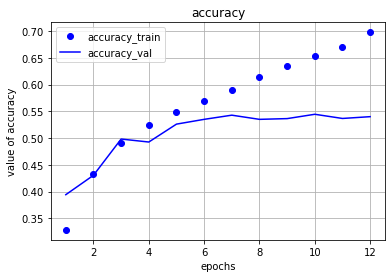

In [60]:
acc = history.history['accuracy']
acc_val = history.history['val_accuracy']
epochs = range(1, len(loss)+1)
plt.plot(epochs, acc, 'bo', label='accuracy_train')
plt.plot(epochs, acc_val, 'b', label='accuracy_val')
plt.title('accuracy')
plt.xlabel('epochs')
plt.ylabel('value of accuracy')
plt.legend()
plt.grid()
plt.show()

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Analyse Results</span></span></center></h1> 

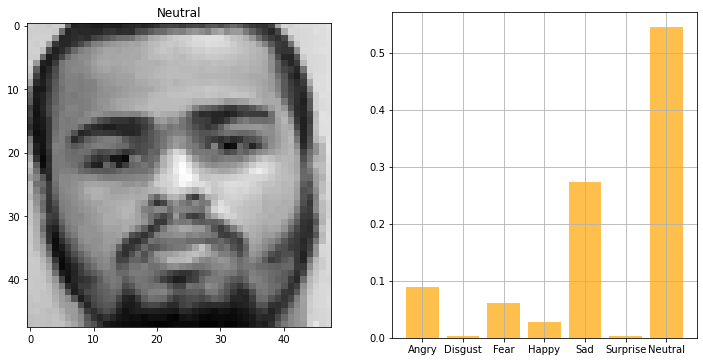

In [61]:
plot_image_and_emotion(test_image_array, test_image_label, pred_test_labels, 106)

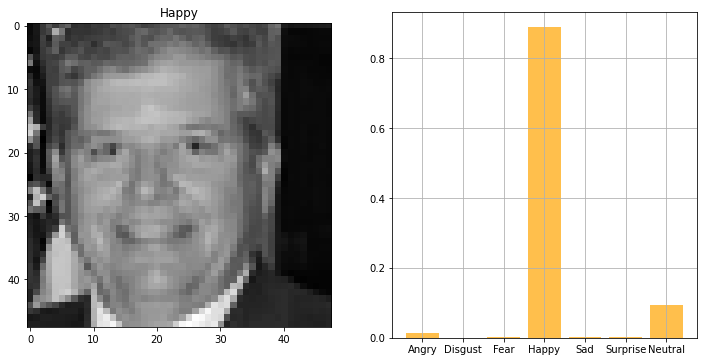

In [62]:
plot_image_and_emotion(test_image_array, test_image_label, pred_test_labels, 47)

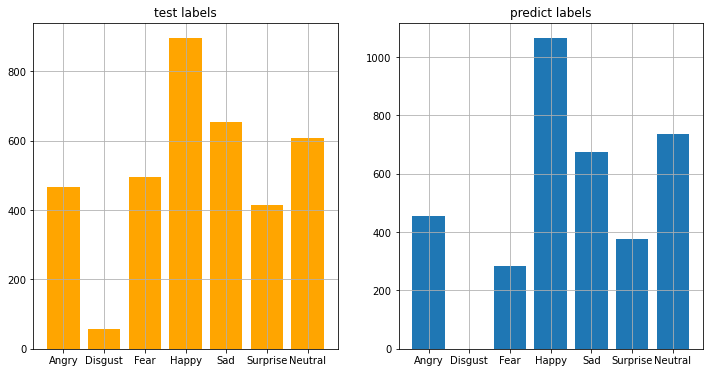

In [63]:
plot_compare_distributions(test_labels, pred_test_labels, title1='test labels', title2='predict labels')

# <h1 style='background:#CCCCCC; border:0; color:black'><center><span style="color: royalblue;"><span style="color: royalblue;">Analyse Wrong Prediction</span></span></center></h1> 
The accuracy score is about 54% on the test set. So it is obvious to take focus on the wrong predictions. We want to extract details to improve the model.

In [64]:
df_compare = pd.DataFrame()
df_compare['real'] = test_labels.argmax(axis=1)
df_compare['pred'] = pred_test_labels.argmax(axis=1)
df_compare['wrong'] = np.where(df_compare['real']!=df_compare['pred'], 1, 0)

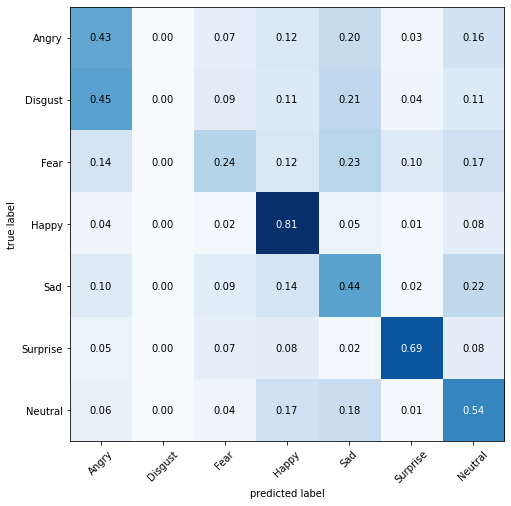

In [65]:
conf_mat = confusion_matrix(test_labels.argmax(axis=1), pred_test_labels.argmax(axis=1))

fig, ax = plot_confusion_matrix(conf_mat=conf_mat,
                                show_normed=True,
                                show_absolute=False,
                                class_names=emotions.values(),
                                figsize=(8, 8))
fig.show()

In [66]:
!pip install youtube_dl
!pip install moviepy

import os
import youtube_dl
import moviepy.editor as mp
import tensorflow as tf
import matplotlib.pyplot as plt

# Download the video from YouTube
ydl_opts = {
    'format': 'bestvideo[ext=mp4]+bestaudio[ext=m4a]/best[ext=mp4]/best',
    'outtmpl': 'path/to/save/video.mp4',
    'postprocessors': [{
        'key': 'FFmpegVideoConvertor',
        'preferedformat': 'mp4',
    }],
}
with youtube_dl.YoutubeDL(ydl_opts) as ydl:
    ydl.download(['https://www.youtube.com/watch?v=F3Upaaiv2nU'])

# Open the video and extract the audio
video = mp.VideoFileClip("path/to/save/video.mp4")
audio = video.audio

import cv2

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

#face_cascade = cv2.CascadeClassifier('path/to/haarcascade_frontalface_default.xml')
cap = cv2.VideoCapture('path/to/save/video.mp4')
face_detected = False
while True:
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    if len(faces) > 0:
        face_detected = True
        break





You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
[youtube] F3Upaaiv2nU: Downloading webpage
[download] path/to/save/video.mp4 has already been downloaded and merged
[ffmpeg] Not converting video file path/to/save/video.mp4 - already is in target format mp4


HI
HEY
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.7

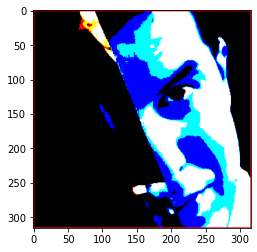

[[0.34250277 0.         0.65749717 0.         0.         0.
  0.        ]]
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68 

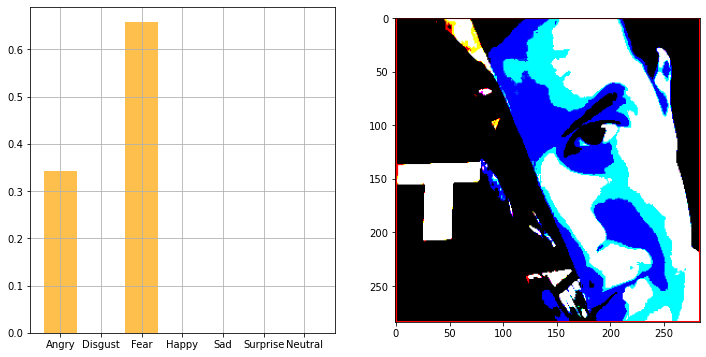

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ -87.939    -97.779    -93.68   ]
   ...
   [-103.939   -116.779   -123.68   ]
   [-103.939   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  ...

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -

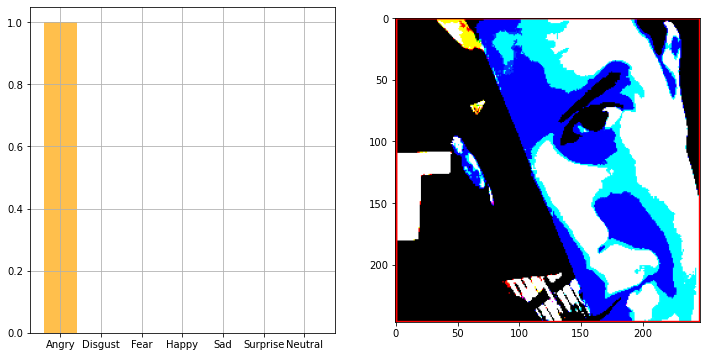

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -86.939  -96.779  -92.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [  81.061   93.221  119.32 ]
   [ 112.061  115.221  127.32 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [  85.061   97.221  123.32 ]
   [ 114.061 

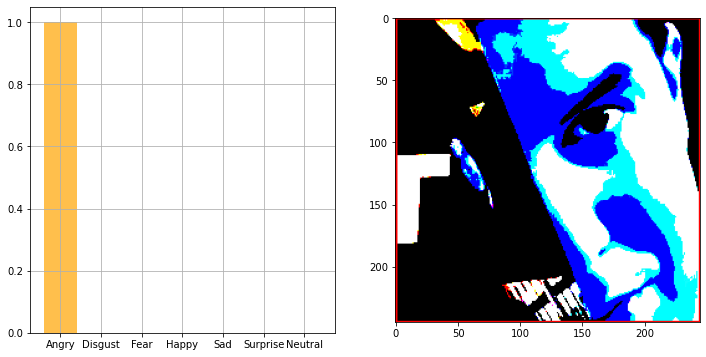

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ -81.939    -91.779    -93.68   ]
   ...
   [-103.939   -116.779   -123.68   ]
   [-103.939   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  ...

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [-103.939   -116.779   -123.68

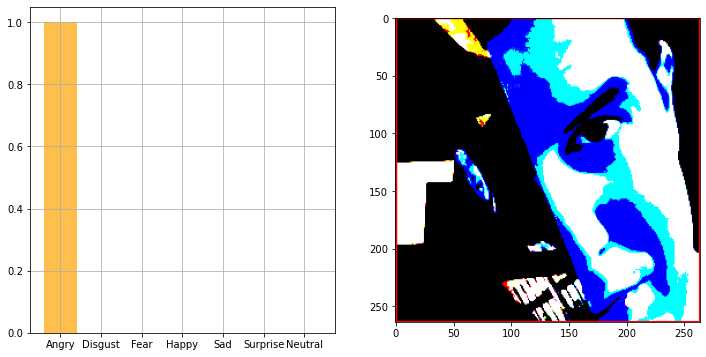

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ -84.939    -92.779    -93.68   ]
   ...
   [-103.939   -116.779   -123.68   ]
   [-103.939   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  ...

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [-103.939   -116.779   -123.68   ]
   ...
   [ 146.061    133.22101  124.32   ]
   [ 143.061    133.22101  126.32   ]


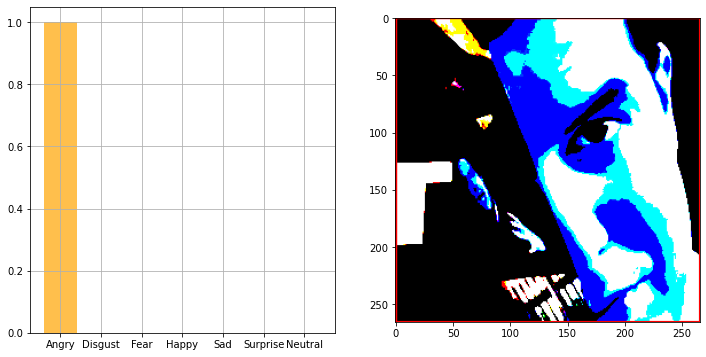

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ -86.939    -99.779   -106.68   ]
   ...
   [-103.939   -116.779   -123.68   ]
   [-103.939   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  ...

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -

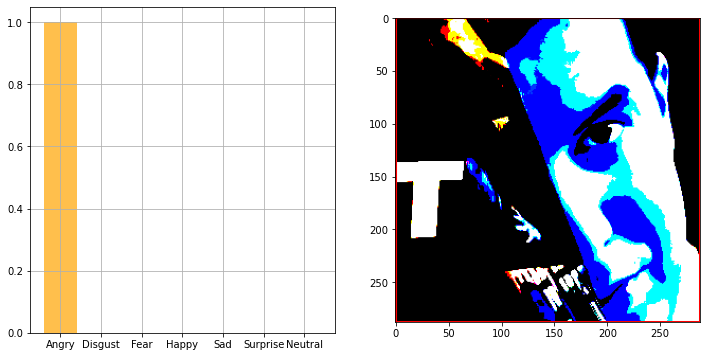

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   ...
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [ -83.939    -96.779   -103.68   ]
   ...
   [-103.939   -116.779   -123.68   ]
   [-103.939   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]]

  ...

  [[ 151.061   -116.779   -123.68   ]
   [ 151.061   -116.779   -123.68   ]
   [-103.939   -116.779   -123.68   ]
   ...
   [ 137.061    128.22101  123.32   ]
   [ 130.061    121.221    116.32   ]
   [ 151.061   -116.779   -123.68   ]]

  [[

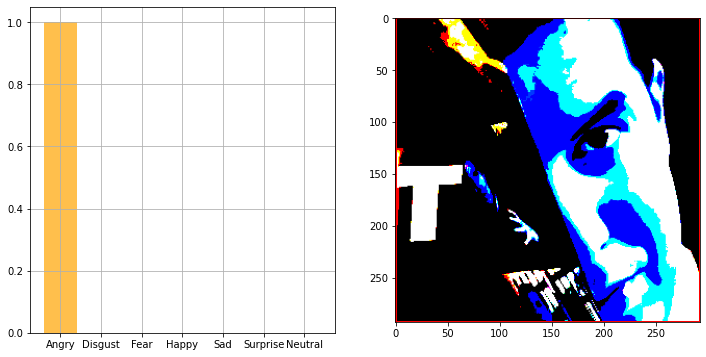

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -86.939      -99.779     -106.68     ]
   ...
   [-103.939     -116.779     -123.68     ]
   [-103.939     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [-103.939     -116.7

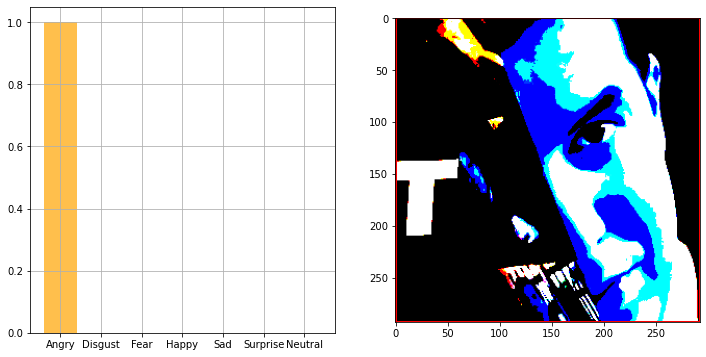

[[0. 0. 1. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -86.939  -99.779 -106.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [ -83.939  -97.779 -102.68 ]
   [ -80.939  -94.779  -99.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [ -83.939  -97.779 -102.68 ]
   [ -80.939 

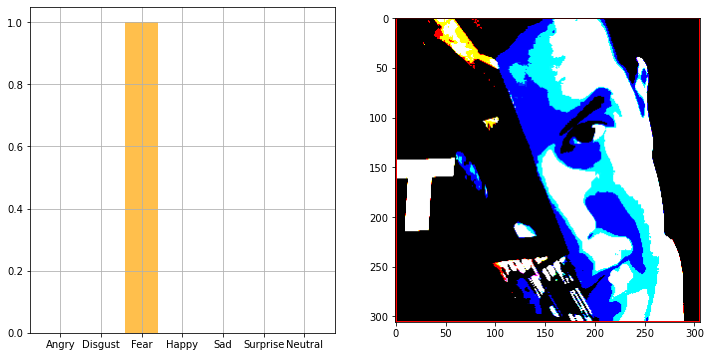

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -33.939003  -48.779     -59.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -80.939 

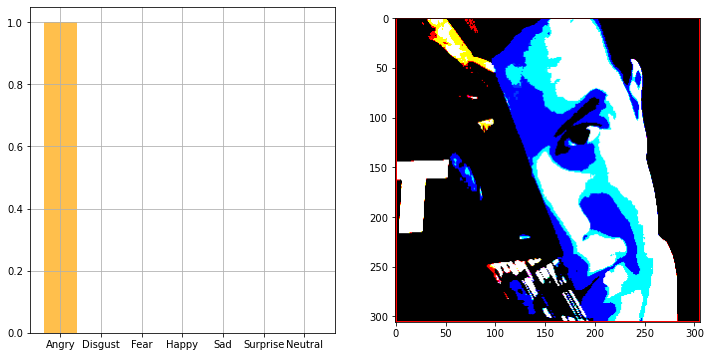

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -39.939003  -49.779     -56.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -91.939    -105.779    -102.68    ]
   [ -89.939    

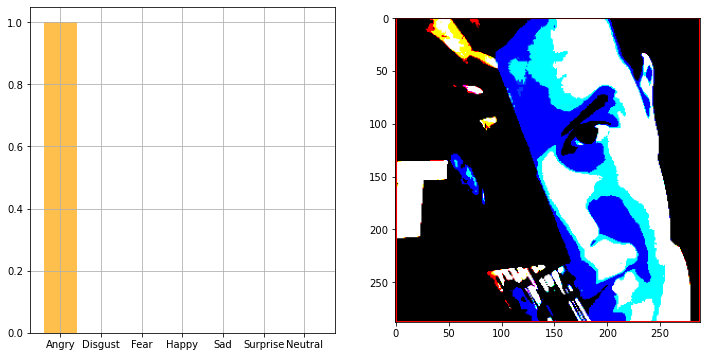

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -56.939003  -66.779     -68.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.939    -103.779    -103.68    ]
   [ -89.939    

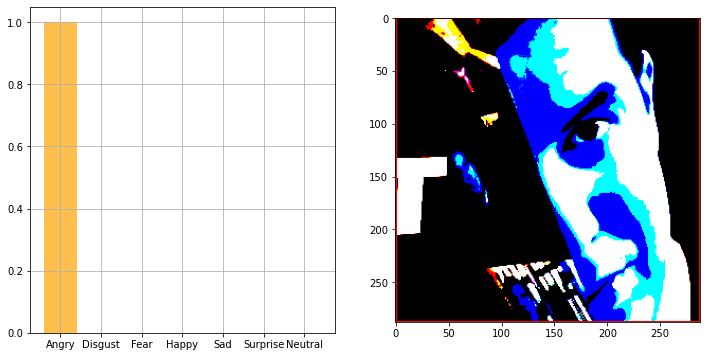

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -55.939003  -65.779     -67.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   ...
   [ -90.939    -103.779    -103.68    ]
   [ -89.939    

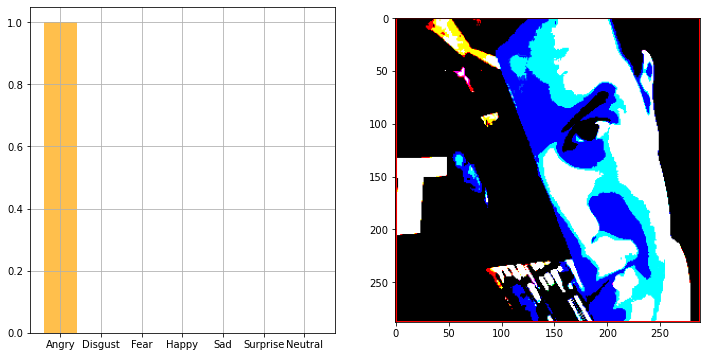

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -70.939  -81.779  -86.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [ -93.939 -107.779 -104.68 ]
   [ -91.939 -105.779 -102.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [ -93.939 -106.779 -106.68 ]
   [ -93.939 

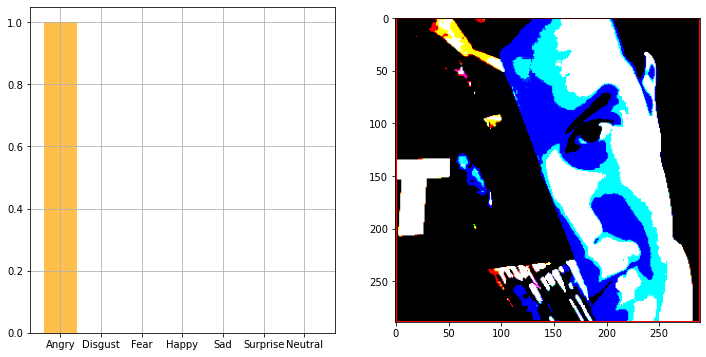

[[2.3029721e-10 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -84.939  -96.779  -98.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [ -94.939 -107.779 -107.68 ]
   [ -93.939 -106.779 -106.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-

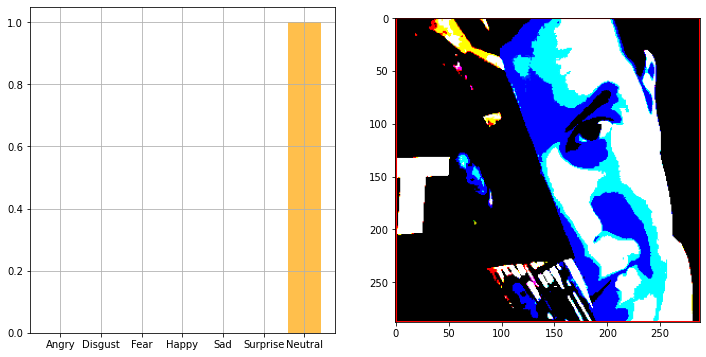

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -88.939 -102.779 -107.68 ]
   ...
   [-103.939 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [ -94.939 -107.779 -107.68 ]
   [ -93.939 -105.779 -107.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [-103.939 -116.779 -123.68 ]
   ...
   [ -94.939 -107.779 -107.68 ]
   [ -93.939 

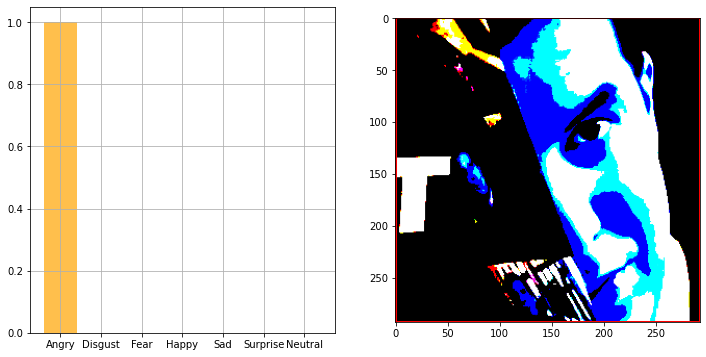

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -41.939003  -57.779     -65.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -73.939     -86.779     -93.68    ]
   ...
   [ -80.939     -95.779     -97.68    ]
   [ -83.939    

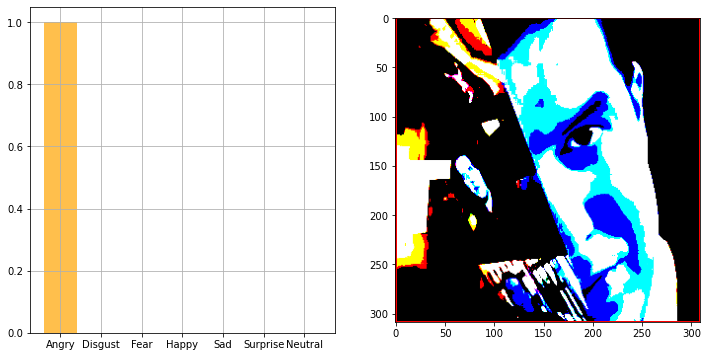

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No

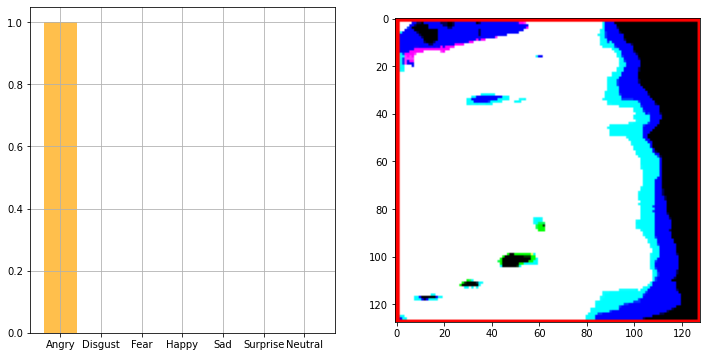

[[1.2541091e-37 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00
  0.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  47.060997   49.221      65.32    ]
   ...
   [ -31.939003  -26.779     -13.68    ]
   [ -29.939003  -24.779     -11.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  15.060997   29.221  

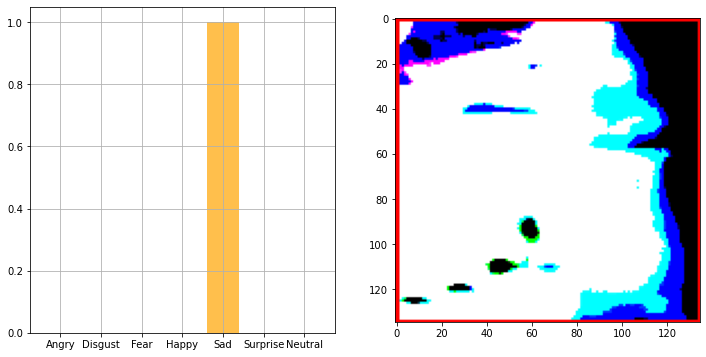

[[0. 0. 0. 0. 1. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 116.061     121.221     116.32    ]
   ...
   [ -48.939003  -44.779     -40.68    ]
   [ -40.939003  -36.779     -32.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -75.779     -73.68    ]
   ...
   [ -36.939003  -29.779      12.32    ]
   [ -40.939003 

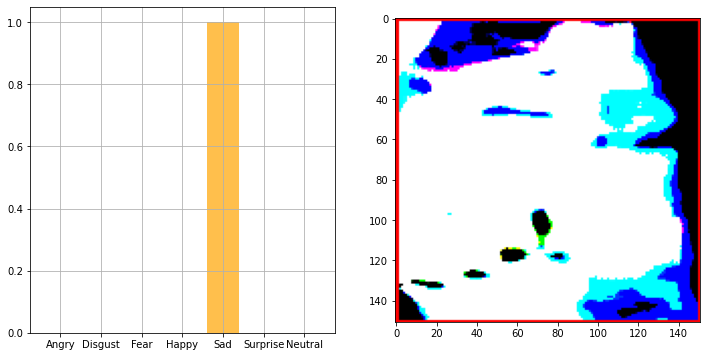

[[1. 0. 0. 0. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -13.939003     3.2210007    8.32     ]
   ...
   [-102.939     -110.779     -106.68     ]
   [-103.939     -111.779     -107.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   3.060997    -4.7789993  -11.68     ]
   ...

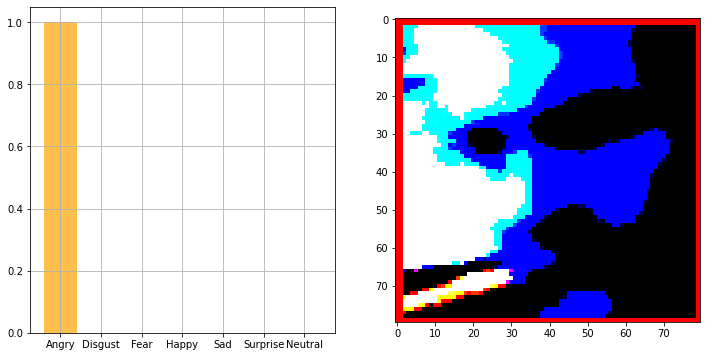

[[3.3937708e-25 0.0000000e+00 1.1871245e-33 0.0000000e+00 4.0249496e-13
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -46.939003   -30.779      -23.68     ]
   ...
   [-100.939     -108.779     -102.68     ]
   [-101.939     -109.779     -103.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

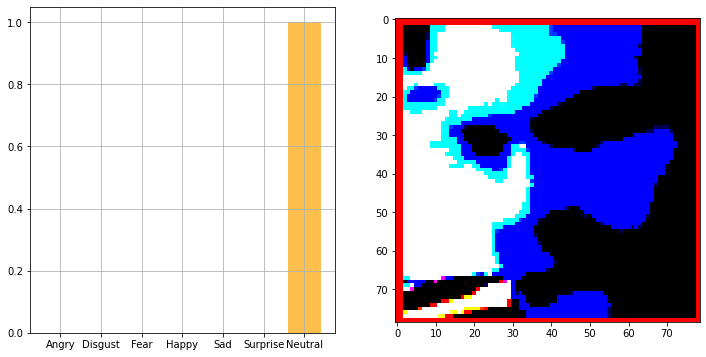

[[1.000000e+00 0.000000e+00 7.761177e-21 0.000000e+00 0.000000e+00
  0.000000e+00 1.688765e-09]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  17.060997    38.221       78.32     ]
   ...
   [ -91.939      -96.779      -81.68     ]
   [ -95.939     -100.779      -85.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     

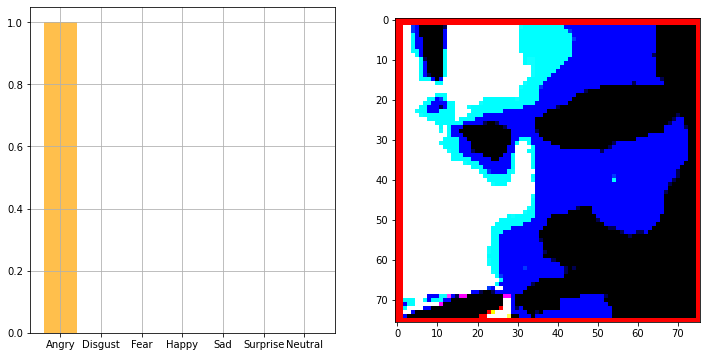

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  19.060997    46.221      101.32     ]
   ...
   [-100.939     -101.779      -89.68     ]
   [-103.939     -106.779     -103.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -4.939003     3.2210007   14.32     ]
 

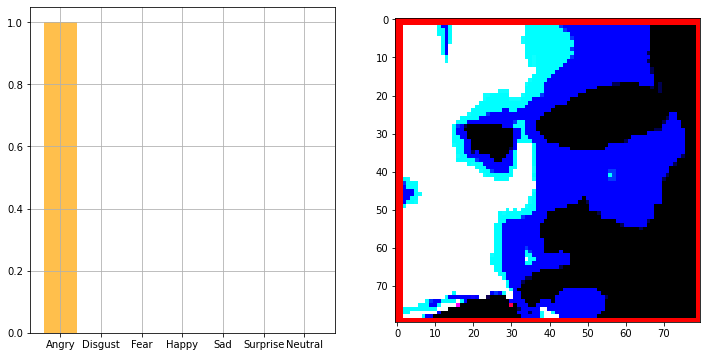

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  18.060997   43.221      98.32    ]
   ...
   [-103.939    -108.779    -109.68    ]
   [-103.939    -110.779    -111.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  33.060997   57.221      74.32    ]
   ...
   [-100.939    -111.779    -111.68    ]
   [-103.939    

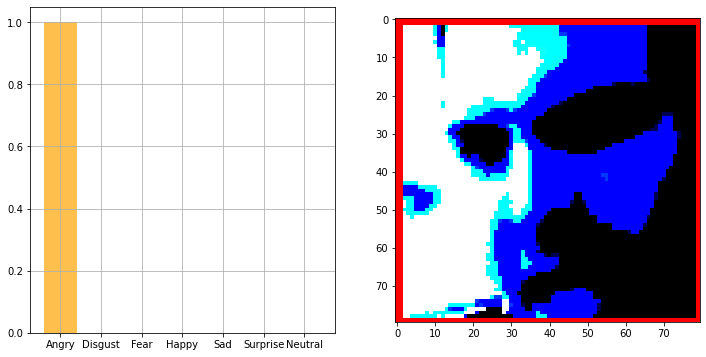

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  17.060997   43.221      96.32    ]
   ...
   [-103.939    -111.779    -117.68    ]
   [-103.939    -110.779    -118.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  39.060997   58.221      78.32    ]
   ...
   [-103.939    -114.779    -123.68    ]
   [-101.939    

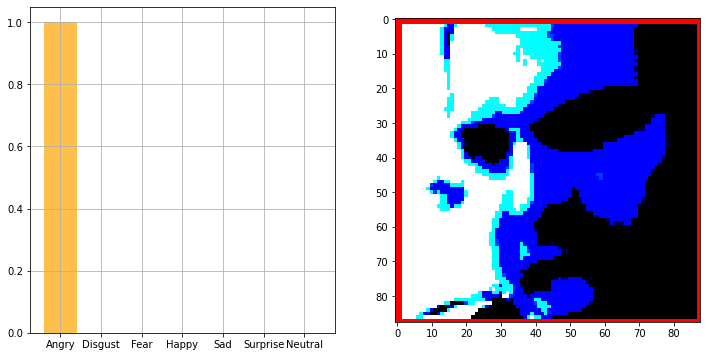

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  17.060997   46.221      96.32    ]
   ...
   [-103.939    -111.779    -114.68    ]
   [-103.939    -112.779    -115.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  41.060997   66.221      94.32    ]
   ...
   [ -99.939    -109.779    -111.68    ]
   [-102.939    

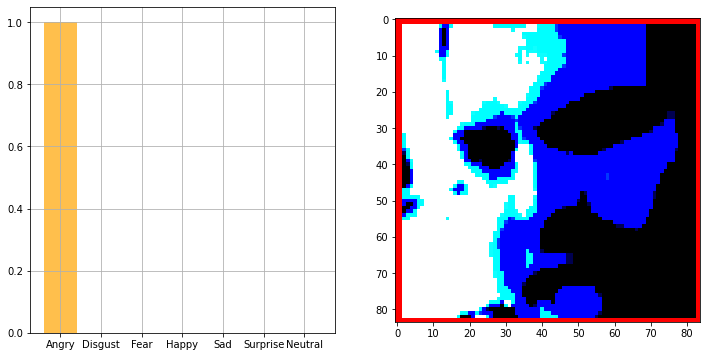

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  30.060997   64.221     100.32    ]
   ...
   [-103.939    -113.779    -114.68    ]
   [-103.939    -113.779    -115.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  37.060997   58.221      73.32    ]
   ...
   [-101.939    -109.779    -110.68    ]
   [-100.939    

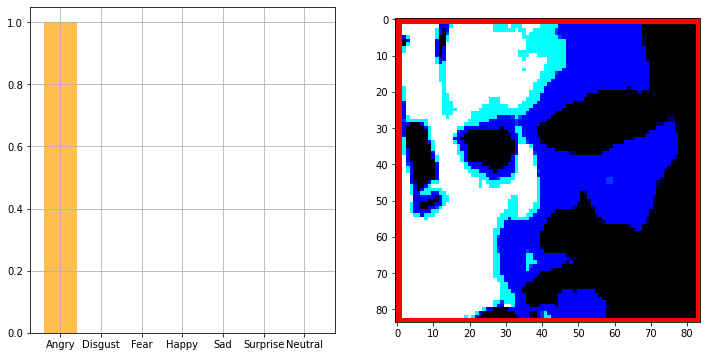

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  38.060997   61.221     103.32    ]
   ...
   [ -99.939    -109.779    -111.68    ]
   [-100.939    -110.779    -112.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  39.060997   44.221      39.32    ]
   ...
   [-102.939    -110.779    -117.68    ]
   [-103.939    

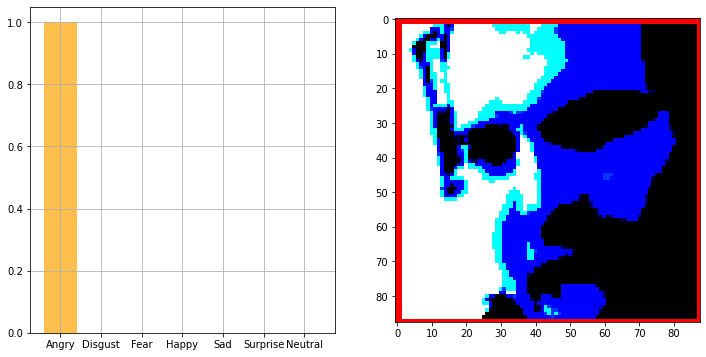

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  38.060997   52.221      73.32    ]
   ...
   [-100.939    -110.779    -112.68    ]
   [-102.939    -112.779    -114.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  39.060997   44.221      39.32    ]
   ...
   [-100.939    -110.779    -119.68    ]
   [-100.939    

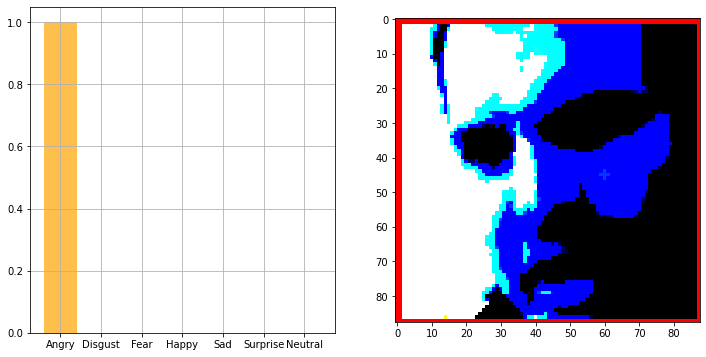

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  18.060997   27.221      30.32    ]
   ...
   [-102.939    -109.779    -107.68    ]
   [-100.939    -108.779    -109.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  44.060997   46.221      42.32    ]
   ...
   [-103.939    -111.779    -114.68    ]
   [-102.939    

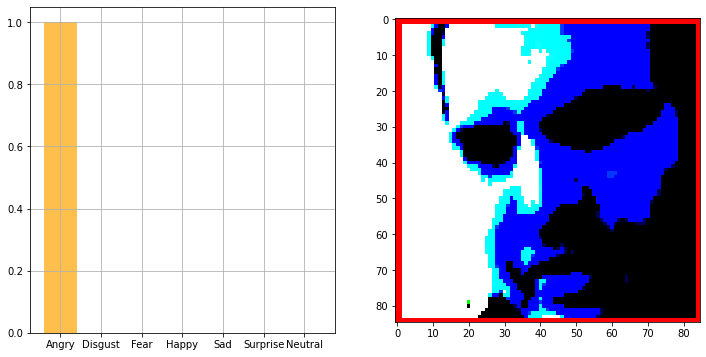

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 3.8169565e-25]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  49.060997   52.221      52.32    ]
   ...
   [ -97.939    -105.779    -101.68    ]
   [-100.939    -108.779    -104.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  41.060997   41.221  

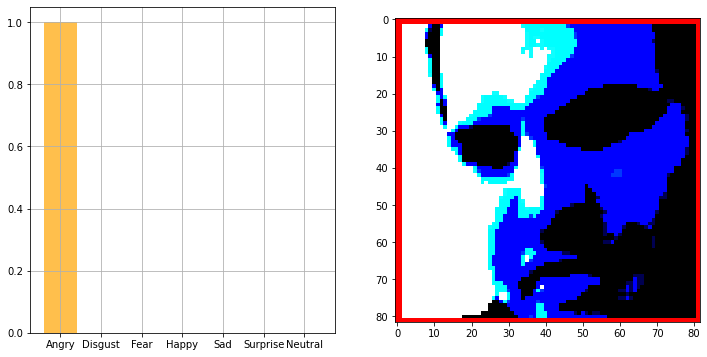

[[1.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 6.731033e-34]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  47.060997   52.221      52.32    ]
   ...
   [ -97.939    -108.779    -108.68    ]
   [ -98.939    -109.779    -109.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  -5.939003  -12.778999  -10.

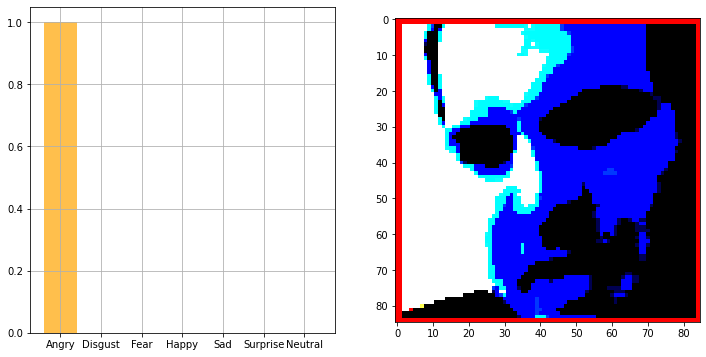

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  53.060997   56.221      56.32    ]
   ...
   [-101.939    -108.779    -111.68    ]
   [ -98.939    -108.779    -110.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -57.939003  -56.779     -58.68    ]
   ...
   [-103.939    -112.779    -115.68    ]
   [-103.939    

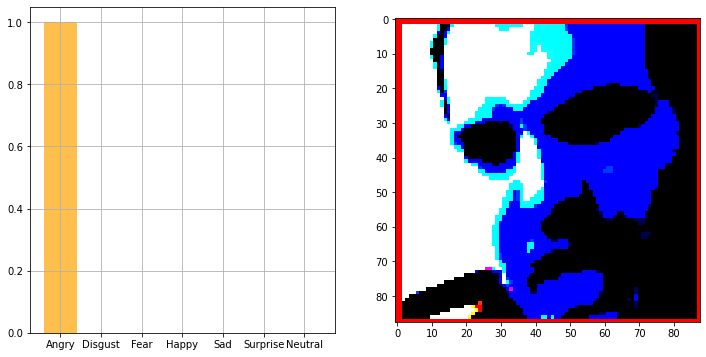

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  58.060997   61.221      61.32    ]
   ...
   [ -91.939    -102.779    -107.68    ]
   [ -93.939    -104.779    -109.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  47.060997   48.221      46.32    ]
   ...
   [-103.939    -113.779    -119.68    ]
   [-103.939    

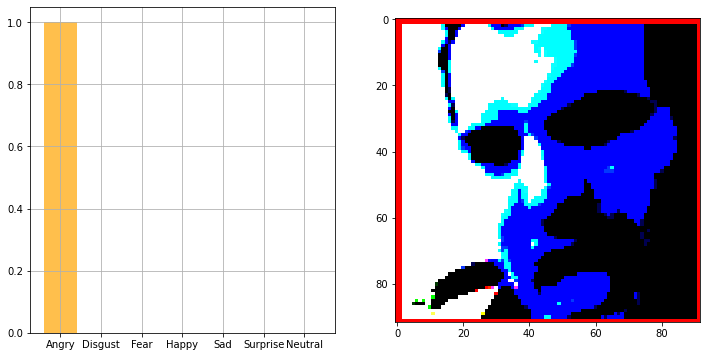

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  61.060997   66.221      61.32    ]
   ...
   [ -84.939     -94.779    -101.68    ]
   [ -86.939     -94.779    -101.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -21.939003  -22.779     -17.68    ]
   ...
   [-103.939    -112.779    -118.68    ]
   [-102.939    

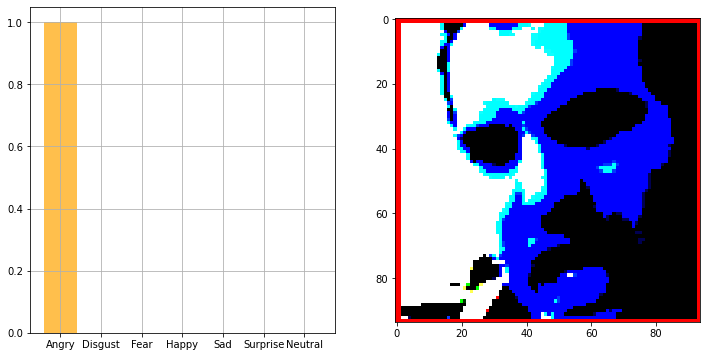

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  43.060997    47.221       44.32     ]
   ...
   [ -87.939      -98.779     -103.68     ]
   [ -86.939      -97.779     -102.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -13.939003   -14.778999    -9.68     ]
 

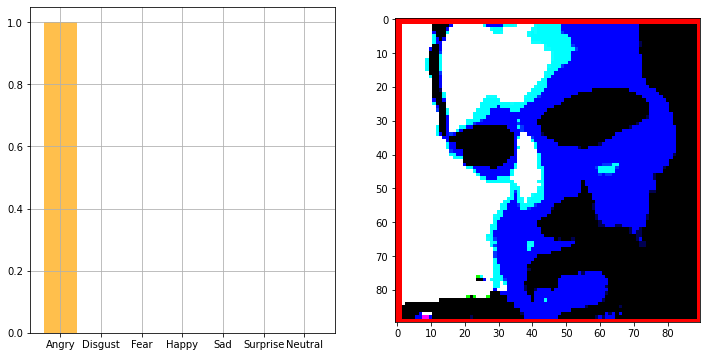

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -22.939003   -18.779      -21.68     ]
   ...
   [ -83.939      -88.779      -96.68     ]
   [ -85.939      -86.779      -94.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -18.939003   -28.779      -10.68     ]
 

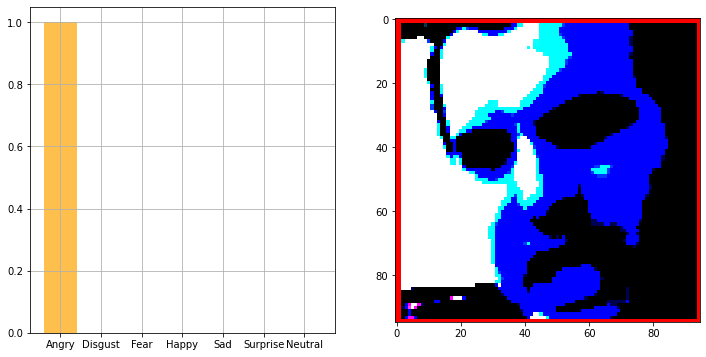

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  53.060997    59.221       56.32     ]
   ...
   [ -84.939      -93.779      -98.68     ]
   [ -84.939      -93.779      -98.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   4.060997    -2.7789993   14.32     ]
 

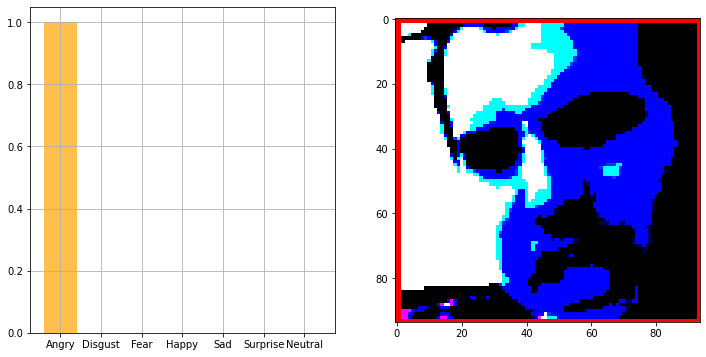

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  51.060997   56.221      56.32    ]
   ...
   [ -81.939     -90.779     -95.68    ]
   [ -82.939     -88.779     -89.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -36.939003  -42.779     -29.68    ]
   ...
   [-102.939    -107.779    -105.68    ]
   [-102.939    

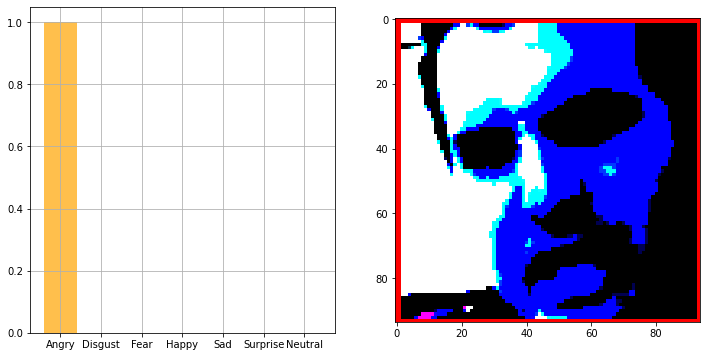

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  96.061     105.221     100.32    ]
   ...
   [ -79.939     -84.779     -92.68    ]
   [ -77.939     -82.779     -90.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -35.939003  -39.779     -31.68    ]
   ...
   [ -98.939    -103.779    -101.68    ]
   [ -97.939    

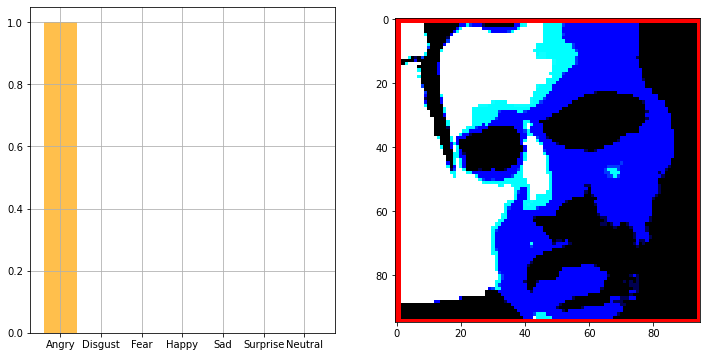

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  72.061      80.221      77.32    ]
   ...
   [ -78.939     -84.779     -85.68    ]
   [ -75.939     -81.779     -82.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -26.939003  -30.779     -22.68    ]
   ...
   [ -96.939    -102.779    -103.68    ]
   [-100.939    

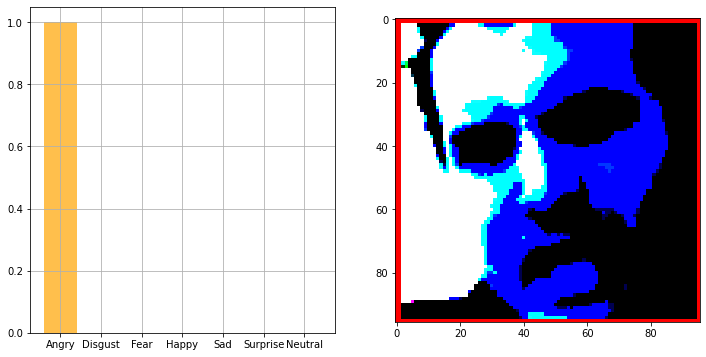

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  86.061      94.221      86.32    ]
   ...
   [ -64.939     -79.779     -81.68    ]
   [ -63.939003  -76.779     -76.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -71.939     -74.779     -69.68    ]
   ...
   [ -96.939    -102.779     -98.68    ]
   [ -95.939    

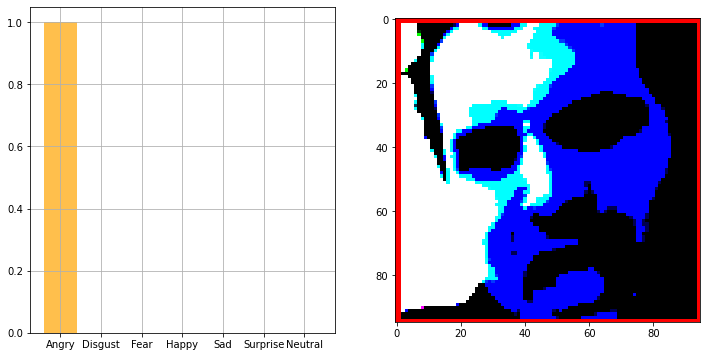

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  98.061     106.221      98.32    ]
   ...
   [ -68.939     -80.779     -82.68    ]
   [ -67.939     -79.779     -81.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -39.939003  -41.779     -47.68    ]
   ...
   [ -98.939    -102.779    -103.68    ]
   [ -98.939    

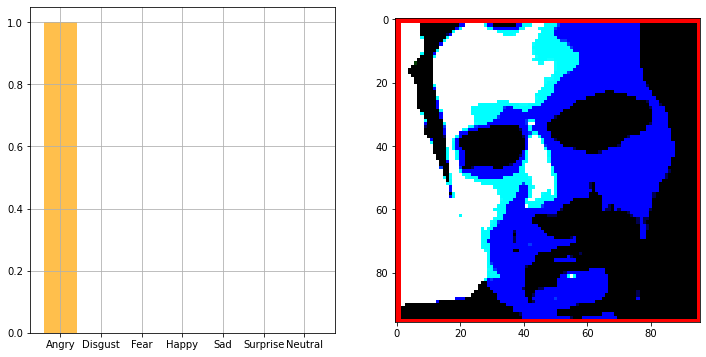

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  98.061     106.221      98.32    ]
   ...
   [ -67.939     -77.779     -79.68    ]
   [ -62.939003  -73.779     -73.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -33.939003  -36.779     -39.68    ]
   ...
   [ -98.939    -103.779    -101.68    ]
   [ -93.939    

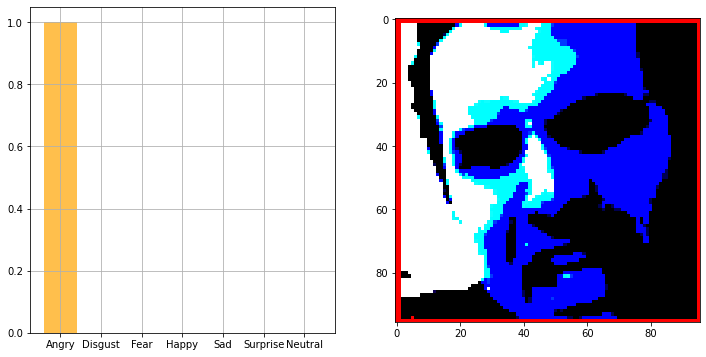

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 101.061     109.221     101.32    ]
   ...
   [ -56.939003  -64.779     -65.68    ]
   [ -31.939003  -39.779     -40.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  41.060997   38.221      35.32    ]
   ...
   [ -94.939     -99.779    -102.68    ]
   [ -93.939    

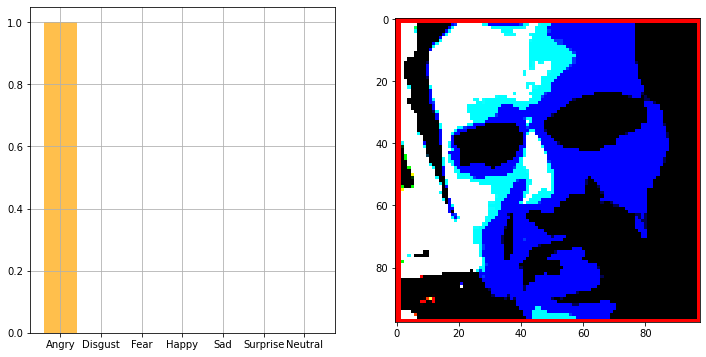

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  83.061      93.221      85.32    ]
   ...
   [ -51.939003  -62.779     -62.68    ]
   [ -35.939003  -40.779     -38.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 128.061     125.221     122.32    ]
   ...
   [ -93.939     -99.779    -100.68    ]
   [ -90.939    

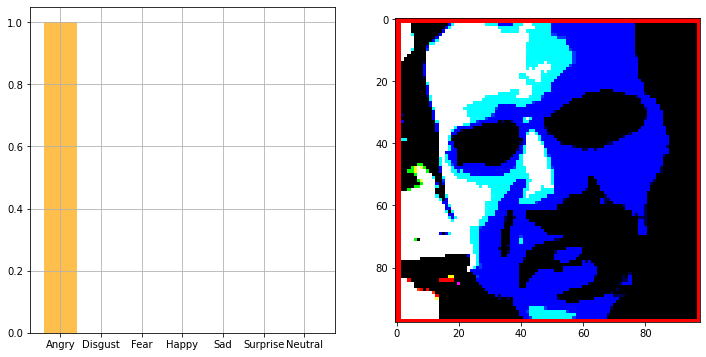

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 105.061      112.221      107.32     ]
   ...
   [  -1.939003    -7.7789993   -8.68     ]
   [  24.060997    19.221       21.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  41.060997    36.221       28.32     ]
 

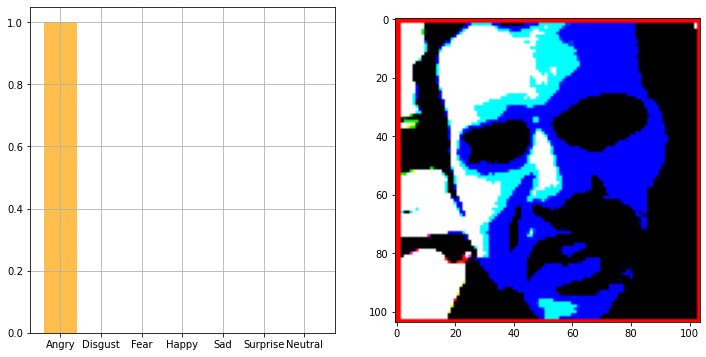

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  50.060997   58.221      55.32    ]
   ...
   [ -36.939003  -47.779     -47.68    ]
   [ -25.939003  -32.779     -30.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  55.060997   50.221      40.32    ]
   ...
   [ -93.939    -101.779     -95.68    ]
   [ -92.939    

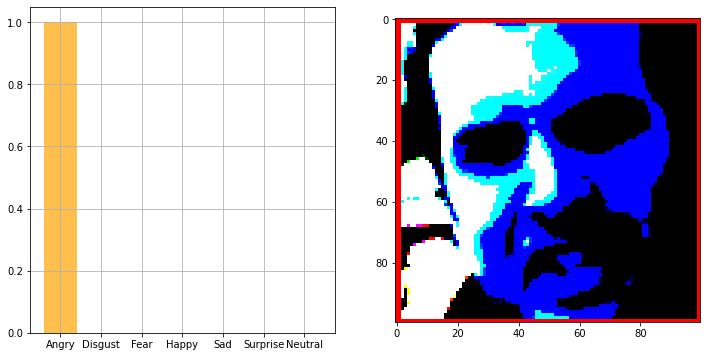

[[1.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 8.166961e-09]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  22.060997   31.221      32.32    ]
   ...
   [ -56.939003  -66.779     -68.68    ]
   [ -47.939003  -53.779     -54.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  62.060997   59.221      51.

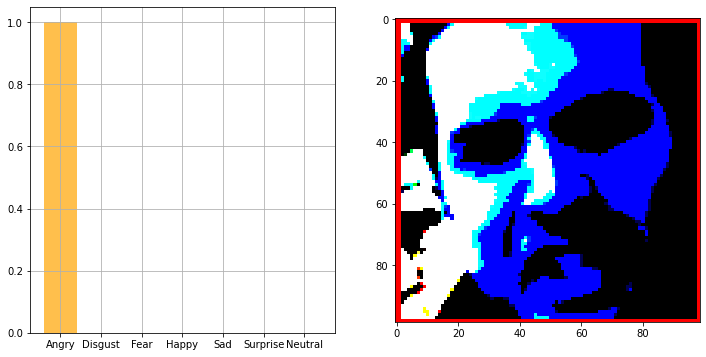

[[9.999907e-01 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 9.292868e-06]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  47.060997    53.221       55.32     ]
   ...
   [  37.060997    32.221       34.32     ]
   [  43.060997    41.221       42.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     

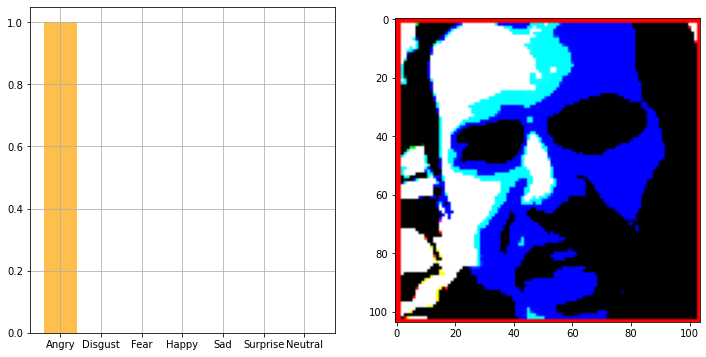

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  40.060997   46.221      48.32    ]
   ...
   [ -44.939003  -51.779     -54.68    ]
   [  -5.939003  -11.778999  -12.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  96.061      90.221      84.32    ]
   ...
   [ -92.939     -98.779     -92.68    ]
   [ -88.939    

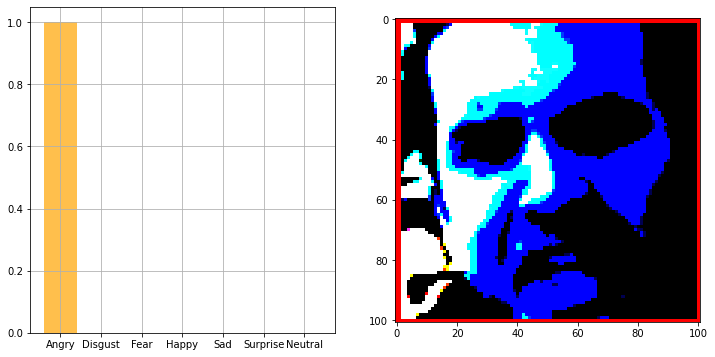

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 113.061     118.221     113.32    ]
   ...
   [ -11.939003  -17.779     -18.68    ]
   [  20.060997   14.221001   13.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  19.060997   15.221001    9.32    ]
   ...
   [ -86.939     -94.779     -95.68    ]
   [ -87.939    

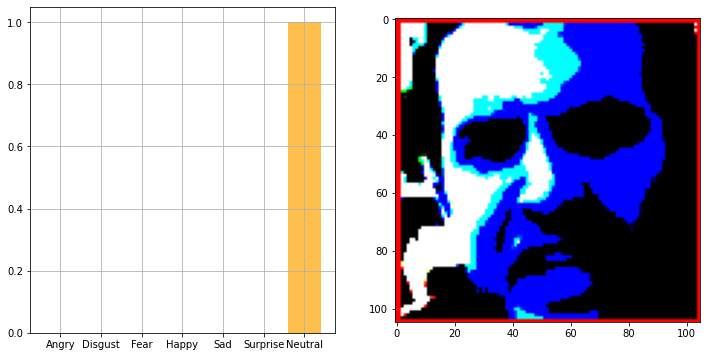

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 107.061     115.221     112.32    ]
   ...
   [ -75.939     -84.779     -96.68    ]
   [ -75.939     -84.779     -96.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  34.060997   32.221      26.32    ]
   ...
   [ -88.939     -96.779     -97.68    ]
   [ -88.939    

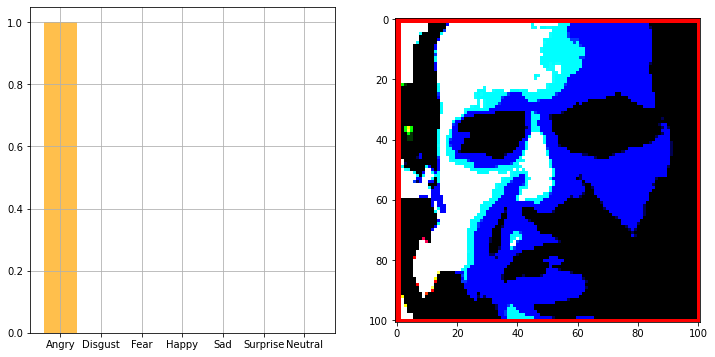

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 119.061     126.221     121.32    ]
   ...
   [ -78.939     -86.779     -95.68    ]
   [ -77.939     -85.779     -94.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  16.060997   20.221      17.32    ]
   ...
   [ -90.939     -98.779     -99.68    ]
   [ -91.939    

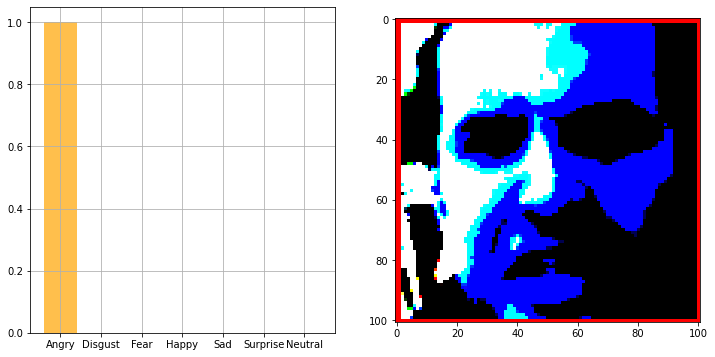

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 131.061      134.22101    127.32     ]
   ...
   [ -73.939      -77.779      -83.68     ]
   [ -27.939003   -31.779      -37.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -20.939003    -9.778999    -6.6800003]
 

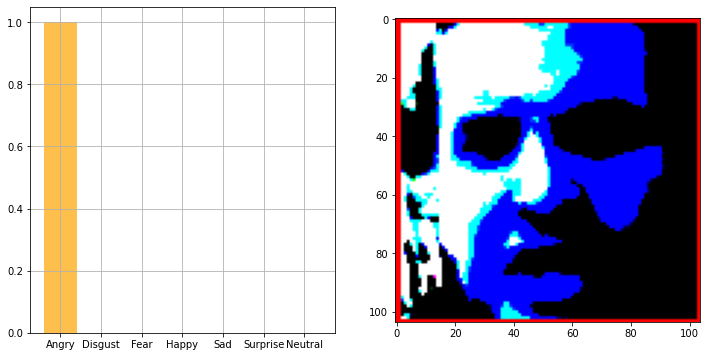

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 133.061     137.22101   128.32    ]
   ...
   [ -78.939     -85.779     -88.68    ]
   [ -63.939003  -70.779     -73.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  20.060997   19.221      22.32    ]
   ...
   [ -90.939     -97.779    -100.68    ]
   [ -90.939    

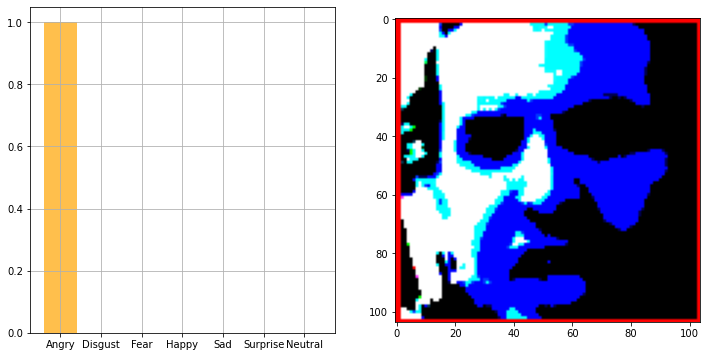

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 138.061     137.22101   129.32    ]
   ...
   [ -82.939     -91.779     -96.68    ]
   [ -82.939     -87.779     -90.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -48.939003  -64.779     -72.68    ]
   ...
   [ -91.939     -99.779    -100.68    ]
   [ -90.939    

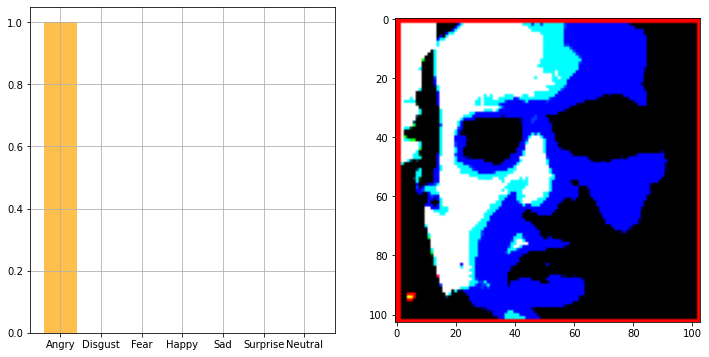

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 133.061      136.22101    129.32     ]
   ...
   [ -84.939      -93.779      -98.68     ]
   [ -83.939      -92.779      -97.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   6.060997    -1.7789993  -10.68     ]
 

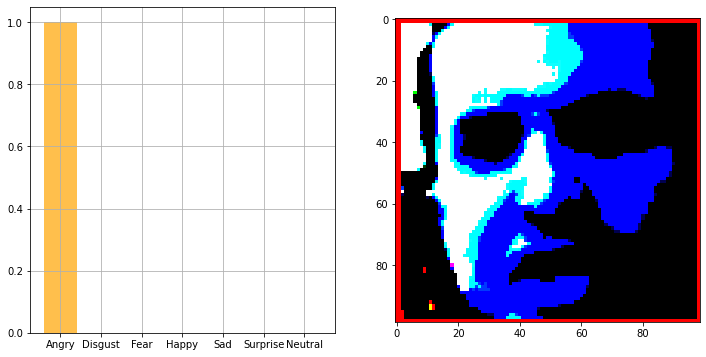

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 142.061       137.22101     129.32      ]
   ...
   [ -86.939       -91.779       -94.68      ]
   [ -75.939       -80.779       -83.68      ]
   [ 151.061      -116.779      -123.68      ]]

  ...

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      

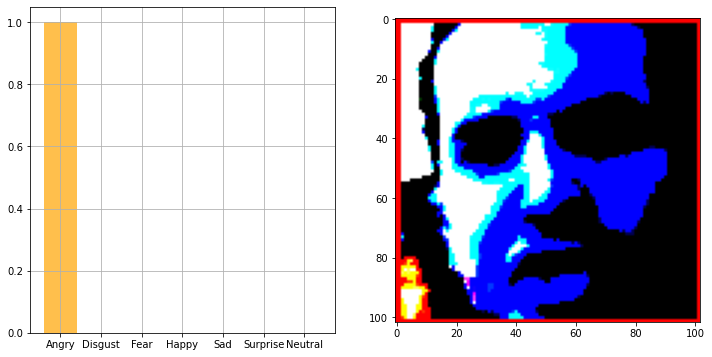

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 136.061      138.22101    129.32     ]
   ...
   [ -86.939      -95.779     -100.68     ]
   [ -86.939      -95.779     -100.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   5.060997    -1.7789993   -4.6800003]
 

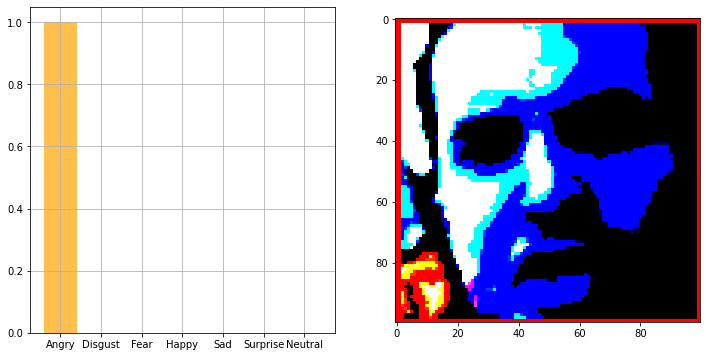

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 133.061     136.22101   129.32    ]
   ...
   [ -82.939     -91.779     -96.68    ]
   [ -62.939003  -69.779     -72.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -40.939003  -41.779     -29.68    ]
   ...
   [ -99.939    -107.779    -103.68    ]
   [-100.939    

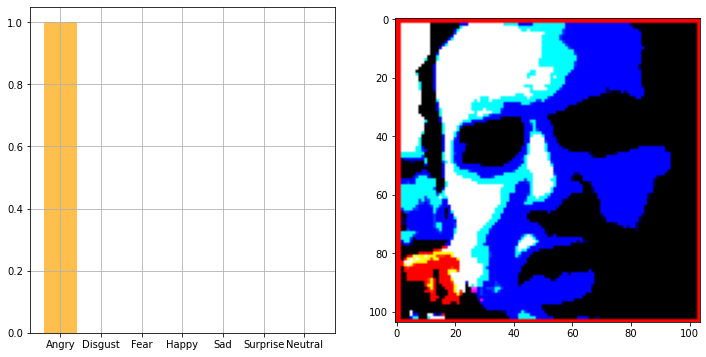

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 132.061      135.22101    128.32     ]
   ...
   [  72.061       77.221       77.32     ]
   [  76.061       81.221       81.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -15.939003   -10.778999   -10.68     ]
 

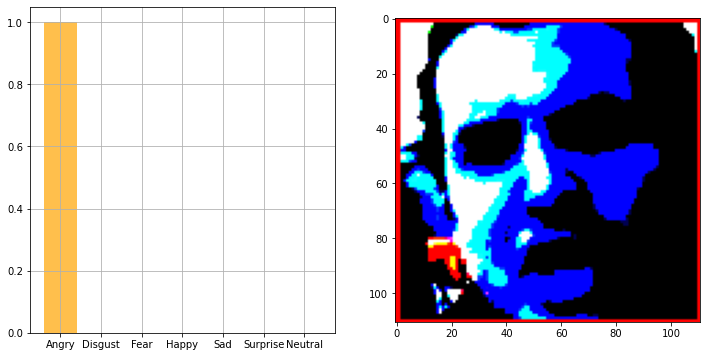

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 132.061     135.22101   128.32    ]
   ...
   [  14.060997   13.221001   11.32    ]
   [  15.060997   20.221      20.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -13.939003  -10.778999  -10.68    ]
   ...
   [-103.939    -112.779    -106.68    ]
   [-102.939    

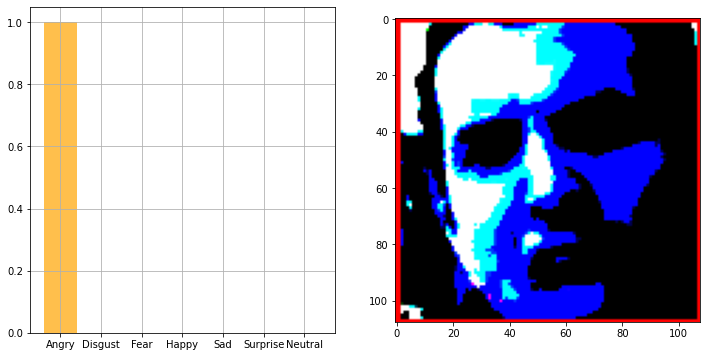

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 113.061      119.221      111.32     ]
   ...
   [  -4.939003    11.221001    11.32     ]
   [  -3.939003    14.221001    16.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  12.060997    17.221       17.32     ]
 

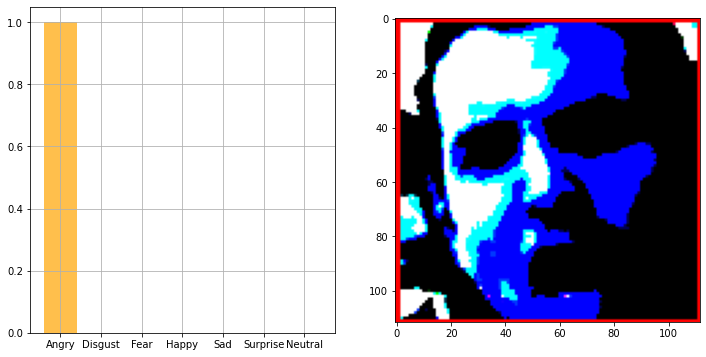

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 110.061     115.221     110.32    ]
   ...
   [ -68.939     -71.779     -74.68    ]
   [ -46.939003  -49.779     -52.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  23.060997   28.221      28.32    ]
   ...
   [ -81.939     -87.779     -83.68    ]
   [ -83.939    

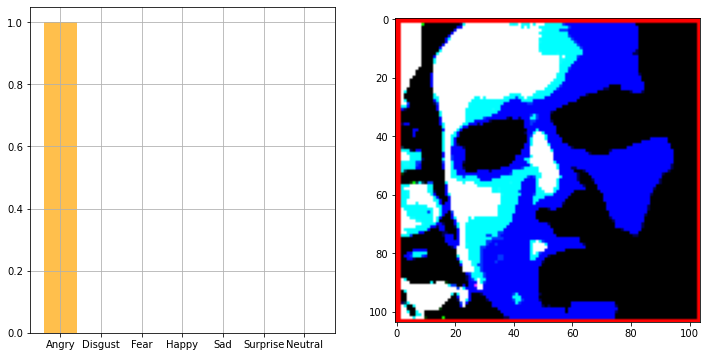

[[0. 0. 1. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  79.061      88.221      83.32    ]
   ...
   [   7.060997   10.221001   10.32    ]
   [  29.060997   32.221      32.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -53.939003  -48.779     -41.68    ]
   ...
   [ -82.939     -88.779     -84.68    ]
   [ -84.939    

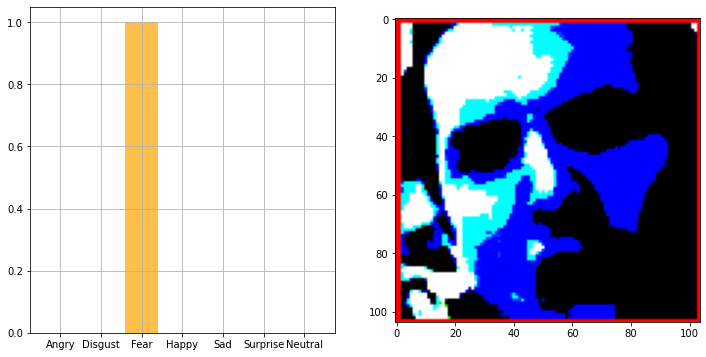

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  96.061      108.221      102.32     ]
   ...
   [  51.060997    57.221       59.32     ]
   [  50.060997    56.221       58.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -1.939003     7.2210007    8.32     ]
 

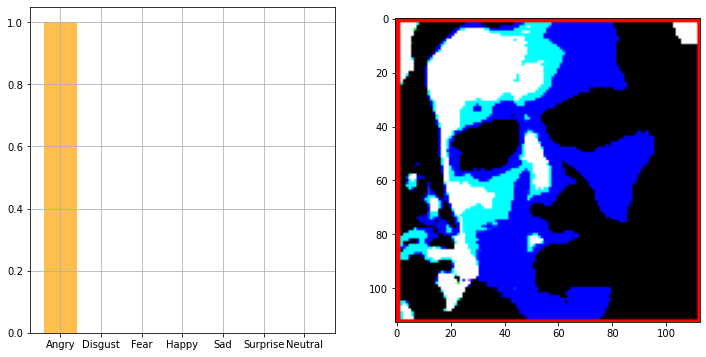

[[1.00000000e+00 0.00000000e+00 0.00000000e+00 1.00977775e-17
  0.00000000e+00 0.00000000e+00 0.00000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  55.060997    66.221       62.32     ]
   ...
   [  45.060997    50.221       50.32     ]
   [  45.060997    50.221       50.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   

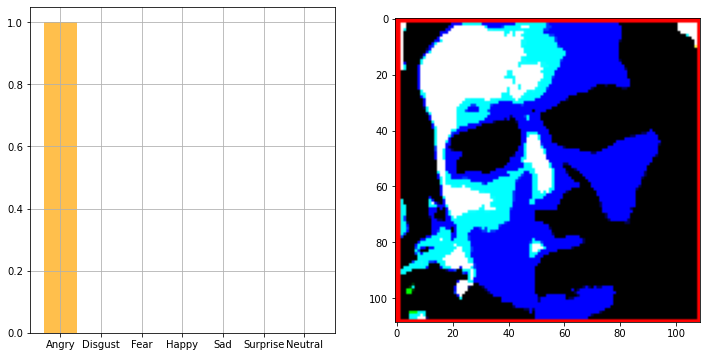

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  35.060997   41.221      38.32    ]
   ...
   [  97.061     108.221     104.32    ]
   [  96.061     107.221     103.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -48.939003  -40.779     -34.68    ]
   ...
   [ -90.939     -96.779     -92.68    ]
   [ -85.939    

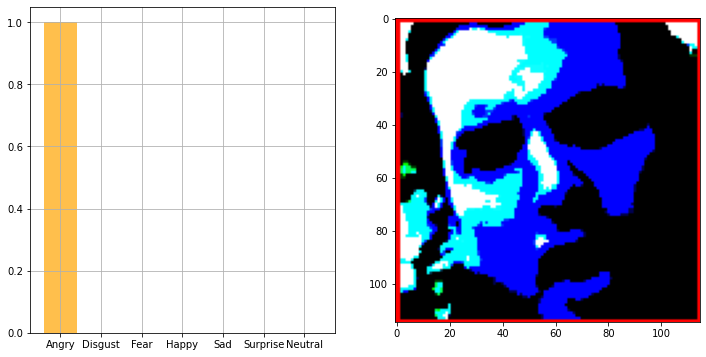

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -15.939003   -8.778999   -8.68    ]
   ...
   [ 105.061     117.221     111.32    ]
   [ 105.061     117.221     111.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -57.939003  -46.779     -36.68    ]
   ...
   [ -91.939     -97.779     -93.68    ]
   [ -87.939    

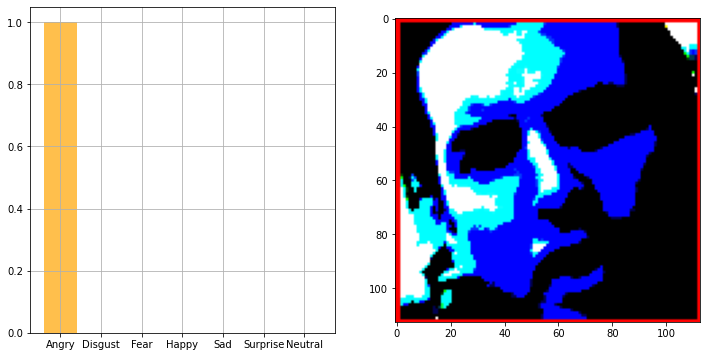

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -17.939003  -15.778999  -19.68    ]
   ...
   [ 111.061     120.221     115.32    ]
   [ 110.061     119.221     114.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  -1.939003    9.221001   19.32    ]
   ...
   [ -83.939     -91.779     -87.68    ]
   [ -83.939    

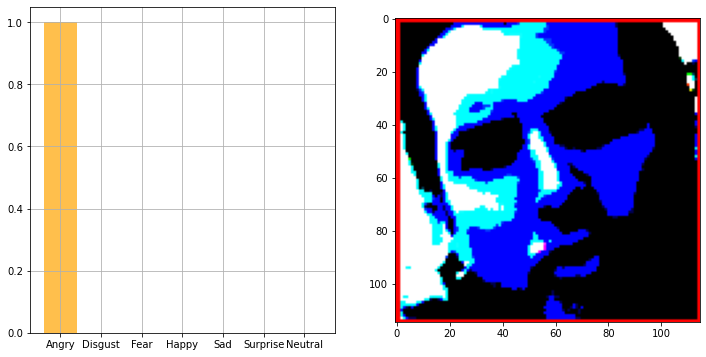

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   5.060997     7.2210007    3.3199997]
   ...
   [  98.061      107.221      102.32     ]
   [ 100.061      109.221      104.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -7.939003     7.2210007   12.32     ]
 

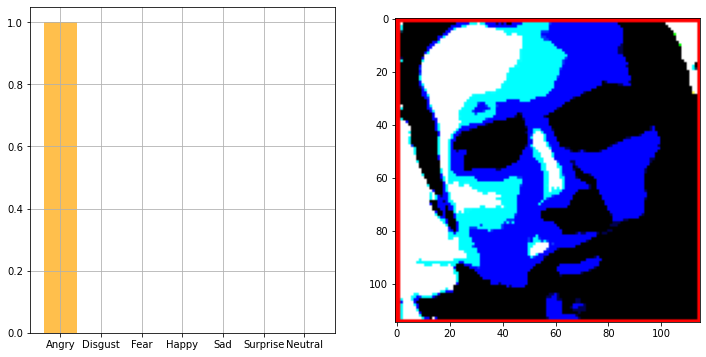

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -17.939003   -12.778999   -12.68     ]
   ...
   [   4.060997    15.221001    11.32     ]
   [   9.060997    20.221       16.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -6.939003     6.2210007   11.32     ]
 

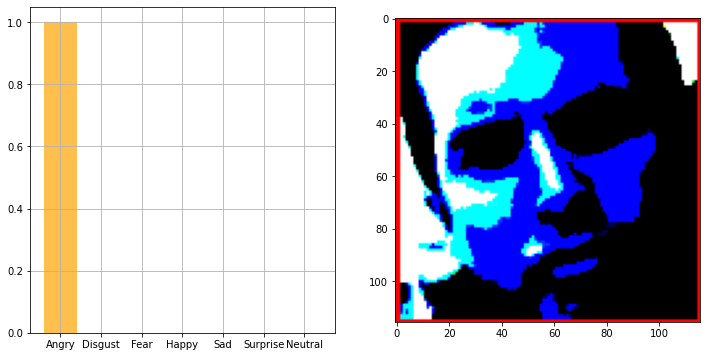

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  27.060997    31.221       33.32     ]
   ...
   [  37.060997    47.221       46.32     ]
   [  31.060997    42.221       43.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -7.939003    -1.7789993    0.3199997]
 

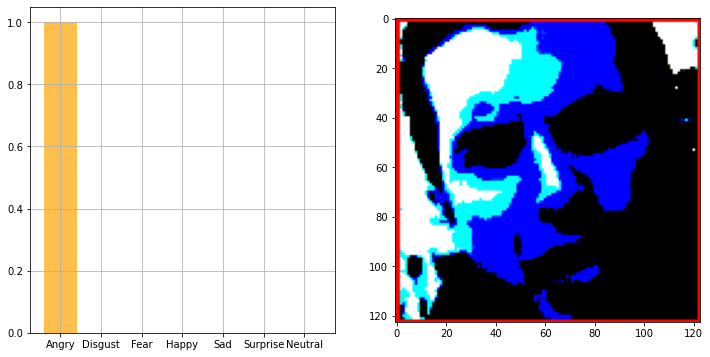

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -59.939003  -53.779     -49.68    ]
   ...
   [  69.061      76.221      76.32    ]
   [  53.060997   60.221      60.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -25.939003  -14.778999  -13.68    ]
   ...
   [ -97.939    -109.779    -111.68    ]
   [ -98.939    

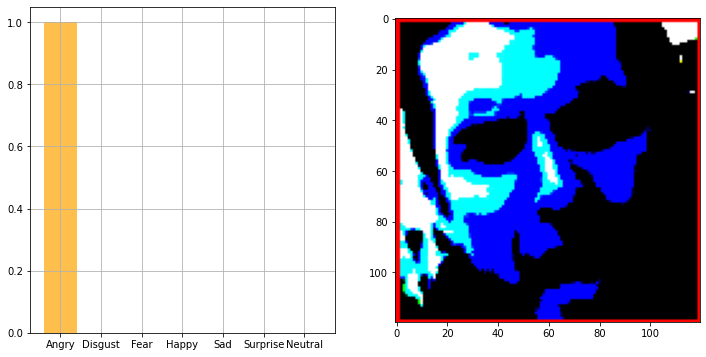

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -67.779     -66.68    ]
   ...
   [ -30.939003  -25.779     -30.68    ]
   [ -41.939003  -35.779     -38.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  13.060997   25.221      32.32    ]
   ...
   [ -97.939    -111.779    -116.68    ]
   [ -93.939    

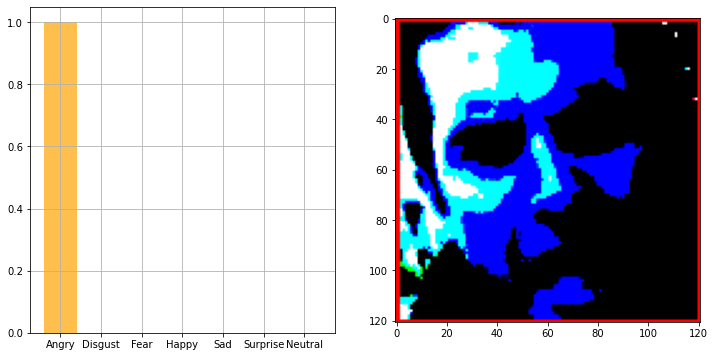

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -47.939003   -36.779      -33.68     ]
   ...
   [ -49.939003   -44.779      -44.68     ]
   [ -48.939003   -42.779      -40.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -6.939003     5.2210007   12.32     ]
 

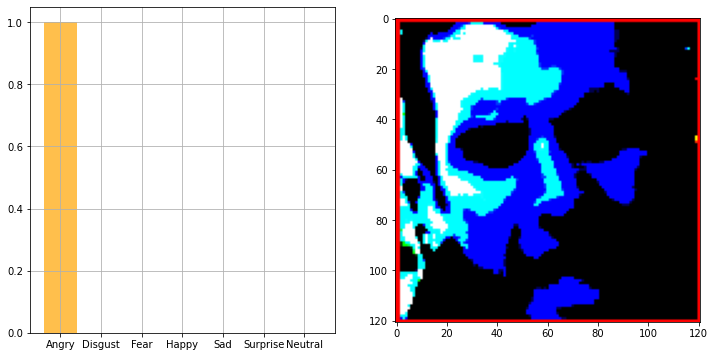

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -54.939003  -38.779     -36.68    ]
   ...
   [ -46.939003  -43.779     -43.68    ]
   [ -44.939003  -44.779     -43.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -59.939003  -57.779     -61.68    ]
   ...
   [ -97.939    -108.779    -113.68    ]
   [ -93.939    

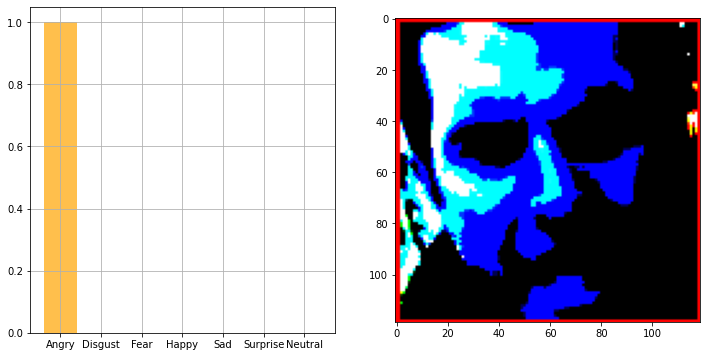

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -7.939003     6.2210007    8.32     ]
   ...
   [ -55.939003   -59.779      -60.68     ]
   [ -49.939003   -53.779      -54.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -59.939003   -58.779      -65.68     ]
 

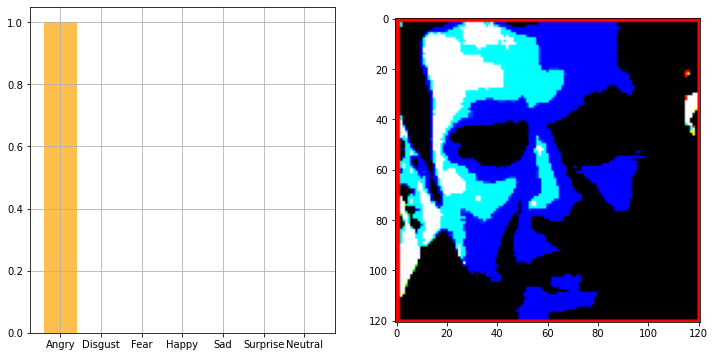

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  30.060997    45.221       50.32     ]
   ...
   [ -64.939      -69.779      -72.68     ]
   [ -57.939003   -62.779      -65.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -15.939003   -13.778999   -17.68     ]
 

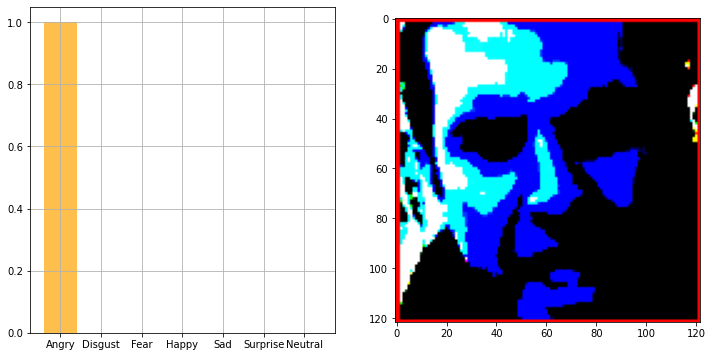

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  28.060997   43.221      48.32    ]
   ...
   [ -52.939003  -56.779     -57.68    ]
   [ -55.939003  -59.779     -60.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -74.939     -71.779     -78.68    ]
   ...
   [ -88.939    -106.779    -114.68    ]
   [ -87.939    

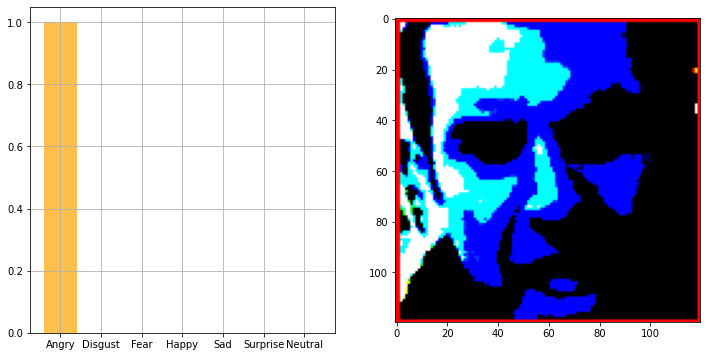

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  51.060997    71.221       75.32     ]
   ...
   [ -42.939003   -44.779      -43.68     ]
   [ -43.939003   -45.779      -44.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -6.939003    -0.7789993   -3.6800003]
 

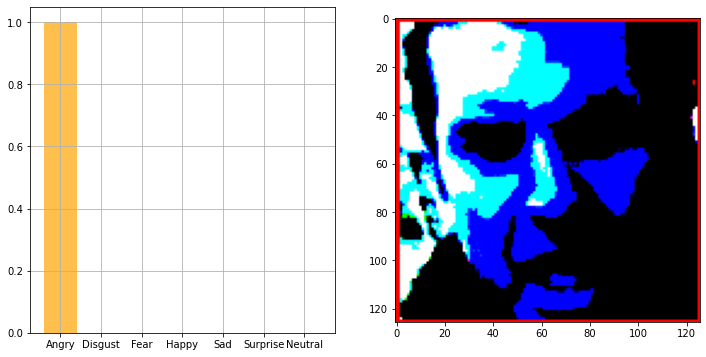

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  42.060997   62.221      66.32    ]
   ...
   [ -45.939003  -42.779     -42.68    ]
   [ -45.939003  -42.779     -42.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  11.060997   17.221      19.32    ]
   ...
   [ -97.939    -110.779    -119.68    ]
   [ -98.939    

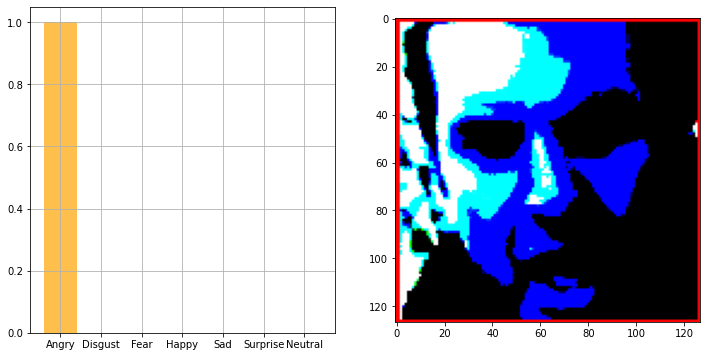

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  18.060997   31.221      36.32    ]
   ...
   [ -34.939003  -31.779     -31.68    ]
   [ -34.939003  -27.779     -27.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   6.060997   12.221001   14.32    ]
   ...
   [ -97.939    -113.779    -119.68    ]
   [ -97.939    

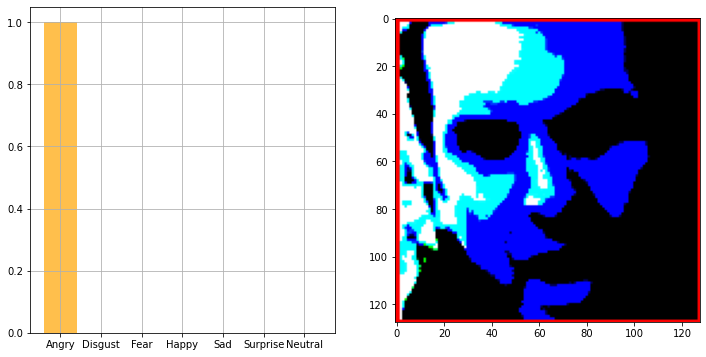

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [-1.4939003e+01 -7.7899933e-01  1.3199997e+00]
   ...
   [-3.1939003e+01 -3.6778999e+01 -3.4680000e+01]
   [-3.5939003e+01 -3.5778999e+01 -3.4680000e+01]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  ...

  [[ 1.5106100e+02 -1.167

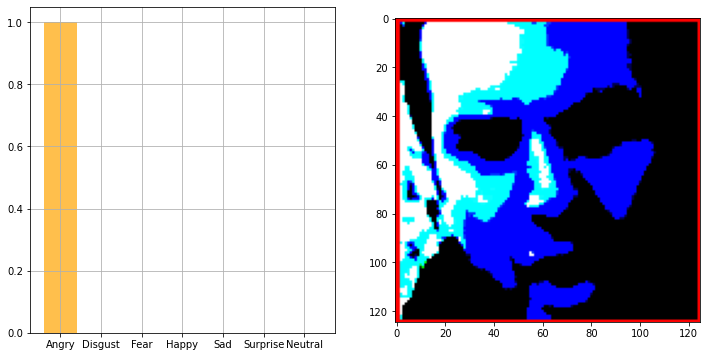

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -6.939003     9.221001    11.32     ]
   ...
   [  36.060997    41.221       41.32     ]
   [  17.060997    22.221       22.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -0.939003    11.221001    18.32     ]
 

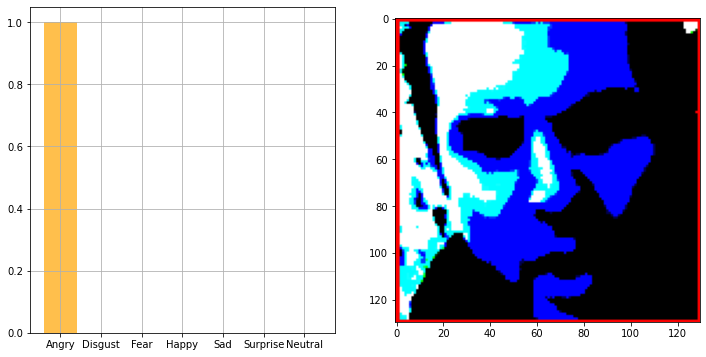

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -7.939003     3.2210007    6.3199997]
   ...
   [  37.060997    41.221       43.32     ]
   [  23.060997    27.221       29.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   4.060997    16.221       23.32     ]
 

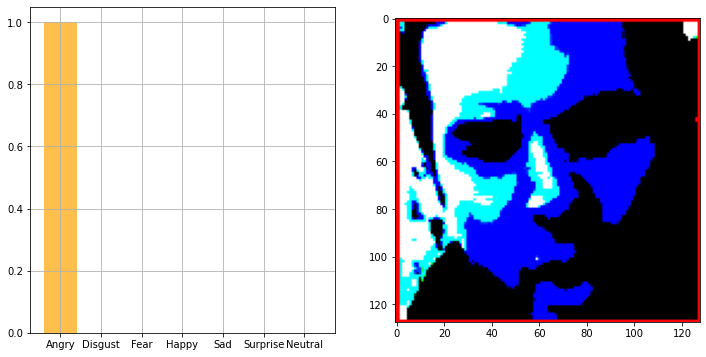

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -14.939003    -8.778999    -4.6800003]
   ...
   [ -11.939003    -2.7789993   -1.6800003]
   [ -14.939003    -5.7789993   -4.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   8.060997    20.221       27.32     ]
 

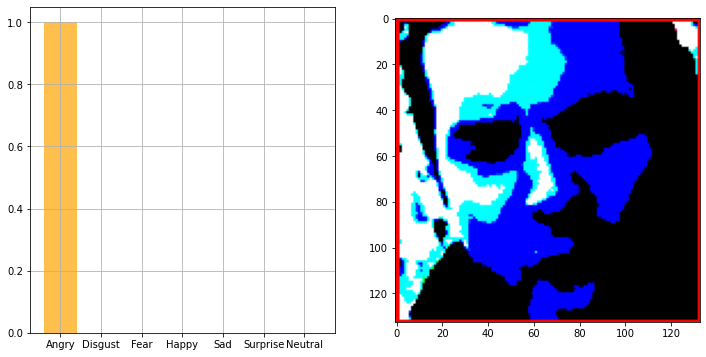

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  11.060997   17.221      21.32    ]
   ...
   [  11.060997   27.221      27.32    ]
   [   9.060997   25.221      25.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  12.060997   24.221      31.32    ]
   ...
   [ -95.939    -108.779    -117.68    ]
   [ -96.939    

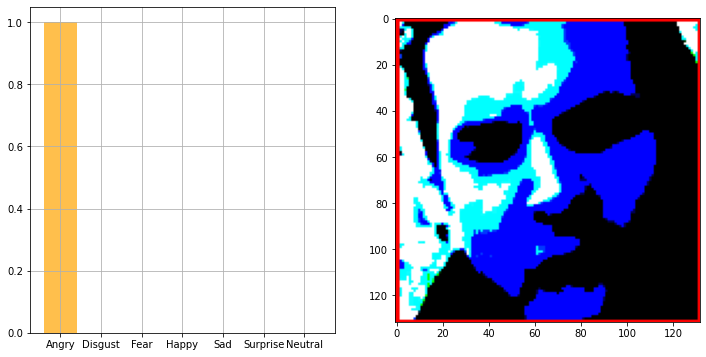

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -11.939003    -2.7789993    0.3199997]
   ...
   [  31.060997    42.221       43.32     ]
   [  17.060997    28.221       29.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  14.060997    28.221       28.32     ]
 

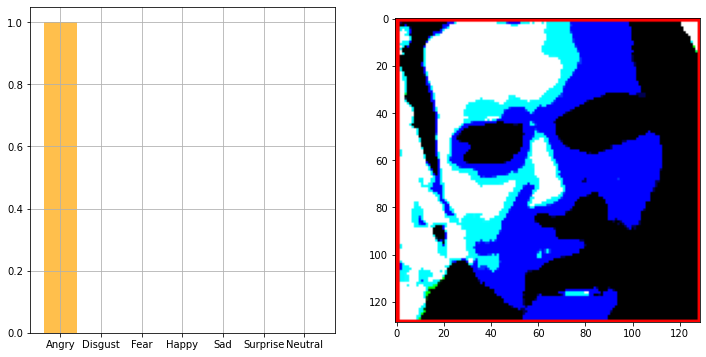

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  10.060997   16.221      20.32    ]
   ...
   [  -2.939003   11.221001   11.32    ]
   [  -2.939003   11.221001   11.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  12.060997   25.221      30.32    ]
   ...
   [ -91.939    -104.779    -113.68    ]
   [ -92.939    

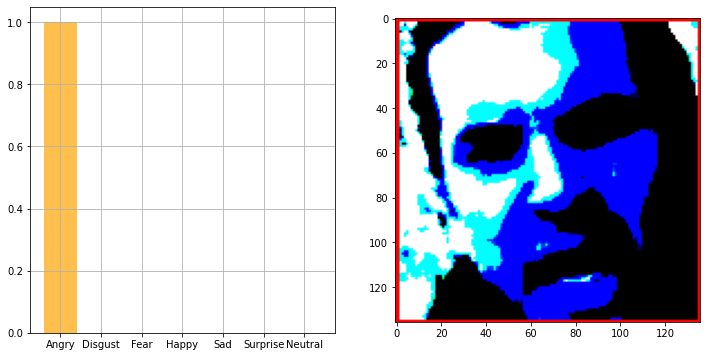

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   5.060997   19.221      21.32    ]
   ...
   [  43.060997   53.221      52.32    ]
   [  39.060997   51.221      50.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  16.060997   30.221      32.32    ]
   ...
   [ -95.939    -104.779    -109.68    ]
   [ -90.939    

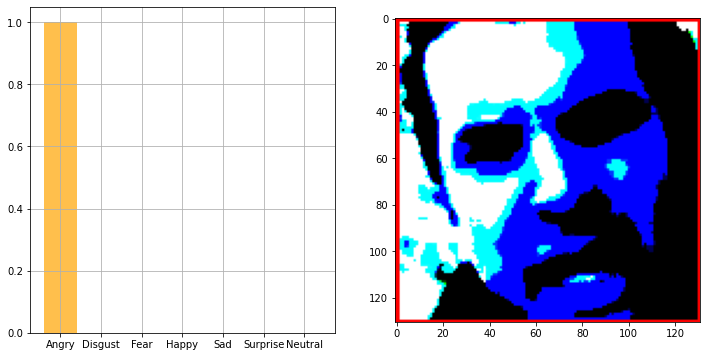

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  10.060997   21.221      24.32    ]
   ...
   [   7.060997   14.221001   14.32    ]
   [  13.060997   22.221      23.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  16.060997   27.221      30.32    ]
   ...
   [ -89.939    -100.779    -105.68    ]
   [ -85.939    

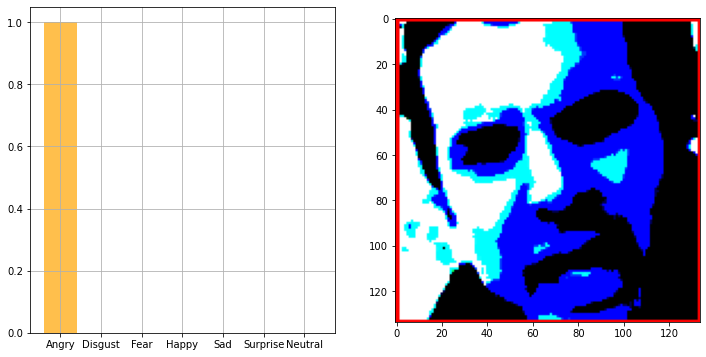

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   7.060997    18.221       21.32     ]
   ...
   [ -10.939003    -3.7789993   -3.6800003]
   [   3.060997    10.221001    10.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  53.060997    65.221       77.32     ]
 

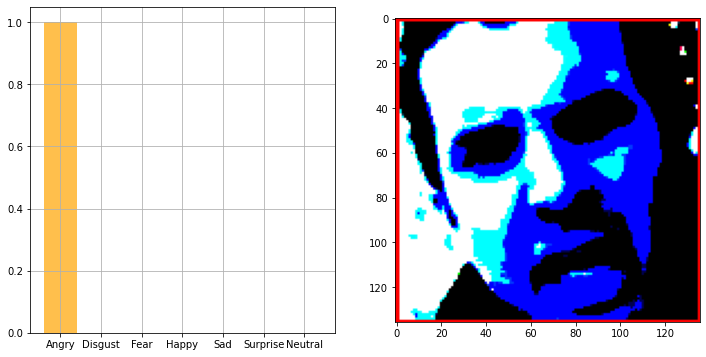

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   2.060997   17.221      22.32    ]
   ...
   [ -20.939003  -15.778999  -15.68    ]
   [ -21.939003  -16.779     -16.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  44.060997   56.221      63.32    ]
   ...
   [ -83.939     -92.779     -90.68    ]
   [ -82.939    

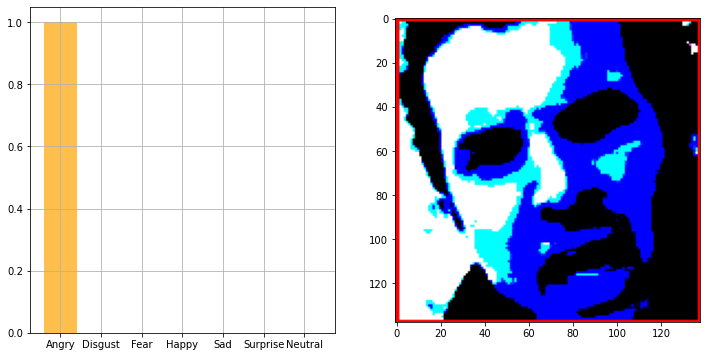

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 2.0609970e+00  1.6221001e+01  2.3320000e+01]
   ...
   [ 1.3060997e+01  2.0221001e+01  2.0320000e+01]
   [ 6.0997009e-02  7.2210007e+00  7.3199997e+00]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  ...

  [[ 1.5106100e+02 -1.167

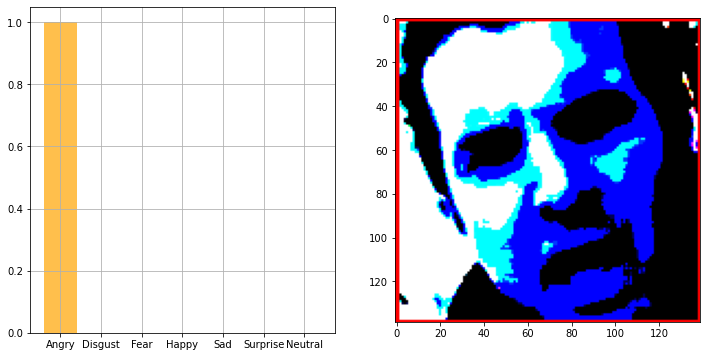

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -6.939003     6.2210007   11.32     ]
   ...
   [ -28.939003   -21.779      -21.68     ]
   [ -27.939003   -20.779      -20.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  15.060997    19.221       23.32     ]
 

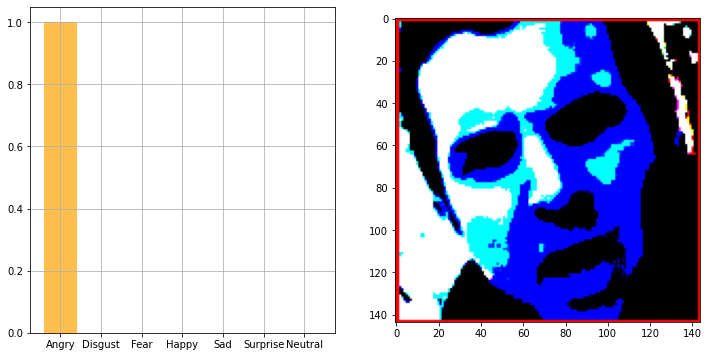

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -10.939003     5.2210007    7.3199997]
   ...
   [  64.061       71.221       71.32     ]
   [  51.060997    58.221       58.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  30.060997    32.221       36.32     ]
 

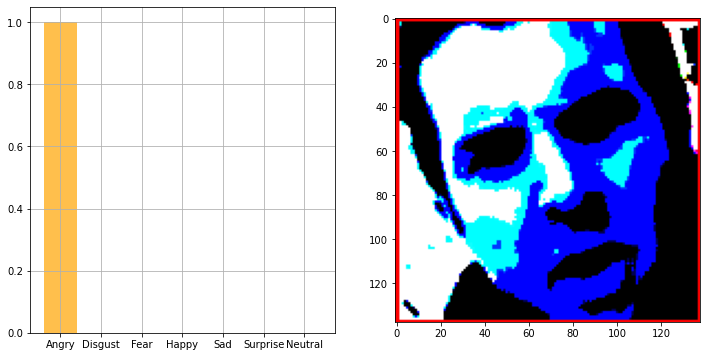

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -57.939003  -43.779     -41.68    ]
   ...
   [ 120.061     125.221     120.32    ]
   [ 116.061     121.221     116.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -21.939003  -19.779     -10.68    ]
   ...
   [ -88.939     -97.779     -88.68    ]
   [ -92.939    

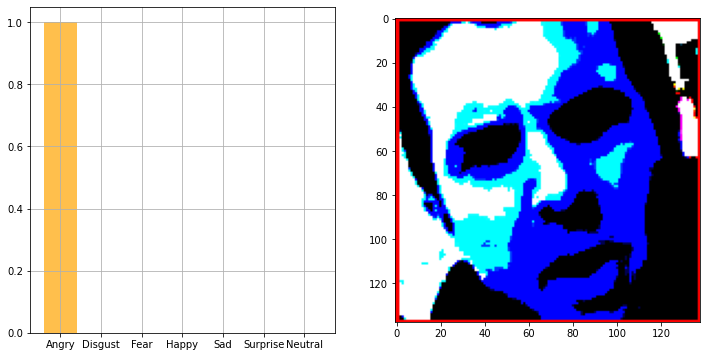

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -39.939003  -25.779     -23.68    ]
   ...
   [ 132.061     135.22101   128.32    ]
   [ 131.061     134.22101   127.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  26.060997   32.221      34.32    ]
   ...
   [ -94.939    -104.779     -98.68    ]
   [ -95.939    

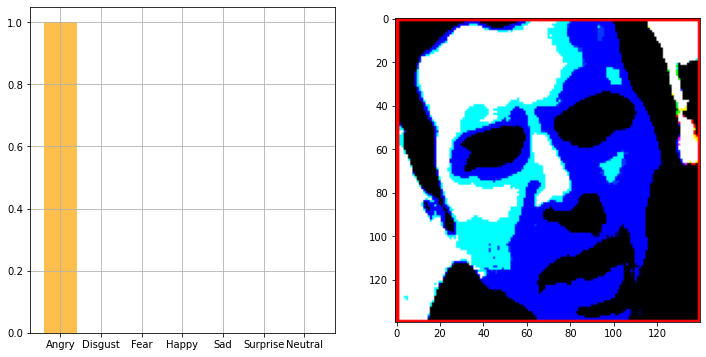

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -71.939     -60.779     -57.68    ]
   ...
   [ 132.061     135.22101   128.32    ]
   [ 132.061     135.22101   128.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  14.060997   23.221      31.32    ]
   ...
   [ -95.939    -105.779     -99.68    ]
   [ -97.939    

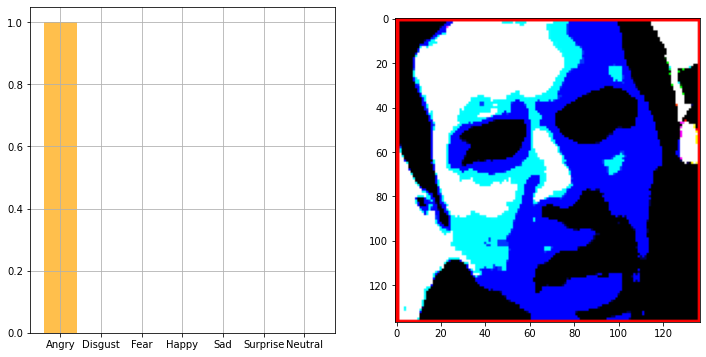

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -63.939003  -52.779     -49.68    ]
   ...
   [ 134.061     135.22101   128.32    ]
   [ 133.061     134.22101   127.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   4.060997   17.221      22.32    ]
   ...
   [ -98.939    -109.779    -109.68    ]
   [ -99.939    

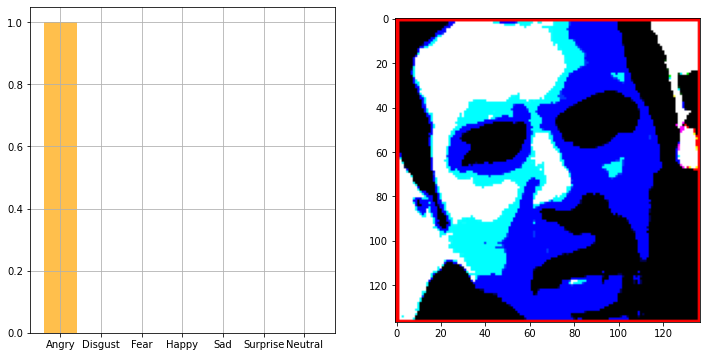

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -64.939     -60.779     -56.68    ]
   ...
   [ 130.061     133.22101   126.32    ]
   [ 127.061     133.22101   125.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   3.060997   13.221001   19.32    ]
   ...
   [-100.939    -108.779    -109.68    ]
   [ -96.939    

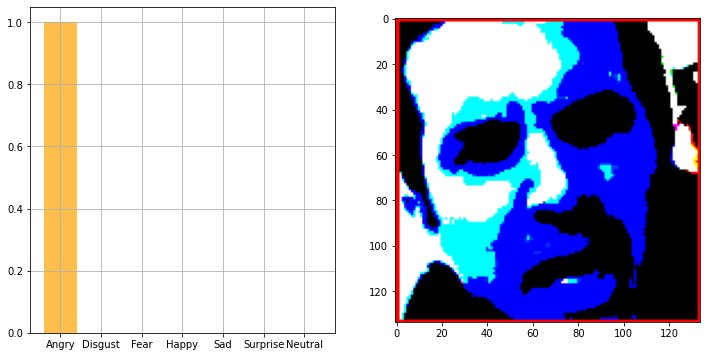

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -64.779     -60.68    ]
   ...
   [ 120.061     125.221     120.32    ]
   [ 117.061     122.221     117.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -23.939003  -14.778999  -11.68    ]
   ...
   [ -97.939    -107.779    -109.68    ]
   [ -95.939    

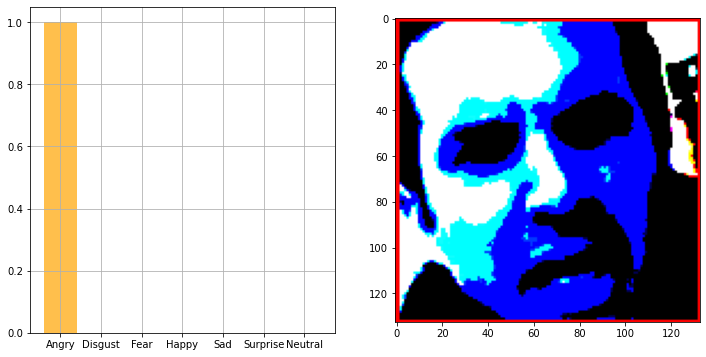

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ -68.939       -64.779       -60.68      ]
   ...
   [  96.061       103.221       103.32      ]
   [  90.061        97.221        97.32      ]
   [ 151.061      -116.779      -123.68      ]]

  ...

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      

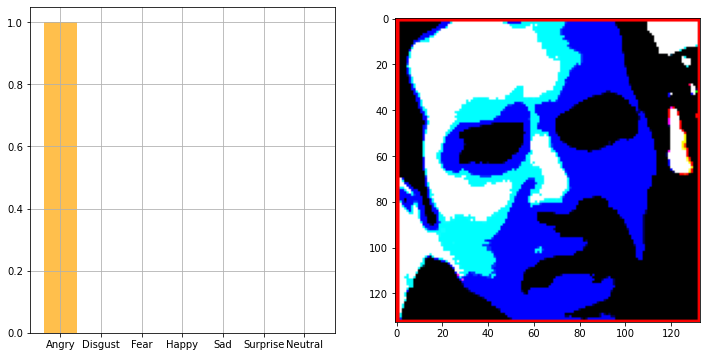

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -69.939     -65.779     -61.68    ]
   ...
   [  44.060997   55.221      56.32    ]
   [  42.060997   53.221      54.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  16.060997   25.221      28.32    ]
   ...
   [-100.939    -107.779    -110.68    ]
   [ -97.939    

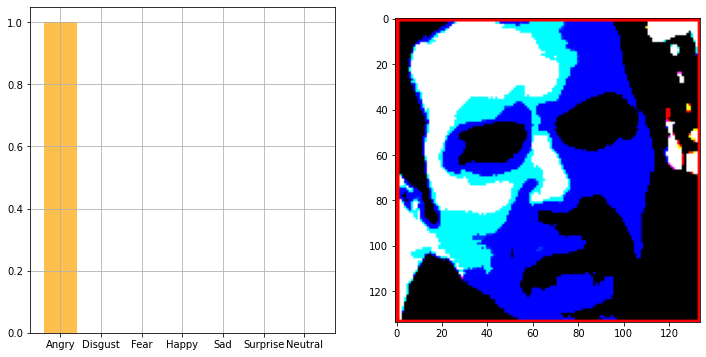

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -67.939     -61.779     -57.68    ]
   ...
   [  11.060997   20.221      21.32    ]
   [  19.060997   28.221      29.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  33.060997   42.221      45.32    ]
   ...
   [ -99.939    -110.779    -110.68    ]
   [ -97.939    

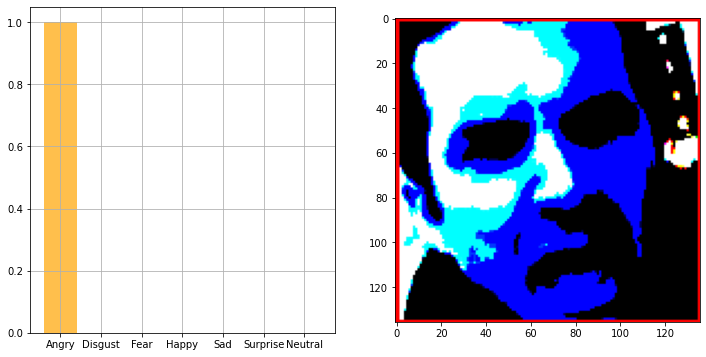

[[1. 0. 0. 0. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  19.060997   24.221      19.32    ]
   ...
   [ -24.939003   -8.778999   20.32    ]
   [  -5.939003   13.221001   45.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  70.061      79.221      74.32    ]
   ...
   [ -69.939     -78.779     -83.68    ]
   [ -69.939     -80.

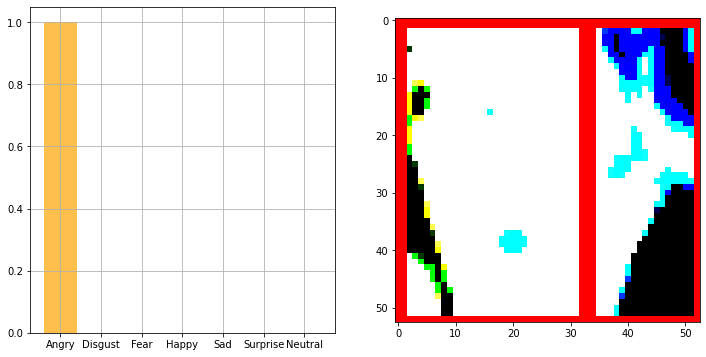

[[0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00 0.0000000e+00
  2.0520093e-21 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -69.939     -65.779     -61.68    ]
   ...
   [  16.060997   20.221      22.32    ]
   [  15.060997   19.221      21.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -31.939003  -25.779  

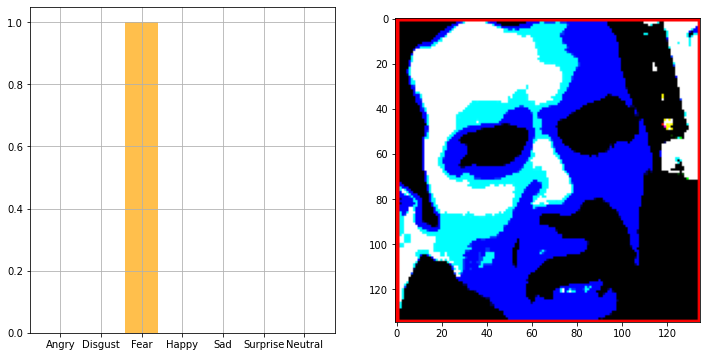

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -73.779     -66.68    ]
   ...
   [ -12.939003   -9.778999   -9.68    ]
   [ -13.939003   -9.778999  -12.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -74.939     -70.779     -73.68    ]
   ...
   [-100.939    -112.779    -114.68    ]
   [ -91.939    

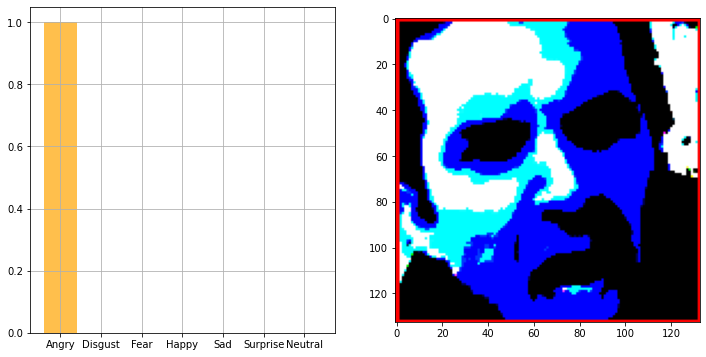

[[1. 0. 0. 0. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   1.060997     7.2210007    4.3199997]
   ...
   [ -53.939003   -45.779      -21.68     ]
   [ -21.939003   -13.778999    10.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  53.060997    60.221       55.32     ]
   ...

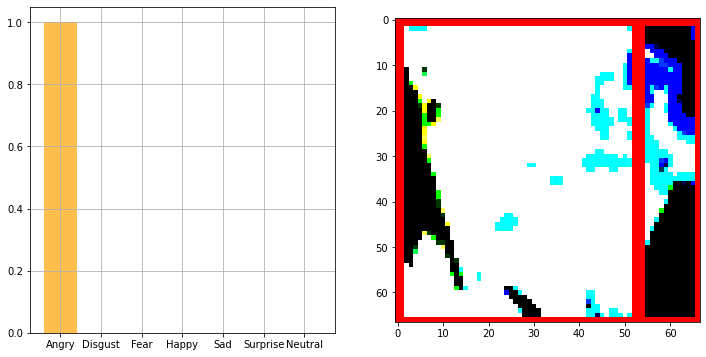

[[0. 0. 0. 0. 0. 1. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -74.939      -69.779      -62.68     ]
   ...
   [  11.060997    15.221001     4.3199997]
   [  11.060997    15.221001     4.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -73.939      -71.779      -75.68     ]
 

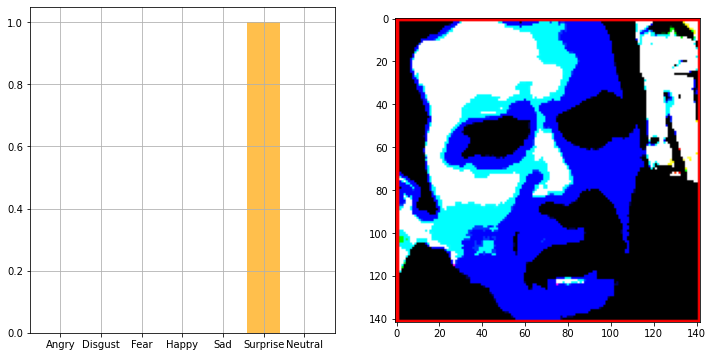

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -76.939      -73.779      -66.68     ]
   ...
   [  -5.939003    -3.7789993  -14.68     ]
   [  -8.939003    -4.7789993  -13.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -63.939003   -68.779      -76.68     ]
 

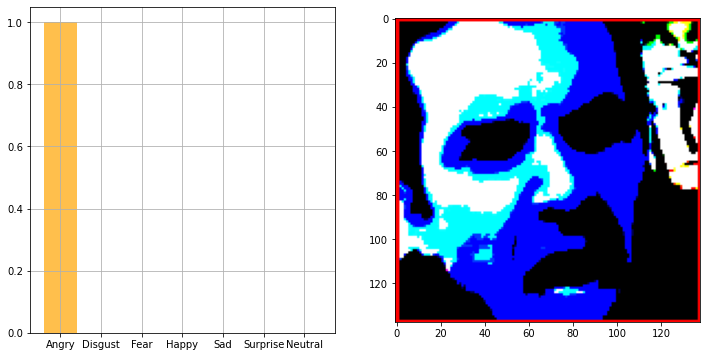

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -73.779     -66.68    ]
   ...
   [ -13.939003  -11.778999  -22.68    ]
   [ -13.939003  -11.778999  -22.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -63.939003  -73.779     -82.68    ]
   ...
   [ -87.939    -102.779    -104.68    ]
   [ -87.939    

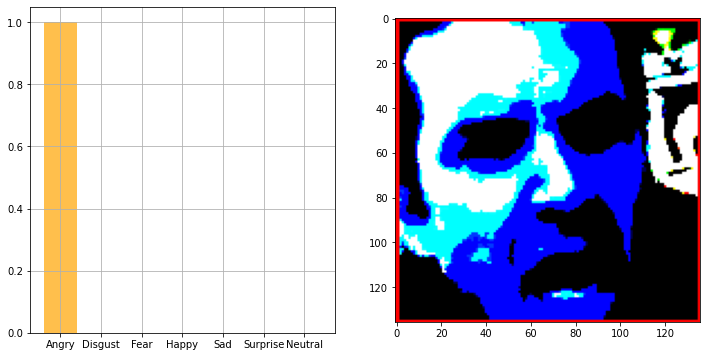

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -59.779     -56.68    ]
   ...
   [ -23.939003  -18.779     -32.68    ]
   [ -22.939003  -17.779     -31.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -64.939     -72.779     -81.68    ]
   ...
   [ -87.939    -100.779    -107.68    ]
   [ -88.939    

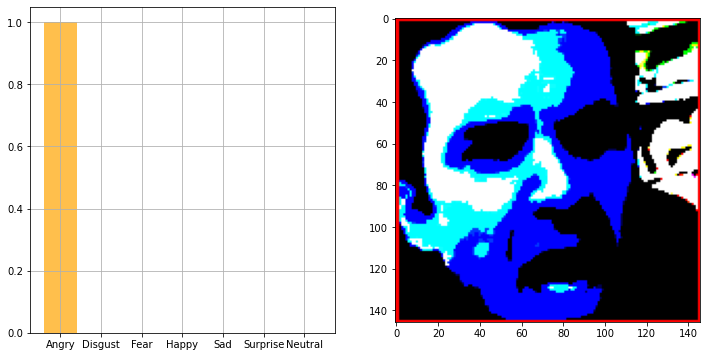

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -79.939      -73.779      -69.68     ]
   ...
   [  -6.939003     1.2210007  -13.68     ]
   [ -13.939003    -5.7789993  -20.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -67.939      -77.779      -86.68     ]
 

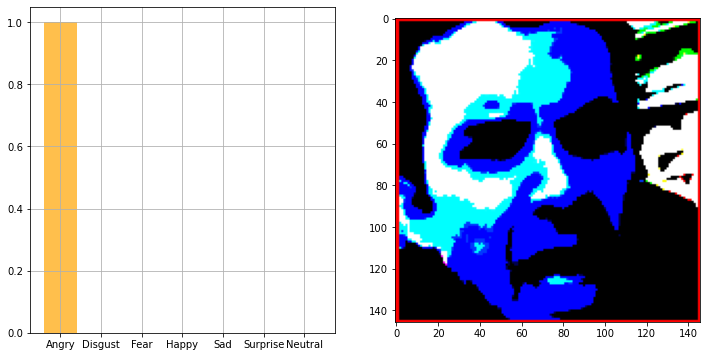

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -84.939     -81.779     -69.68    ]
   ...
   [ -27.939003  -22.779     -36.68    ]
   [ -27.939003  -22.779     -36.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -75.939     -85.779     -92.68    ]
   ...
   [ -90.939    -103.779    -110.68    ]
   [ -90.939    

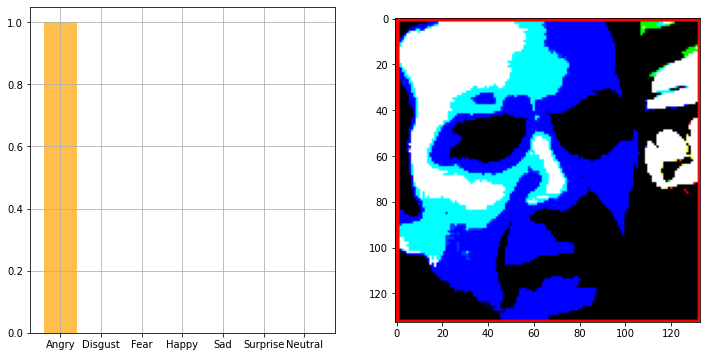

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ -71.939       -67.779       -63.68      ]
   ...
   [  -9.939003      0.22100067   -0.6800003 ]
   [  -6.939003      1.2210007    -1.6800003 ]
   [ 151.061      -116.779      -123.68      ]]

  ...

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      

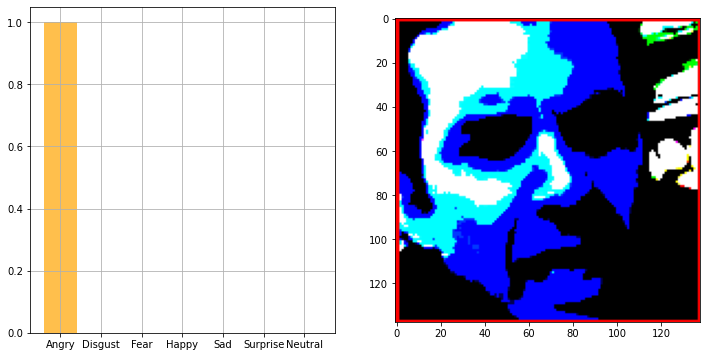

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -73.779     -66.68    ]
   ...
   [  37.060997   51.221      53.32    ]
   [  34.060997   48.221      50.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -66.939     -77.779     -82.68    ]
   ...
   [ -94.939    -108.779    -113.68    ]
   [ -94.939    

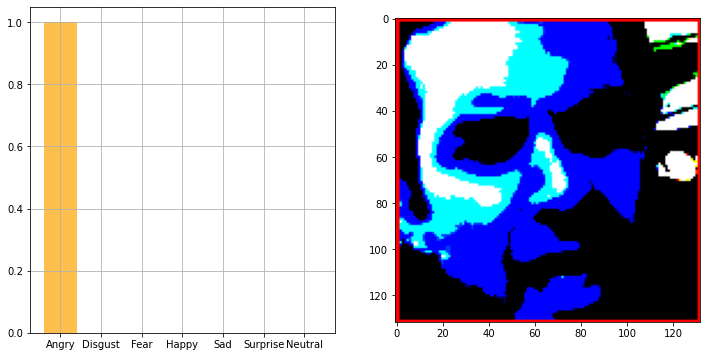

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -83.939      -75.779      -78.68     ]
   ...
   [  17.060997    36.221       42.32     ]
   [  16.060997    35.221       41.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   3.060997     7.2210007   11.32     ]
 

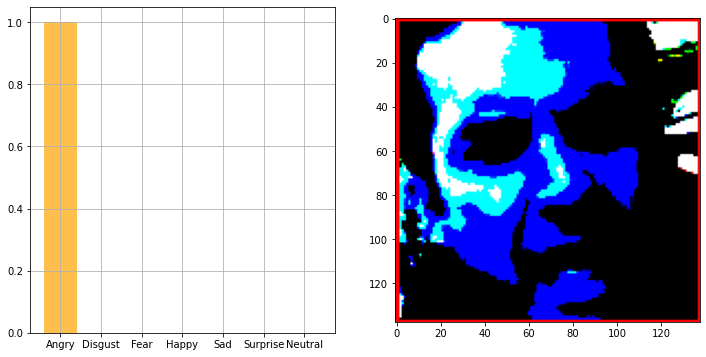

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -53.939003  -47.779     -45.68    ]
   ...
   [  28.060997   49.221      50.32    ]
   [  27.060997   50.221      51.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  -1.939003   15.221001   13.32    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-101.939    

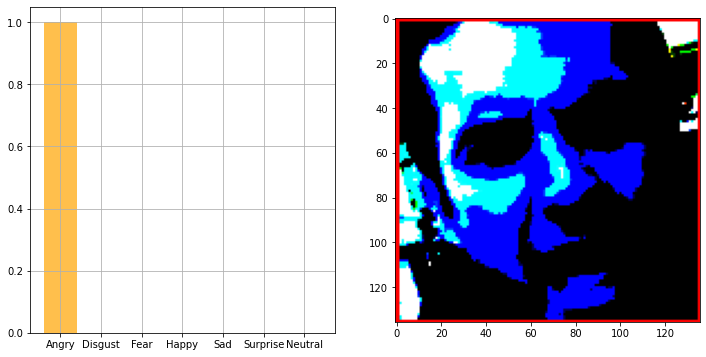

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -42.939003  -30.779     -31.68    ]
   ...
   [  12.060997   31.221      29.32    ]
   [  14.060997   33.221      31.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   9.060997   26.221      24.32    ]
   ...
   [-102.939    -112.779    -108.68    ]
   [-103.939    

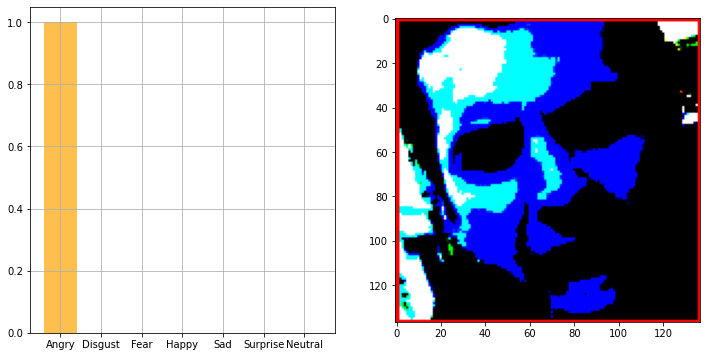

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  29.060997   35.221      32.32    ]
   ...
   [  17.060997   30.221      26.32    ]
   [  17.060997   30.221      26.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  21.060997   34.221      30.32    ]
   ...
   [ -88.939     -98.779     -92.68    ]
   [ -91.939    

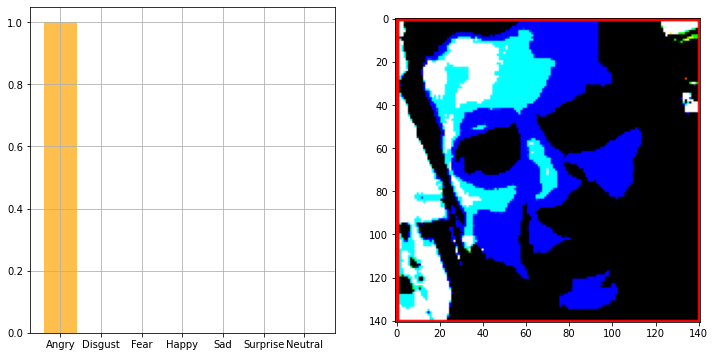

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  34.060997    39.221       39.32     ]
   ...
   [ -17.939003    -6.7789993  -16.68     ]
   [ -14.939003    -3.7789993  -13.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  15.060997    26.221       27.32     ]
 

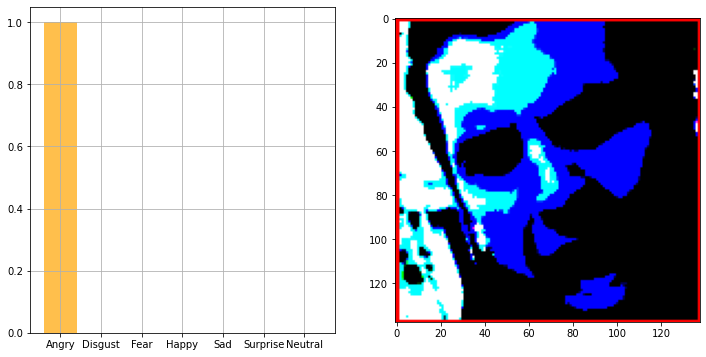

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  35.060997   42.221      42.32    ]
   ...
   [ -32.939003  -23.779     -33.68    ]
   [ -31.939003  -22.779     -32.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   7.060997   19.221      26.32    ]
   ...
   [ -93.939     -96.779     -93.68    ]
   [ -89.939    

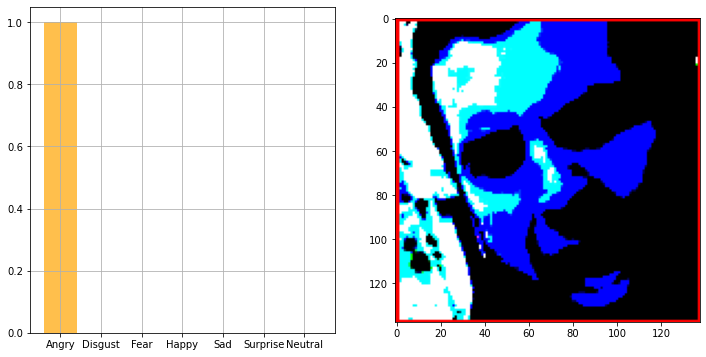

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  21.060997   32.221      35.32    ]
   ...
   [ -19.939003  -18.779     -25.68    ]
   [ -11.939003  -10.778999  -17.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  11.060997   22.221      25.32    ]
   ...
   [ -83.939     -91.779     -85.68    ]
   [ -82.939    

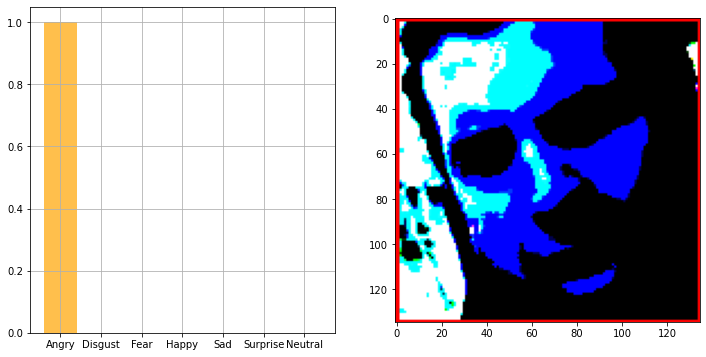

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   6.060997   20.221      22.32    ]
   ...
   [ -36.939003  -32.779     -43.68    ]
   [ -33.939003  -29.779     -40.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   7.060997   20.221      25.32    ]
   ...
   [ -83.939     -90.779     -81.68    ]
   [ -82.939    

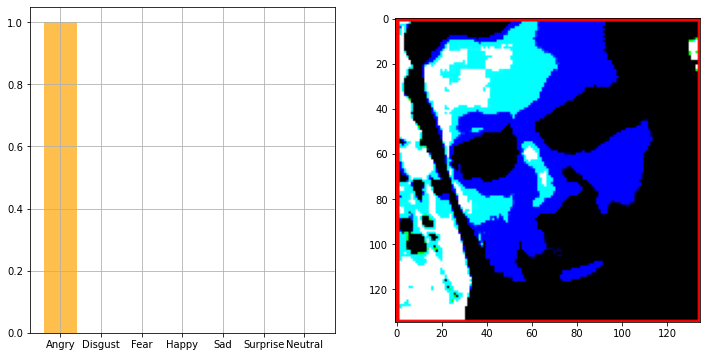

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  -2.939003   14.221001   19.32    ]
   ...
   [ -15.939003  -15.778999  -14.68    ]
   [ -15.939003  -13.778999  -11.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  46.060997   54.221      60.32    ]
   ...
   [ -92.939     -97.779     -87.68    ]
   [ -87.939    

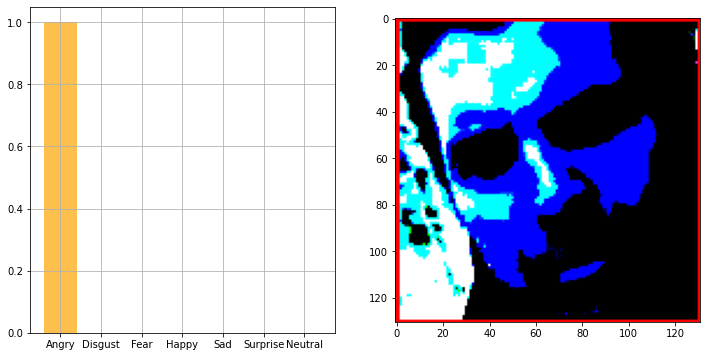

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  12.060997    27.221       32.32     ]
   ...
   [  -0.939003    -1.7789993   -3.6800003]
   [  -4.939003    -1.7789993   -1.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  53.060997    63.221       69.32     ]
 

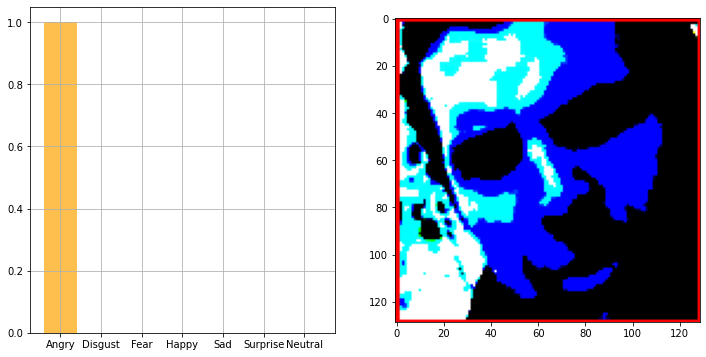

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  19.060997   34.221      39.32    ]
   ...
   [ -22.939003  -15.778999  -15.68    ]
   [ -19.939003  -12.778999  -12.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  91.061      95.221      97.32    ]
   ...
   [ -87.939     -92.779     -82.68    ]
   [ -85.939    

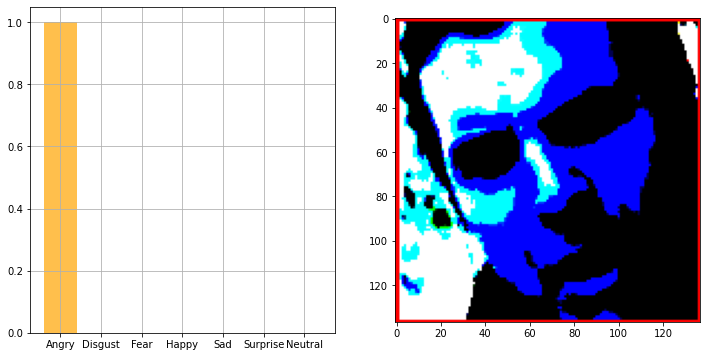

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -19.939003    -5.7789993    6.3199997]
   ...
   [   9.060997    17.221       23.32     ]
   [  -8.939003    -0.7789993    5.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   1.060997     4.2210007    4.3199997]
 

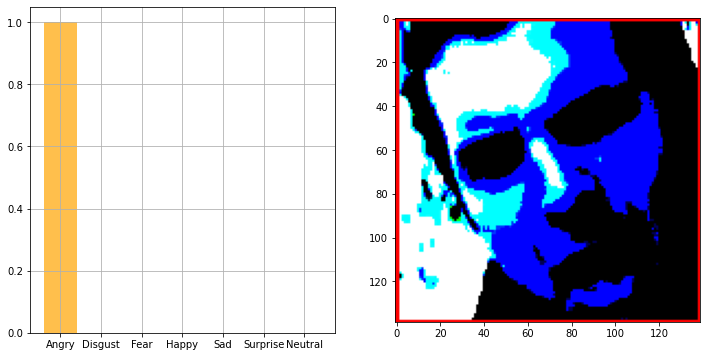

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -19.939003    -1.7789993    7.3199997]
   ...
   [  13.060997    21.221       27.32     ]
   [  -8.939003    -0.7789993    5.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  26.060997    29.221       29.32     ]
 

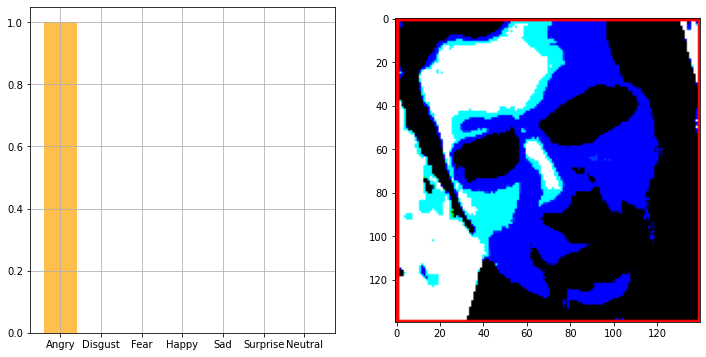

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -43.939003   -28.779      -23.68     ]
   ...
   [  10.060997    18.221       24.32     ]
   [  -8.939003    -0.7789993    5.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   8.060997    12.221001    14.32     ]
 

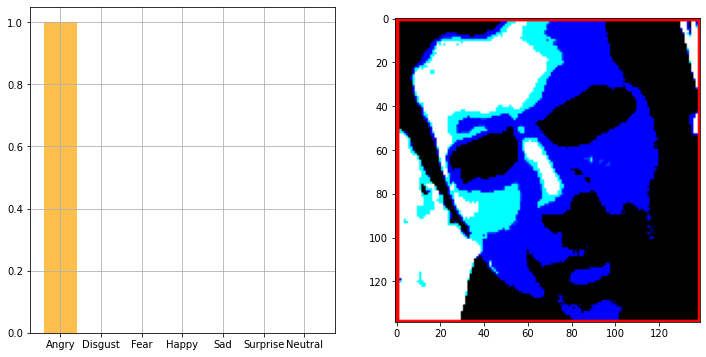

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -52.939003  -42.779     -36.68    ]
   ...
   [   6.060997   12.221001   16.32    ]
   [   4.060997   13.221001   16.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  47.060997   55.221      61.32    ]
   ...
   [ -89.939     -91.779     -83.68    ]
   [ -89.939    

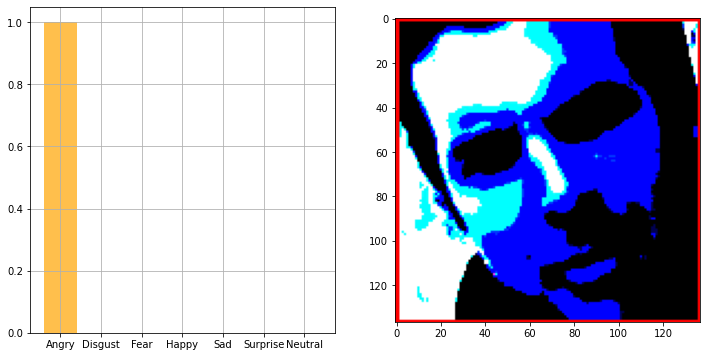

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -43.939003   -32.779      -29.68     ]
   ...
   [ -11.939003     2.2210007    2.3199997]
   [  -7.939003     6.2210007    6.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  52.060997    60.221       71.32     ]
 

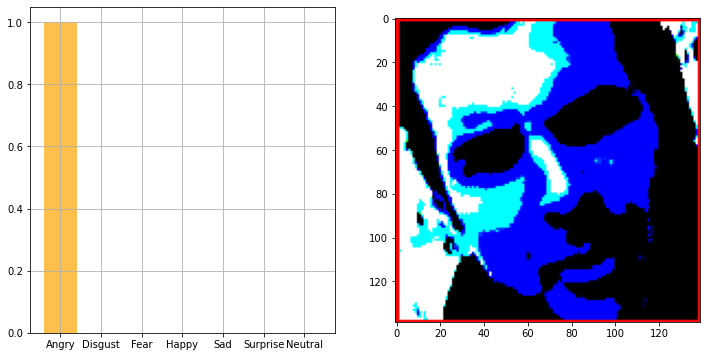

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -48.939003   -42.779      -40.68     ]
   ...
   [ -21.939003    -5.7789993   -5.6800003]
   [ -14.939003    -2.7789993   -3.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  27.060997    41.221       43.32     ]
 

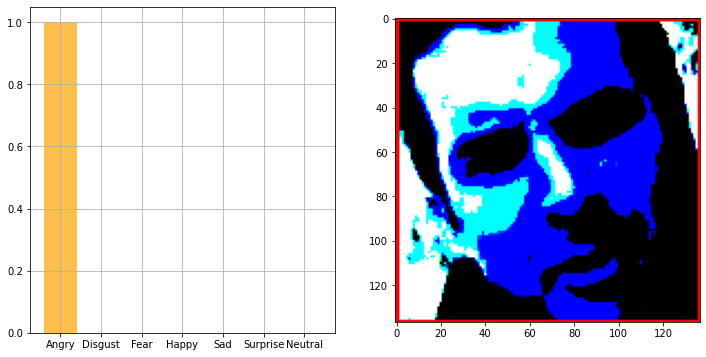

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 2.0396037e-33
  0.0000000e+00 3.3870978e-17]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -55.939003   -46.779      -45.68     ]
   ...
   [ -15.939003    -3.7789993   -9.68     ]
   [   4.060997    16.221       10.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

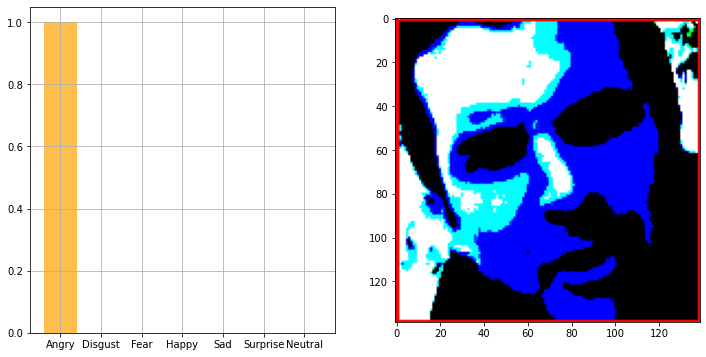

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -67.939     -58.779     -55.68    ]
   ...
   [  13.060997   27.221      21.32    ]
   [   6.060997   19.221      15.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   8.060997   20.221      27.32    ]
   ...
   [-102.939    -109.779    -100.68    ]
   [-103.939    

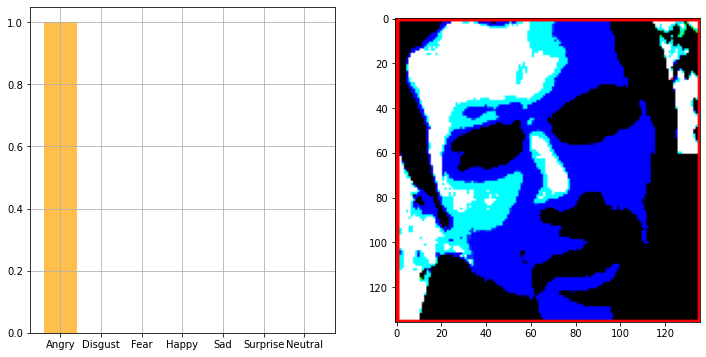

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -67.939      -58.779      -57.68     ]
   ...
   [  -4.939003    13.221001     8.32     ]
   [  -8.939003     9.221001     4.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   9.060997    22.221       27.32     ]
 

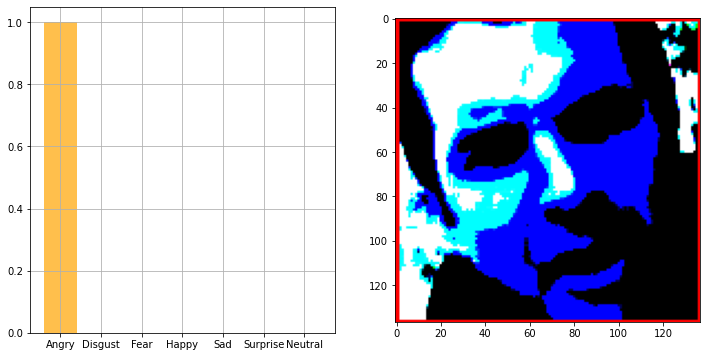

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -54.939003   -45.779      -44.68     ]
   ...
   [ -12.939003    -0.7789993   -6.6800003]
   [  -9.939003     3.2210007   -5.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  24.060997    35.221       38.32     ]
 

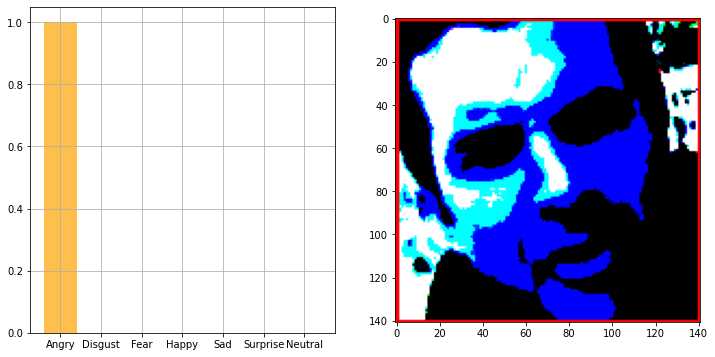

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -52.939003  -43.779     -42.68    ]
   ...
   [ -16.939003   -9.778999  -19.68    ]
   [ -17.939003  -10.778999  -20.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  23.060997   32.221      33.32    ]
   ...
   [-101.939    -109.779    -105.68    ]
   [-100.939    

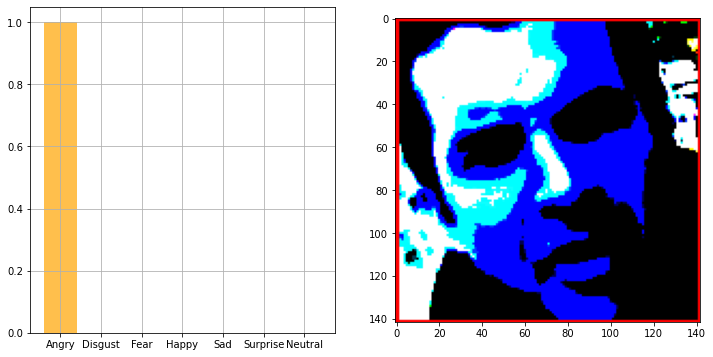

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -61.939003  -52.779     -49.68    ]
   ...
   [ -14.939003  -10.778999  -21.68    ]
   [ -14.939003  -10.778999  -21.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  49.060997   58.221      59.32    ]
   ...
   [ -96.939    -102.779     -98.68    ]
   [ -99.939    

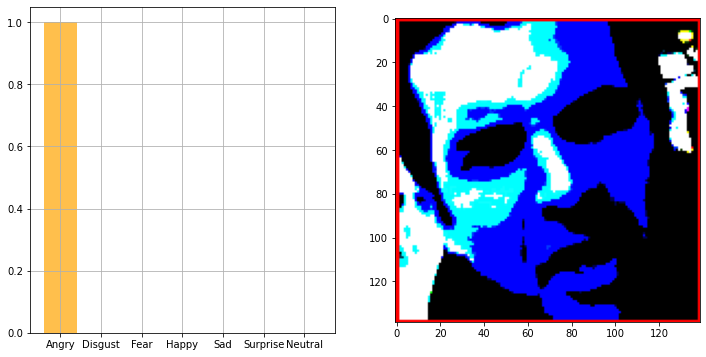

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -66.939     -60.779     -58.68    ]
   ...
   [ -18.939003  -11.778999  -23.68    ]
   [ -17.939003  -13.778999  -24.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  46.060997   58.221      57.32    ]
   ...
   [ -96.939    -102.779     -98.68    ]
   [ -99.939    

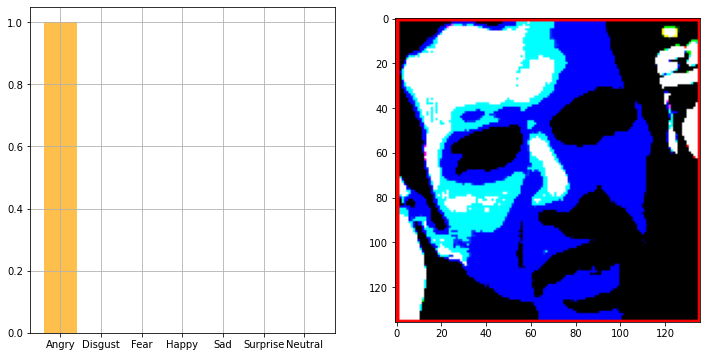

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -62.939003  -54.779     -48.68    ]
   ...
   [ -16.939003  -12.778999  -23.68    ]
   [ -17.939003  -13.778999  -24.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  63.060997   75.221      74.32    ]
   ...
   [ -97.939    -103.779     -99.68    ]
   [ -99.939    

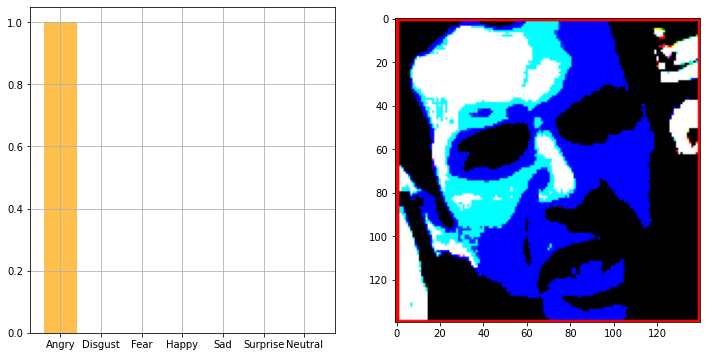

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -57.939003   -52.779      -45.68     ]
   ...
   [ -11.939003    -7.7789993  -18.68     ]
   [ -11.939003    -7.7789993  -18.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  97.061      108.221      104.32     ]
 

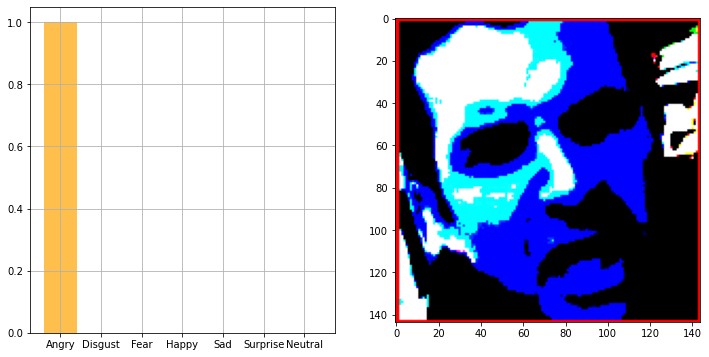

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -58.939003  -52.779     -48.68    ]
   ...
   [ -21.939003  -15.778999  -31.68    ]
   [ -18.939003  -12.778999  -28.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  80.061      89.221      90.32    ]
   ...
   [-101.939    -112.779    -117.68    ]
   [-101.939    

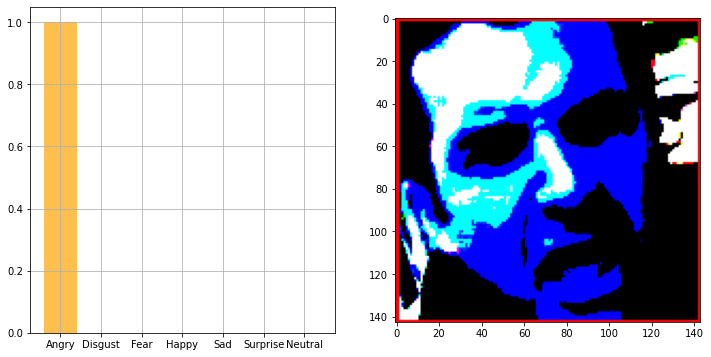

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -74.939     -70.779     -66.68    ]
   ...
   [ -17.939003   -8.778999  -18.68    ]
   [ -17.939003   -8.778999  -18.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  43.060997   46.221      53.32    ]
   ...
   [-101.939    -113.779    -115.68    ]
   [ -98.939    

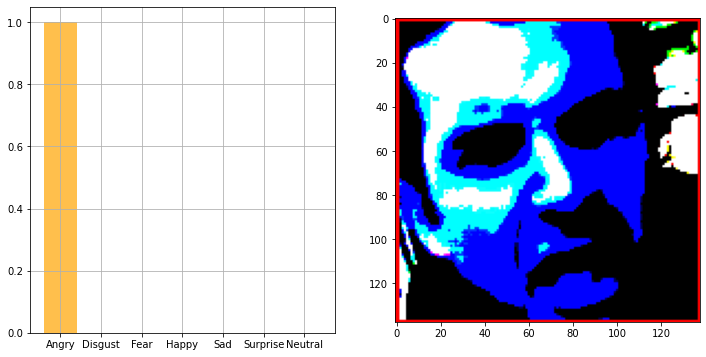

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -56.939003  -49.779     -49.68    ]
   ...
   [  56.060997   68.221      67.32    ]
   [  66.061      77.221      73.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -38.939003  -33.779     -26.68    ]
   ...
   [ -98.939    -109.779    -114.68    ]
   [ -93.939    

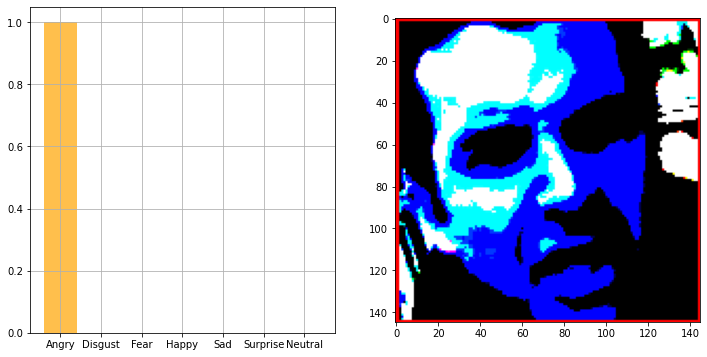

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -75.939     -71.779     -67.68    ]
   ...
   [  72.061      80.221      77.32    ]
   [  78.061      82.221      79.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  15.060997   18.221      18.32    ]
   ...
   [ -94.939    -108.779    -113.68    ]
   [ -93.939    

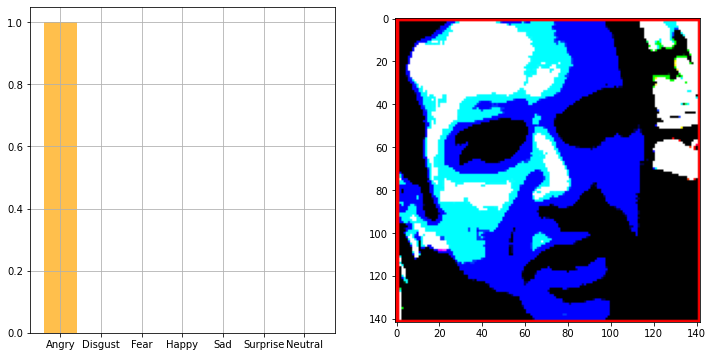

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -72.939     -68.779     -64.68    ]
   ...
   [  79.061      86.221      86.32    ]
   [  79.061      86.221      86.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -16.939003   -8.778999  -11.68    ]
   ...
   [ -94.939    -108.779    -113.68    ]
   [ -94.939    

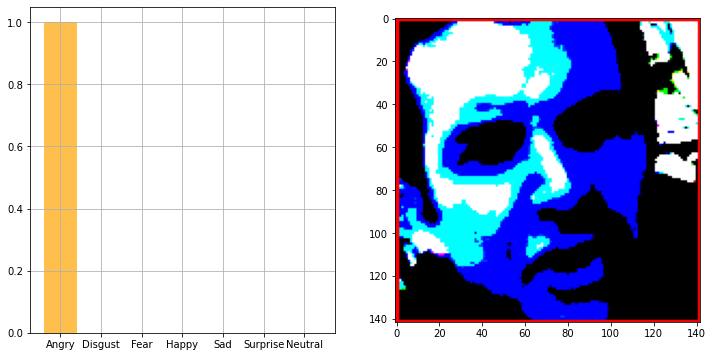

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -72.779     -68.68    ]
   ...
   [  25.060997   37.221      36.32    ]
   [  41.060997   53.221      52.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -48.939003  -41.779     -51.68    ]
   ...
   [-103.939    -116.779    -116.68    ]
   [-102.939    

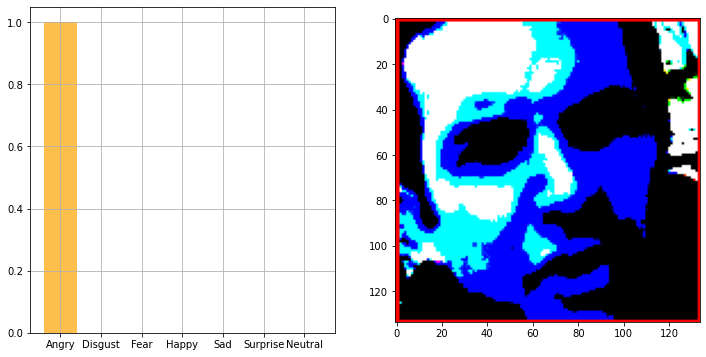

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 3.2438688e-35]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -77.939     -73.779     -69.68    ]
   ...
   [  36.060997   41.221      41.32    ]
   [  12.060997   20.221      17.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -52.939003  -45.779  

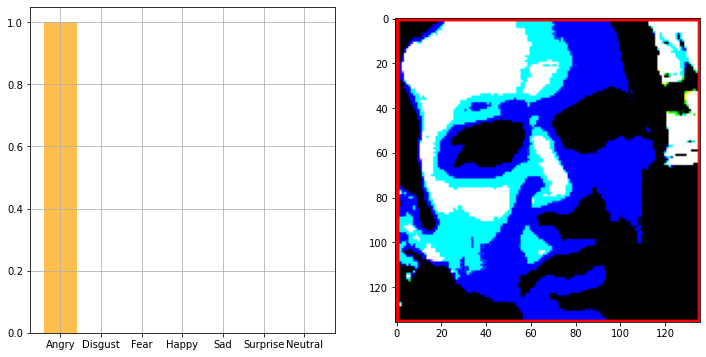

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -74.939      -70.779      -66.68     ]
   ...
   [  77.061       86.221       81.32     ]
   [  78.061       85.221       80.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -2.939003     4.2210007    4.3199997]
 

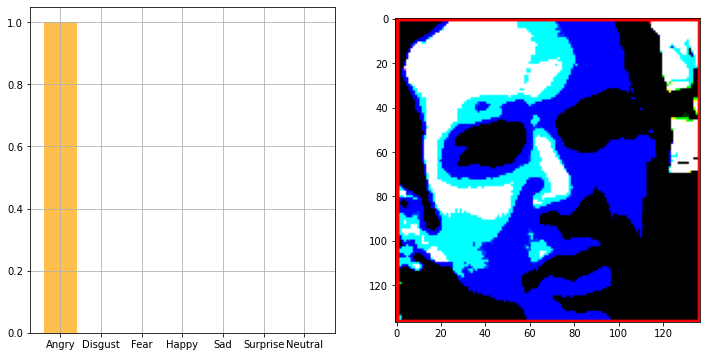

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -78.939      -74.779      -70.68     ]
   ...
   [  55.060997    63.221       60.32     ]
   [  74.061       82.221       79.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   3.060997     8.221001     8.32     ]
 

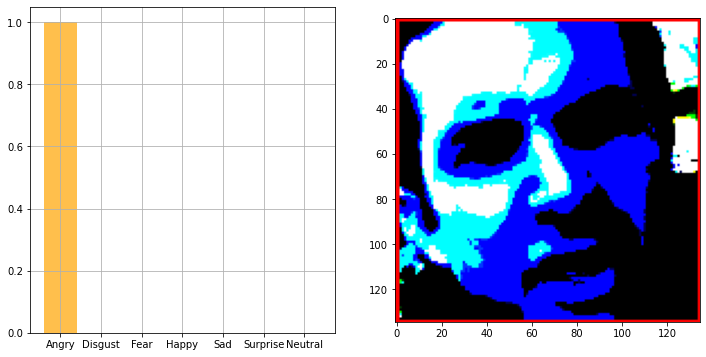

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -75.939      -71.779      -67.68     ]
   ...
   [  82.061       89.221       89.32     ]
   [  78.061       85.221       85.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -15.939003   -11.778999    -2.6800003]
 

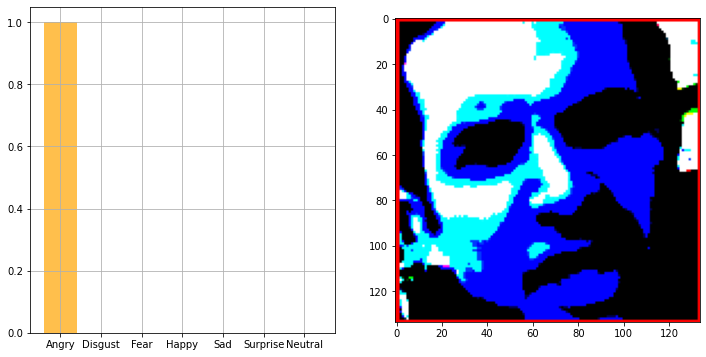

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -49.939003  -43.779     -41.68    ]
   ...
   [  80.061      90.221      89.32    ]
   [  79.061      86.221      86.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -80.939     -72.779     -61.68    ]
   ...
   [-103.939    -116.779    -119.68    ]
   [-103.939    

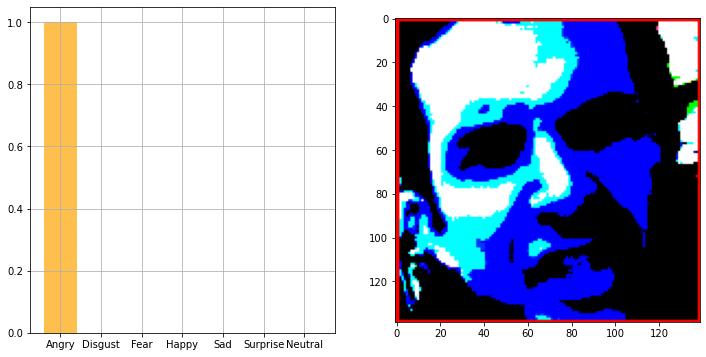

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -63.939003  -59.779     -55.68    ]
   ...
   [  33.060997   49.221      51.32    ]
   [  35.060997   51.221      53.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -45.939003  -33.779     -21.68    ]
   ...
   [-103.939    -116.779    -118.68    ]
   [-103.939    

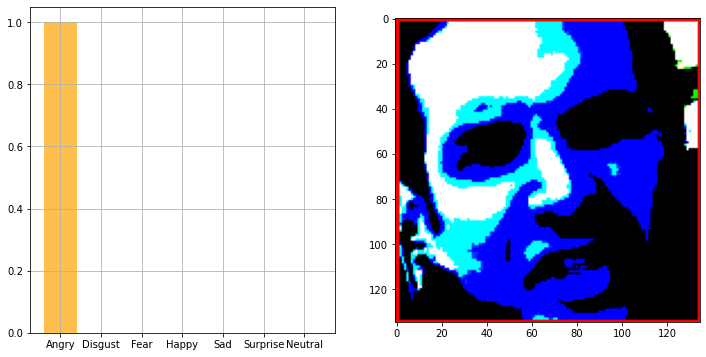

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -12.939003    -5.7789993   -5.6800003]
   ...
   [  37.060997    58.221       59.32     ]
   [  39.060997    57.221       57.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  42.060997    57.221       62.32     ]
 

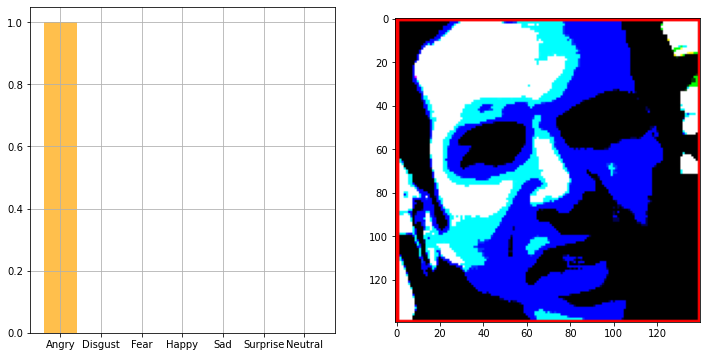

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -5.939003     2.2210007   -5.6800003]
   ...
   [  40.060997    54.221       54.32     ]
   [  42.060997    57.221       55.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  31.060997    37.221       41.32     ]
 

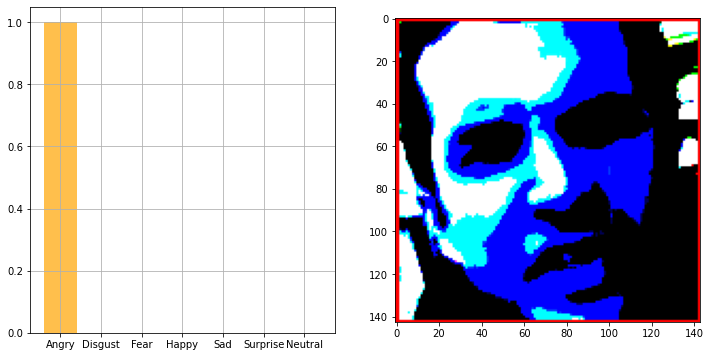

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  21.060997   28.221      28.32    ]
   ...
   [   8.060997   16.221      13.32    ]
   [  17.060997   25.221      22.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  39.060997   48.221      51.32    ]
   ...
   [-103.939    -116.779    -118.68    ]
   [-103.939    

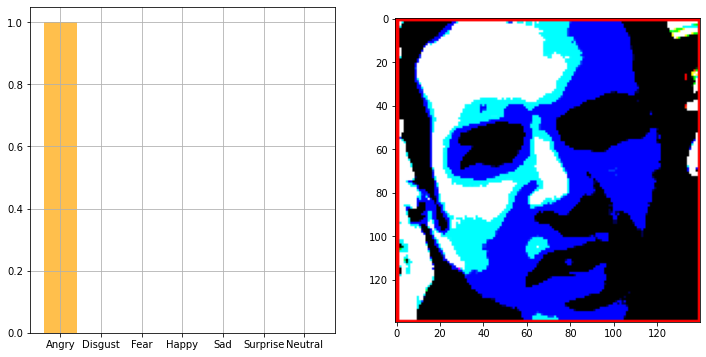

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  69.061      78.221      73.32    ]
   ...
   [  25.060997   43.221      45.32    ]
   [  26.060997   42.221      42.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  33.060997   42.221      45.32    ]
   ...
   [ -98.939    -110.779    -112.68    ]
   [ -97.939    

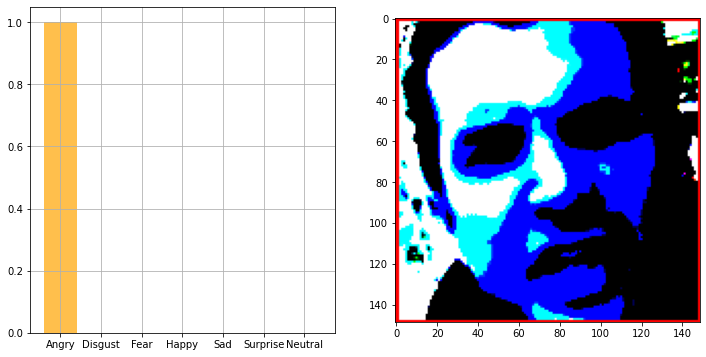

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  46.060997   54.221      51.32    ]
   ...
   [  39.060997   49.221      48.32    ]
   [  38.060997   45.221      45.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  13.060997   24.221      27.32    ]
   ...
   [ -95.939    -102.779    -100.68    ]
   [ -92.939    

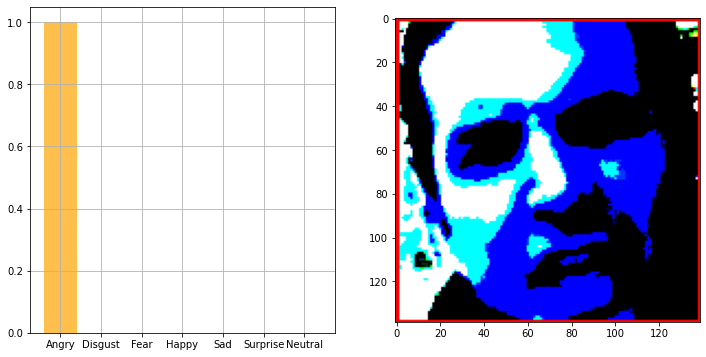

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  38.060997   45.221      45.32    ]
   ...
   [  58.060997   73.221      71.32    ]
   [  59.060997   74.221      72.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  47.060997   53.221      64.32    ]
   ...
   [ -91.939     -97.779     -93.68    ]
   [ -92.939    

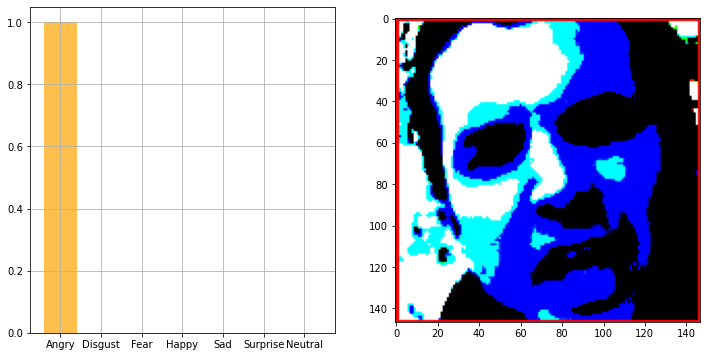

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  29.060997   34.221      34.32    ]
   ...
   [  67.061      79.221      78.32    ]
   [  67.061      79.221      78.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  26.060997   32.221      36.32    ]
   ...
   [ -91.939     -94.779     -91.68    ]
   [ -90.939    

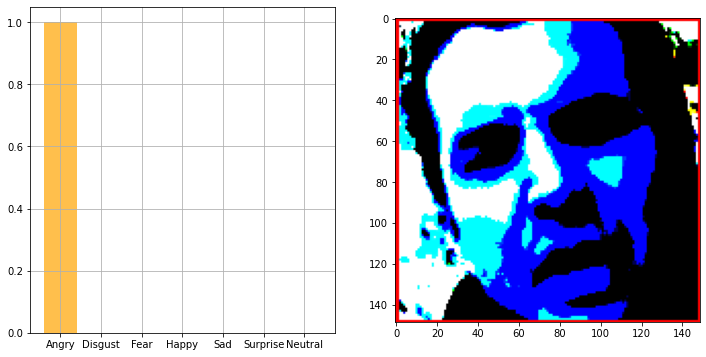

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  43.060997   48.221      48.32    ]
   ...
   [  83.061      89.221      86.32    ]
   [  80.061      86.221      83.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  21.060997   24.221      24.32    ]
   ...
   [ -89.939     -89.779     -80.68    ]
   [ -88.939    

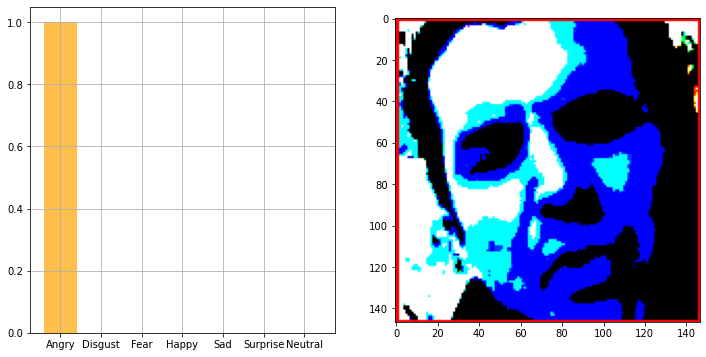

[[0. 0. 0. 0. 0. 0. 1.]]
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  10.060997   26.221      33.32    ]
   ...
   [ -15.939003  -12.778999  -19.68    ]
   [ -18.939003  -12.778999  -20.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  36.060997   60.221      70.32    ]
   ...
   [  28.060997   37.221      45.32    ]
   [  27.060997   39.

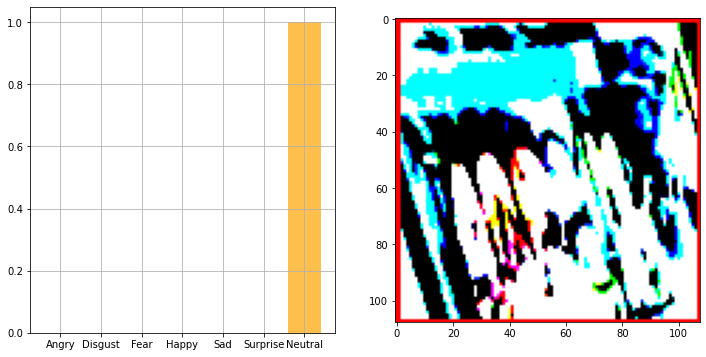

[[0.0000000e+00 0.0000000e+00 2.4198238e-13 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  20.060997   27.221      27.32    ]
   ...
   [ 114.061     119.221     114.32    ]
   [ 113.061     118.221     113.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  26.060997   29.221  

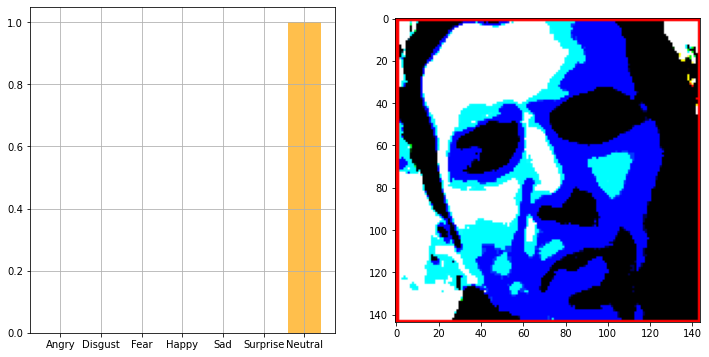

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  69.061      76.221      76.32    ]
   ...
   [ 130.061     136.22101   128.32    ]
   [ 130.061     136.22101   128.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  14.060997   25.221      28.32    ]
   ...
   [ -91.939     -91.779     -82.68    ]
   [ -89.939    

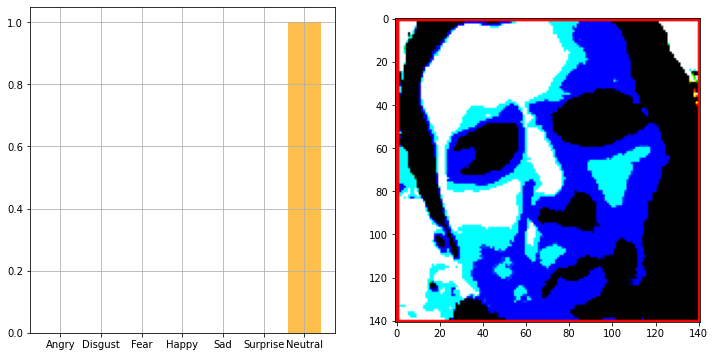

[[0.68510073 0.         0.         0.         0.         0.
  0.31489924]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  87.061      92.221      92.32    ]
   ...
   [ 135.061     137.22101   128.32    ]
   [ 135.061     137.22101   128.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  27.060997   39.221      38.32    ]
   ...
   [ -8

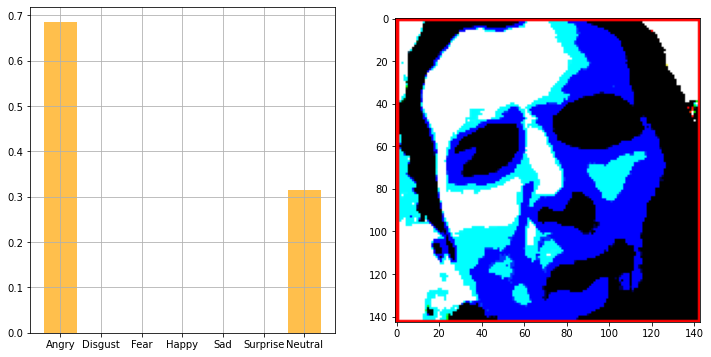

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  83.061      89.221      86.32    ]
   ...
   [ 135.061     137.22101   128.32    ]
   [ 135.061     137.22101   128.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  42.060997   55.221      60.32    ]
   ...
   [ -72.939     -67.779     -60.68    ]
   [ -73.939    

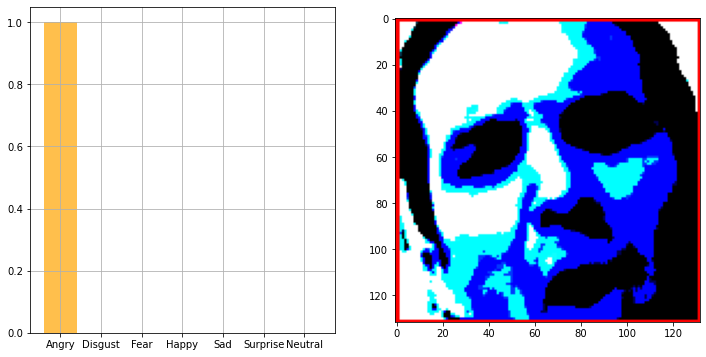

[[0. 0. 1. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 110.061     115.221     110.32    ]
   ...
   [ 134.061     135.22101   128.32    ]
   [ 133.061     134.22101   127.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  40.060997   53.221      58.32    ]
   ...
   [ -83.939     -90.779     -88.68    ]
   [ -94.939    

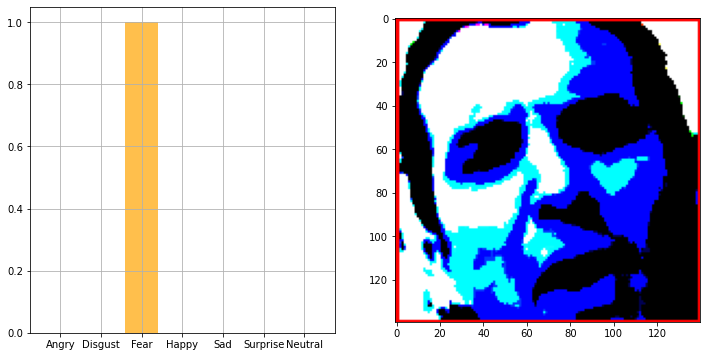

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  91.061      97.221      94.32    ]
   ...
   [ 124.061     130.22101   122.32    ]
   [ 122.061     128.22101   120.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  18.060997   33.221      31.32    ]
   ...
   [ -83.939     -90.779     -88.68    ]
   [ -94.939    

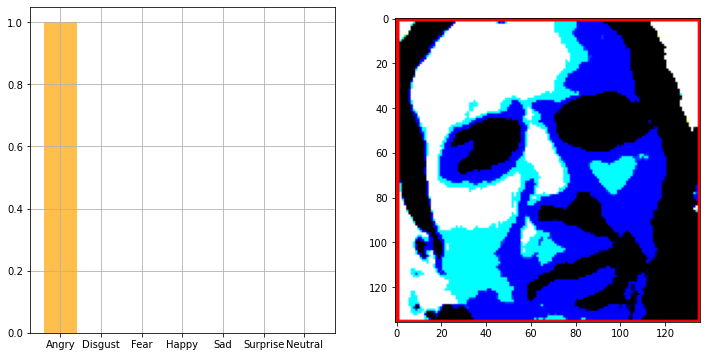

[[5.4054577e-05 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 9.9994600e-01]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -1.939003    12.221001    19.32     ]
   ...
   [ -17.939003   -11.778999   -19.68     ]
   [ -19.939003   -12.778999   -17.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061   

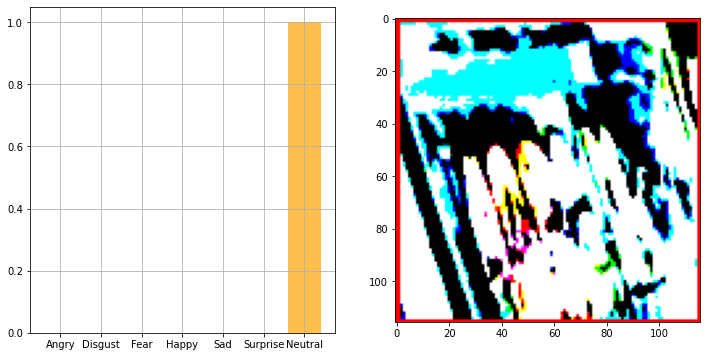

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  73.061      79.221      76.32    ]
   ...
   [ 120.061     123.221     116.32    ]
   [ 120.061     123.221     116.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  -1.939003   17.221      15.32    ]
   ...
   [ -99.939    -107.779    -108.68    ]
   [-103.939    

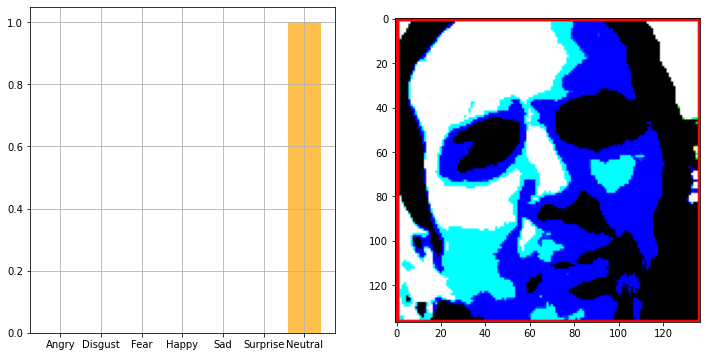

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  95.061     104.221      99.32    ]
   ...
   [ 114.061     119.221     114.32    ]
   [ 113.061     118.221     113.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  -5.939003   12.221001   14.32    ]
   ...
   [-103.939    -116.779    -121.68    ]
   [-101.939    

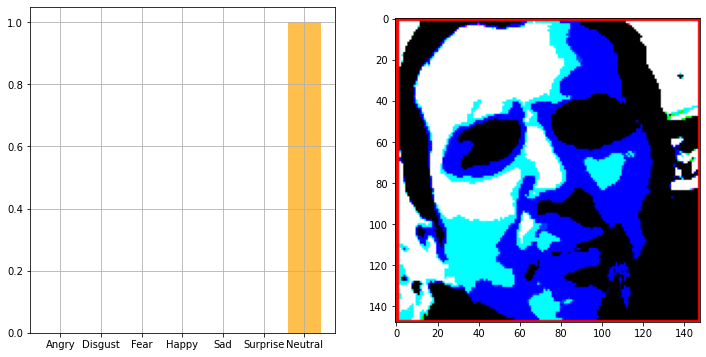

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  40.060997   46.221      43.32    ]
   ...
   [ 100.061     107.221     102.32    ]
   [  99.061     106.221     101.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   5.060997   20.221      25.32    ]
   ...
   [-103.939    -116.779    -120.68    ]
   [-102.939    

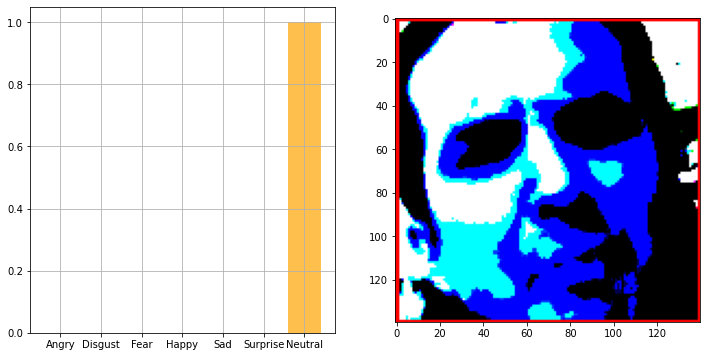

[[0. 0. 0. 0. 0. 0. 1.]]
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -17.939003   41.221     -36.68    ]
   ...
   [  41.060997   62.221      55.32    ]
   [  40.060997   61.221      54.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -29.939003   10.221001  -32.68    ]
   ...
   [  52.060997   72.221      67.32    ]
   [  53.060997   73.

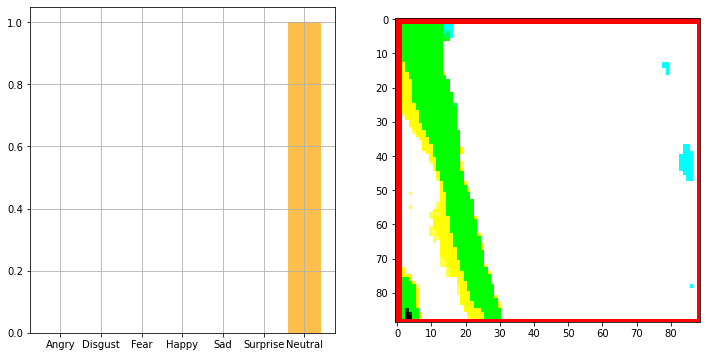

[[0.0000000e+00 0.0000000e+00 2.8172536e-08 0.0000000e+00 0.0000000e+00
  1.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  68.061      76.221      73.32    ]
   ...
   [  74.061      81.221      76.32    ]
   [  75.061      84.221      79.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   1.060997   13.22100

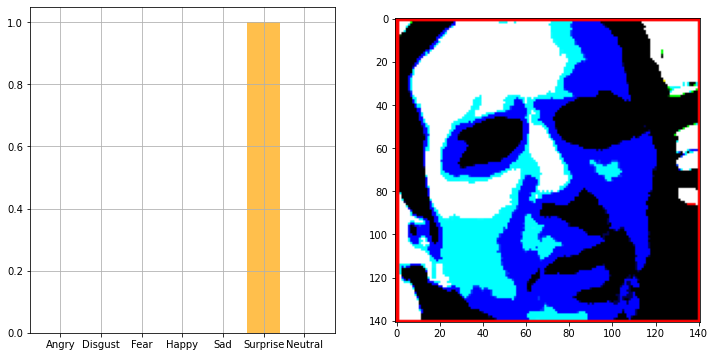

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.5236961e-22]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 104.061     109.221     104.32    ]
   ...
   [  88.061      96.221      93.32    ]
   [  88.061      96.221      93.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  27.060997   41.221  

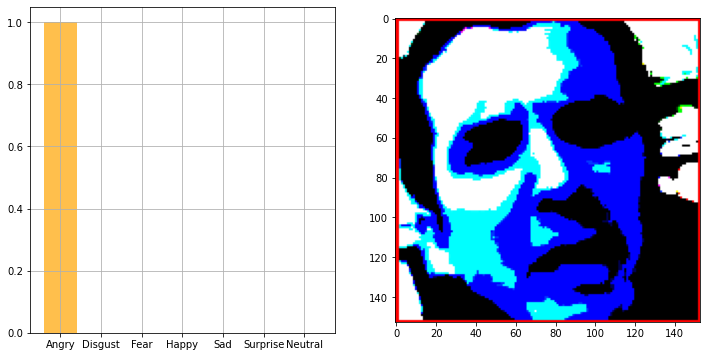

[[1. 0. 0. 0. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -26.939003    34.221      -45.68     ]
   ...
   [  44.060997    65.221       58.32     ]
   [  45.060997    66.221       59.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -33.939003    12.221001   -35.68     ]
   ...

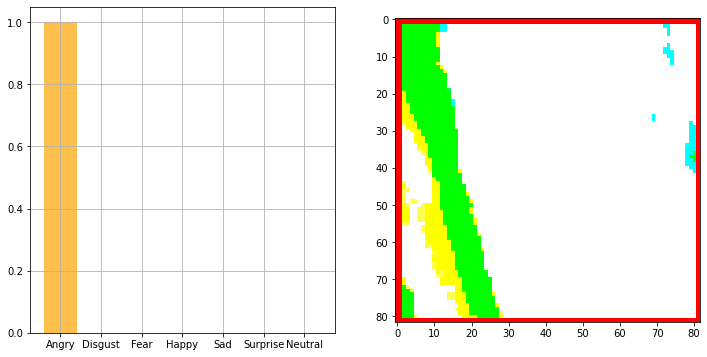

[[3.694804e-36 0.000000e+00 3.406397e-14 0.000000e+00 0.000000e+00
  1.000000e+00 0.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  63.060997   69.221      66.32    ]
   ...
   [  20.060997   30.221      29.32    ]
   [  20.060997   30.221      29.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -54.939003  -52.779     -50.

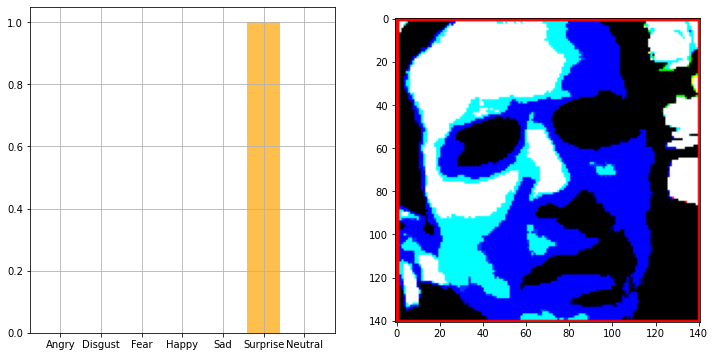

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 5.9743394e-34 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 114.061     123.221     113.32    ]
   ...
   [  71.061      79.221      76.32    ]
   [  75.061      83.221      80.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -34.939003  -30.779  

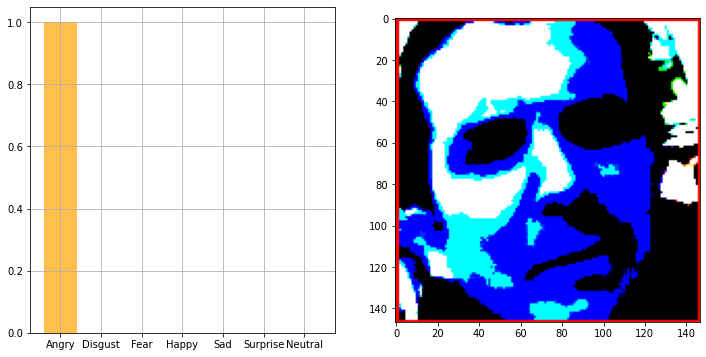

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0203003e-09]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 103.061      108.221      103.32     ]
   ...
   [  31.060997    40.221       35.32     ]
   [  36.060997    45.221       40.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

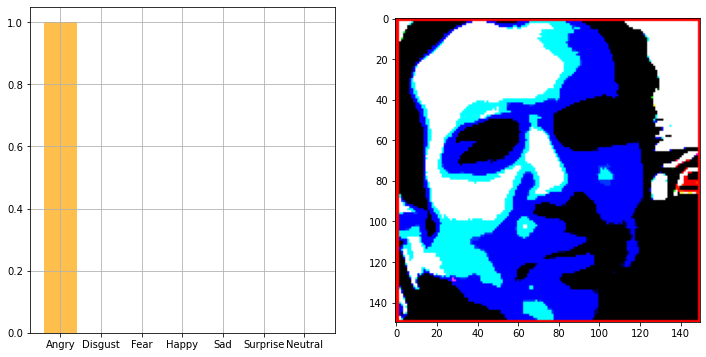

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  71.061      77.221      74.32    ]
   ...
   [  32.060997   41.221      36.32    ]
   [  50.060997   59.221      54.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -51.939003  -47.779     -45.68    ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -95.939    

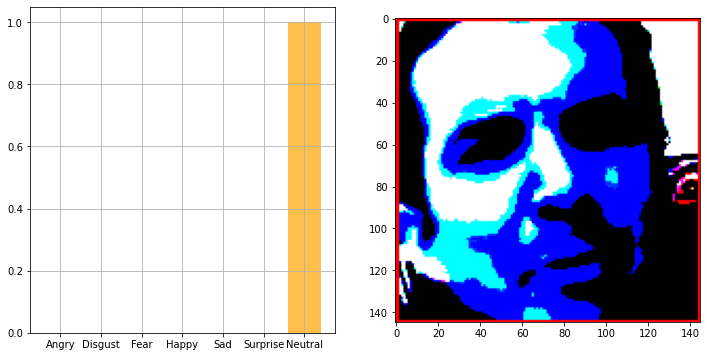

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 117.061     120.221     113.32    ]
   ...
   [  49.060997   58.221      53.32    ]
   [  56.060997   65.221      60.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -51.939003  -49.779     -45.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -86.939    

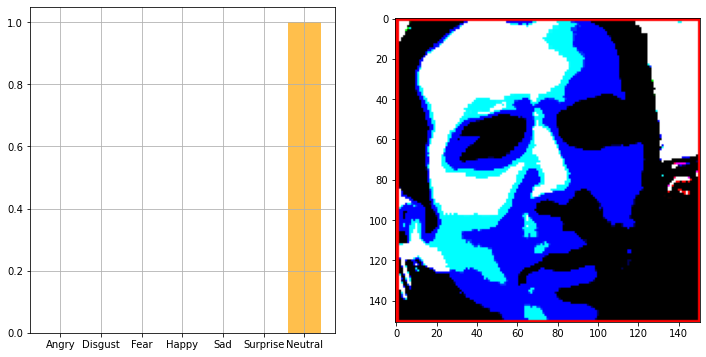

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  95.061     100.221      95.32    ]
   ...
   [  58.060997   67.221      62.32    ]
   [  54.060997   63.221      58.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -53.939003  -50.779     -50.68    ]
   ...
   [ -83.939     -96.779    -103.68    ]
   [ -83.939    

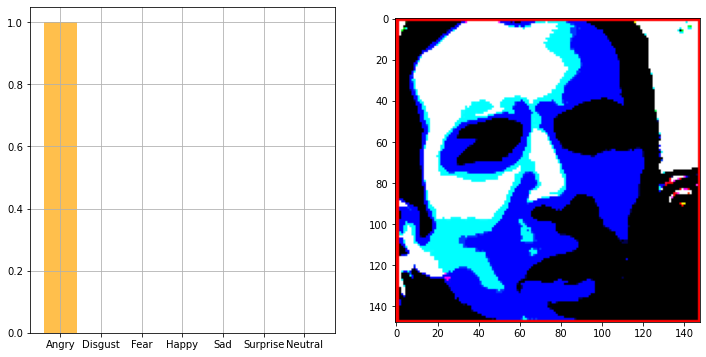

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 120.061     123.221     116.32    ]
   ...
   [  53.060997   60.221      55.32    ]
   [  77.061      84.221      79.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -36.939003  -37.779     -34.68    ]
   ...
   [ -85.939     -98.779    -105.68    ]
   [ -85.939    

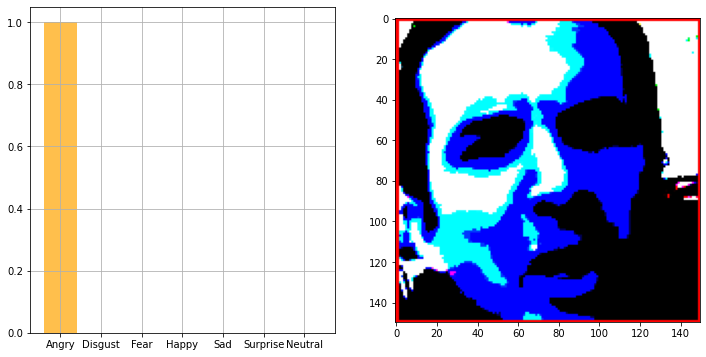

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 124.061      128.22101    119.32     ]
   ...
   [  92.061       97.221       92.32     ]
   [  92.061       97.221       92.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -12.939003   -10.778999    -6.6800003]
 

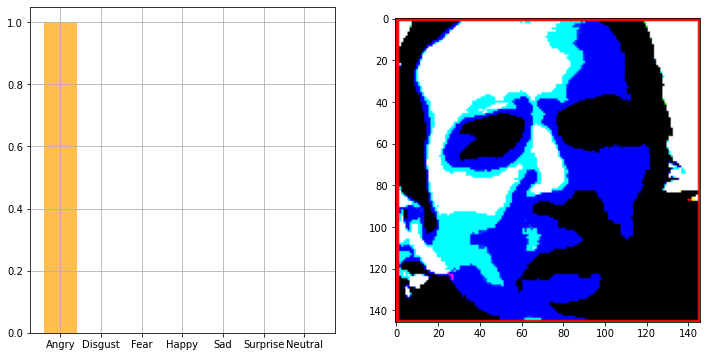

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 125.061      129.22101    120.32     ]
   ...
   [ 108.061      113.221      108.32     ]
   [ 108.061      113.221      108.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -13.939003   -11.778999    -2.6800003]
 

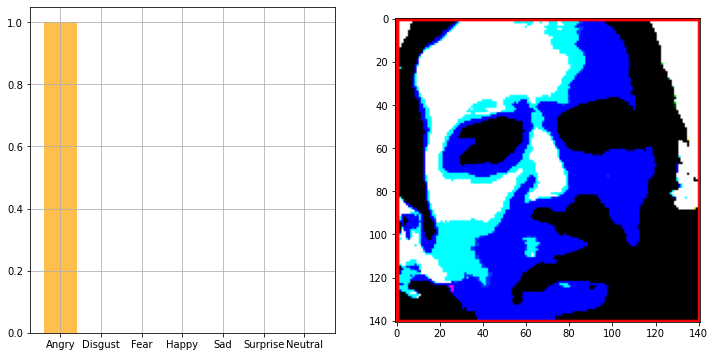

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 117.061     123.221     115.32    ]
   ...
   [ 115.061     120.221     115.32    ]
   [ 115.061     120.221     115.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -39.939003  -33.779     -29.68    ]
   ...
   [ -91.939    -104.779    -111.68    ]
   [ -88.939    

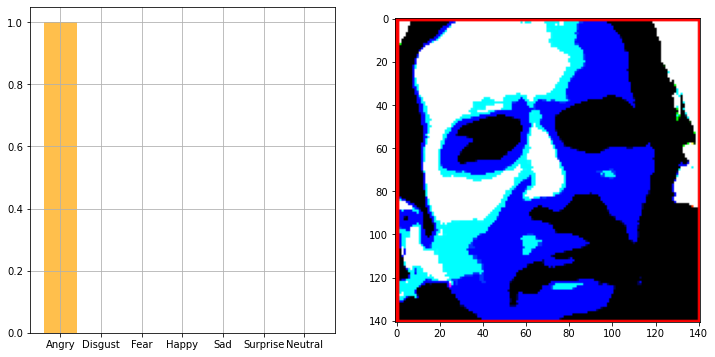

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 132.061      134.22101    125.32     ]
   ...
   [ 116.061      121.221      116.32     ]
   [ 116.061      121.221      116.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -6.939003     3.2210007    9.32     ]
 

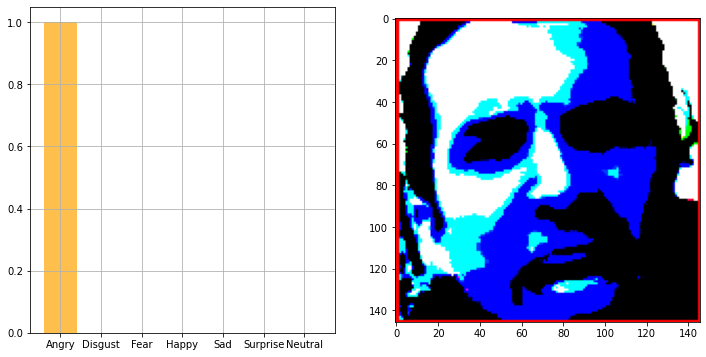

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 107.061     112.221     107.32    ]
   ...
   [ 118.061     123.221     118.32    ]
   [ 118.061     123.221     118.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -26.939003  -15.778999  -12.68    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -86.939    

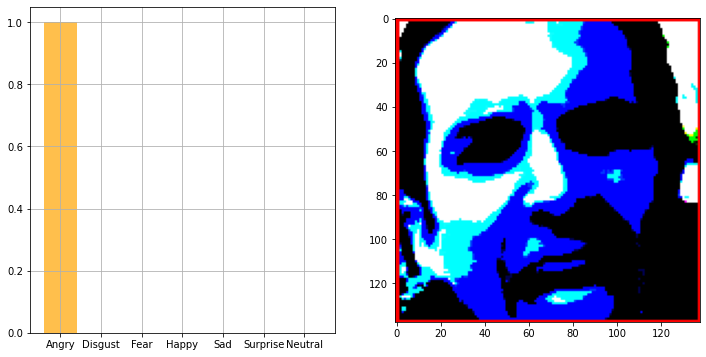

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 113.061     118.221     113.32    ]
   ...
   [ 118.061     123.221     118.32    ]
   [ 118.061     123.221     118.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -24.939003  -21.779     -14.68    ]
   ...
   [ -87.939    -100.779    -107.68    ]
   [ -86.939    

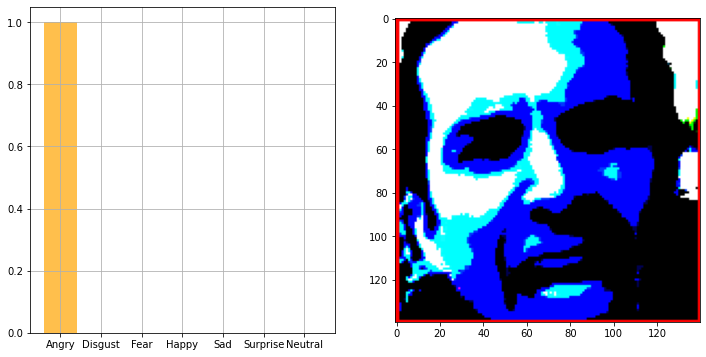

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  90.061      97.221      92.32    ]
   ...
   [  95.061     100.221      95.32    ]
   [  99.061     104.221      99.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -60.939003  -57.779     -50.68    ]
   ...
   [ -91.939    -105.779    -110.68    ]
   [ -88.939    

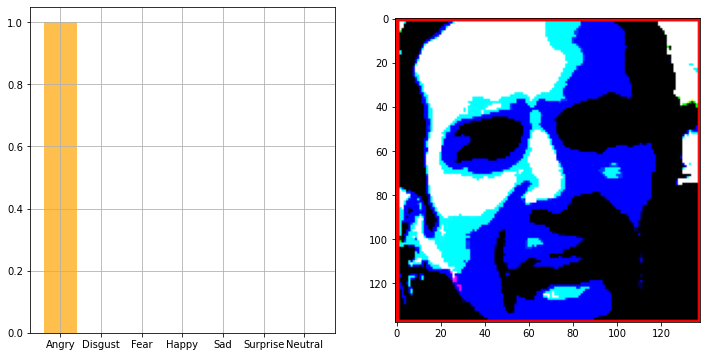

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 114.061     117.221     117.32    ]
   ...
   [  83.061      89.221      86.32    ]
   [  92.061      97.221      92.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  22.060997   35.221      40.32    ]
   ...
   [ -88.939    -101.779    -108.68    ]
   [ -87.939    

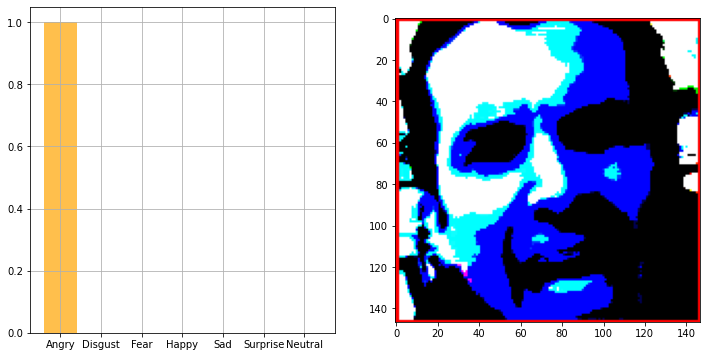

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  88.061      90.221      92.32    ]
   ...
   [  23.060997   37.221      39.32    ]
   [  38.060997   49.221      52.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  26.060997   39.221      44.32    ]
   ...
   [ -93.939    -106.779    -113.68    ]
   [ -92.939    

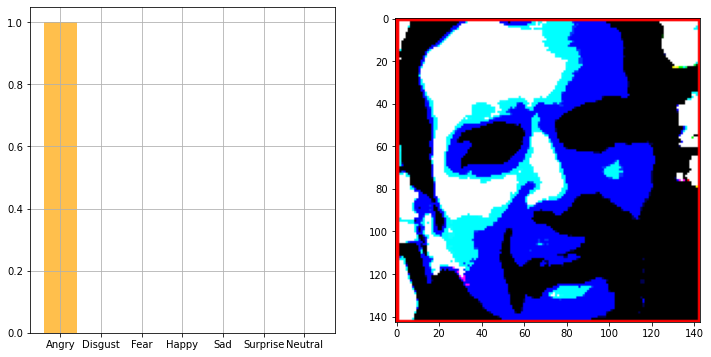

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  26.060997   30.221      32.32    ]
   ...
   [  23.060997   37.221      39.32    ]
   [   9.060997   23.221      25.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  43.060997   53.221      52.32    ]
   ...
   [ -91.939    -104.779    -111.68    ]
   [ -91.939    

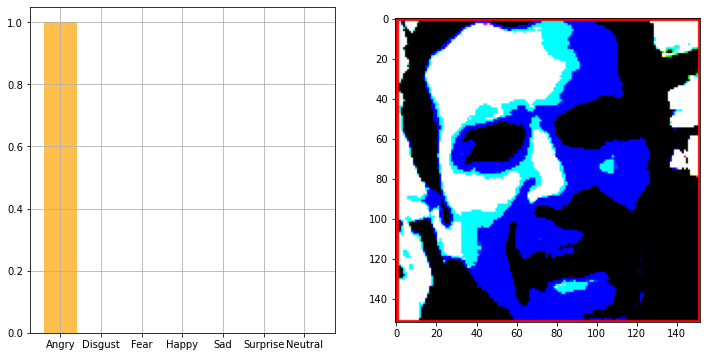

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  69.061      77.221      74.32    ]
   ...
   [  42.060997   59.221      57.32    ]
   [  42.060997   59.221      57.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  34.060997   45.221      46.32    ]
   ...
   [-103.939    -113.779    -118.68    ]
   [-101.939    

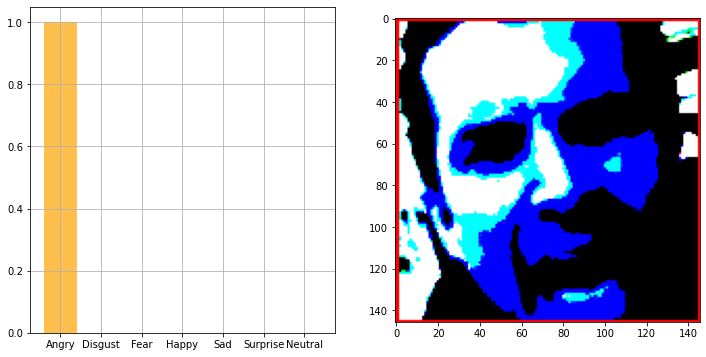

[[5.591641e-20 0.000000e+00 0.000000e+00 1.000000e+00 0.000000e+00
  0.000000e+00 0.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  63.060997   76.221      72.32    ]
   ...
   [  11.060997   26.221      24.32    ]
   [   8.060997   23.221      21.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  37.060997   50.221      55.

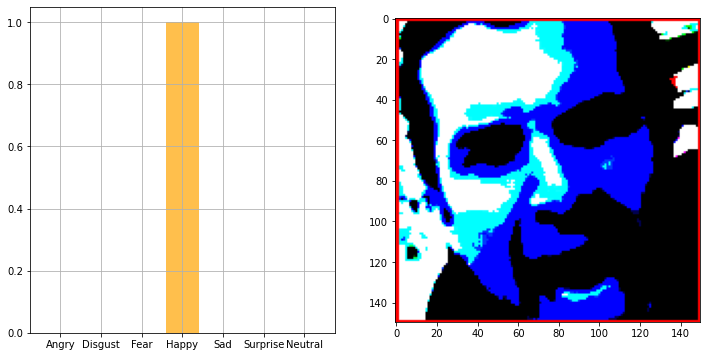

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -72.939     -65.779     -65.68    ]
   ...
   [  24.060997   32.221      24.32    ]
   [  20.060997   28.221      20.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  16.060997   30.221      37.32    ]
   ...
   [ -99.939    -107.779    -103.68    ]
   [ -96.939    

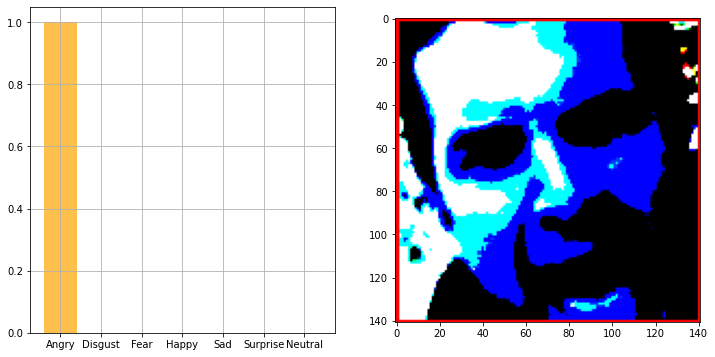

[[3.696333e-25 0.000000e+00 1.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 0.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  51.060997   56.221      56.32    ]
   ...
   [  27.060997   42.221      40.32    ]
   [  26.060997   41.221      39.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  68.061      77.221      80.

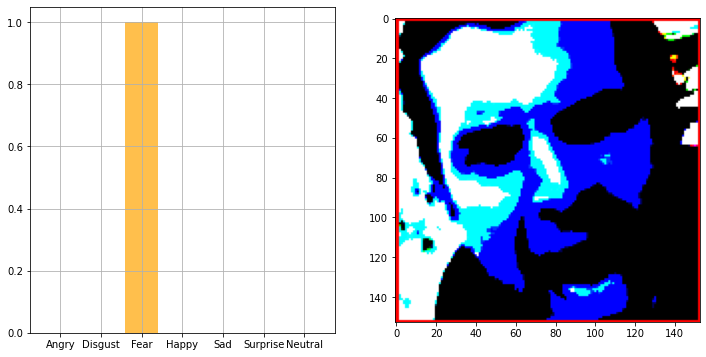

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  17.060997   22.221      22.32    ]
   ...
   [  39.060997   60.221      61.32    ]
   [  39.060997   60.221      59.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  39.060997   53.221      60.32    ]
   ...
   [-103.939    -115.779    -112.68    ]
   [-102.939    

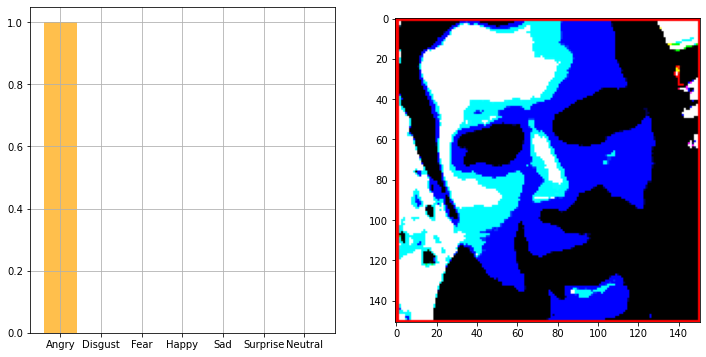

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [  -6.939003      0.22100067    0.3199997 ]
   ...
   [  35.060997     55.221        59.32      ]
   [  31.060997     51.221        55.32      ]
   [ 151.061      -116.779      -123.68      ]]

  ...

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      

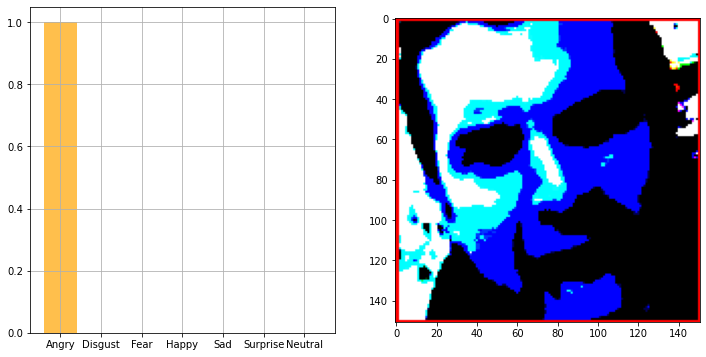

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -56.939003  -51.779     -51.68    ]
   ...
   [  43.060997   59.221      61.32    ]
   [  40.060997   58.221      60.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  18.060997   34.221      36.32    ]
   ...
   [-101.939    -113.779    -115.68    ]
   [-101.939    

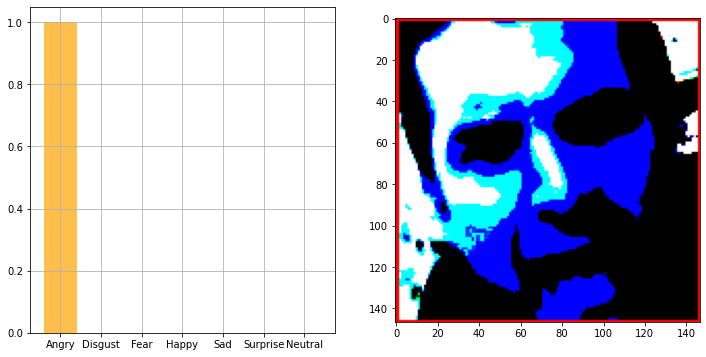

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -56.939003  -49.779     -49.68    ]
   ...
   [  96.061     105.221     100.32    ]
   [  93.061     102.221      97.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   9.060997   25.221      20.32    ]
   ...
   [ -97.939    -111.779    -116.68    ]
   [ -97.939    

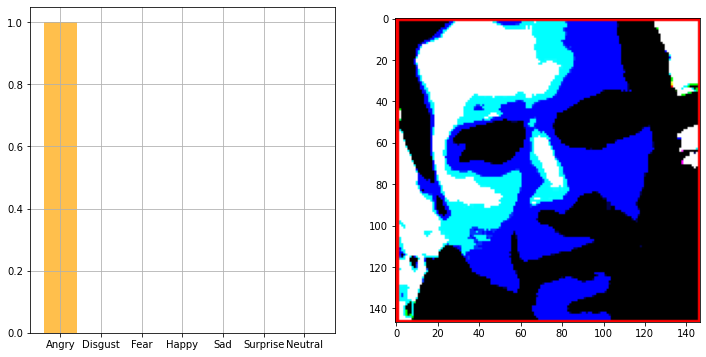

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -16.939003   -8.778999  -11.68    ]
   ...
   [  99.061     108.221     103.32    ]
   [  99.061     108.221     103.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   6.060997   19.221      15.32    ]
   ...
   [ -95.939    -108.779    -115.68    ]
   [ -95.939    

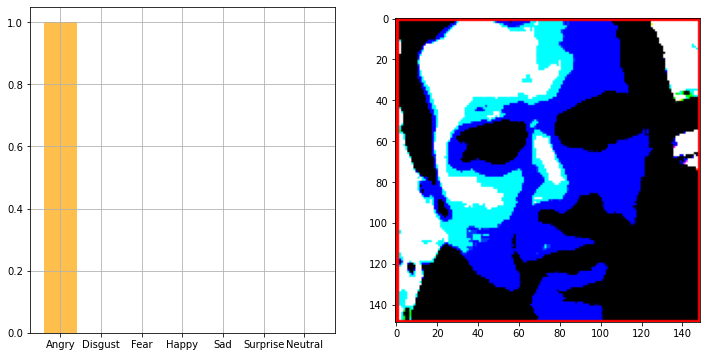

[[1. 0. 0. 0. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -4.939003    13.221001    15.32     ]
   ...
   [ -17.939003   -11.778999   -14.68     ]
   [ -19.939003   -12.778999   -12.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   3.060997    10.221001     5.3199997]
   ...

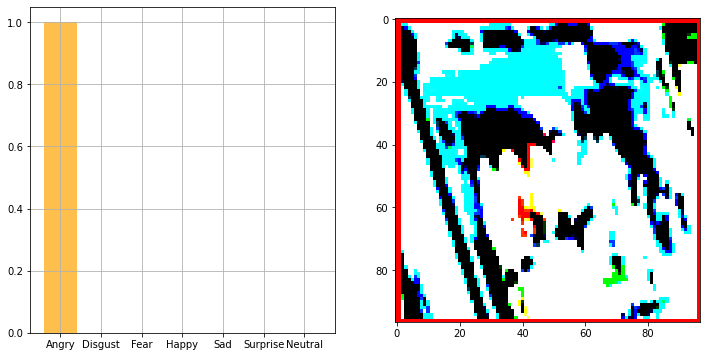

[[0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 9.497609e-10
  0.000000e+00 1.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -64.939      -57.779      -57.68     ]
   ...
   [  95.061      101.221       98.32     ]
   [  92.061       98.221       95.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     

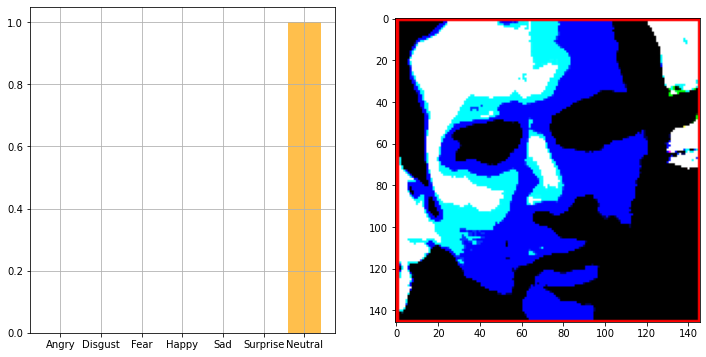

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -48.939003  -41.779     -41.68    ]
   ...
   [  76.061      86.221      85.32    ]
   [  81.061      88.221      88.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  12.060997   24.221      18.32    ]
   ...
   [ -95.939    -109.779    -114.68    ]
   [ -95.939    

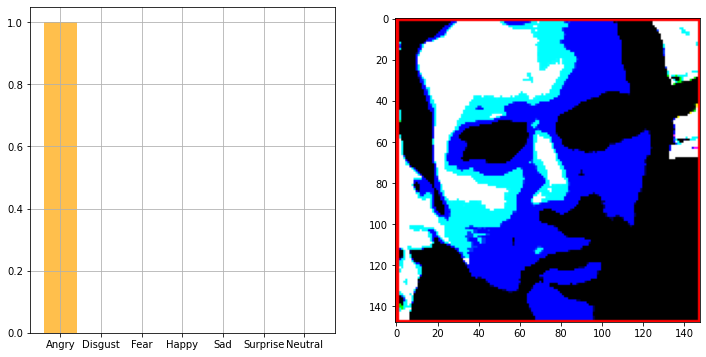

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -48.939003  -41.779     -41.68    ]
   ...
   [  16.060997   32.221      34.32    ]
   [  26.060997   42.221      44.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  20.060997   33.221      24.32    ]
   ...
   [ -98.939    -112.779    -117.68    ]
   [ -95.939    

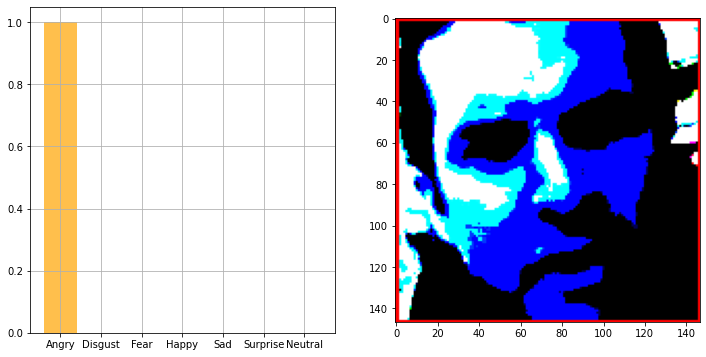

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -65.939     -58.779     -58.68    ]
   ...
   [   7.060997   25.221      27.32    ]
   [  -8.939003    9.221001   11.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  32.060997   42.221      41.32    ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    

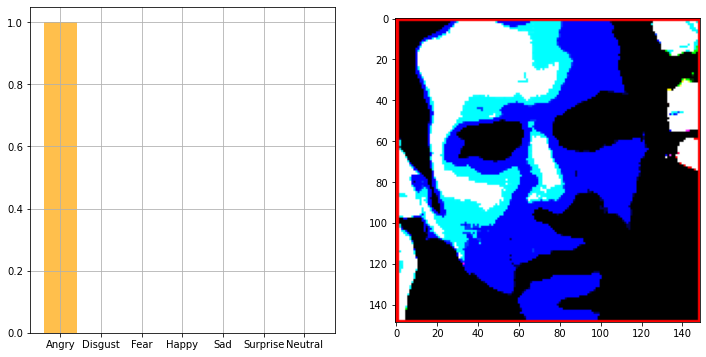

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -69.939     -63.779     -61.68    ]
   ...
   [  26.060997   37.221      33.32    ]
   [  17.060997   28.221      24.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  51.060997   61.221      60.32    ]
   ...
   [ -98.939    -112.779    -117.68    ]
   [ -97.939    

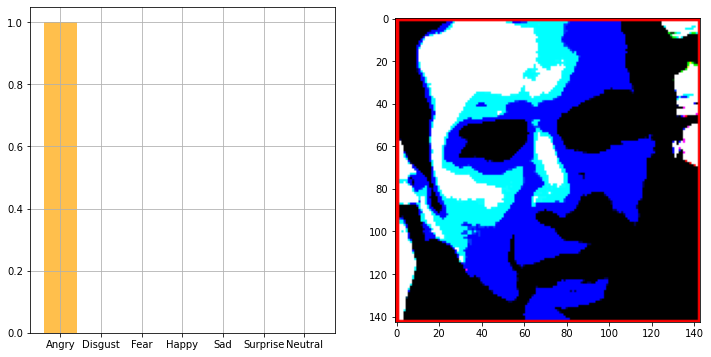

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 1.8517866e-28 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -28.939003   -21.779      -21.68     ]
   ...
   [  -3.939003    10.221001    -0.6800003]
   [ -10.939003     3.2210007   -7.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

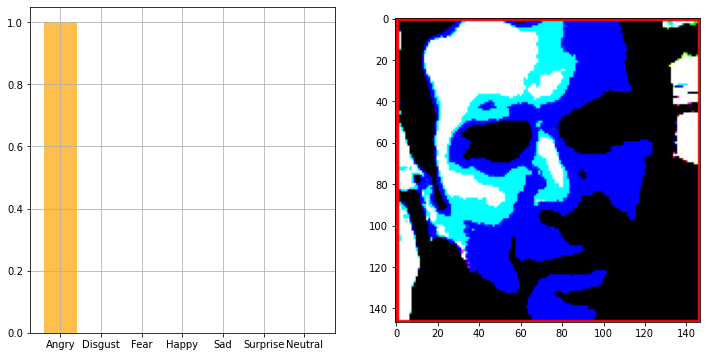

[[2.8783395e-21 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -73.939      -67.779      -63.68     ]
   ...
   [ -24.939003   -14.778999   -29.68     ]
   [ -22.939003   -12.778999   -27.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

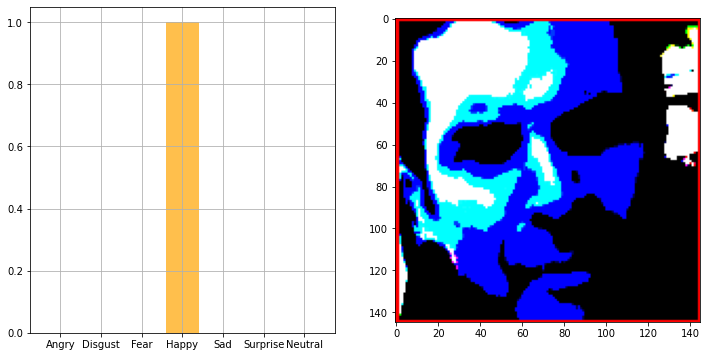

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -41.939003   -35.779      -33.68     ]
   ...
   [  -1.939003     2.2210007   -6.6800003]
   [  42.060997    48.221       40.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  96.061      104.221      101.32     ]
 

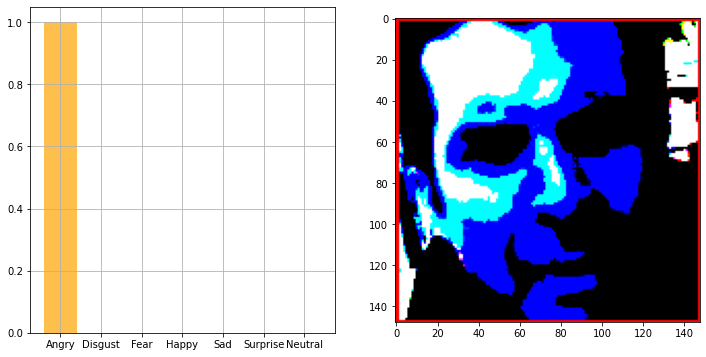

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -74.939     -68.779     -66.68    ]
   ...
   [  62.060997   68.221      60.32    ]
   [  66.061      72.221      64.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  74.061      82.221      79.32    ]
   ...
   [ -94.939    -108.779    -113.68    ]
   [ -94.939    

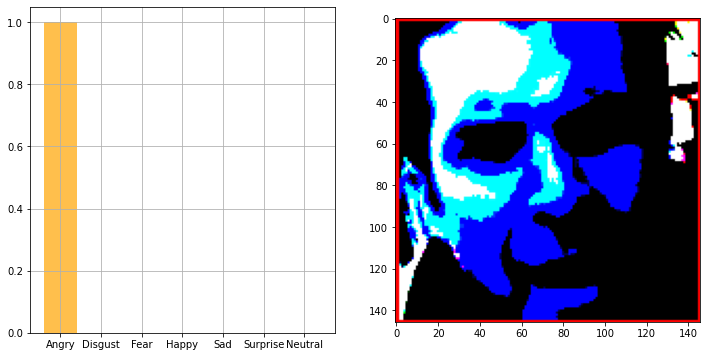

[[1. 0. 0. 0. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -42.939003   -31.779      -28.68     ]
   ...
   [ -14.939003    -6.7789993  -14.68     ]
   [ -11.939003    -3.7789993  -11.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -69.939      -65.779      -61.68     ]
   ...

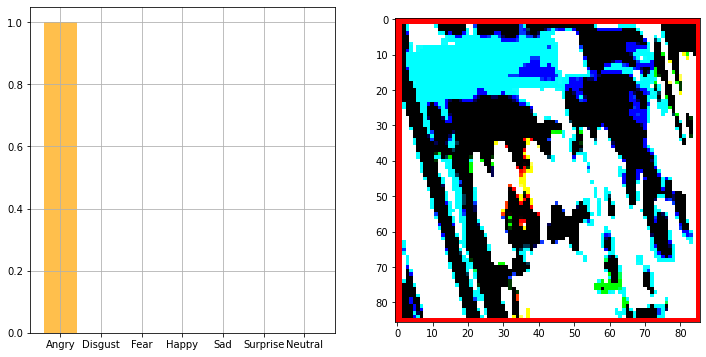

[[0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 9.739219e-23
  0.000000e+00 1.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   3.060997    9.221001   11.32    ]
   ...
   [  72.061      80.221      77.32    ]
   [  76.061      84.221      81.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  90.061      97.221      97.

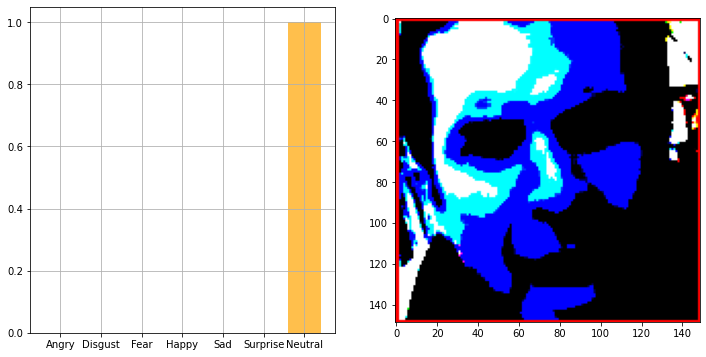

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 2.8308964e-20 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  61.060997   67.221      69.32    ]
   ...
   [  69.061      81.221      75.32    ]
   [  73.061      85.221      79.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 106.061     112.221  

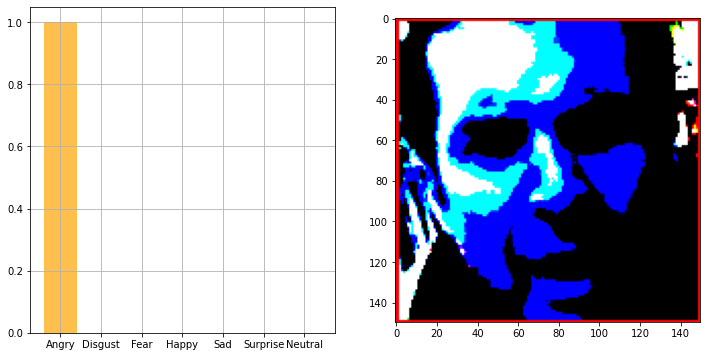

[[1.1656456e-14 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  79.061      77.221      46.32    ]
   ...
   [  72.061      60.221      26.32    ]
   [  67.061      55.221      21.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -12.939003   49.221  

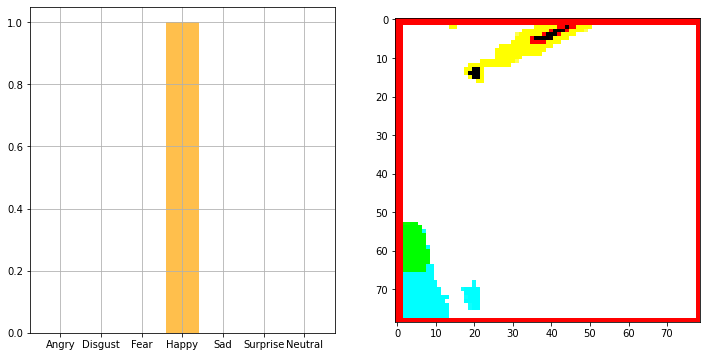

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00
  1.6862098e-16 0.0000000e+00]]
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [  76.061   86.221   85.32 ]
   ...
   [  74.061   85.221   81.32 ]
   [  74.061   85.221   81.32 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 101.061  107.221  104.32 ]
   ...
   [ -97.939 -110.779 -117.68 ]
   [ -97.939 -110.779 -117.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [  95.0

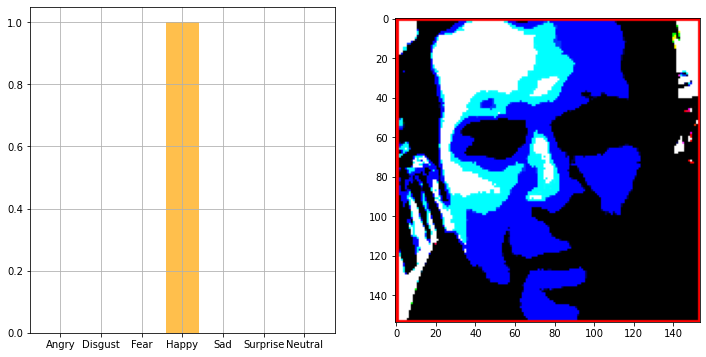

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  79.061      86.221      86.32    ]
   ...
   [  60.060997   71.221      67.32    ]
   [  67.061      78.221      74.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  92.061     100.221      97.32    ]
   ...
   [ -94.939    -107.779    -114.68    ]
   [ -94.939    

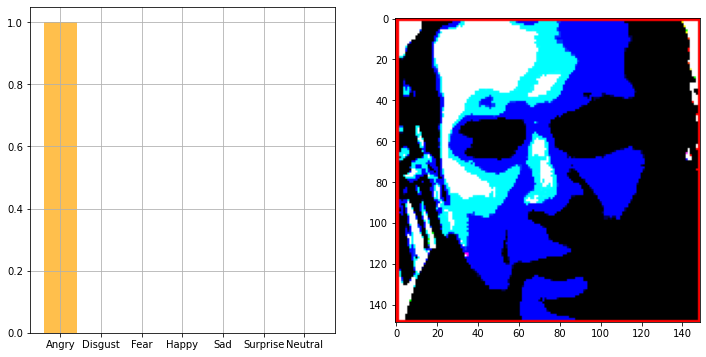

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  84.061      88.221      90.32    ]
   ...
   [  12.060997   14.221001   10.32    ]
   [  33.060997   35.221      31.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 104.061     112.221     109.32    ]
   ...
   [ -97.939    -112.779    -114.68    ]
   [ -97.939    

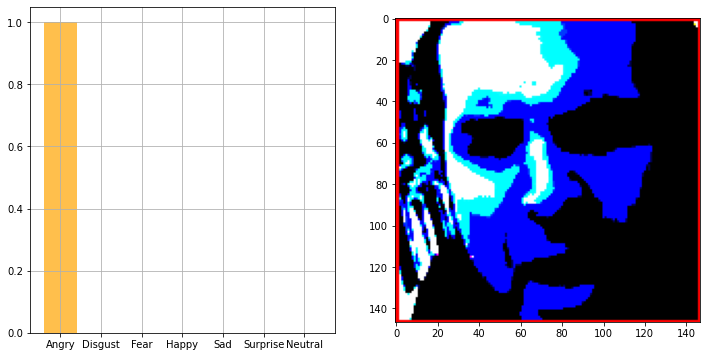

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  63.060997   68.221      68.32    ]
   ...
   [ -88.939    -102.779    -107.68    ]
   [ -86.939    -100.779    -105.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  85.061      99.221      99.32    ]
   ...
   [ -98.939    -108.779    -102.68    ]
   [ -99.939    

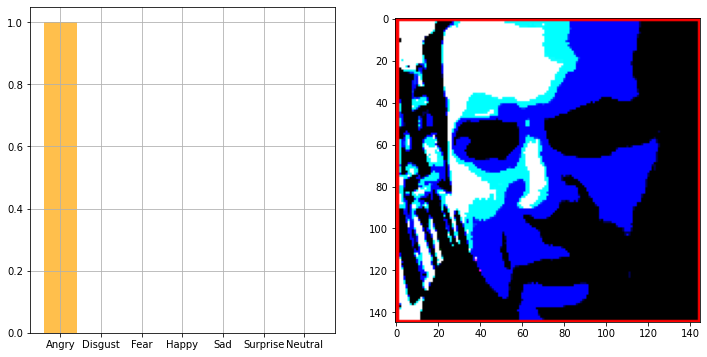

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 7.2060997e+01  6.2221001e+01  2.3320000e+01]
   ...
   [ 4.0609970e+00  7.2210007e+00 -6.6800003e+00]
   [ 1.2060997e+01  1.5221001e+01  1.3199997e+00]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  ...

  [[ 1.5106100e+02 -1.167

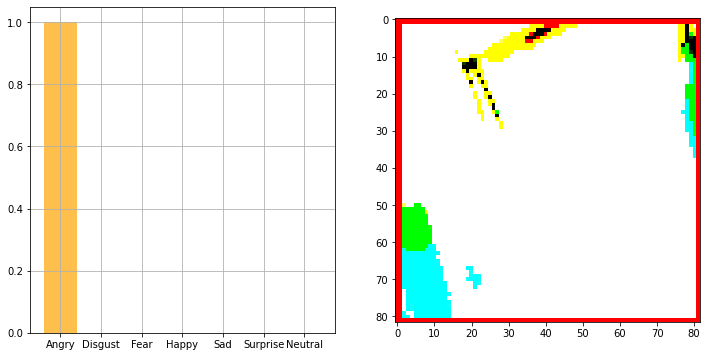

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00 0.0000000e+00
  2.8282463e-09 0.0000000e+00]]
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  66.061      72.221      69.32    ]
   ...
   [ -95.939    -106.779    -111.68    ]
   [ -94.939    -105.779    -110.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  34.060997   50.221      5

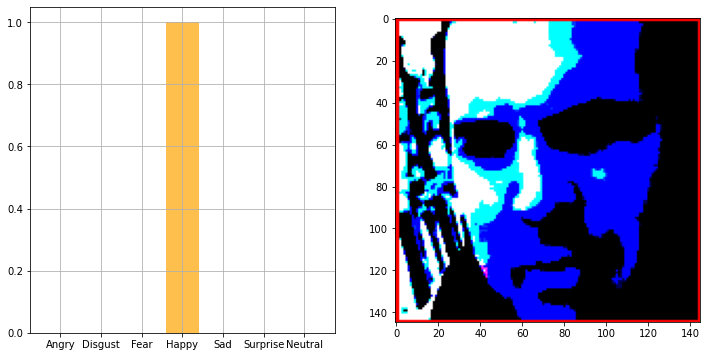

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 2.0268637e-07
  0.0000000e+00 9.9999976e-01]]
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  15.060997   16.221     -19.68    ]
   ...
   [ -63.939003  -50.779     -40.68    ]
   [ -68.939     -53.779     -43.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -86.939     -99.779    -10

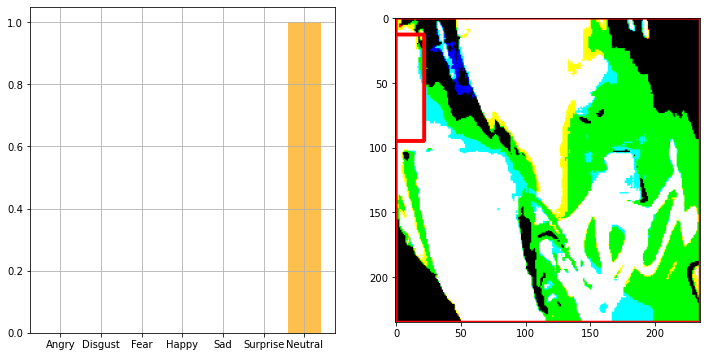

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -37.939003  -28.779     -33.68    ]
   ...
   [ -97.939    -109.779    -111.68    ]
   [ -97.939    -109.779    -111.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  61.060997   72.221      73.32    ]
   ...
   [ -90.939     -90.779     -81.68    ]
   [ -89.939    

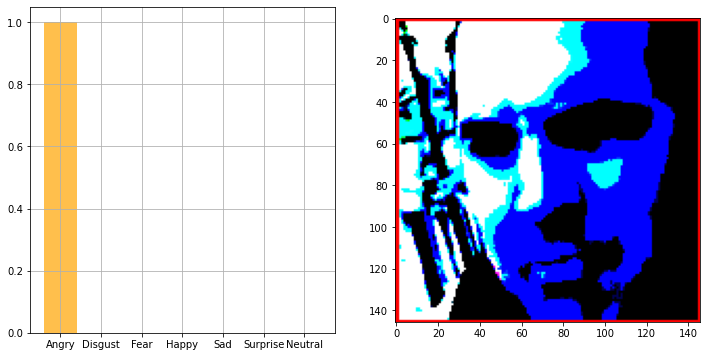

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -9.939003    -2.7789993   -2.6800003]
   ...
   [ -96.939     -107.779     -107.68     ]
   [ -95.939     -106.779     -111.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  40.060997    55.221       53.32     ]
 

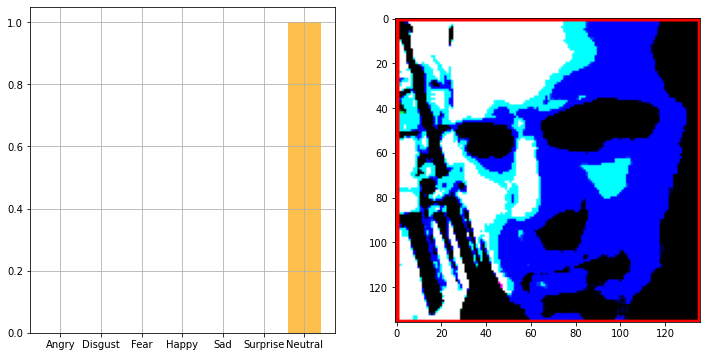

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  13.060997   19.221      21.32    ]
   ...
   [ -95.939    -103.779    -104.68    ]
   [ -91.939    -103.779    -105.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  75.061      86.221      87.32    ]
   ...
   [ -71.939     -64.779     -51.68    ]
   [ -74.939    

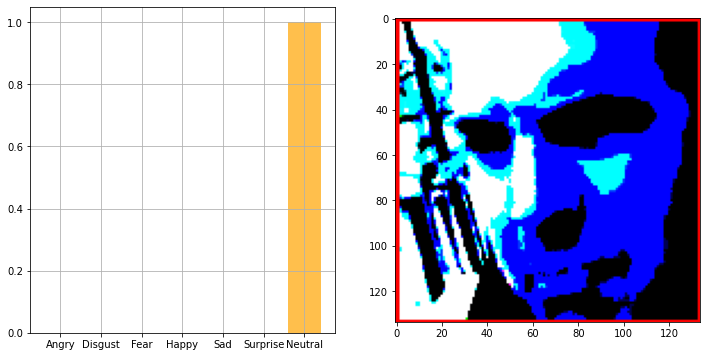

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  71.061      77.221      79.32    ]
   ...
   [ -95.939    -101.779    -102.68    ]
   [ -99.939    -105.779    -106.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 109.061     118.221     119.32    ]
   ...
   [ -63.939003  -56.779     -41.68    ]
   [ -66.939    

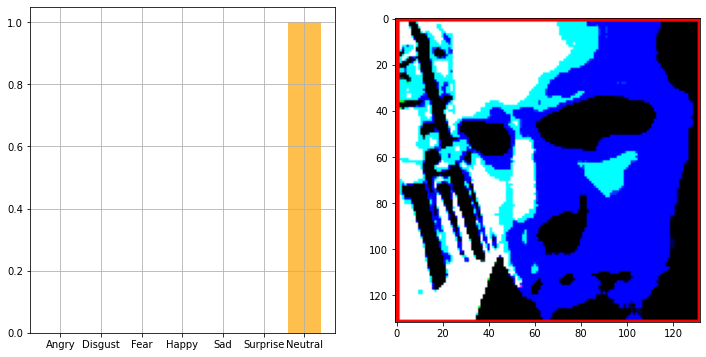

[[1.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 1.697018e-24]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  64.061      70.221      72.32    ]
   ...
   [ -99.939    -105.779    -106.68    ]
   [ -97.939    -106.779    -111.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 121.061     127.221     124.

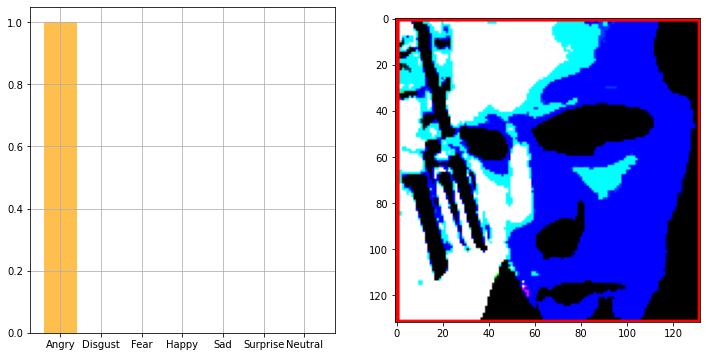

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   2.060997   17.221      22.32    ]
   ...
   [ -96.939    -101.779     -99.68    ]
   [ -97.939    -103.779    -104.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 123.061     130.22101   125.32    ]
   ...
   [ -54.939003  -43.779     -26.68    ]
   [ -54.939003 

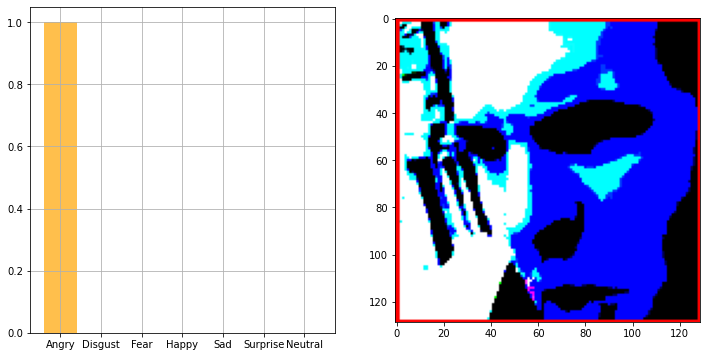

[[0. 0. 0. 0. 0. 0. 1.]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   3.060997    25.221       -4.6800003]
   ...
   [  54.060997    37.221      -20.68     ]
   [  60.060997    46.221      -19.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -81.939      -94.779     -101.68     ]
   ...

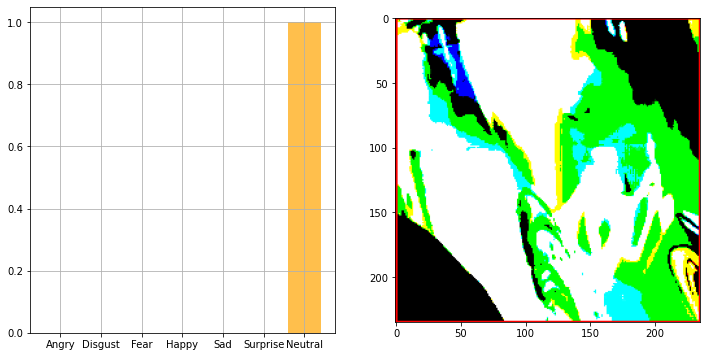

[[1.0000000e+00 0.0000000e+00 3.7862356e-13 0.0000000e+00 2.3479297e-24
  0.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -13.939003     4.2210007    6.3199997]
   ...
   [ -91.939      -89.779      -75.68     ]
   [ -88.939      -89.779      -77.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

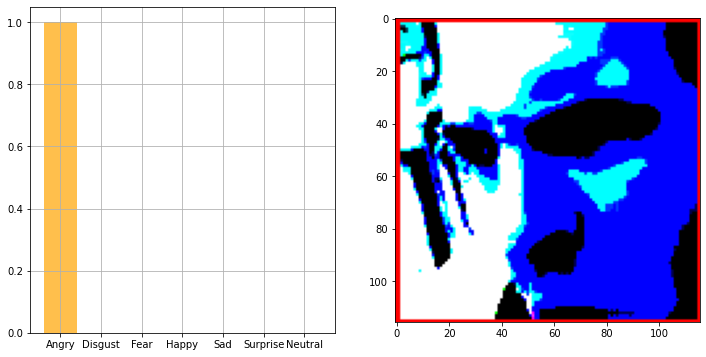

[[9.524952e-28 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 1.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  32.060997    30.221      -10.68     ]
   ...
   [  10.060997    25.221      -30.68     ]
   [  10.060997    25.221      -30.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     

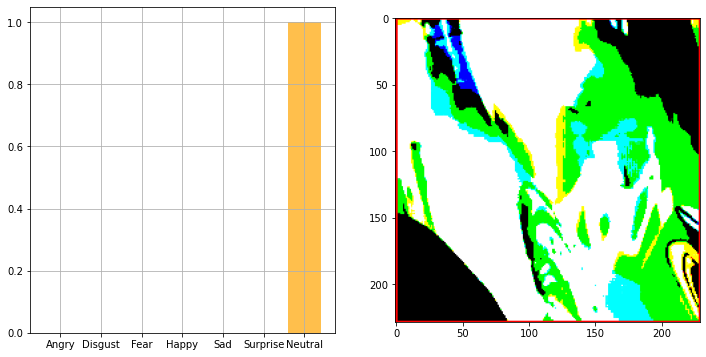

[[1.3093805e-30 0.0000000e+00 0.0000000e+00 0.0000000e+00 1.0000000e+00
  0.0000000e+00 0.0000000e+00]]
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  58.060997   78.221      82.32    ]
   ...
   [ -92.939     -99.779     -97.68    ]
   [ -95.939    -102.779    -100.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 125.061     129.22101   12

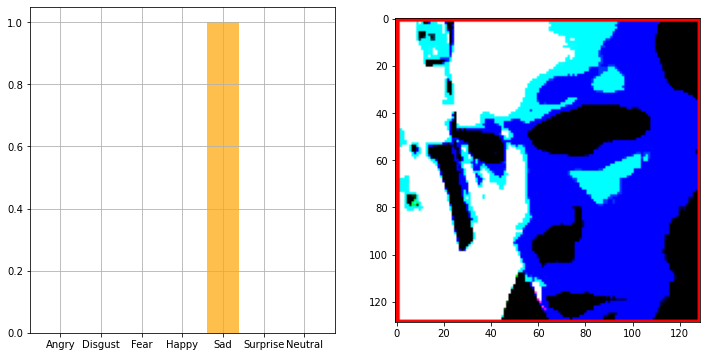

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  90.061       90.221       59.32     ]
   ...
   [  31.060997    37.221        7.3199997]
   [   3.060997    18.221       -3.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

 

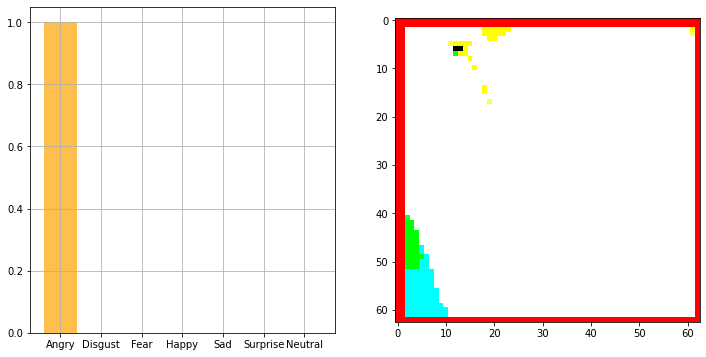

[[0. 0. 0. 1. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  81.061      87.221      89.32    ]
   ...
   [ -95.939    -109.779    -114.68    ]
   [ -95.939    -108.779    -115.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  12.060997   18.221      22.32    ]
   ...
   [ -62.939003  -48.779     -34.68    ]
   [ -63.939003  -51.

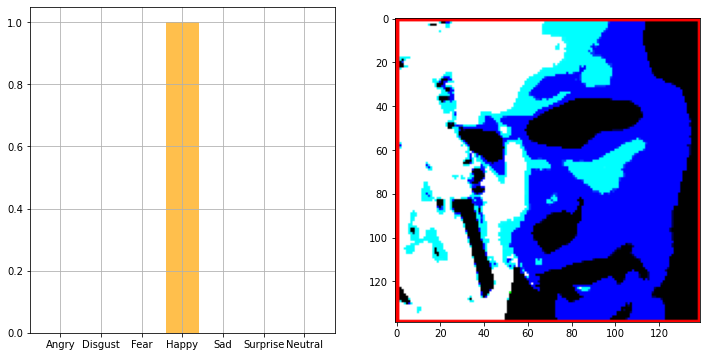

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  85.061      88.221      56.32    ]
   ...
   [  75.061      82.221      50.32    ]
   [  68.061      75.221      43.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -26.939003   58.221      76.32    ]
   ...
   [  57.060997  104.221      67.32    ]
   [  57.060997 

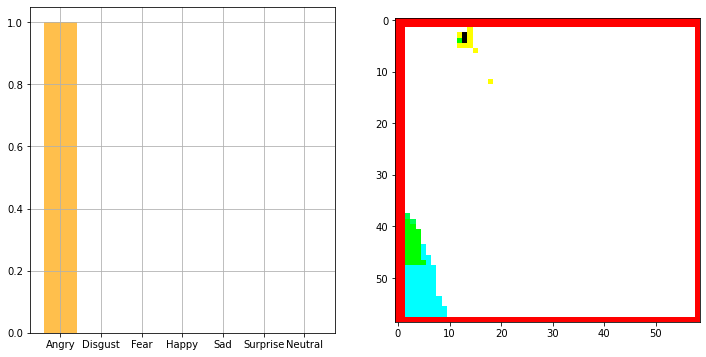

[[0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00 0.00000e+00 2.06756e-20
  0.00000e+00]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  72.061       77.221       77.32     ]
   ...
   [ -97.939     -109.779     -111.68     ]
   [ -95.939     -109.779     -114.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779    

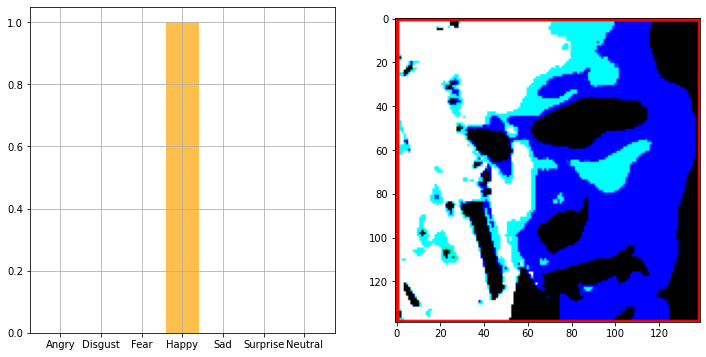

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  44.060997   50.221      47.32    ]
   ...
   [ -94.939    -107.779    -114.68    ]
   [ -94.939    -107.779    -114.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  14.060997   20.221      12.32    ]
   ...
   [ -62.939003  -52.779     -40.68    ]
   [ -62.939003 

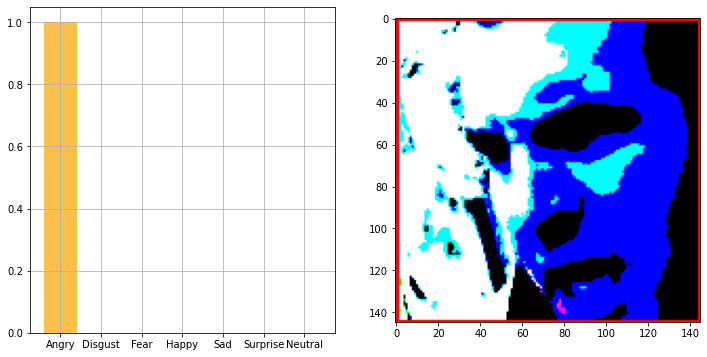

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  84.061      84.221      51.32    ]
   ...
   [  75.061      78.221      46.32    ]
   [  50.060997   58.221      30.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -10.939003   54.221      59.32    ]
   ...
   [  58.0609

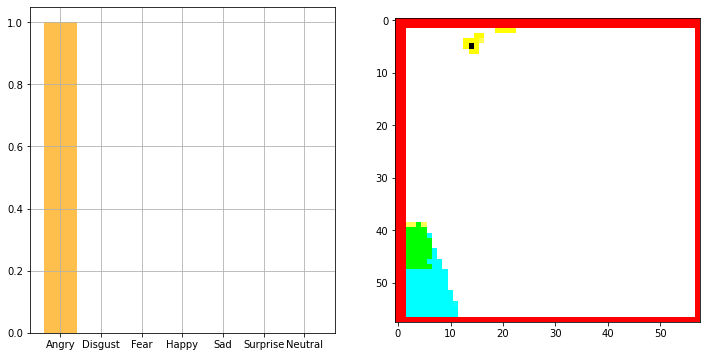

[[0.         0.         0.         0.9397334  0.         0.06026657
  0.        ]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  27.060997   42.221      47.32    ]
   ...
   [ -97.939    -107.779    -109.68    ]
   [ -97.939    -109.779    -111.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 124.061     130.22101   122.32    ]
   ...

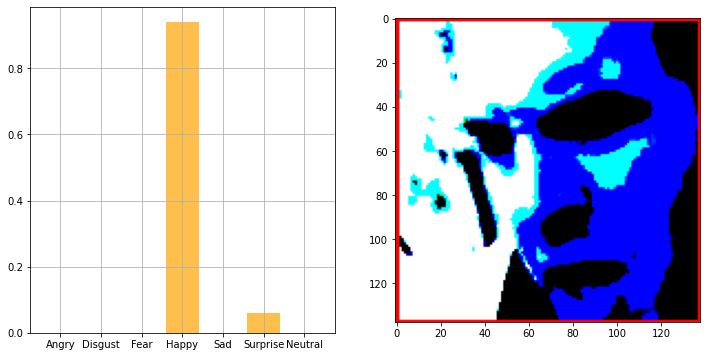

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  45.060997   59.221      61.32    ]
   ...
   [-102.939    -112.779    -119.68    ]
   [-102.939    -112.779    -119.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 127.061     132.22101   127.32    ]
   ...
   [ -70.939     -63.779     -48.68    ]
   [ -71.939    

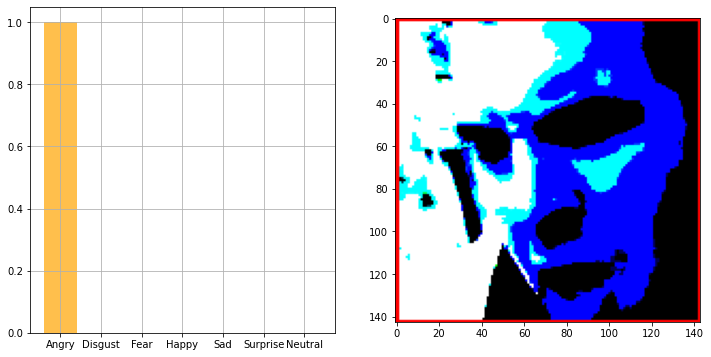

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  42.060997   58.221      60.32    ]
   ...
   [-102.939    -112.779    -119.68    ]
   [-101.939    -111.779    -118.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 125.061     129.22101   126.32    ]
   ...
   [ -74.939     -69.779     -56.68    ]
   [ -79.939    

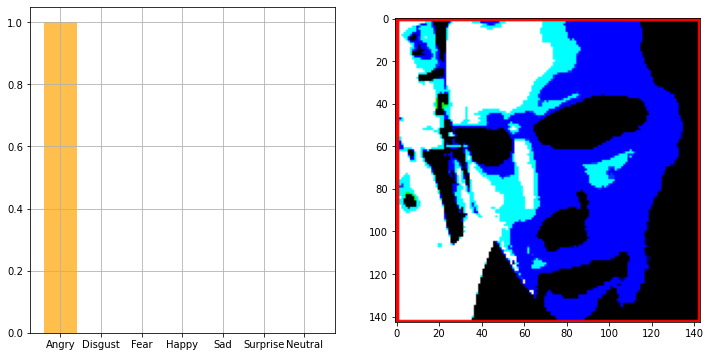

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  45.060997   55.221      54.32    ]
   ...
   [ -98.939    -108.779    -115.68    ]
   [ -97.939    -107.779    -114.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 121.061     128.22101   123.32    ]
   ...
   [ -89.939     -88.779     -76.68    ]
   [ -89.939    

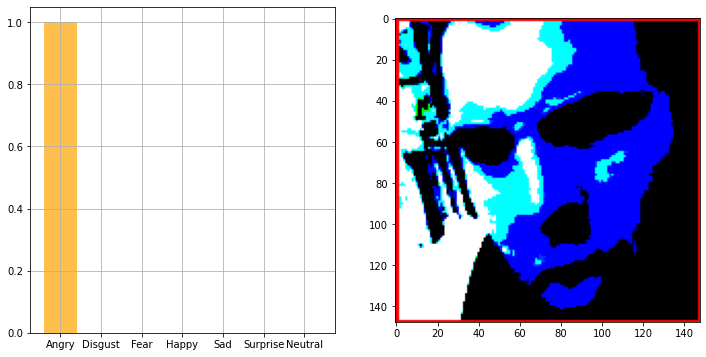

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  26.060997   32.221      36.32    ]
   ...
   [ -93.939    -101.779    -108.68    ]
   [ -91.939    -100.779    -105.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 114.061     123.221     118.32    ]
   ...
   [ -90.939     -87.779     -75.68    ]
   [ -86.939    

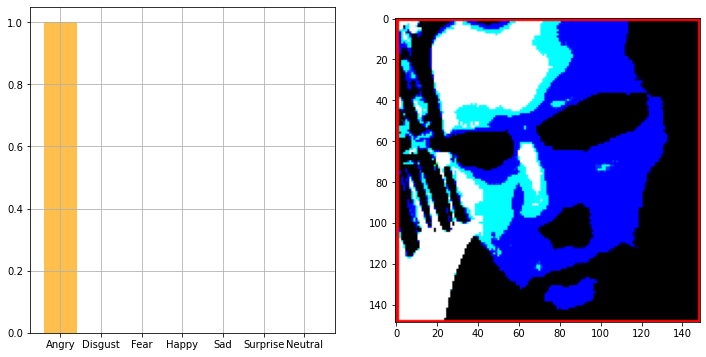

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.3607261e-21]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  46.060997   54.221      60.32    ]
   ...
   [ -85.939     -92.779     -95.68    ]
   [ -83.939     -88.779     -91.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  91.061     106.221  

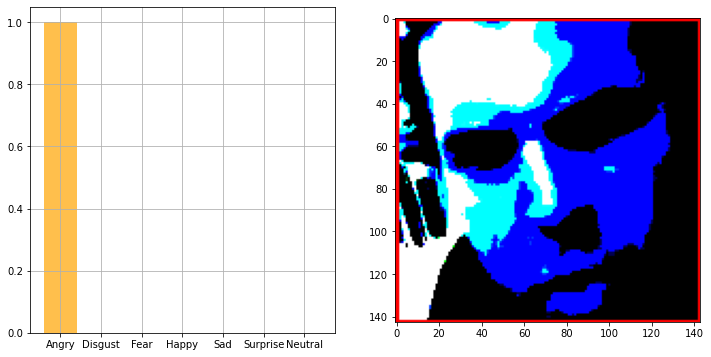

[[2.4990295e-35 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  96.061     104.221     101.32    ]
   ...
   [  65.061      77.221      76.32    ]
   [  63.060997   75.221      74.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  81.061      98.221  

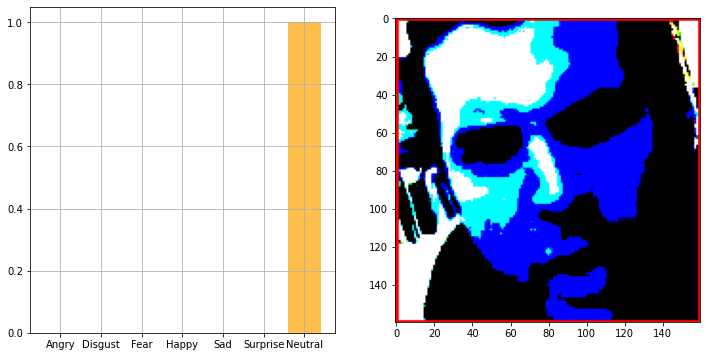

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -64.939      -59.779      -59.68     ]
   ...
   [ -20.939003    -7.7789993  -24.68     ]
   [ -14.939003    -1.7789993  -18.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  63.060997    77.221       77.32     ]
 

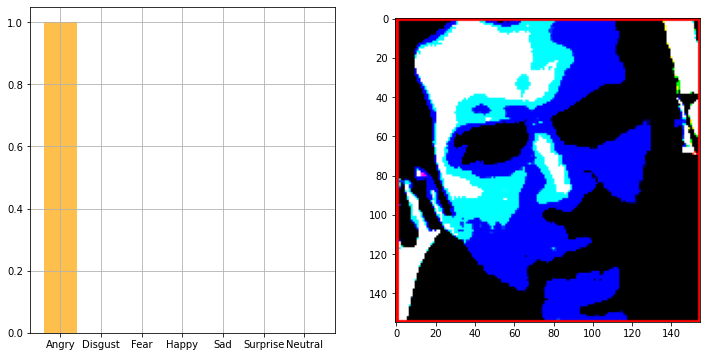

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -72.939      -70.779      -68.68     ]
   ...
   [  14.060997    -6.7789993  -52.68     ]
   [  30.060997     9.221001   -36.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -78.939      -72.779      -75.68     ]
 

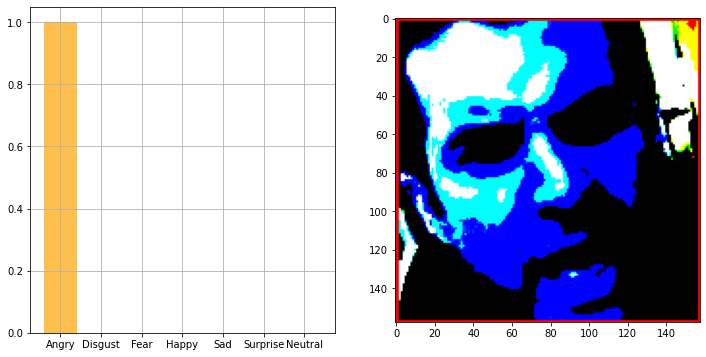

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -37.939003   -35.779      -33.68     ]
   ...
   [  41.060997    36.221        5.3199997]
   [  33.060997    25.221       -6.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -55.939003   -48.779      -48.68     ]
 

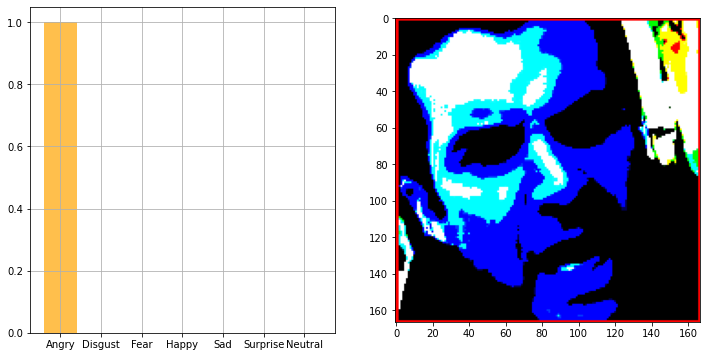

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -35.939003  -33.779     -29.68    ]
   ...
   [  41.060997   40.221      18.32    ]
   [  46.060997   42.221      16.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  43.060997   53.221      52.32    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

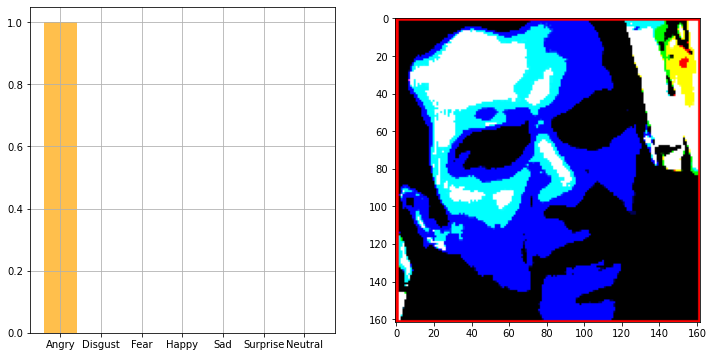

[[1. 0. 0. 0. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  79.061       79.221       48.32     ]
   ...
   [  -7.939003     5.2210007  -11.68     ]
   [ -25.939003    -7.7789993  -17.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -54.939003   -63.779      -68.68     ]
   ...

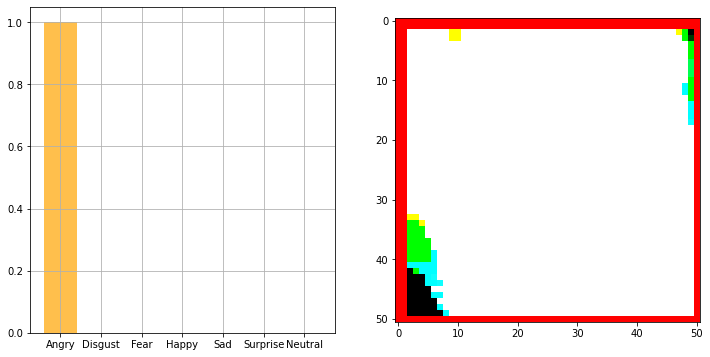

[[0.0000000e+00 0.0000000e+00 4.5613554e-38 2.6952863e-08 0.0000000e+00
  1.0000000e+00 3.5155796e-33]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -48.939003   -46.779      -42.68     ]
   ...
   [  -4.939003     1.2210007   -6.6800003]
   [   5.060997     8.221001    -5.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

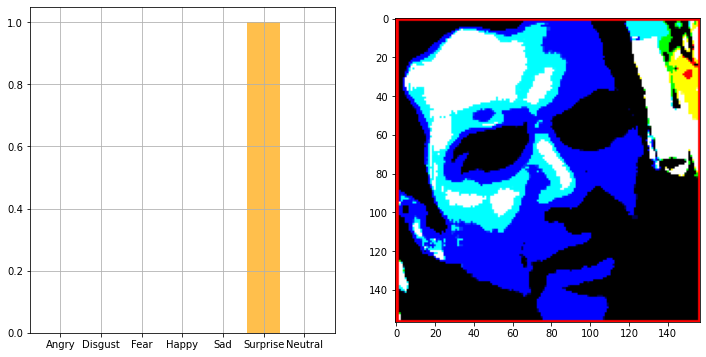

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -55.939003   -46.779      -43.68     ]
   ...
   [  25.060997    29.221       13.32     ]
   [  16.060997    20.221        4.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  30.060997    36.221       33.32     ]
 

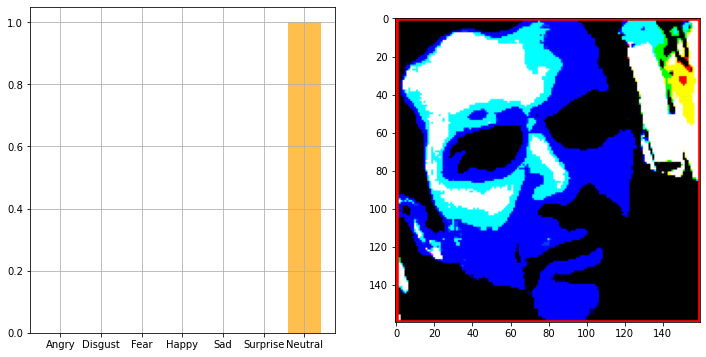

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -40.939003   -31.779      -28.68     ]
   ...
   [ -11.939003     2.2210007    4.3199997]
   [  -4.939003     9.221001    11.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  86.061       94.221       91.32     ]
 

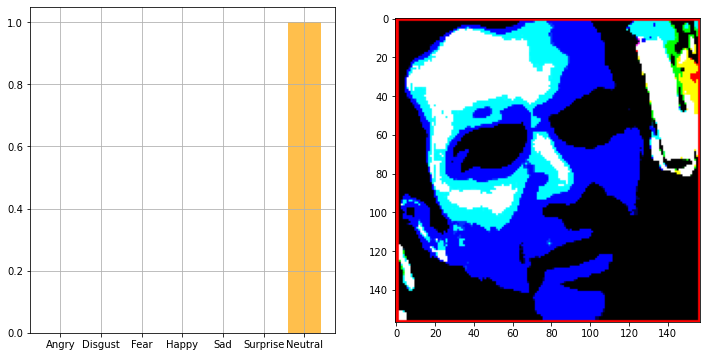

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -41.939003   -35.779      -31.68     ]
   ...
   [  -5.939003     1.2210007   -8.68     ]
   [  -1.939003     5.2210007   -4.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  82.061       89.221       89.32     ]
 

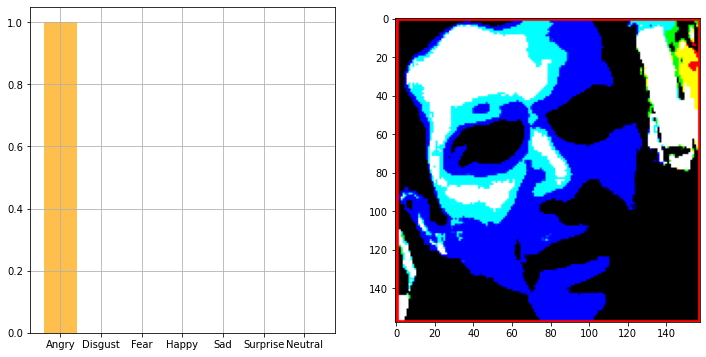

[[1. 0. 0. 0. 0. 0. 0.]]
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  71.061       74.221       40.32     ]
   ...
   [ -12.939003     3.2210007   -1.6800003]
   [ -14.939003     1.2210007   -3.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -51.939003   -70.779      -69.68     ]
   ...

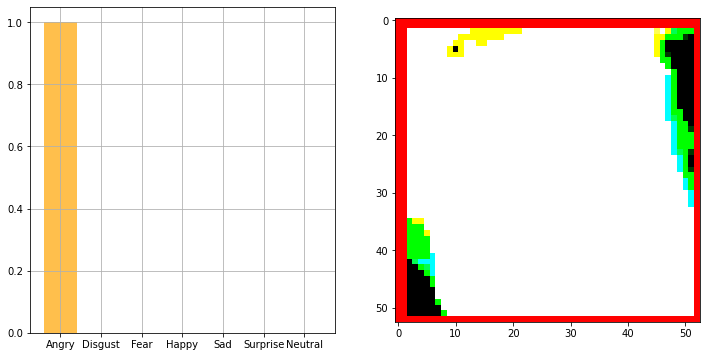

[[0.0000000e+00 0.0000000e+00 1.5012122e-15 1.0000000e+00 5.8798732e-20
  6.9670658e-12 6.9437644e-21]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -56.939003   -45.779      -44.68     ]
   ...
   [  -3.939003    -4.7789993  -19.68     ]
   [  21.060997    20.221        0.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

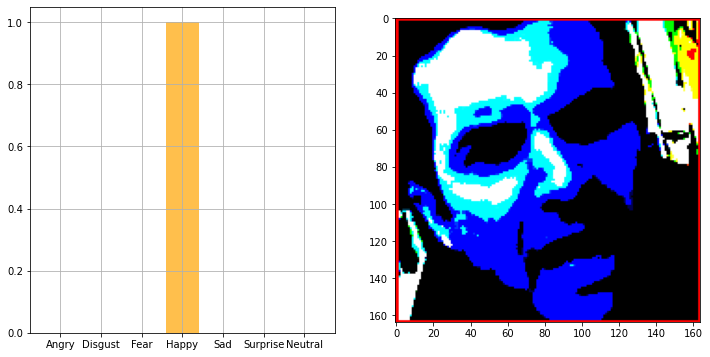

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -48.939003   -42.779      -38.68     ]
   ...
   [  22.060997    12.221001   -17.68     ]
   [  16.060997     6.2210007  -23.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  89.061      104.221      102.32     ]
 

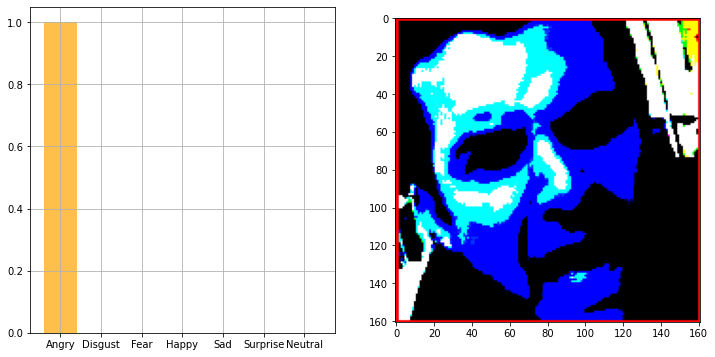

[[1.0000000e+00 0.0000000e+00 2.0513278e-29 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -72.939      -75.779      -72.68     ]
   ...
   [  21.060997    38.221       31.32     ]
   [  -7.939003     7.2210007   -1.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

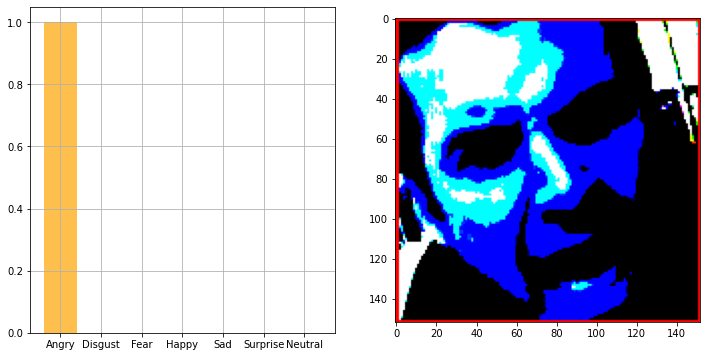

[[1.000000e+00 0.000000e+00 0.000000e+00 2.575705e-11 0.000000e+00
  0.000000e+00 0.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -73.939  -76.779  -73.68 ]
   ...
   [  75.061   79.221   70.32 ]
   [  77.061   81.221   72.32 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [  78.061   99.221   98.32 ]
   ...
   [-101.939 -114.779 -121.68 ]
   [-103.939 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [  79.061

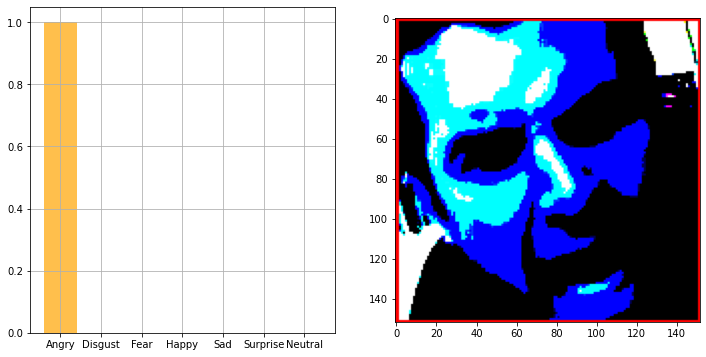

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -78.779     -77.68    ]
   ...
   [  67.061      73.221      65.32    ]
   [  59.060997   65.221      57.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 107.061     114.221     114.32    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-101.939    

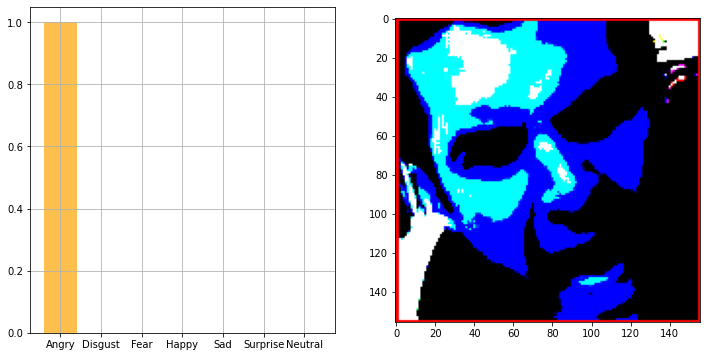

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -74.939  -80.779  -76.68 ]
   ...
   [  76.061   86.221   85.32 ]
   [  77.061   87.221   86.32 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 103.061  112.221  113.32 ]
   ...
   [ -95.939 -108.779 -115.68 ]
   [ -98.939 -111.779 -118.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 103.061  112.221  113.32 ]
   ...
   [ -97.939 -110.779 -117.68 ]
   [ -98.939 

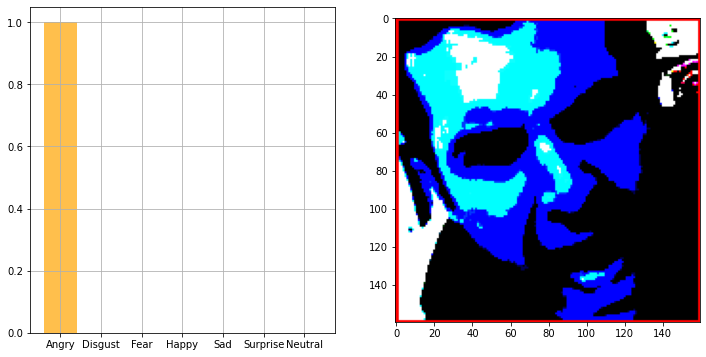

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -74.939  -80.779  -76.68 ]
   ...
   [  66.061   76.221   75.32 ]
   [  66.061   76.221   75.32 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 121.061  126.221  126.32 ]
   ...
   [ -95.939 -108.779 -115.68 ]
   [ -98.939 -111.779 -118.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 118.061  124.221  126.32 ]
   ...
   [ -93.939 -106.779 -113.68 ]
   [ -95.939 

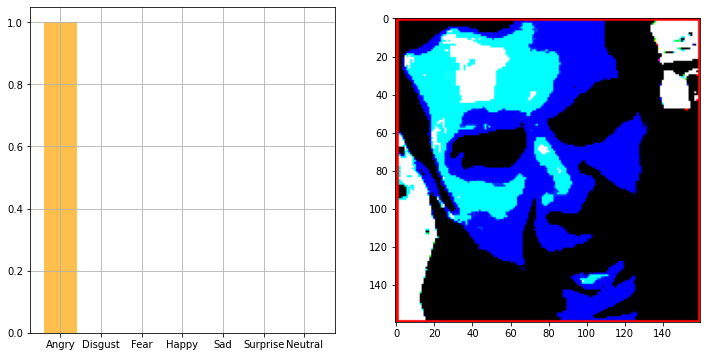

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -78.939      -78.779      -77.68     ]
   ...
   [  -7.939003     4.2210007   -1.6800003]
   [  19.060997    31.221       25.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 128.061      129.22101    122.32     ]
 

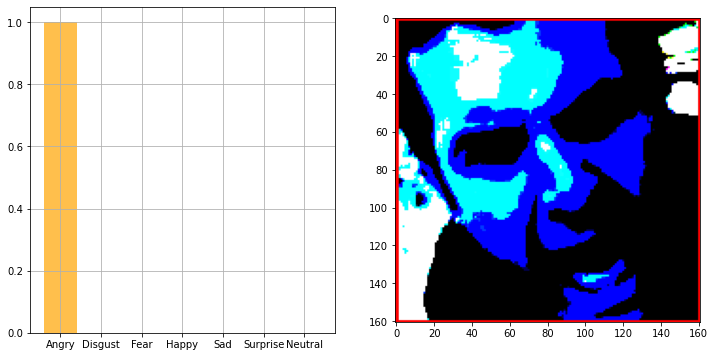

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -67.939     -61.779     -64.68    ]
   ...
   [ -30.939003  -15.778999  -24.68    ]
   [ -32.939003  -17.779     -26.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 129.061     130.22101   123.32    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

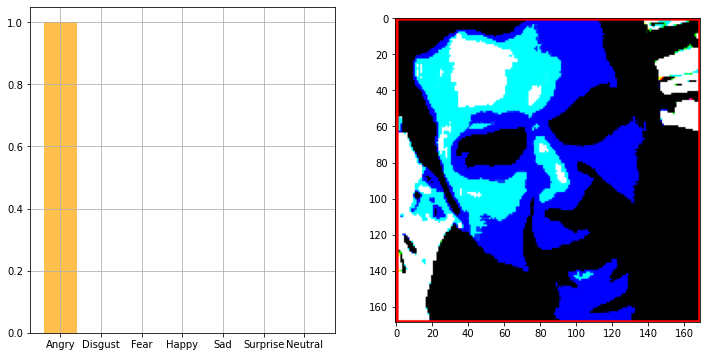

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -57.939003  -50.779     -50.68    ]
   ...
   [  29.060997   48.221      54.32    ]
   [  29.060997   48.221      54.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 120.061     125.221     120.32    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

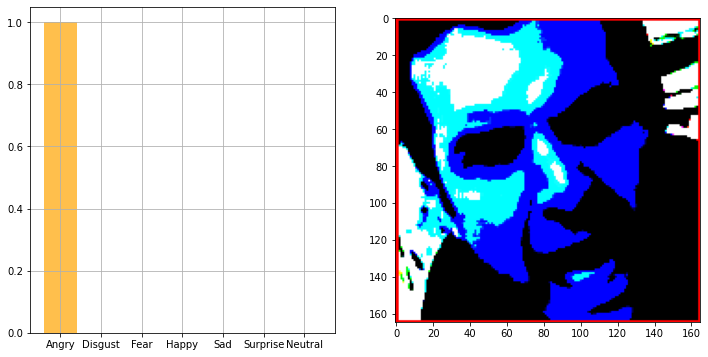

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -55.939003  -50.779     -50.68    ]
   ...
   [  19.060997   39.221      43.32    ]
   [  22.060997   42.221      46.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  24.060997   29.221      24.32    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

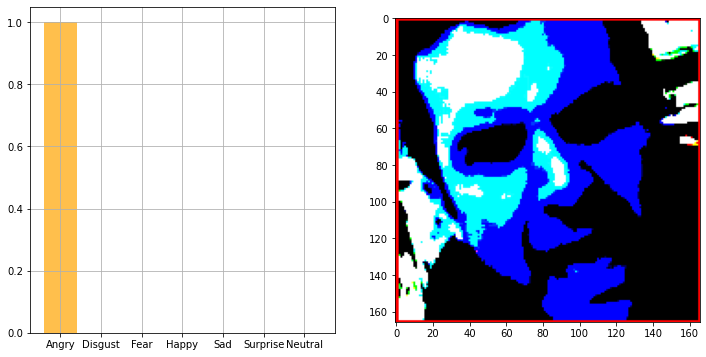

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -50.939003   -43.779      -43.68     ]
   ...
   [  33.060997    43.221       42.32     ]
   [  19.060997    29.221       28.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [   5.060997    11.221001     3.3199997]
 

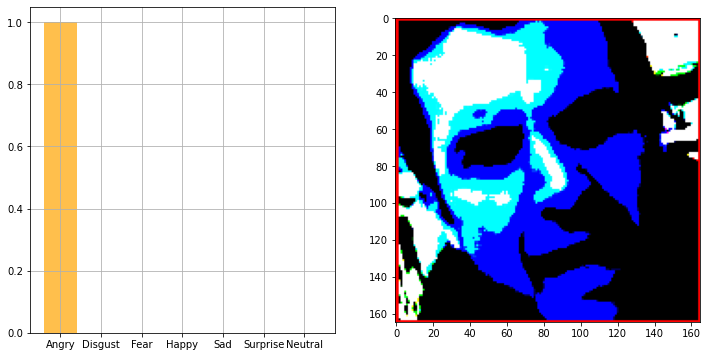

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -55.939003  -50.779     -50.68    ]
   ...
   [  92.061     101.221      96.32    ]
   [  91.061     100.221      95.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -16.939003  -10.778999  -18.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

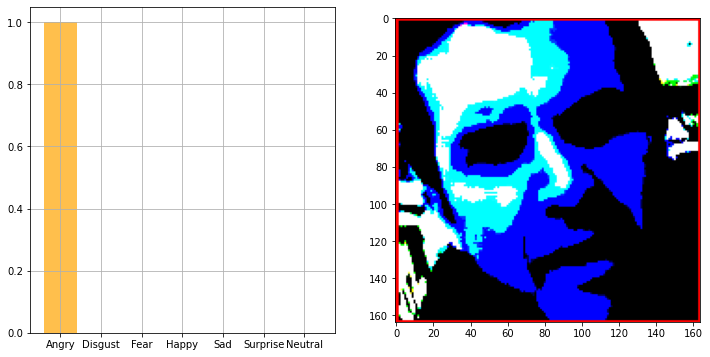

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -63.939003  -58.779     -58.68    ]
   ...
   [ 102.061     112.221     104.32    ]
   [ 103.061     113.221     105.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  31.060997   36.221      31.32    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-102.939    

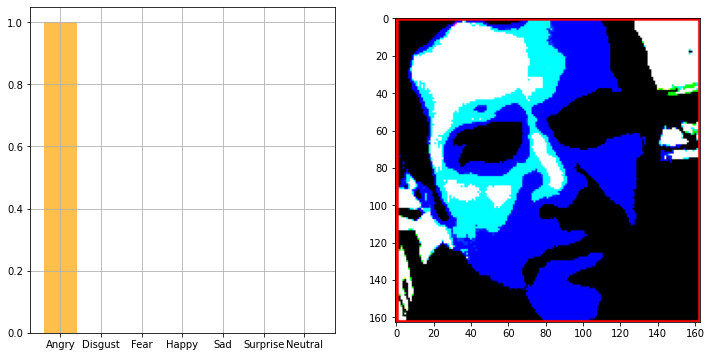

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -77.939     -77.779     -76.68    ]
   ...
   [ 116.061     123.221     118.32    ]
   [ 115.061     122.221     117.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -30.939003  -28.779     -32.68    ]
   ...
   [ -99.939    -113.779    -118.68    ]
   [ -99.939    

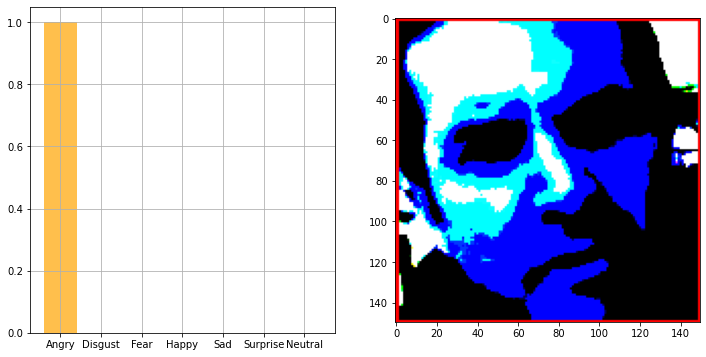

[[1.6845554e-11 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -73.939     -72.779     -74.68    ]
   ...
   [ 111.061     119.221     116.32    ]
   [ 108.061     114.221     111.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -49.939003  -47.779  

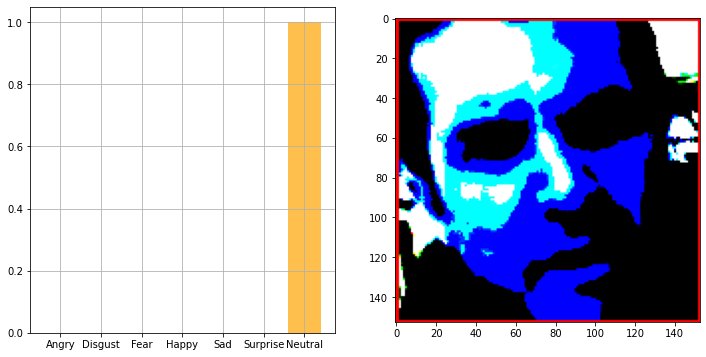

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -73.939     -69.779     -72.68    ]
   ...
   [  46.060997   61.221      66.32    ]
   [  43.060997   58.221      63.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -32.939003  -27.779     -32.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

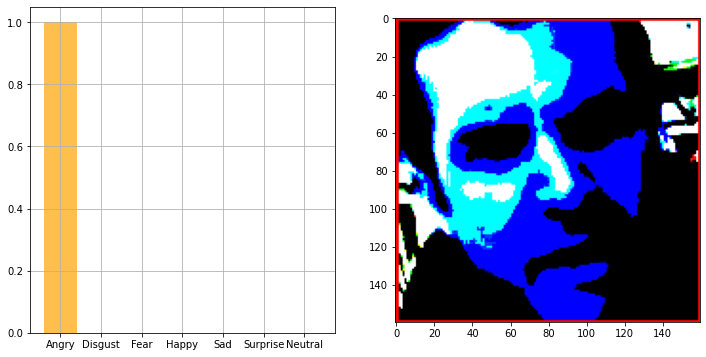

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -72.939      -72.779      -76.68     ]
   ...
   [  39.060997    60.221       61.32     ]
   [  41.060997    62.221       63.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -13.939003   -13.778999   -17.68     ]
 

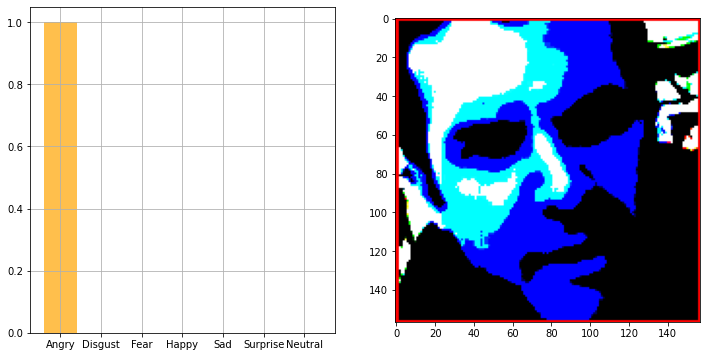

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 4.1892770e-10 0.0000000e+00
  0.0000000e+00 1.0832405e-28]]
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -1

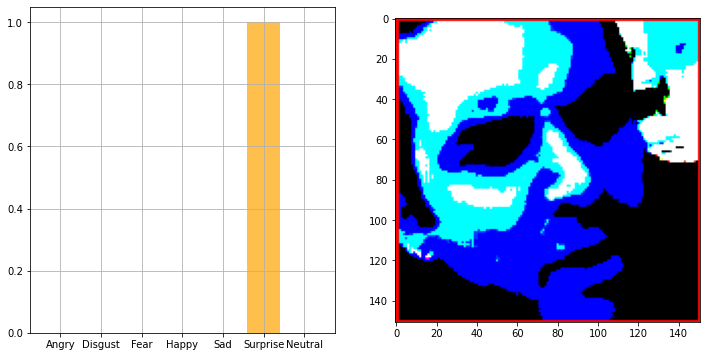

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -66.939     -73.779     -71.68    ]
   ...
   [  12.060997   12.221001  -12.68    ]
   [  25.060997   31.221      10.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -41.939003  -48.779     -51.68    ]
   ...
   [-102.939 

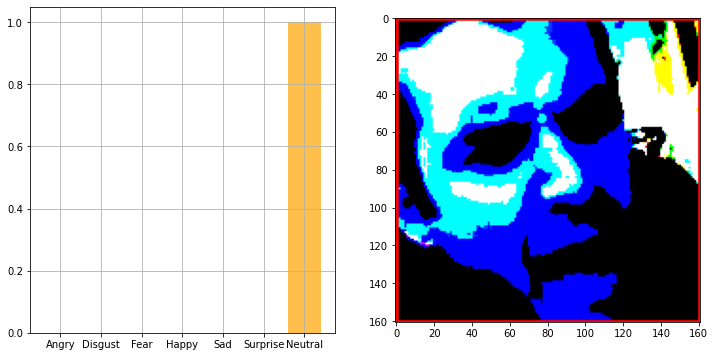

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -56.939003  -59.779     -49.68    ]
   ...
   [  56.060997   71.221      55.32    ]
   [  54.060997   75.221      63.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -87.779     -92.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

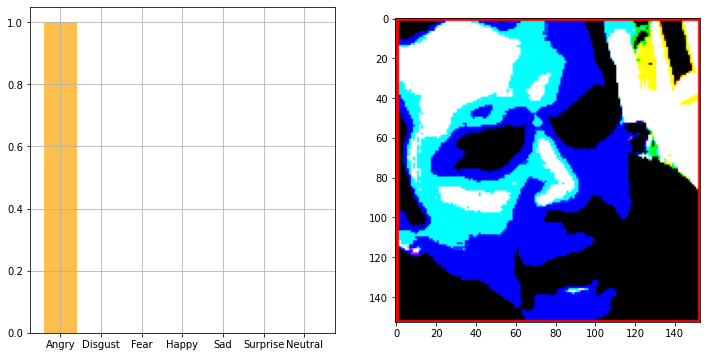

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -74.779     -70.68    ]
   ...
   [  52.060997   81.221      72.32    ]
   [  51.060997   81.221      69.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -26.939003  -37.779     -42.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

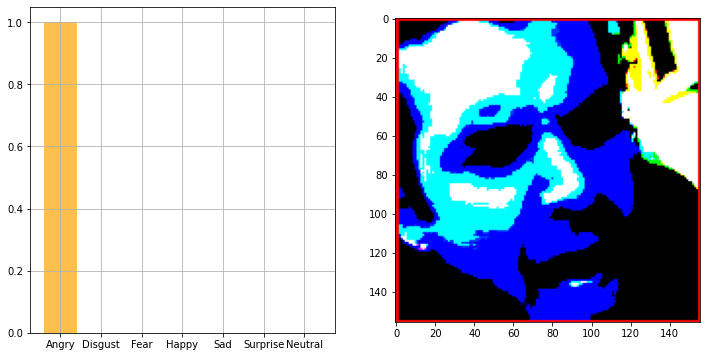

[[1.000000e+00 0.000000e+00 2.008377e-37 0.000000e+00 0.000000e+00
  0.000000e+00 0.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -74.779     -75.68    ]
   ...
   [ -16.939003  -21.779     -52.68    ]
   [ -21.939003  -26.779     -57.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -27.939003  -38.779     -43.

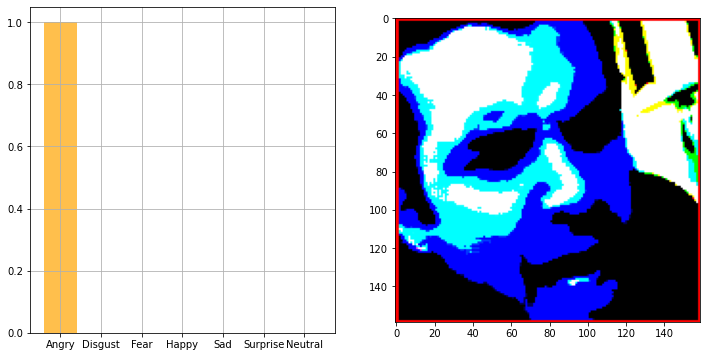

[[0.99890816 0.         0.00109182 0.         0.         0.
  0.        ]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -66.939     -68.779     -60.68    ]
   ...
   [  40.060997   48.221      20.32    ]
   [  34.060997   54.221      29.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -71.939     -85.779     -90.68    ]
   ...
   [-10

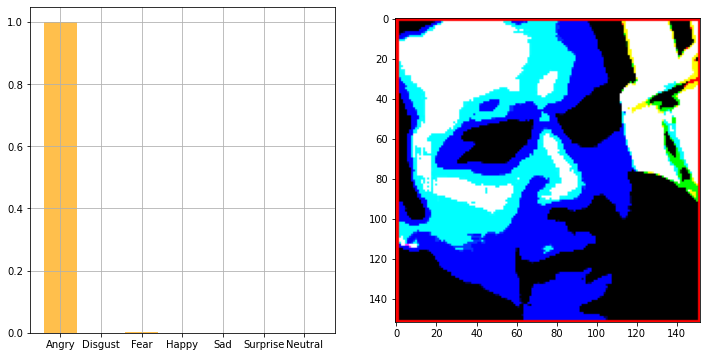

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -69.939      -74.779      -72.68     ]
   ...
   [  -9.939003    41.221        6.3199997]
   [ -10.939003    37.221        4.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -37.939003   -51.779      -56.68     ]
 

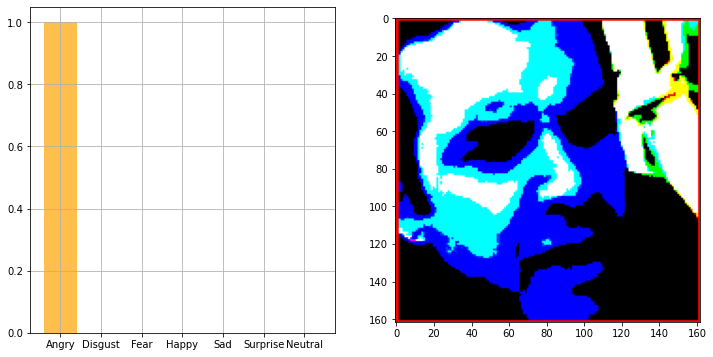

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -73.939     -77.779     -78.68    ]
   ...
   [  11.060997   50.221      22.32    ]
   [   6.060997   45.221      17.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -36.939003  -50.779     -55.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-100.939    

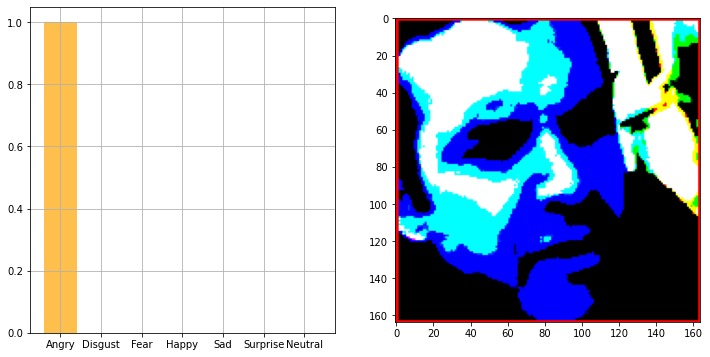

[[1.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 2.299721e-35]]
HERE
tf.Tensor(
[[[[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [-3.2939003e+01 -3.0778999e+01 -2.6800003e+00]
   ...
   [-2.9390030e+00  5.5221001e+01  1.9320000e+01]
   [ 6.0997009e-02  5.8221001e+01  2.2320000e+01]
   [ 1.51061

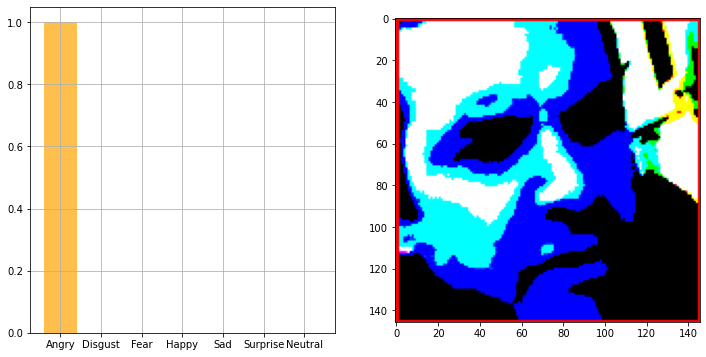

[[1.0000000e+00 0.0000000e+00 3.9704738e-26 0.0000000e+00 1.6417756e-20
  0.0000000e+00 9.2033248e-18]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -75.939      -80.779      -83.68     ]
   ...
   [   1.060997    32.221       -3.6800003]
   [ -20.939003    10.221001   -25.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

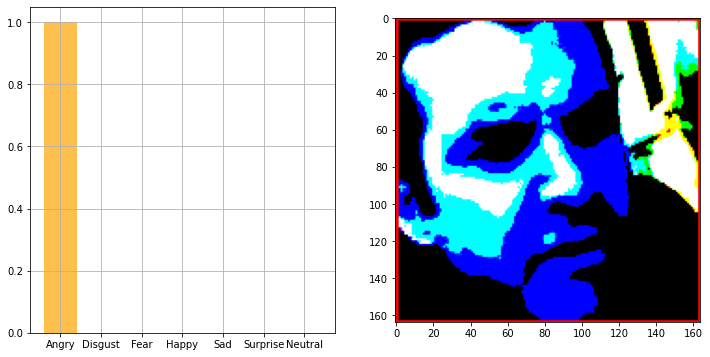

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   ...
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  [[ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]
   [-6.1939003e+01 -6.8778999e+01 -6.6680000e+01]
   ...
   [ 6.0997009e-02  6.0221001e+01  2.4320000e+01]
   [ 3.0609970e+00  5.9221001e+01  2.3320000e+01]
   [ 1.5106100e+02 -1.1677900e+02 -1.2368000e+02]]

  ...

  [[ 1.5106100e+02 -1.167

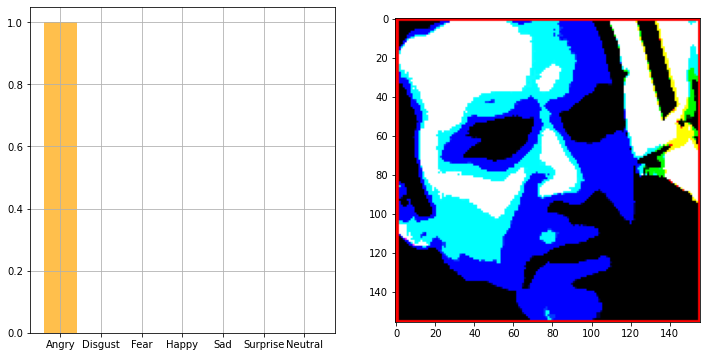

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -64.939     -70.779     -64.68    ]
   ...
   [  64.061      88.221      51.32    ]
   [  55.060997   89.221      50.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -67.939     -78.779     -83.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -99.939    

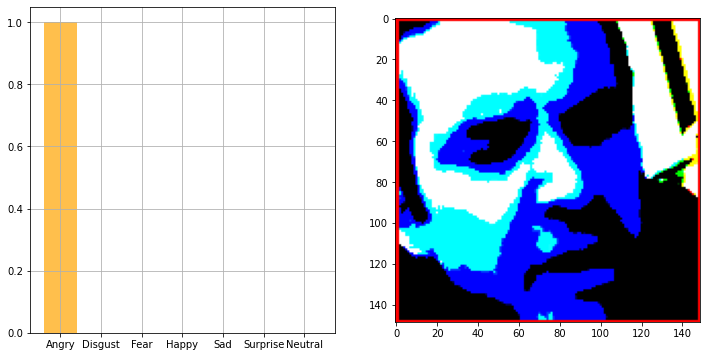

[[0.0000000e+00 0.0000000e+00 2.3404556e-15 0.0000000e+00 2.1570638e-10
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -68.939  -73.779  -71.68 ]
   ...
   [  77.061   92.221   63.32 ]
   [  77.061   94.221   65.32 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -65.939  -71.779  -77.68 ]
   ...
   [ -98.939 -111.779 -118.68 ]
   [ -98.939 -111.779 -118.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 

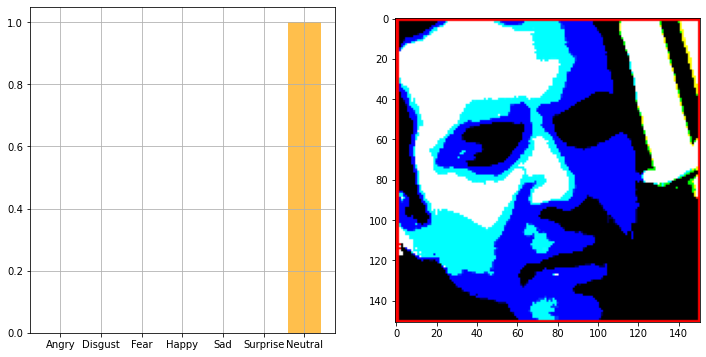

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -73.779     -71.68    ]
   ...
   [ -20.939003  -24.779     -50.68    ]
   [ -23.939003  -27.779     -53.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -61.939003  -65.779     -71.68    ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -95.939    

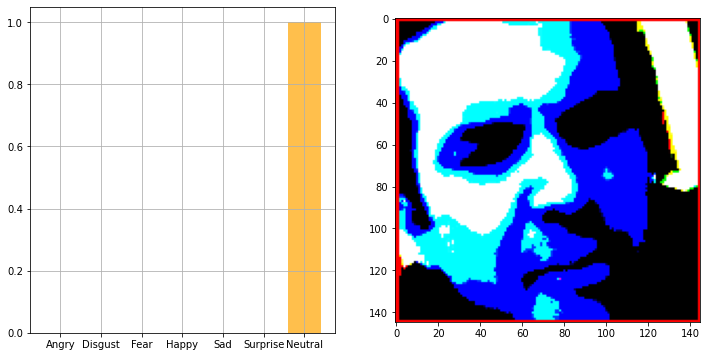

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -45.939003  -35.779     -36.68    ]
   ...
   [ -17.939003  -10.778999  -29.68    ]
   [ -23.939003  -20.779     -42.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -43.939003  -37.779     -35.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    

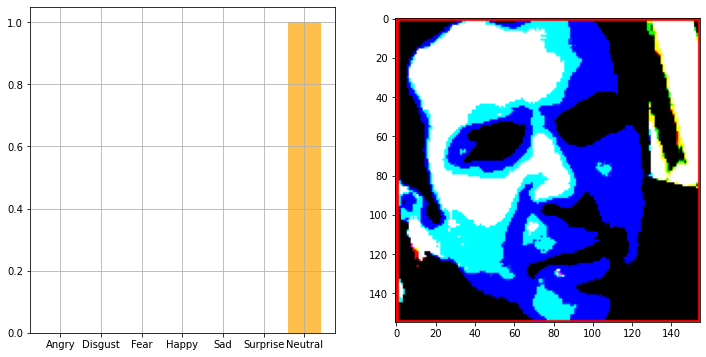

[[1.8169755e-27 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   ...
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]]

  [[ 151.061      -116.779      -123.68      ]
   [ 151.061      -116.779      -123.68      ]
   [ -42.939003    -30.779       -31.68      ]
   ...
   [  48.060997     71.221        59.32      ]
   [  40.060997     63.221        51.32      ]
   [ 151.061      -116.779      -123.68      ]]

  ...



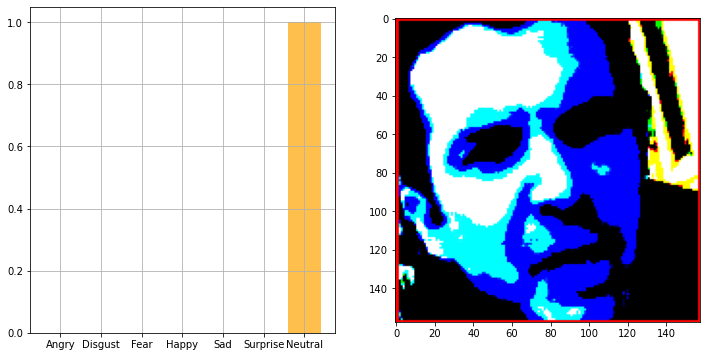

[[9.9995100e-01 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 4.9037964e-05]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -61.939003  -58.779     -58.68    ]
   ...
   [  53.060997   71.221      53.32    ]
   [  46.060997   74.221      59.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -42.939003  -36.779  

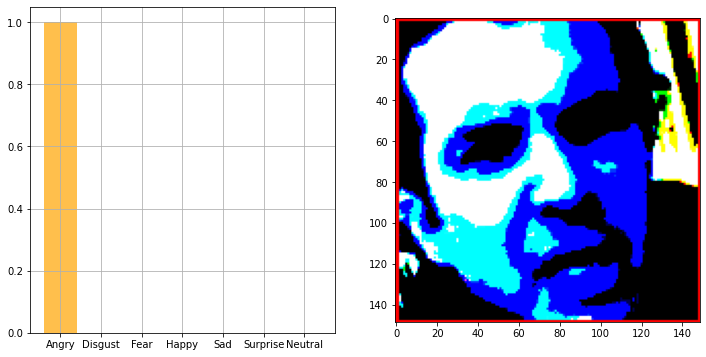

[[1.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 1.731614e-36]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -41.939003  -31.779     -32.68    ]
   ...
   [  11.060997   18.221     -13.68    ]
   [  34.060997   41.221       9.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  98.061     104.221     106.

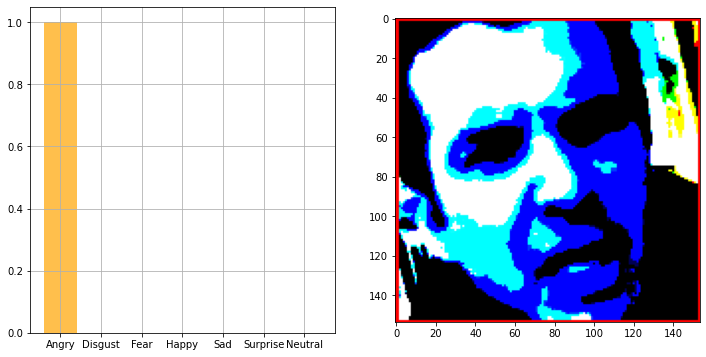

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -39.939003  -29.779     -30.68    ]
   ...
   [ -13.939003  -18.779     -49.68    ]
   [ -10.939003  -18.779     -50.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 118.061     122.221     124.32    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    

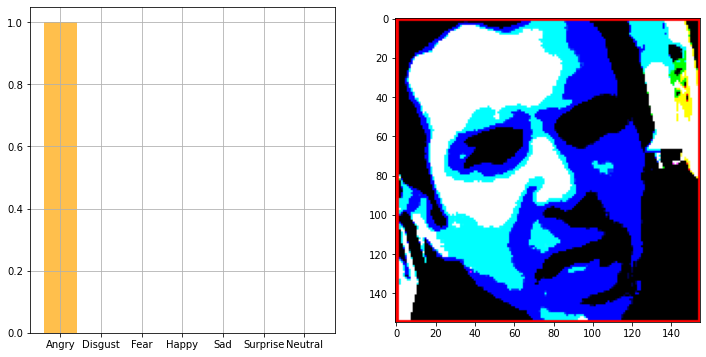

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -40.939003   -30.779      -31.68     ]
   ...
   [  -0.939003     3.2210007  -21.68     ]
   [ -14.939003   -10.778999   -35.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 126.061      127.221      125.32     ]
 

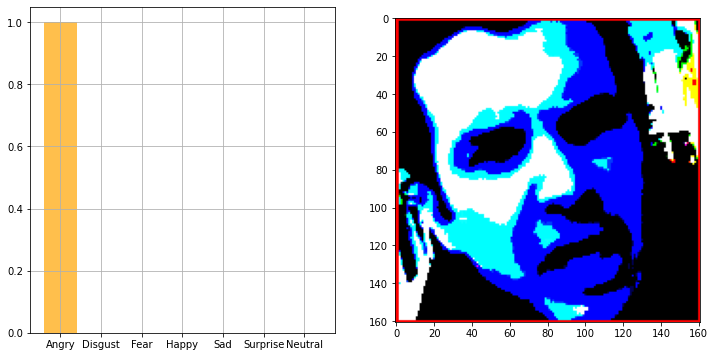

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -54.939003   -42.779      -43.68     ]
   ...
   [ -36.939003    -7.7789993   -4.6800003]
   [ -43.939003   -14.778999   -11.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 125.061      125.221      126.32     ]
 

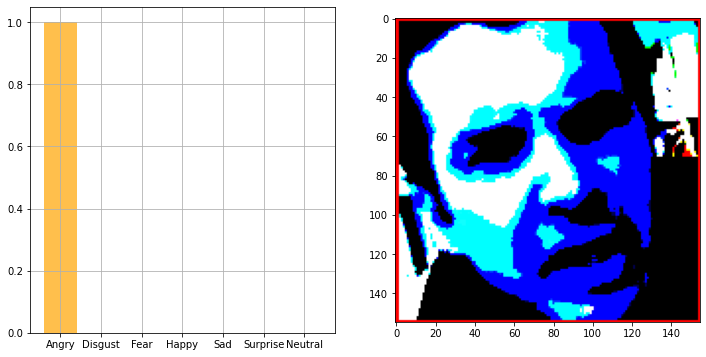

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -63.939003  -60.779     -60.68    ]
   ...
   [   4.060997   68.221      88.32    ]
   [  17.060997   67.221      87.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 123.061     123.221     124.32    ]
   ...
   [-100.939    -114.779    -119.68    ]
   [-100.939    

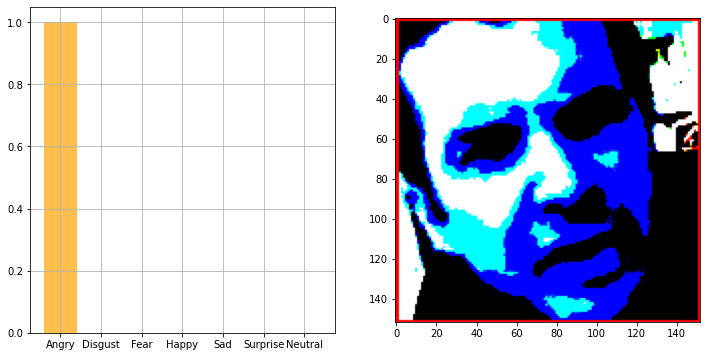

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.6922129e-34]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -48.939003  -36.779     -37.68    ]
   ...
   [ -38.939003   48.221      75.32    ]
   [ -45.939003   45.221      70.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 127.061     129.22101

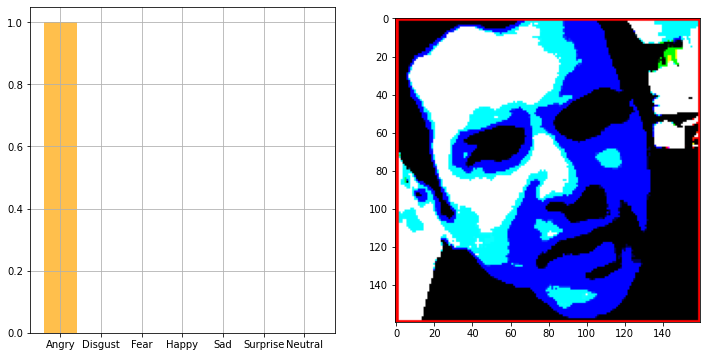

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -62.939003  -52.779     -53.68    ]
   ...
   [ -68.939      30.221      55.32    ]
   [ -66.939      32.221      57.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 127.061     130.22101   123.32    ]
   ...
   [-102.939    -116.779    -119.68    ]
   [-102.939    

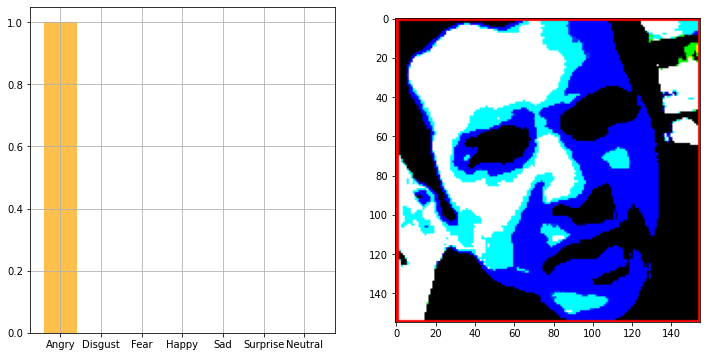

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -65.939     -68.779     -65.68    ]
   ...
   [ -39.939003   31.221      51.32    ]
   [ -46.939003   30.221      52.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 116.061     119.221     119.32    ]
   ...
   [-102.939    -116.779    -119.68    ]
   [-102.939    

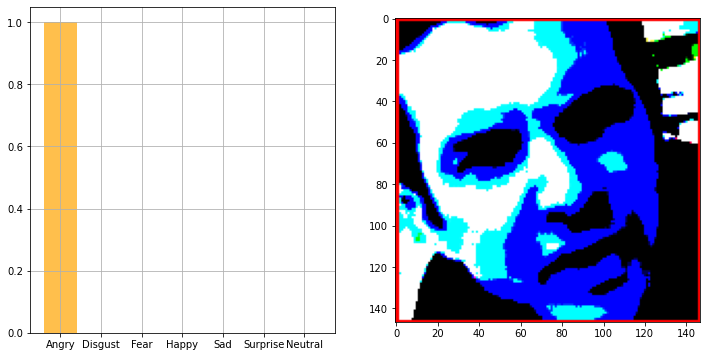

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -65.939      -63.779      -61.68     ]
   ...
   [-103.939        6.2210007   45.32     ]
   [-103.939       -6.7789993   32.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 126.061      129.22101    122.32     ]
 

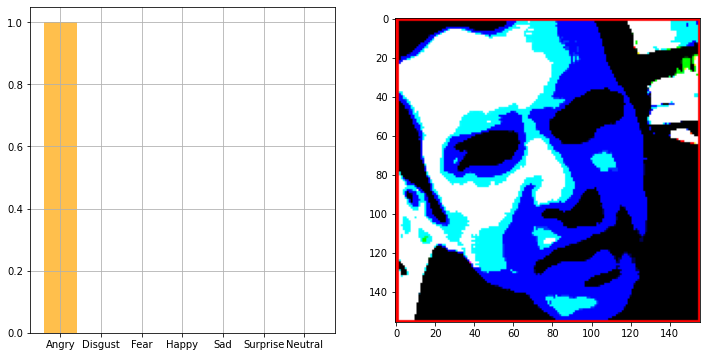

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -67.939  -68.779  -65.68 ]
   ...
   [ -91.939   32.221   65.32 ]
   [ -87.939   36.221   69.32 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [  92.061   90.221   91.32 ]
   ...
   [-100.939 -114.779 -119.68 ]
   [-100.939 -114.779 -119.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 103.061  101.221  102.32 ]
   ...
   [-100.939 -113.779 -120.68 ]
   [-100.939 

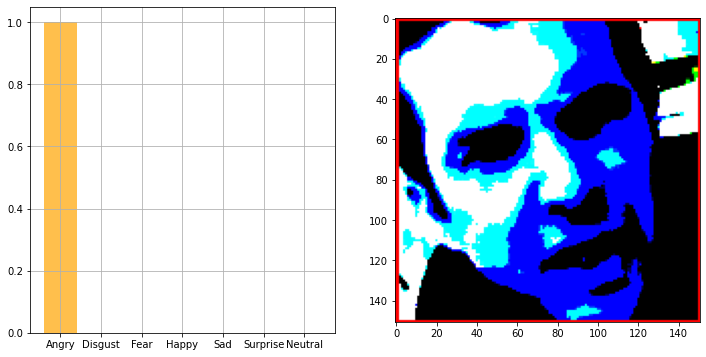

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -61.939003  -57.779     -55.68    ]
   ...
   [ -96.939      52.221      97.32    ]
   [-100.939      52.221      98.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  18.060997   21.221      21.32    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    

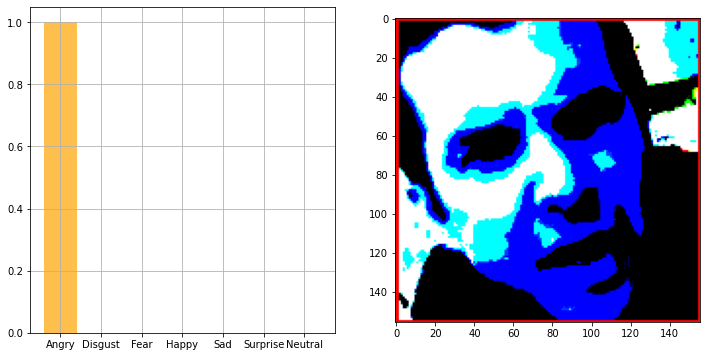

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -56.939003  -52.779     -50.68    ]
   ...
   [ -55.939003   35.221      68.32    ]
   [ -51.939003   39.221      72.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  21.060997   28.221      28.32    ]
   ...
   [ -99.939    -116.779    -118.68    ]
   [ -98.939    

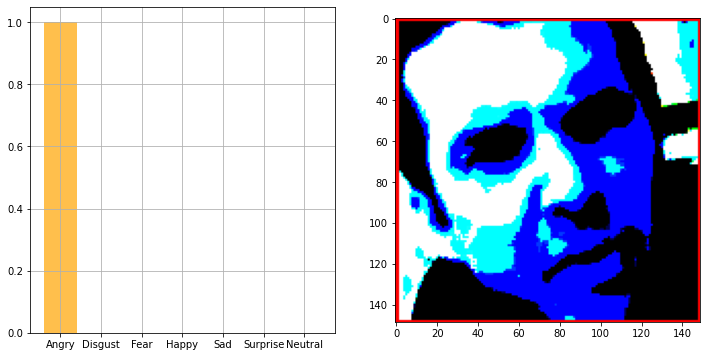

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -64.939      -64.779      -63.68     ]
   ...
   [ -27.939003    58.221       72.32     ]
   [ -30.939003    55.221       69.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  -0.939003    10.221001    11.32     ]
 

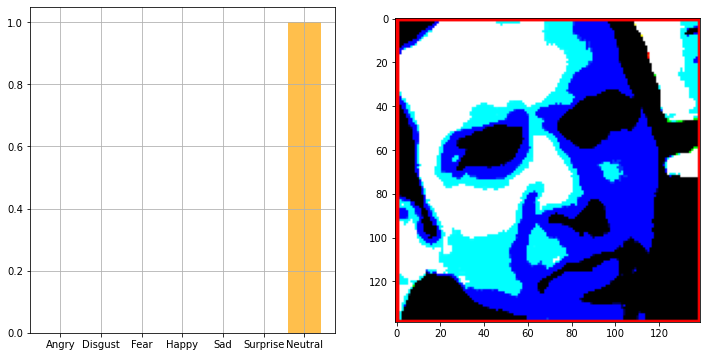

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -61.939003  -59.779     -57.68    ]
   ...
   [ -30.939003   56.221      67.32    ]
   [ -37.939003   49.221      67.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -56.939003  -45.779     -42.68    ]
   ...
   [-100.939    -112.779    -114.68    ]
   [ -98.939    

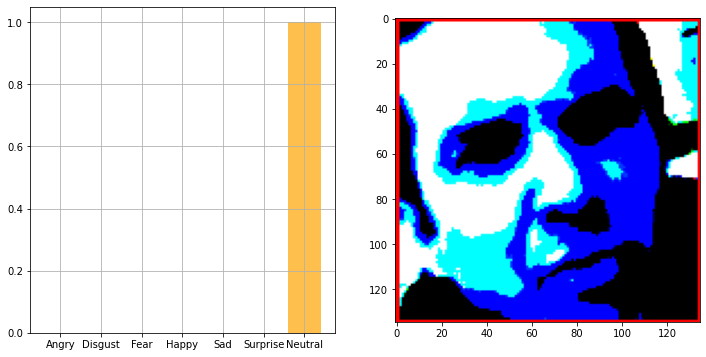

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -60.939003  -57.779     -57.68    ]
   ...
   [ -66.939      23.221      52.32    ]
   [ -73.939      12.221001   46.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [   6.060997   17.221      18.32    ]
   ...
   [ -97.939    -111.779    -116.68    ]
   [ -97.939    

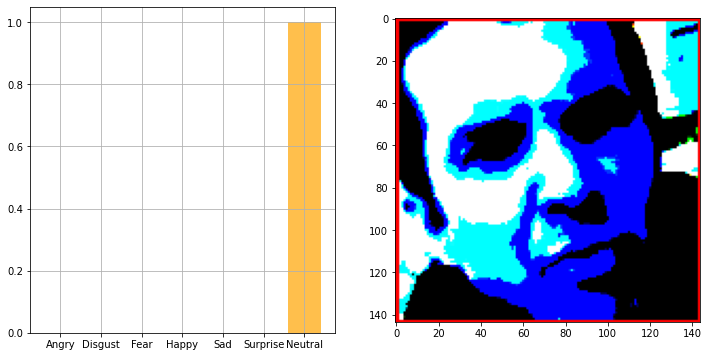

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -61.939003  -62.779     -59.68    ]
   ...
   [ -68.939      44.221      83.32    ]
   [ -68.939      44.221      83.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -51.939003  -48.779     -48.68    ]
   ...
   [ -98.939    -109.779    -114.68    ]
   [ -97.939    

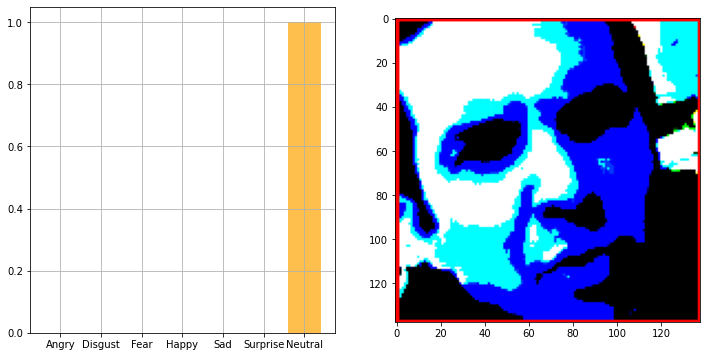

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -63.939003  -61.779     -57.68    ]
   ...
   [-102.939      50.221      96.32    ]
   [-102.939      50.221      96.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -33.939003  -28.779     -28.68    ]
   ...
   [-103.939    -116.779    -116.68    ]
   [-102.939    

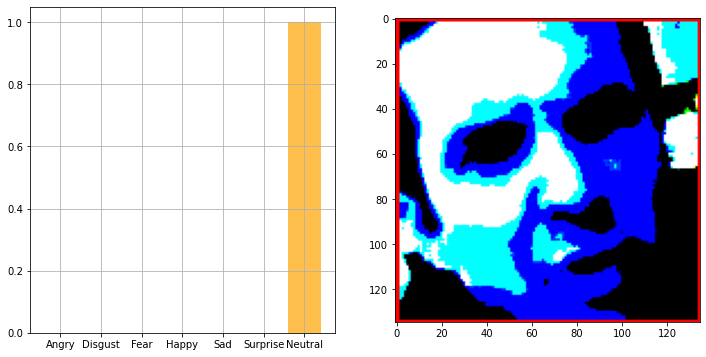

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -55.939003   -45.779      -46.68     ]
   ...
   [ -21.939003     2.2210007   14.32     ]
   [ -10.939003    13.221001    25.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  83.061       90.221       90.32     ]
 

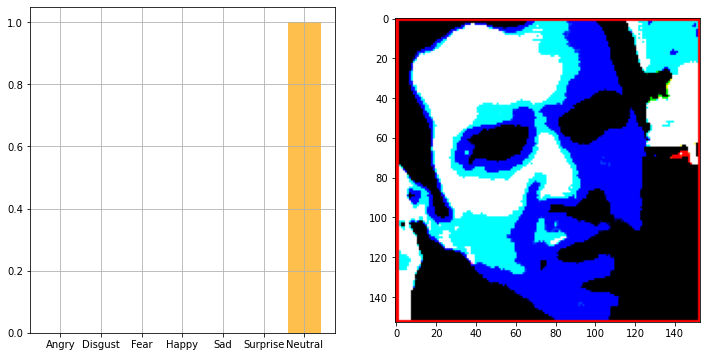

[[0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 4.750685e-37
  0.000000e+00 1.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -71.939      -67.779      -65.68     ]
   ...
   [ -35.939003    13.221001    24.32     ]
   [ -41.939003     7.2210007   18.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     

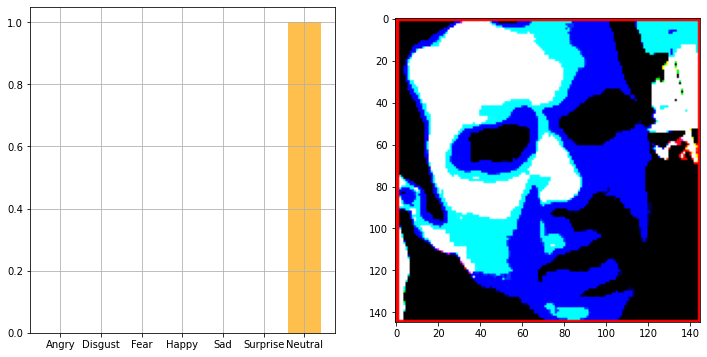

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 9.8808753e-20
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -73.779     -66.68    ]
   ...
   [ -44.939003  -21.779     -13.68    ]
   [ -38.939003  -20.779     -18.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -81.939     -79.779  

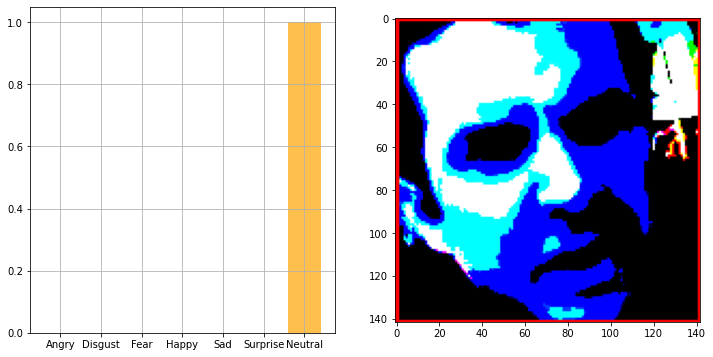

[[6.699e-38 0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -67.939     -63.779     -59.68    ]
   ...
   [ -19.939003  -20.779     -49.68    ]
   [ -16.939003  -18.779     -49.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -31.939003  -31.779     -35.68    ]
   ...
   [-101

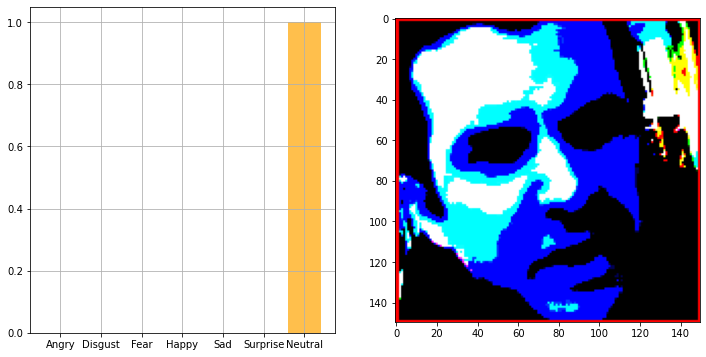

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -72.939     -67.779     -67.68    ]
   ...
   [ -15.939003  -17.779     -48.68    ]
   [ -17.939003  -19.779     -50.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -81.939     -84.779     -87.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -99.939    

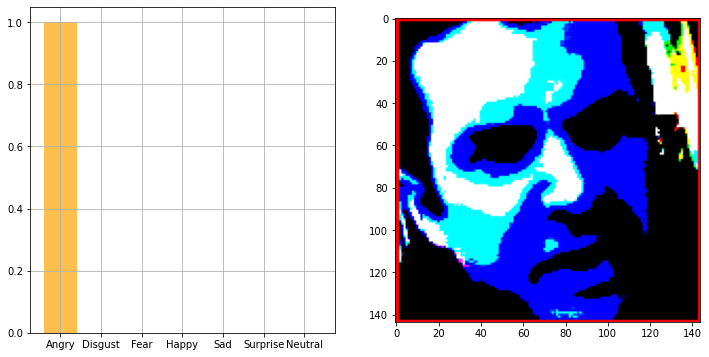

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -81.939     -77.779     -75.68    ]
   ...
   [ -10.939003  -14.778999  -40.68    ]
   [  -4.939003   -8.778999  -34.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -36.939003  -52.779     -52.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    

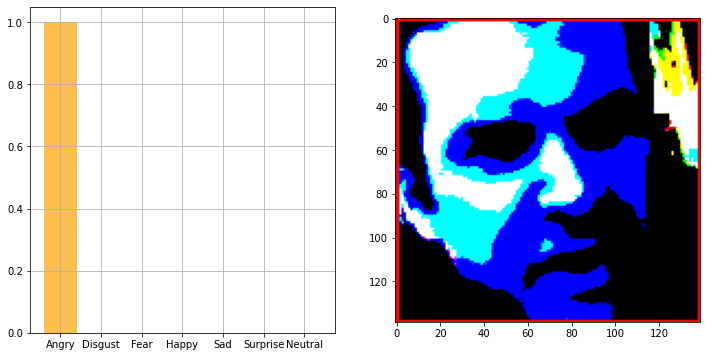

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -72.939     -67.779     -67.68    ]
   ...
   [  36.060997   61.221      50.32    ]
   [  37.060997   62.221      51.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -35.939003  -46.779     -51.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

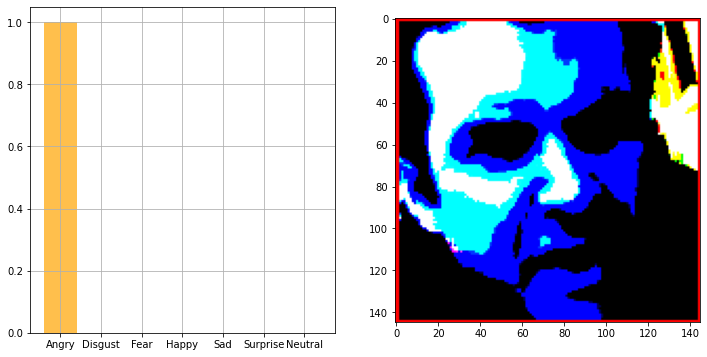

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -77.939     -70.779     -70.68    ]
   ...
   [  30.060997   61.221      52.32    ]
   [  29.060997   60.221      51.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -28.939003  -39.779     -44.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

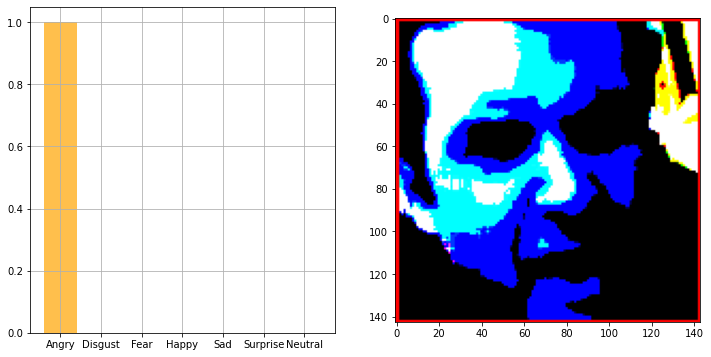

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -70.939     -65.779     -65.68    ]
   ...
   [  26.060997   62.221      57.32    ]
   [  27.060997   63.221      58.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -28.939003  -39.779     -44.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

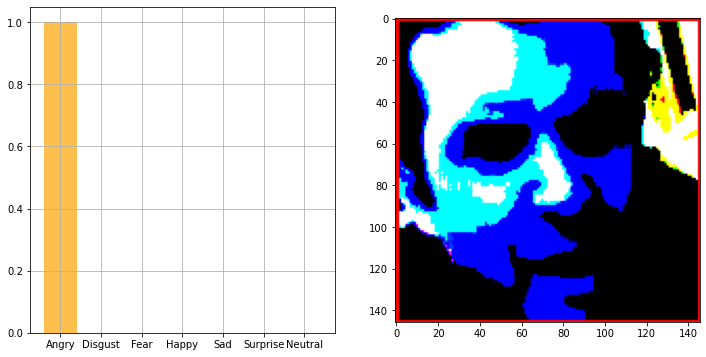

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -79.939     -73.779     -76.68    ]
   ...
   [  31.060997   43.221      23.32    ]
   [  36.060997   56.221      39.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -55.939003  -66.779     -66.68    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    

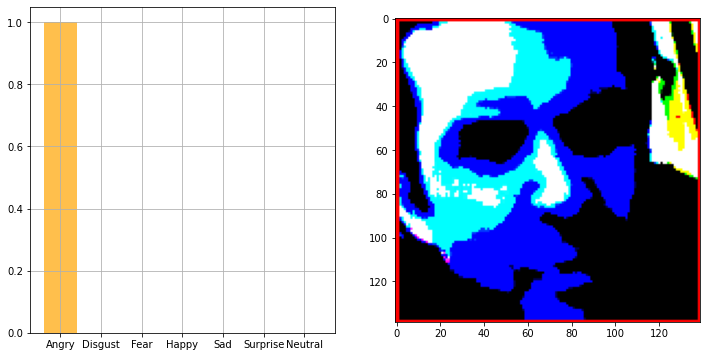

[[0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 1.187839e-35
  0.000000e+00 1.000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -75.939      -70.779      -75.68     ]
   ...
   [  -8.939003   -11.778999   -40.68     ]
   [  -2.939003    -5.7789993  -34.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     

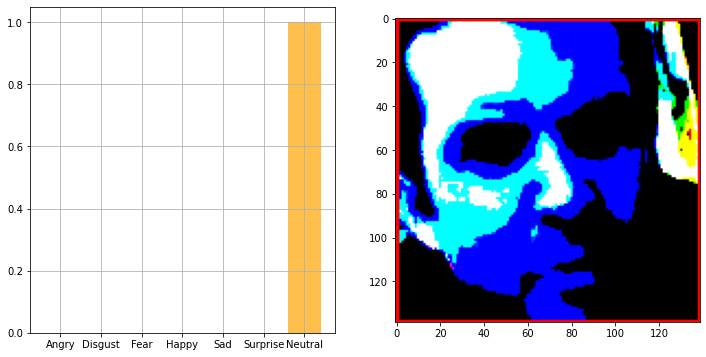

[[6.3027745e-19 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -71.939     -64.779     -69.68    ]
   ...
   [ -17.939003  -23.779     -52.68    ]
   [ -13.939003  -19.779     -48.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -78.939     -82.779  

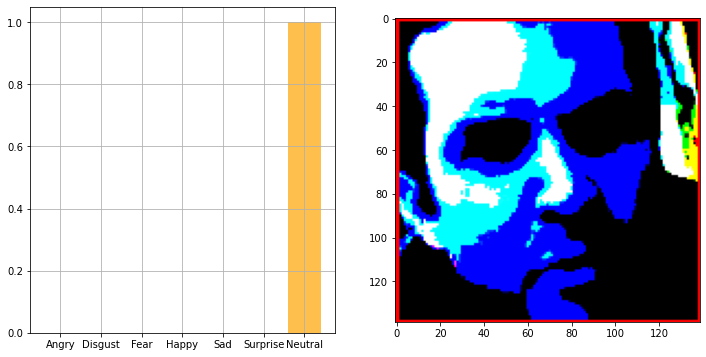

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.2342004e-36]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -79.939     -75.779     -73.68    ]
   ...
   [ -16.939003  -22.779     -51.68    ]
   [ -14.939003  -22.779     -52.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -72.939     -80.779  

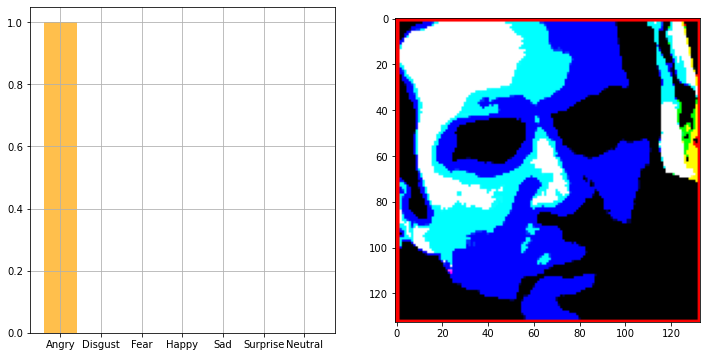

[[1.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
  0.000000e+00 3.556017e-25]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -77.939      -73.779      -76.68     ]
   ...
   [  -1.939003    -5.7789993  -31.68     ]
   [   6.060997    11.221001    -7.6800003]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     

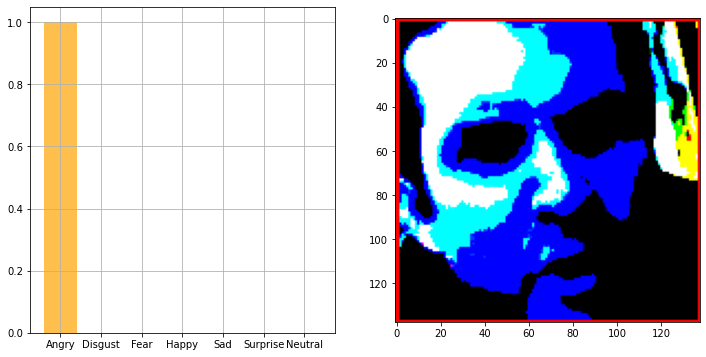

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -12.939003    -6.7789993   -9.68     ]
   ...
   [  37.060997    42.221       23.32     ]
   [  38.060997    54.221       41.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -67.939      -57.779      -58.68     ]
 

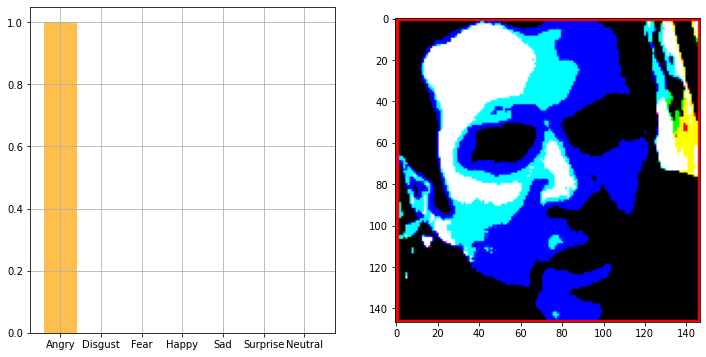

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -51.939003  -46.779     -46.68    ]
   ...
   [  24.060997   59.221      56.32    ]
   [  23.060997   58.221      55.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -70.939     -69.779     -71.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

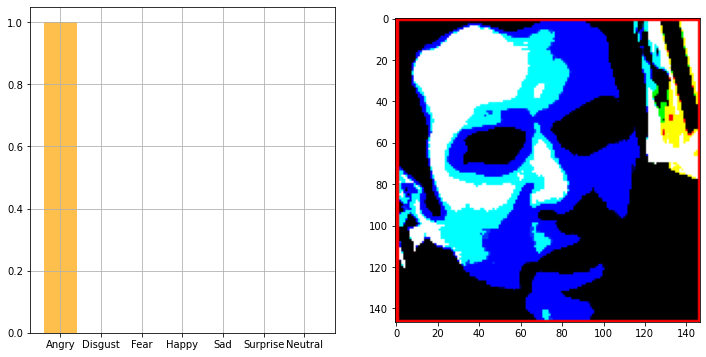

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -64.939     -59.779     -59.68    ]
   ...
   [  38.060997   61.221      47.32    ]
   [  32.060997   63.221      54.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -49.939003  -48.779     -50.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-101.939    

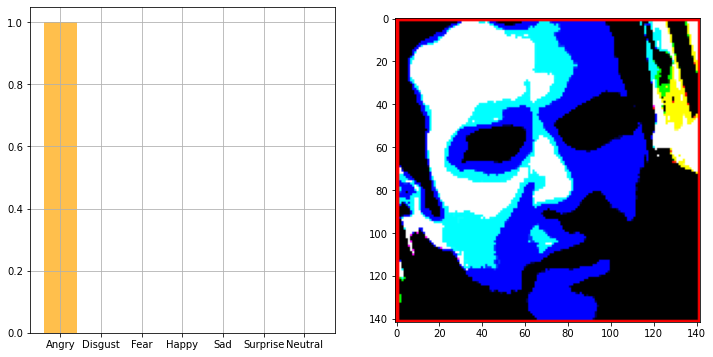

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -64.939     -59.779     -59.68    ]
   ...
   [  43.060997   54.221      32.32    ]
   [  38.060997   55.221      39.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  48.060997   54.221      51.32    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [ -99.939    

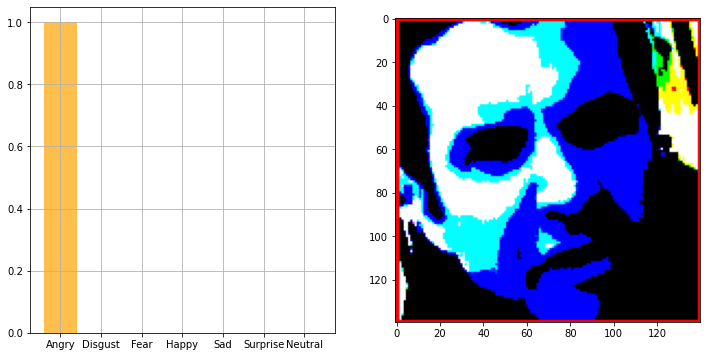

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -63.779     -63.68    ]
   ...
   [  38.060997   51.221      34.32    ]
   [  43.060997   56.221      39.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  82.061      87.221      82.32    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    

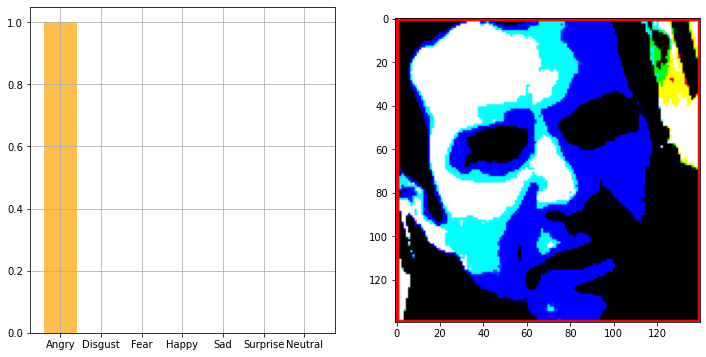

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -63.939003  -58.779     -58.68    ]
   ...
   [  39.060997   44.221      17.32    ]
   [  44.060997   54.221      34.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  99.061     106.221     101.32    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    

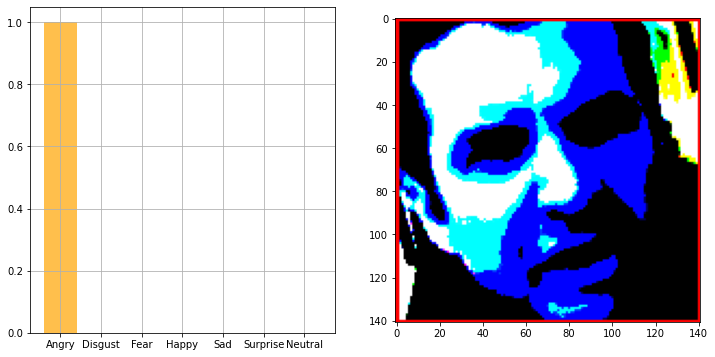

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -77.939      -73.779      -69.68     ]
   ...
   [ -16.939003   -18.779      -51.68     ]
   [  -3.939003    -5.7789993  -38.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  96.061      105.221      100.32     ]
 

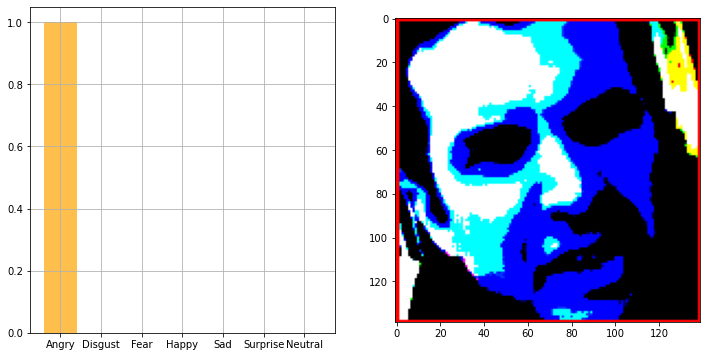

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -37.939003  -30.779     -30.68    ]
   ...
   [  37.060997   63.221      50.32    ]
   [  38.060997   64.221      51.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 111.061     120.221     115.32    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

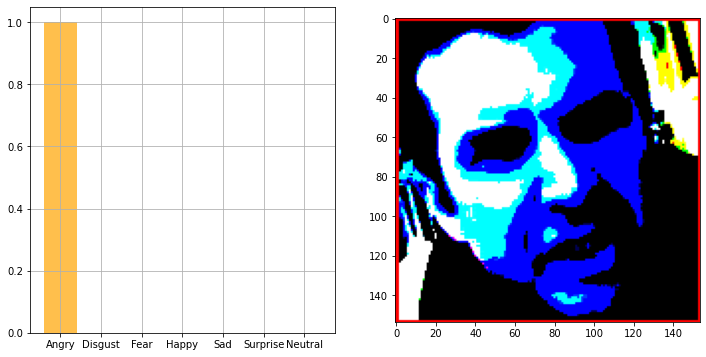

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -66.939     -65.779     -58.68    ]
   ...
   [  43.060997   46.221      14.32    ]
   [  46.060997   57.221      33.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  98.061     110.221     104.32    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

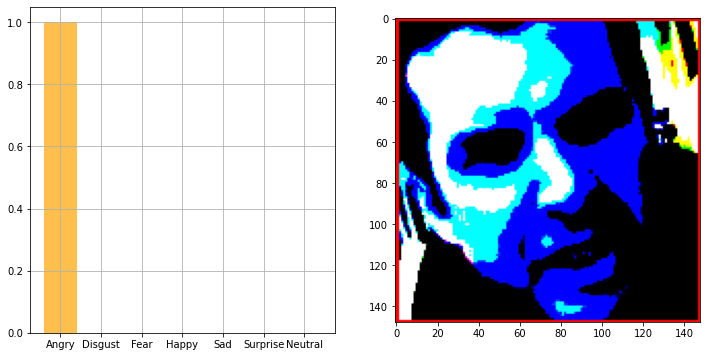

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -64.779     -60.68    ]
   ...
   [  13.060997   17.221     -12.68    ]
   [  36.060997   40.221      10.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 109.061     118.221     113.32    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

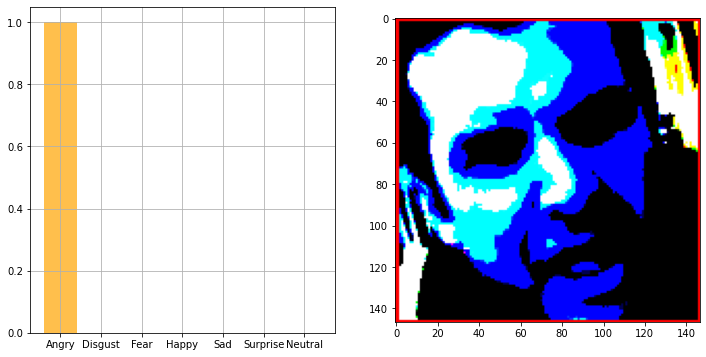

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -75.779     -68.68    ]
   ...
   [  15.060997   17.221     -12.68    ]
   [  23.060997   36.221      14.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 103.061     115.221     109.32    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

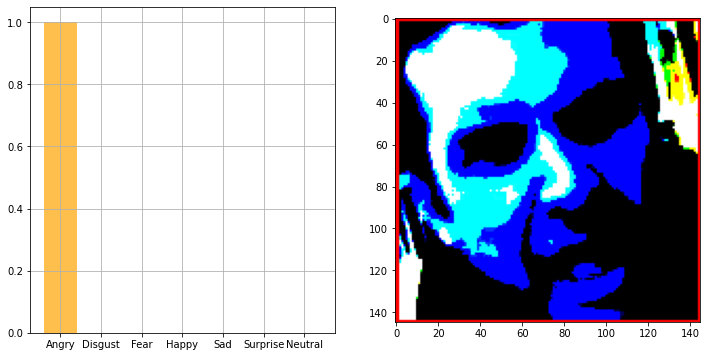

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -66.939     -60.779     -56.68    ]
   ...
   [  25.060997   61.221      51.32    ]
   [  26.060997   62.221      52.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 111.061     119.221     116.32    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

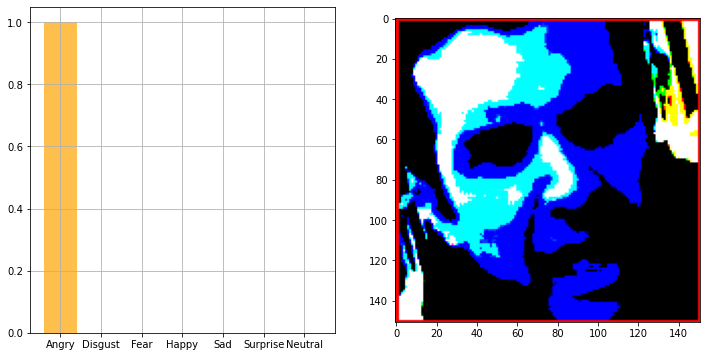

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -56.939003   -52.779      -48.68     ]
   ...
   [  12.060997    33.221       21.32     ]
   [  -8.939003     1.2210007  -13.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  91.061      101.221      100.32     ]
 

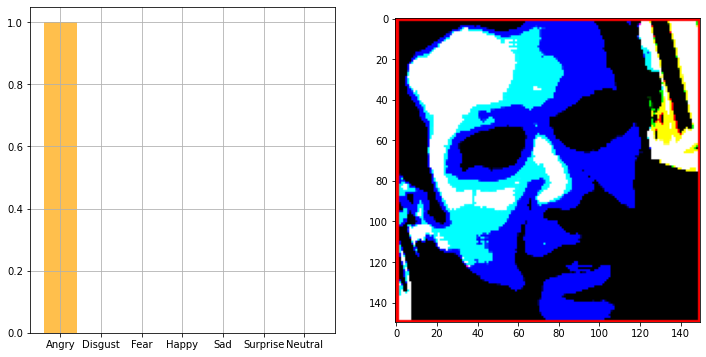

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -54.939003  -45.779     -42.68    ]
   ...
   [ -36.939003  -33.779     -55.68    ]
   [ -30.939003  -30.779     -55.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  31.060997   42.221      43.32    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

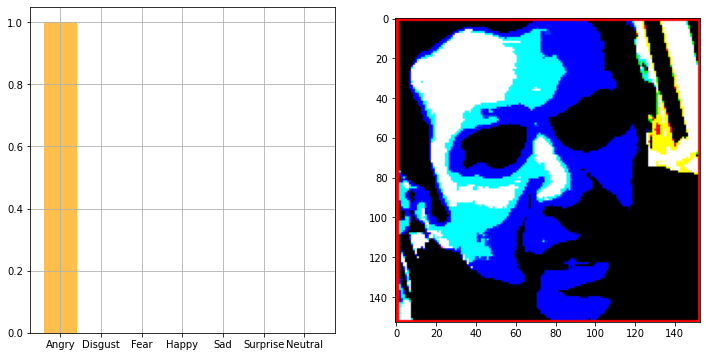

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -64.779     -60.68    ]
   ...
   [ -24.939003  -14.778999  -34.68    ]
   [ -44.939003  -34.779     -54.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  31.060997   41.221      40.32    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    

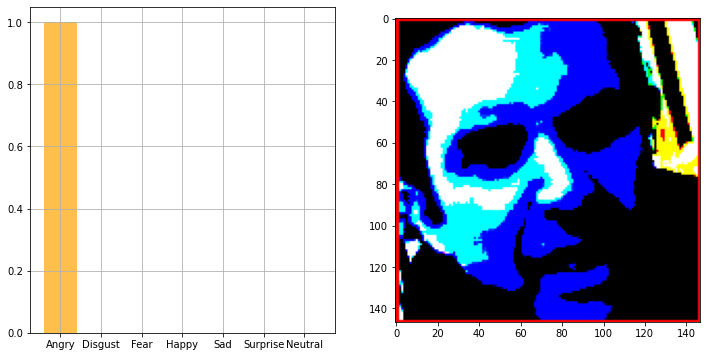

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -79.939      -77.779      -75.68     ]
   ...
   [  -6.939003     9.221001    -3.6800003]
   [ -25.939003   -19.779      -35.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -75.939      -79.779      -80.68     ]
 

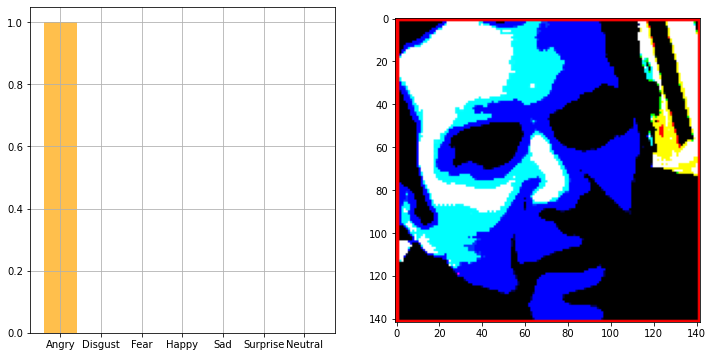

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -65.779     -65.68    ]
   ...
   [ -34.939003  -24.779     -39.68    ]
   [ -33.939003  -30.779     -50.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -74.939     -70.779     -73.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    

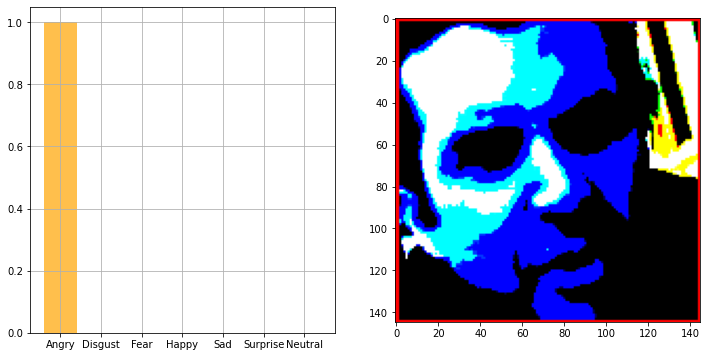

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -73.779     -73.68    ]
   ...
   [  28.060997   59.221      50.32    ]
   [  28.060997   59.221      50.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  19.060997   25.221      22.32    ]
   ...
   [ -98.939    -112.779    -117.68    ]
   [ -98.939    

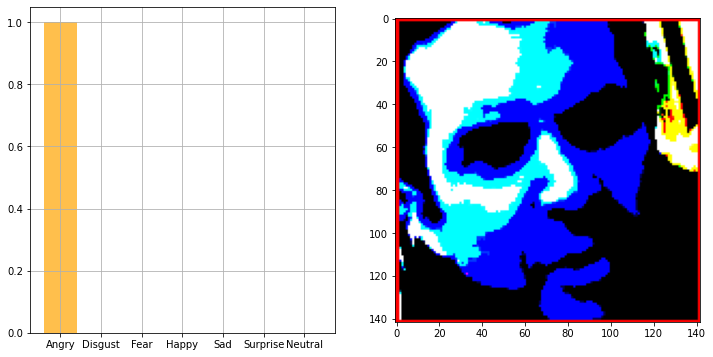

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -69.939     -67.779     -65.68    ]
   ...
   [  26.060997   52.221      44.32    ]
   [  27.060997   45.221      35.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  64.061      71.221      71.32    ]
   ...
   [ -98.939    -111.779    -118.68    ]
   [ -98.939    

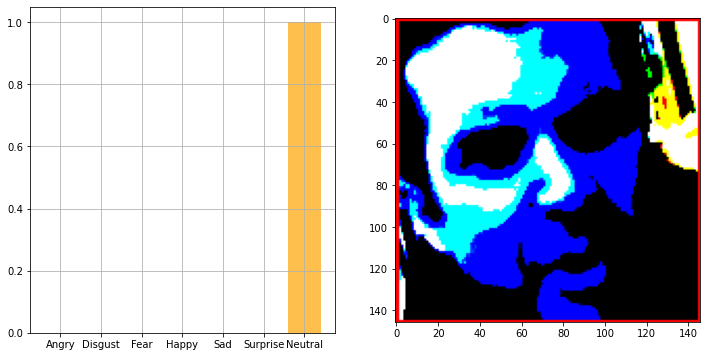

[[2.3406235e-24 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -69.939      -64.779      -64.68     ]
   ...
   [   9.060997    28.221       14.32     ]
   [ -20.939003    -1.7789993  -15.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.0

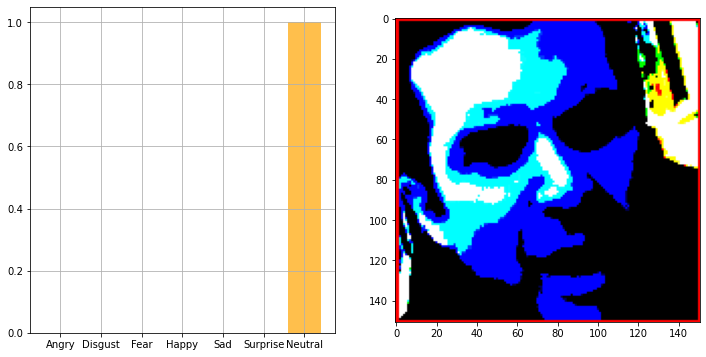

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -76.939      -68.779      -71.68     ]
   ...
   [  17.060997    48.221       39.32     ]
   [  19.060997    47.221       34.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  32.060997    35.221       28.32     ]
 

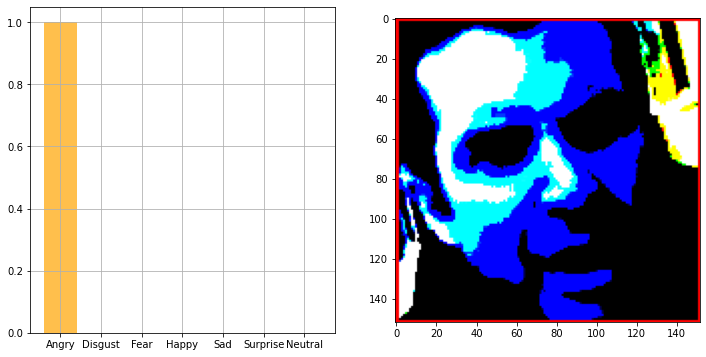

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -83.939     -80.779     -80.68    ]
   ...
   [  32.060997   54.221      37.32    ]
   [  26.060997   54.221      39.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -69.939     -69.779     -73.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    

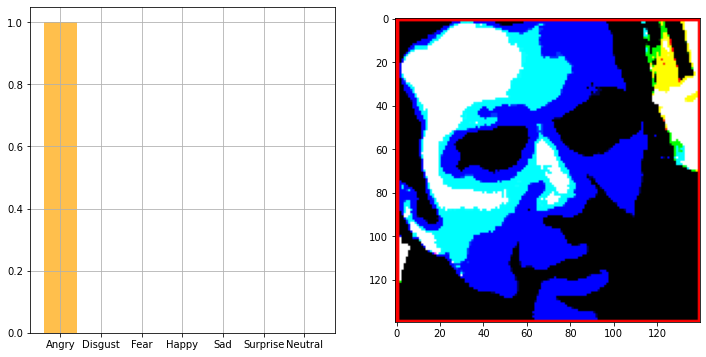

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -86.939     -81.779     -81.68    ]
   ...
   [  38.060997   49.221      25.32    ]
   [  40.060997   51.221      27.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -70.939     -68.779     -72.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

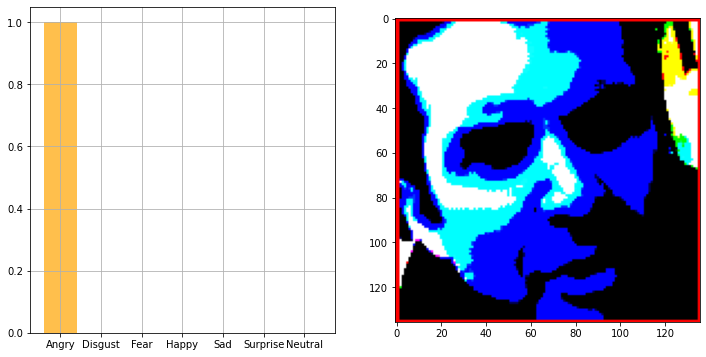

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -86.939     -82.779     -80.68    ]
   ...
   [  23.060997   47.221      30.32    ]
   [  27.060997   44.221      23.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -71.939     -71.779     -75.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [ -99.939    

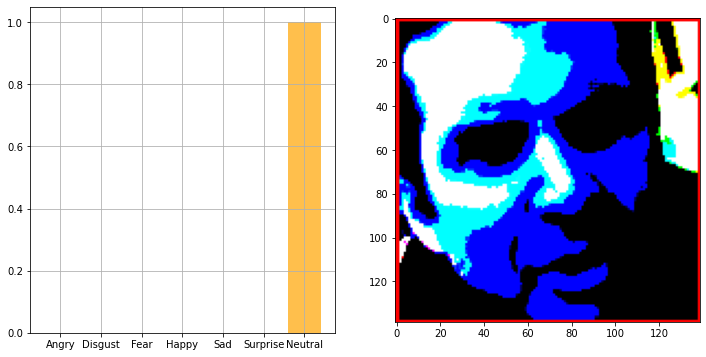

[[3.4303697e-26 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -89.939     -85.779     -88.68    ]
   ...
   [ -23.939003   -8.778999  -30.68    ]
   [ -25.939003  -19.779     -49.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -11.939003   -9.77899

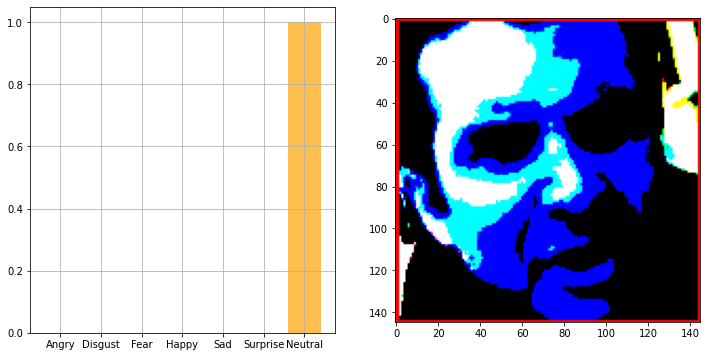

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -77.939      -77.779      -76.68     ]
   ...
   [   8.060997    14.221001   -22.68     ]
   [  32.060997    38.221        1.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -69.939      -74.779      -77.68     ]
 

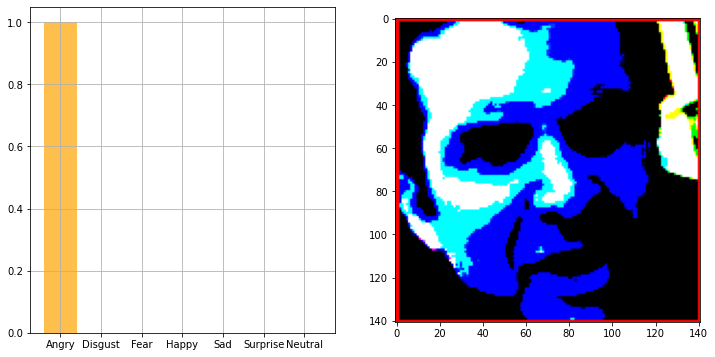

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -84.939     -83.779     -85.68    ]
   ...
   [  47.060997   65.221      26.32    ]
   [  47.060997   65.221      26.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -79.779     -82.68    ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -95.939    

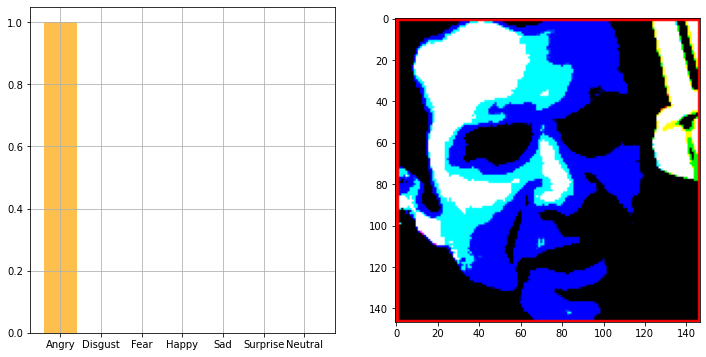

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -81.939     -75.779     -78.68    ]
   ...
   [  59.060997   61.221      31.32    ]
   [  61.060997   63.221      33.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -84.939     -82.779     -86.68    ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -98.939    

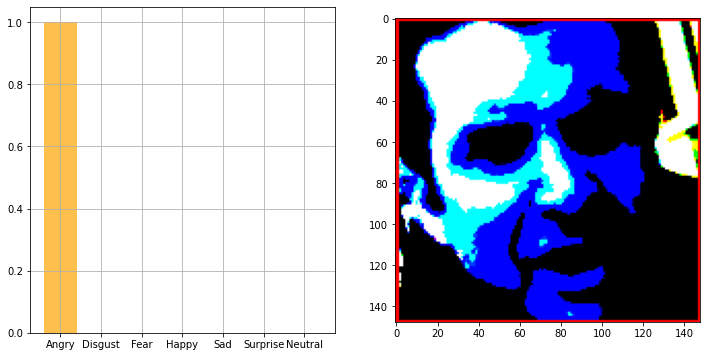

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -64.779     -67.68    ]
   ...
   [  66.061      71.221      44.32    ]
   [  68.061      73.221      46.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -77.939     -75.779     -79.68    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-100.939    

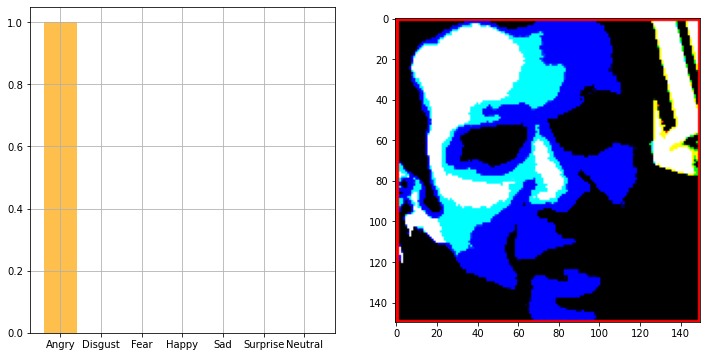

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -69.939     -66.779     -66.68    ]
   ...
   [ -34.939003  -24.779     -44.68    ]
   [ -17.939003  -14.778999  -34.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -76.779     -80.68    ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    

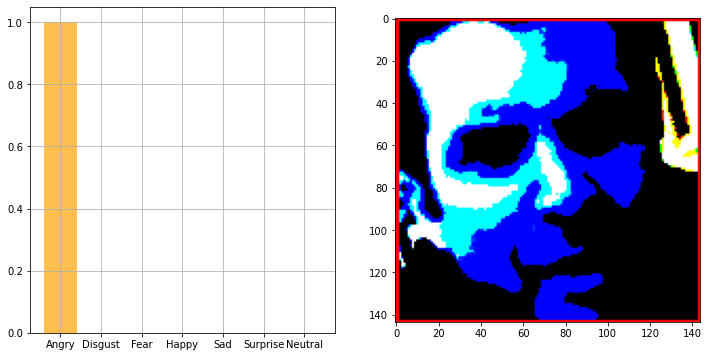

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -75.939     -70.779     -75.68    ]
   ...
   [ -37.939003  -26.779     -43.68    ]
   [ -20.939003  -17.779     -37.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -75.939     -78.779     -81.68    ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    

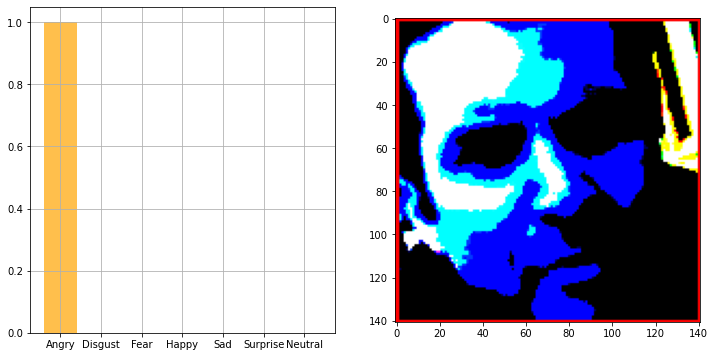

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -66.779     -70.68    ]
   ...
   [  51.060997   54.221      32.32    ]
   [  63.060997   66.221      44.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -76.779     -80.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

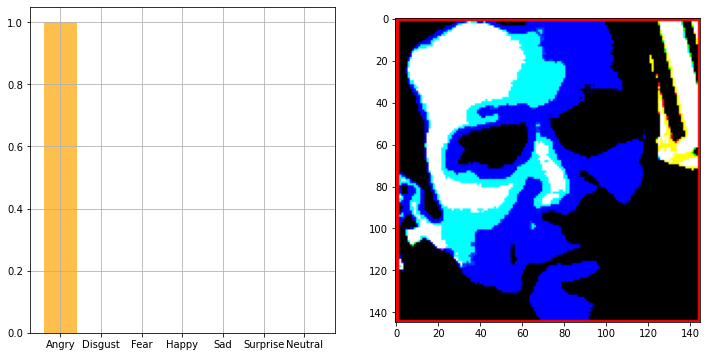

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -72.939     -67.779     -72.68    ]
   ...
   [  53.060997   61.221      38.32    ]
   [  64.061      72.221      49.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -53.939003  -52.779     -54.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [-101.939    

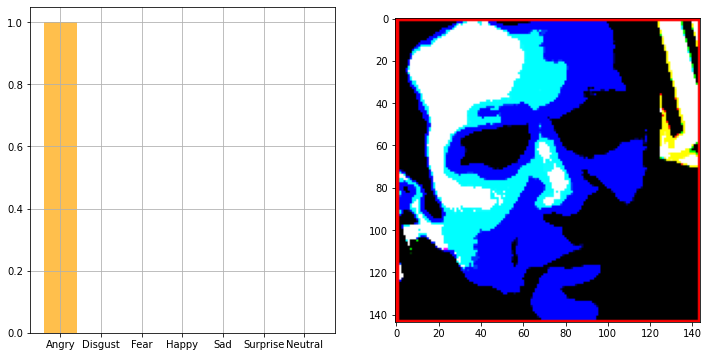

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -71.939     -70.779     -72.68    ]
   ...
   [  63.060997   72.221      46.32    ]
   [  64.061      77.221      48.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -18.939003  -17.779     -19.68    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

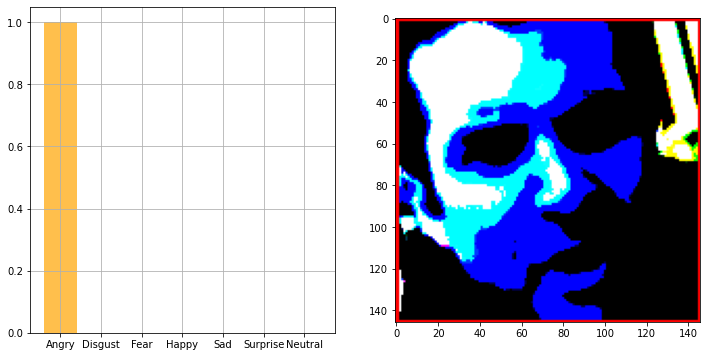

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -66.939      -61.779      -66.68     ]
   ...
   [  28.060997    52.221       17.32     ]
   [  16.060997    40.221        3.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  56.060997    63.221       58.32     ]
 

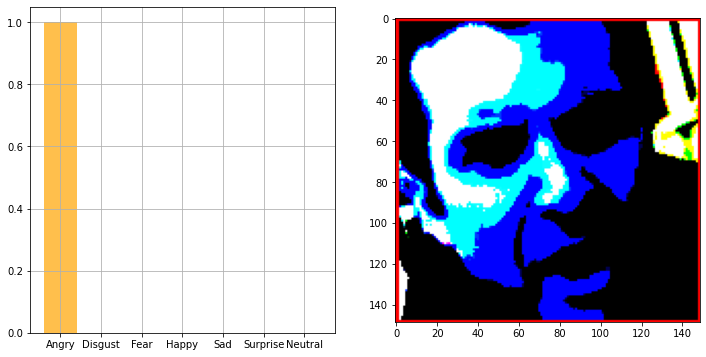

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -60.939003   -56.779      -59.68     ]
   ...
   [  16.060997    45.221        9.32     ]
   [  11.060997    40.221        4.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  91.061       98.221       93.32     ]
 

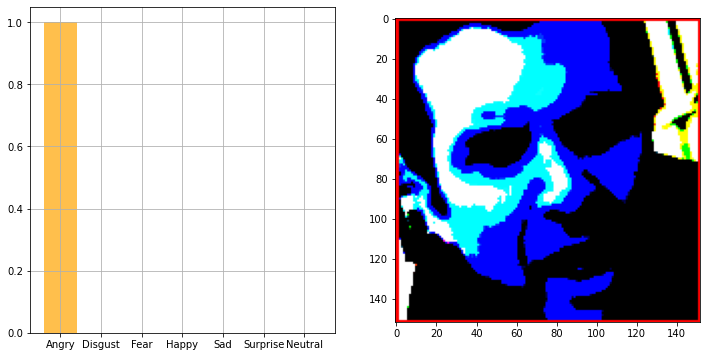

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -79.939     -76.779     -76.68    ]
   ...
   [  38.060997   61.221      21.32    ]
   [  24.060997   60.221      21.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -64.779     -67.68    ]
   ...
   [-100.939    -114.779    -119.68    ]
   [-100.939    

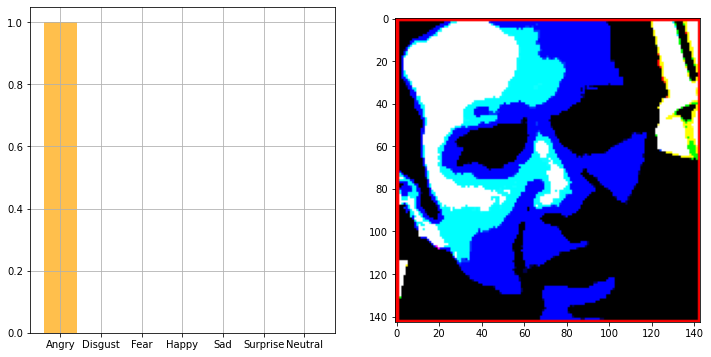

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -63.939003  -59.779     -62.68    ]
   ...
   [  19.060997   55.221      18.32    ]
   [  13.060997   49.221      12.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  97.061     105.221     102.32    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-102.939    

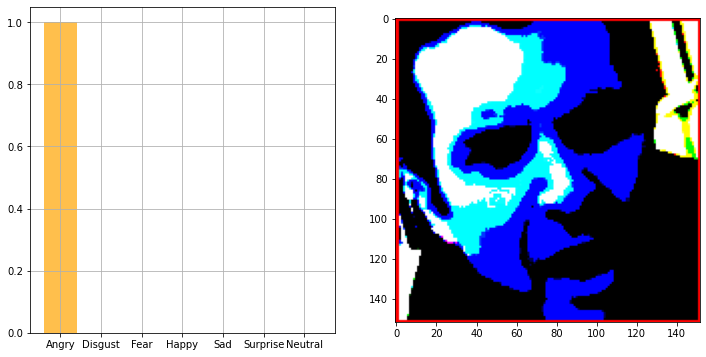

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -75.939     -75.779     -74.68    ]
   ...
   [  48.060997   60.221      25.32    ]
   [  33.060997   62.221      24.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  75.061      84.221      79.32    ]
   ...
   [-101.939    -114.779    -121.68    ]
   [-101.939    

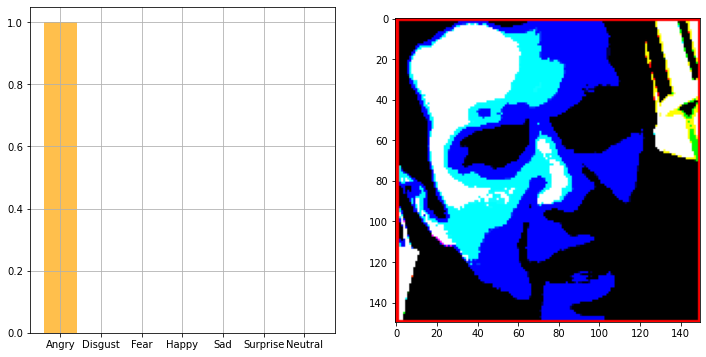

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -58.939003  -59.779     -56.68    ]
   ...
   [  45.060997   51.221      21.32    ]
   [  47.060997   57.221      24.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 100.061     108.221     105.32    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-101.939    

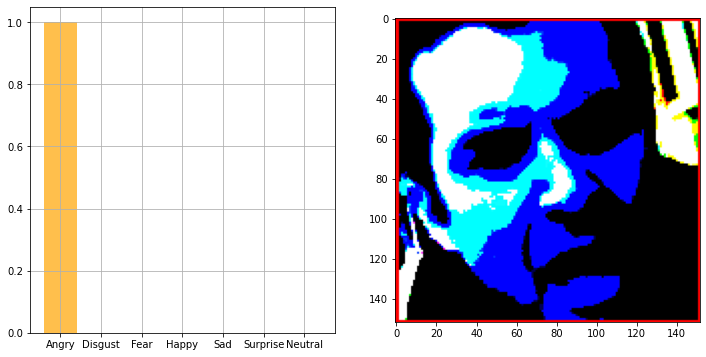

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -49.939003  -45.779     -41.68    ]
   ...
   [  37.060997   59.221      24.32    ]
   [  22.060997   49.221      13.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  74.061      83.221      78.32    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

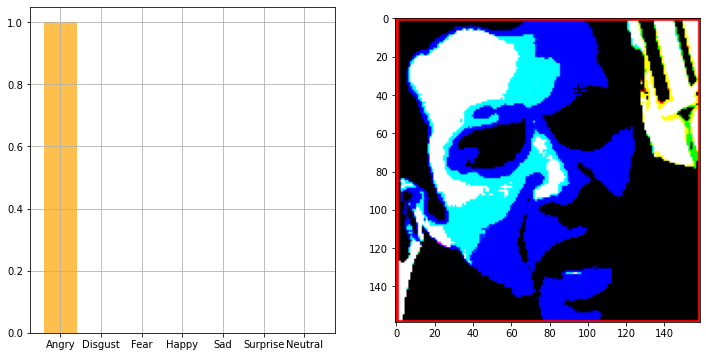

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -50.939003  -44.779     -40.68    ]
   ...
   [  58.060997   65.221      39.32    ]
   [  61.060997   68.221      42.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 102.061     111.221     106.32    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

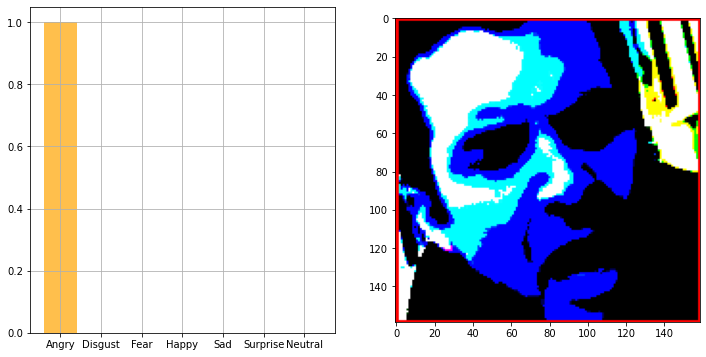

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -53.939003   -49.779      -45.68     ]
   ...
   [ -12.939003    -7.7789993  -26.68     ]
   [  31.060997    32.221       12.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 100.061      106.221      103.32     ]
 

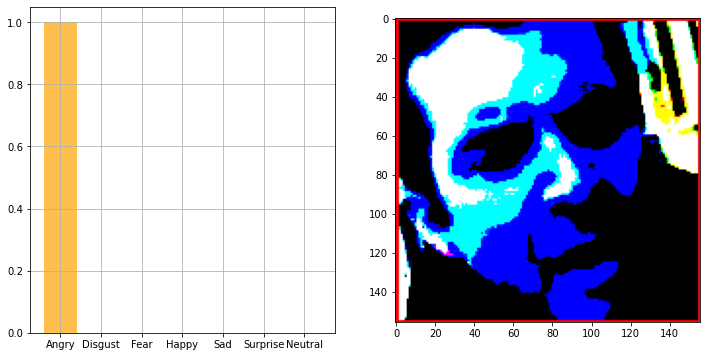

[[0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 5.4255367e-14
  0.0000000e+00 1.0000000e+00]]
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
No Face detected
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -55.939003   -55.779      -39.68     ]
   ...
   [  10.060997    25.221       -3.680000

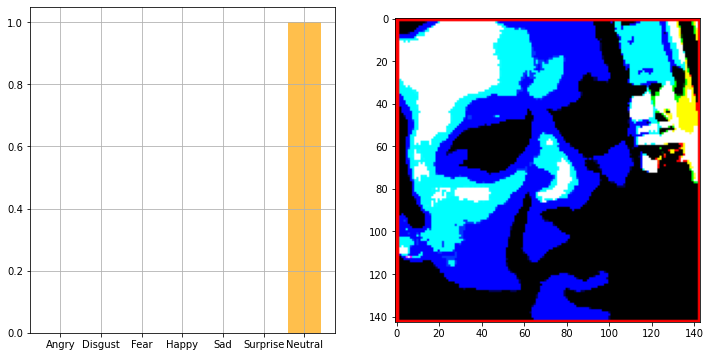

[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 7.8624256e-16]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -57.939003  -57.779     -43.68    ]
   ...
   [  30.060997   46.221      28.32    ]
   [  21.060997   49.221      36.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -84.939     -95.779  

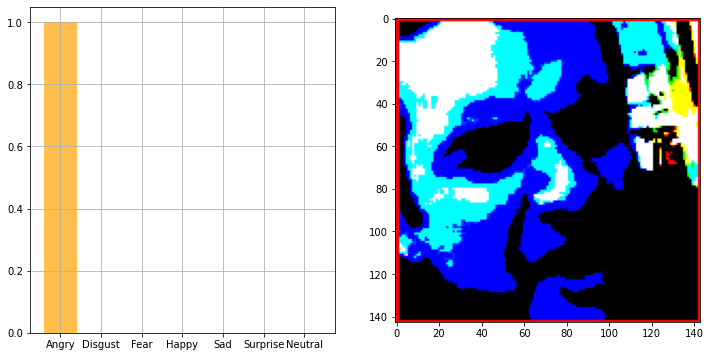

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -74.939     -75.779     -72.68    ]
   ...
   [  22.060997   53.221      39.32    ]
   [  20.060997   51.221      37.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -80.779     -82.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

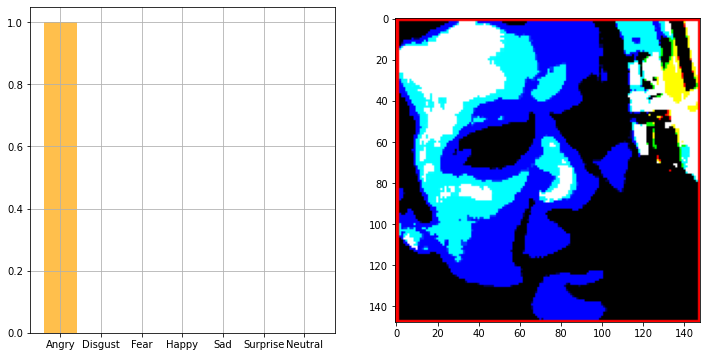

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -77.939     -79.779     -78.68    ]
   ...
   [ -22.939003  -10.778999  -30.68    ]
   [ -37.939003  -25.779     -45.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -37.939003  -47.779     -49.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

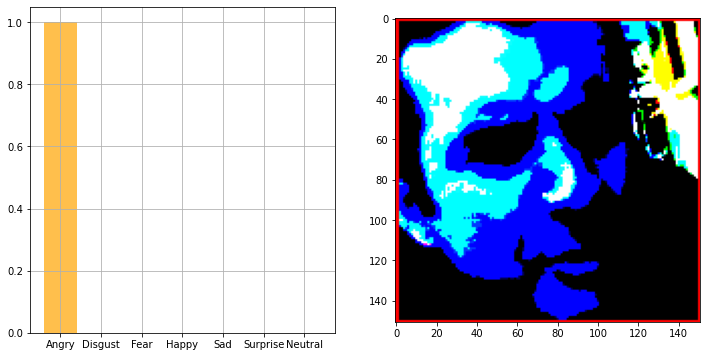

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -81.939     -81.779     -72.68    ]
   ...
   [ -32.939003  -21.779     -43.68    ]
   [ -27.939003  -15.778999  -42.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -45.939003  -57.779     -59.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

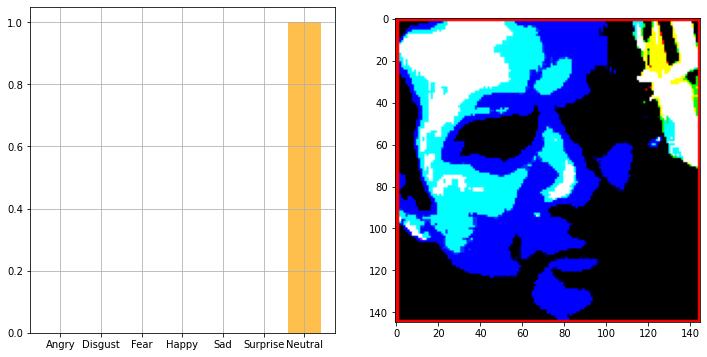

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -80.939      -83.779      -73.68     ]
   ...
   [  21.060997    33.221        6.3199997]
   [  23.060997    45.221       15.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -77.939      -89.779      -91.68     ]
 

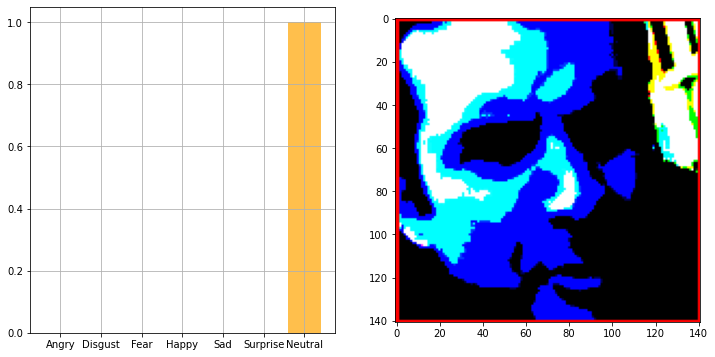

[[0. 0. 0. 0. 0. 0. 1.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -77.939      -71.779      -69.68     ]
   ...
   [  -8.939003    -6.7789993  -36.68     ]
   [   4.060997     8.221001   -16.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -45.939003   -56.779      -61.68     ]
 

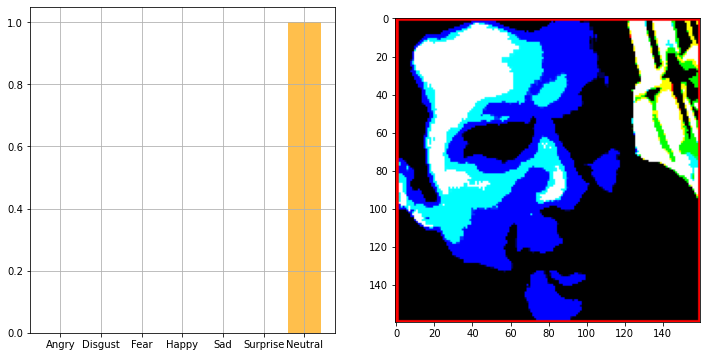

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -74.779     -70.68    ]
   ...
   [  49.060997   57.221      36.32    ]
   [  55.060997   63.221      42.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -79.779     -84.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    

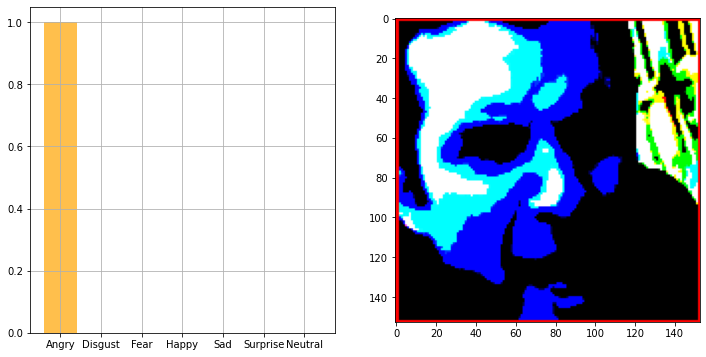

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [-103.939     -93.779     -92.68    ]
   ...
   [  40.060997   62.221      52.32    ]
   [  41.060997   61.221      51.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -50.939003  -59.779     -64.68    ]
   ...
   [ -97.939    -110.779    -117.68    ]
   [ -97.939    

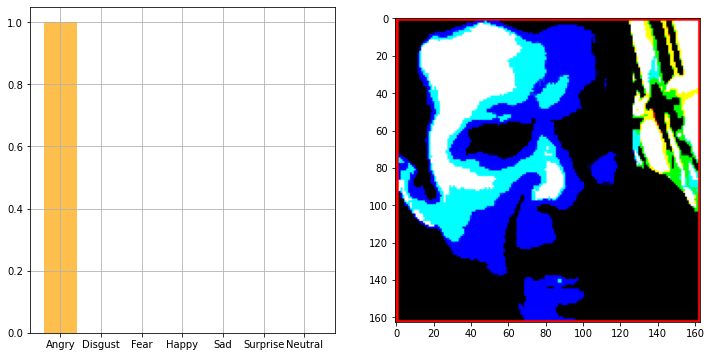

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -62.939003  -60.779     -56.68    ]
   ...
   [  39.060997   61.221      44.32    ]
   [  40.060997   62.221      45.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -54.939003  -65.779     -70.68    ]
   ...
   [-103.939    -113.779    -120.68    ]
   [-103.939    

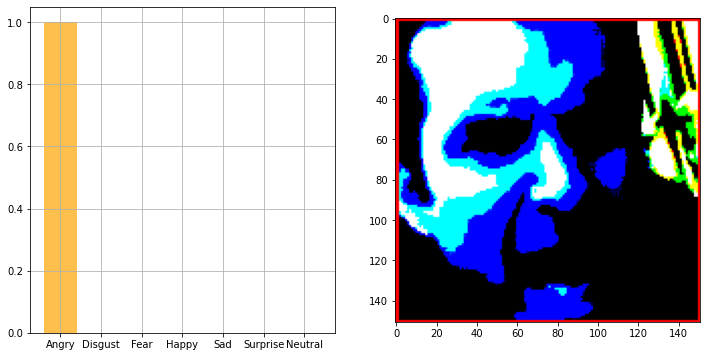

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -61.939003  -60.779     -62.68    ]
   ...
   [  44.060997   70.221      55.32    ]
   [  44.060997   70.221      55.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -69.939     -81.779     -83.68    ]
   ...
   [-102.939    -112.779    -119.68    ]
   [-101.939    

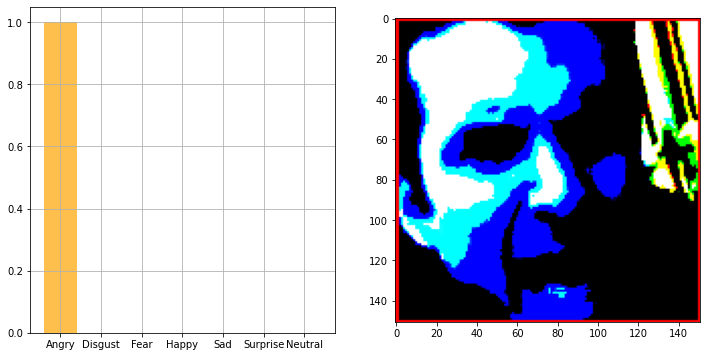

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -71.939     -63.779     -66.68    ]
   ...
   [  53.060997   63.221      43.32    ]
   [  49.060997   64.221      48.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -38.939003  -50.779     -52.68    ]
   ...
   [-103.939    -115.779    -122.68    ]
   [-102.939    

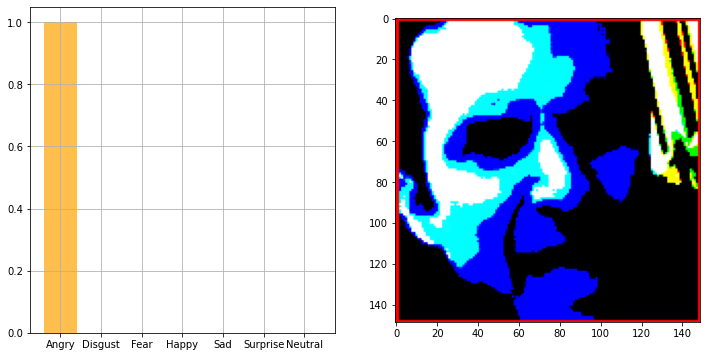

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -67.939     -61.779     -64.68    ]
   ...
   [  52.060997   63.221      46.32    ]
   [  51.060997   65.221      52.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -48.939003  -60.779     -62.68    ]
   ...
   [-103.939    -114.779    -121.68    ]
   [-101.939    

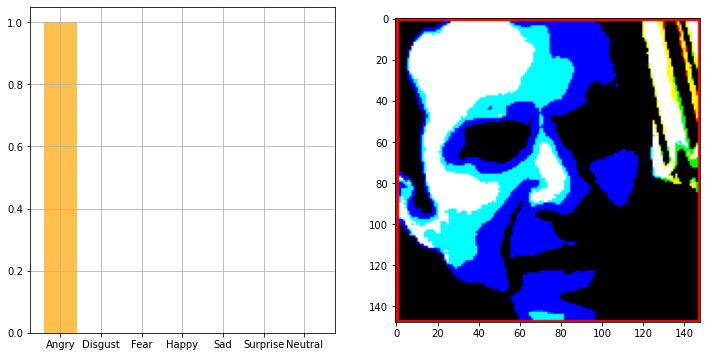

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -68.939     -62.779     -65.68    ]
   ...
   [  50.060997   71.221      59.32    ]
   [  44.060997   71.221      60.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -26.939003  -38.779     -40.68    ]
   ...
   [-100.939    -110.779    -117.68    ]
   [ -98.939    

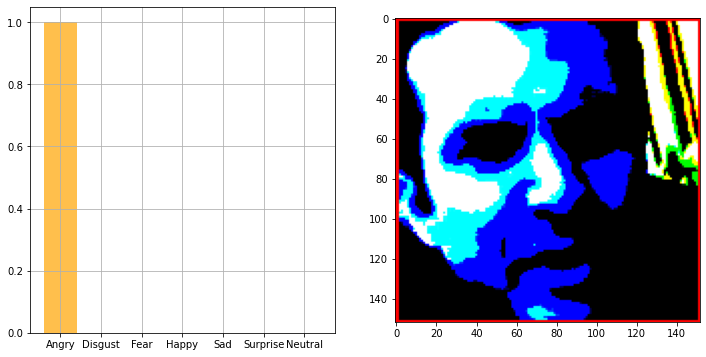

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -87.939     -76.779     -80.68    ]
   ...
   [  50.060997   71.221      59.32    ]
   [  44.060997   71.221      60.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -31.939003  -38.779     -41.68    ]
   ...
   [-103.939    -114.779    -121.68    ]
   [-103.939    

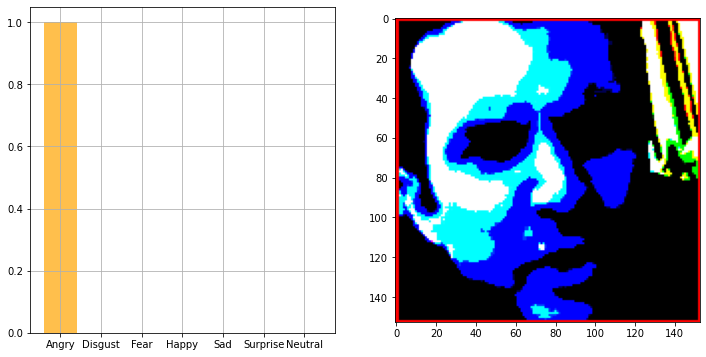

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -72.939     -64.779     -67.68    ]
   ...
   [  46.060997   71.221      60.32    ]
   [  46.060997   71.221      60.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -27.939003  -37.779     -39.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    

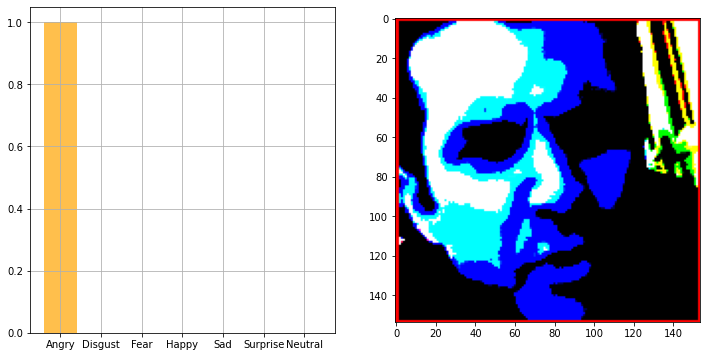

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -70.939     -63.779     -63.68    ]
   ...
   [  50.060997   62.221      42.32    ]
   [  44.060997   61.221      45.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -65.939     -72.779     -75.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    

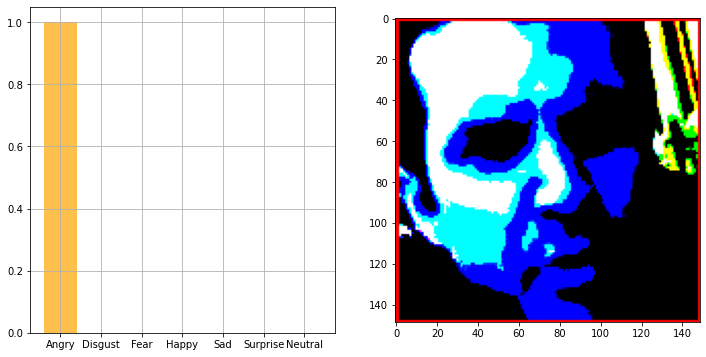

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -77.939     -69.779     -72.68    ]
   ...
   [  45.060997   56.221      34.32    ]
   [  43.060997   59.221      41.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -73.939     -78.779     -81.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

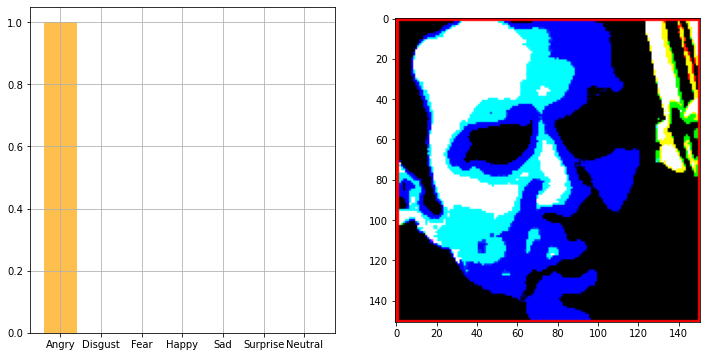

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -74.939      -66.779      -69.68     ]
   ...
   [   3.060997     4.2210007  -22.68     ]
   [  19.060997    25.221        2.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -73.939      -78.779      -81.68     ]
 

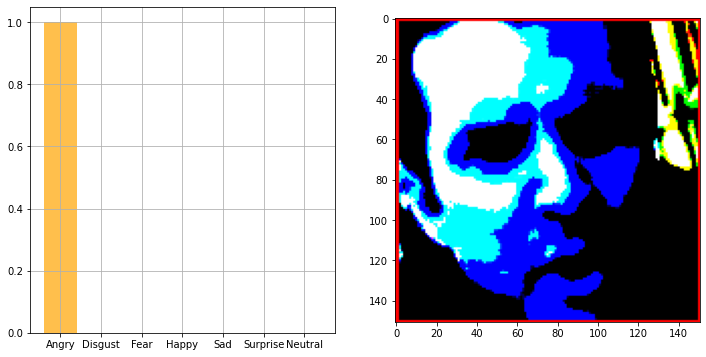

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -74.939      -69.779      -69.68     ]
   ...
   [  -8.939003    -7.7789993  -48.68     ]
   [ -14.939003   -10.778999   -47.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -69.939      -74.779      -77.68     ]
 

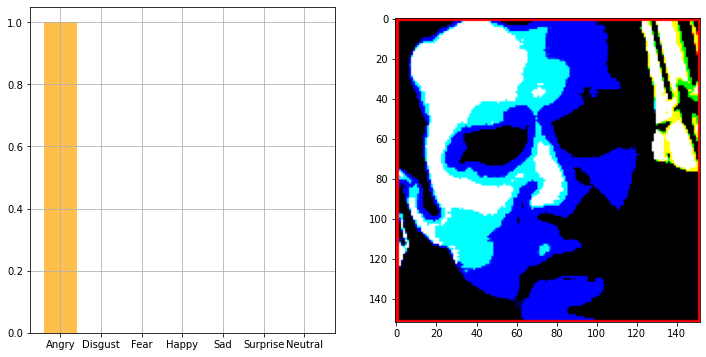

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -77.939     -71.779     -69.68    ]
   ...
   [  15.060997   32.221      -8.68    ]
   [   2.060997   19.221     -21.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -67.939     -72.779     -75.68    ]
   ...
   [-102.939    -112.779    -119.68    ]
   [-102.939    

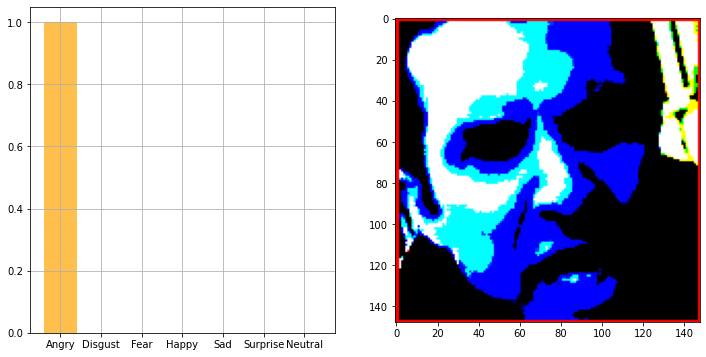

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -75.939      -70.779      -70.68     ]
   ...
   [  11.060997    22.221      -15.68     ]
   [  -4.939003     6.2210007  -31.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -68.939      -71.779      -74.68     ]
 

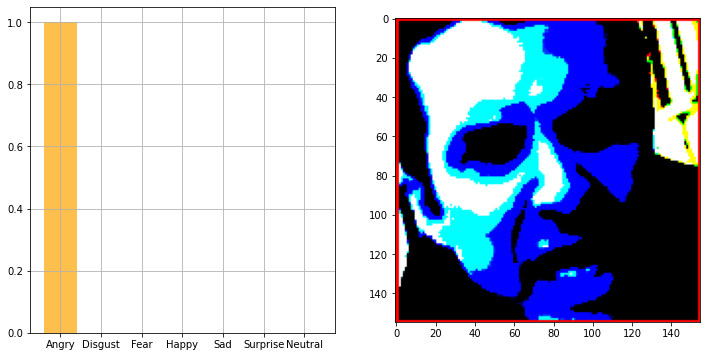

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   ...
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -72.939  -69.779  -69.68 ]
   ...
   [  66.061   70.221   45.32 ]
   [  64.061   70.221   40.32 ]
   [ 151.061 -116.779 -123.68 ]]

  ...

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -67.939  -66.779  -68.68 ]
   ...
   [-103.939 -114.779 -121.68 ]
   [-103.939 -114.779 -121.68 ]
   [ 151.061 -116.779 -123.68 ]]

  [[ 151.061 -116.779 -123.68 ]
   [ 151.061 -116.779 -123.68 ]
   [ -65.939  -64.779  -66.68 ]
   ...
   [-103.939 -114.779 -121.68 ]
   [-103.939 

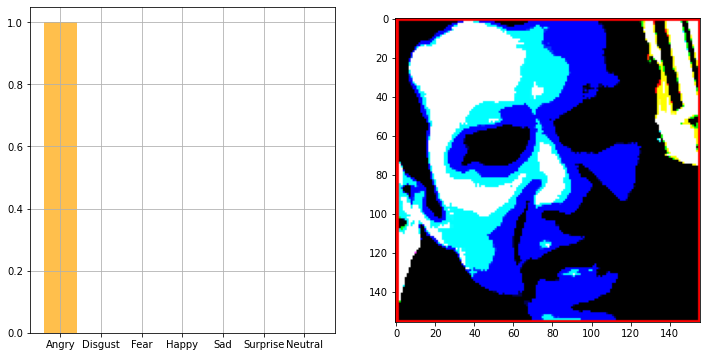

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -64.939     -59.779     -59.68    ]
   ...
   [  43.060997   53.221      33.32    ]
   [  66.061      68.221      43.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  24.060997   32.221      29.32    ]
   ...
   [-103.939    -115.779    -122.68    ]
   [-102.939    

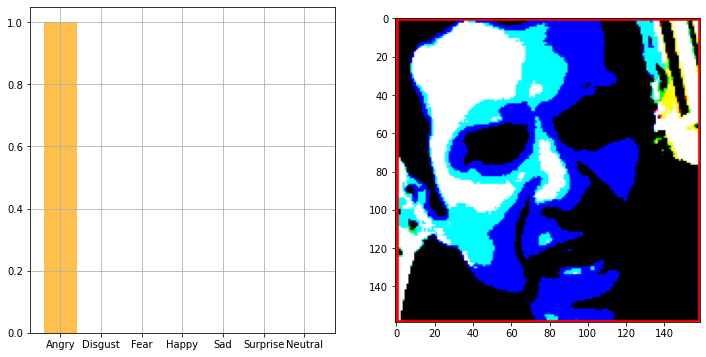

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -74.939      -71.779      -71.68     ]
   ...
   [  34.060997    54.221       37.32     ]
   [   1.060997    21.221        4.3199997]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -20.939003   -15.778999   -20.68     ]
 

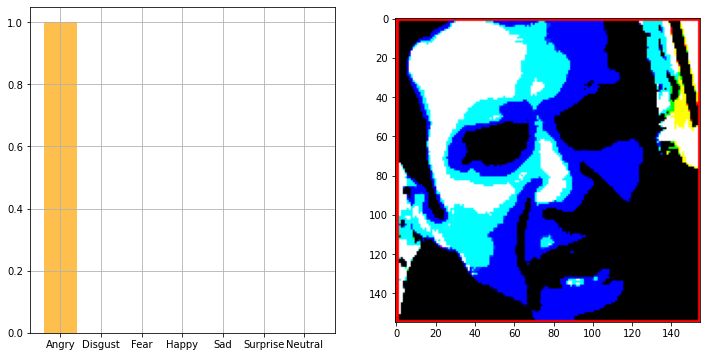

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -74.939      -75.779      -72.68     ]
   ...
   [  -1.939003     4.2210007  -16.68     ]
   [  35.060997    41.221       20.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -63.939003   -63.779      -67.68     ]
 

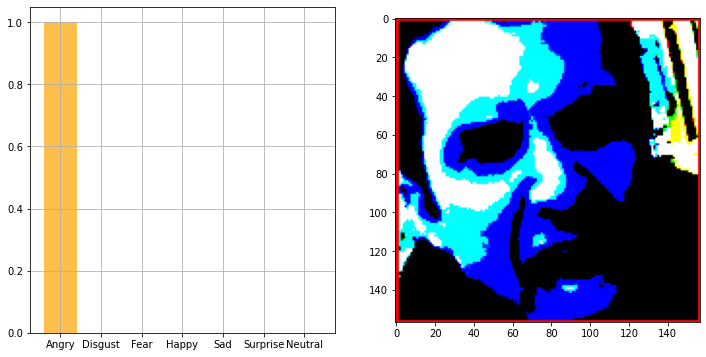

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -48.939003  -36.779     -42.68    ]
   ...
   [  79.061      78.221      49.32    ]
   [  74.061      73.221      44.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  22.060997   29.221      24.32    ]
   ...
   [-100.939    -113.779    -120.68    ]
   [-101.939    

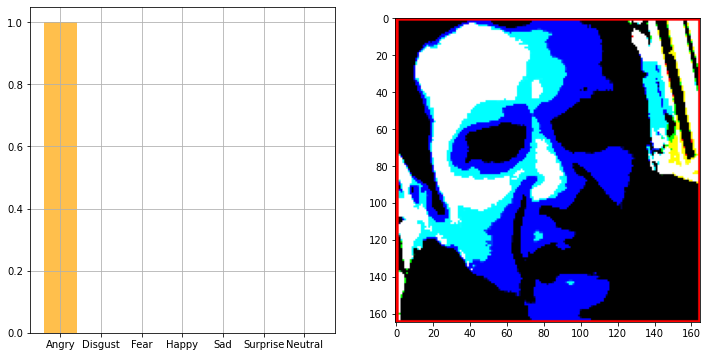

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -57.939003  -45.779     -51.68    ]
   ...
   [  50.060997   49.221      29.32    ]
   [  64.061      63.221      43.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -69.939     -64.779     -69.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    

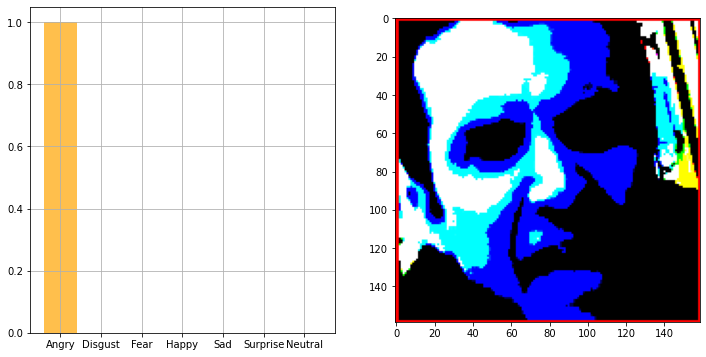

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 112.061     121.221     116.32    ]
   ...
   [  67.061      65.221      39.32    ]
   [  74.061      72.221      46.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -51.939003  -48.779     -55.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    

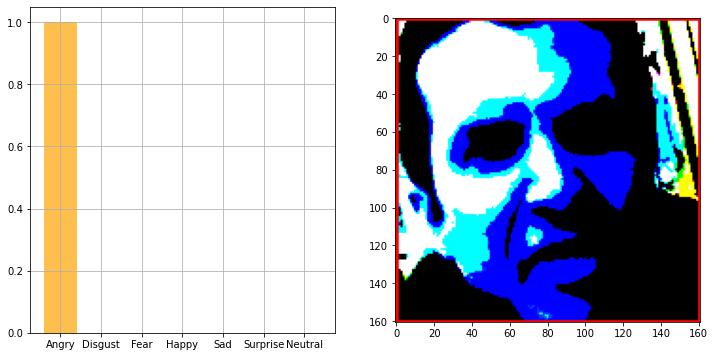

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -16.939003    -4.7789993  -10.68     ]
   ...
   [  91.061       94.221       74.32     ]
   [  65.061       68.221       48.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -61.939003   -61.779      -65.68     ]
 

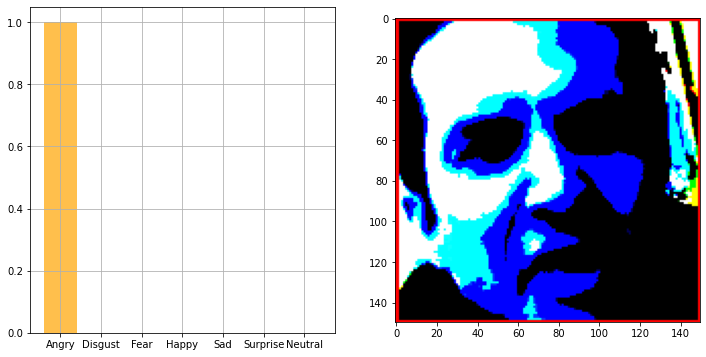

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 106.061      114.221      111.32     ]
   ...
   [   2.060997     4.2210007  -13.68     ]
   [  -4.939003    -2.7789993  -20.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -67.939      -65.779      -69.68     ]
 

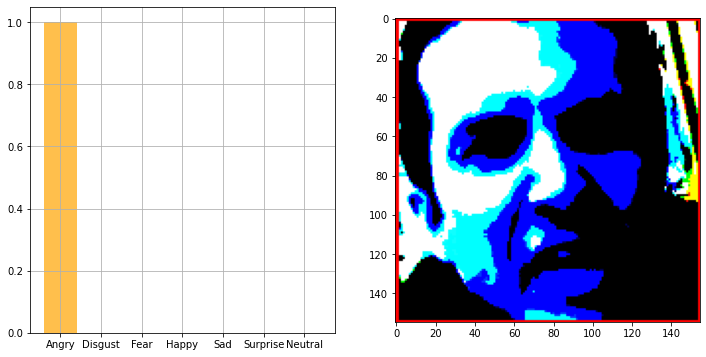

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  99.061     107.221     104.32    ]
   ...
   [  28.060997   31.221      11.32    ]
   [  55.060997   58.221      38.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -59.939003  -57.779     -61.68    ]
   ...
   [ -96.939    -107.779    -112.68    ]
   [ -96.939    

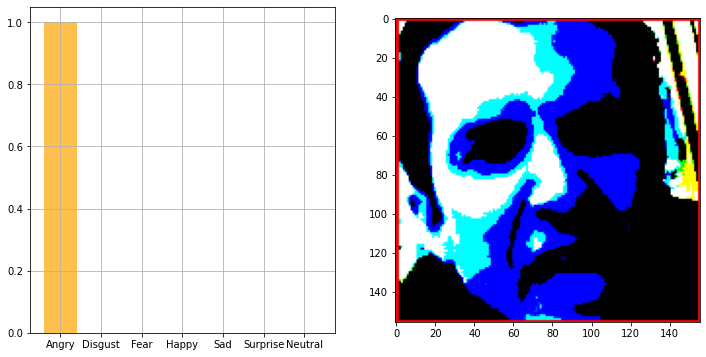

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  80.061      91.221      87.32    ]
   ...
   [  67.061      64.221      35.32    ]
   [  55.060997   50.221      17.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -58.939003  -56.779     -60.68    ]
   ...
   [-102.939    -112.779    -119.68    ]
   [-102.939    

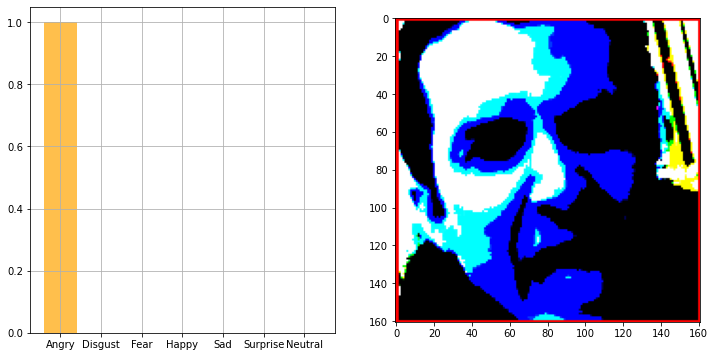

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -65.939     -53.779     -59.68    ]
   ...
   [ -13.939003  -16.779     -54.68    ]
   [ -15.939003  -18.779     -56.68    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -87.939     -88.779     -90.68    ]
   ...
   [ -99.939    -112.779    -119.68    ]
   [ -99.939    

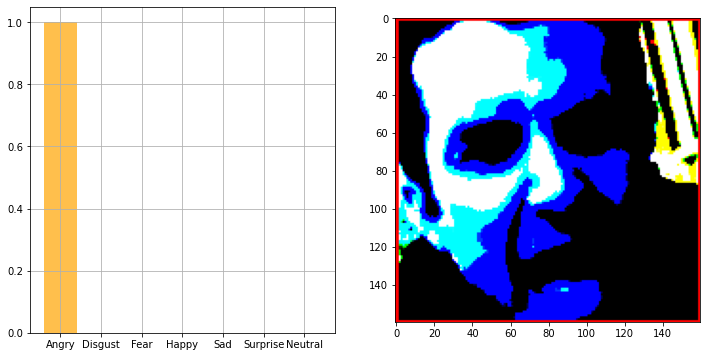

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -74.939      -63.779      -67.68     ]
   ...
   [  -2.939003    -7.7789993  -40.68     ]
   [  -9.939003    -8.778999   -35.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -68.939      -72.779      -73.68     ]
 

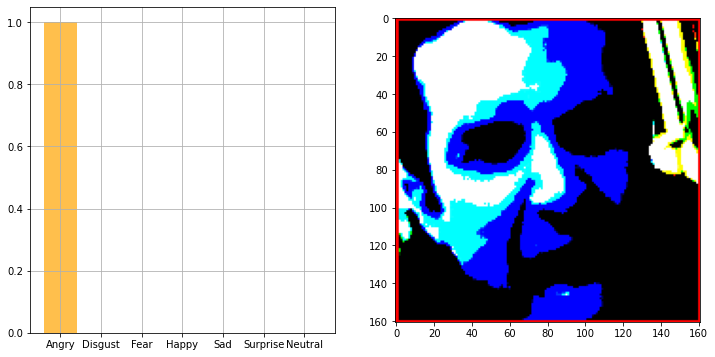

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -76.939     -66.779     -67.68    ]
   ...
   [  42.060997   58.221      45.32    ]
   [  42.060997   58.221      45.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -45.939003  -50.779     -53.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    

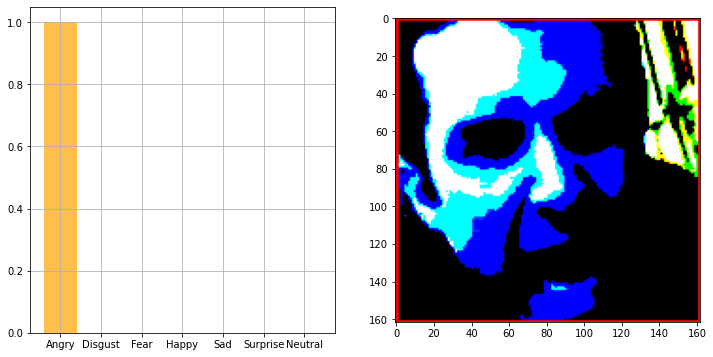

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -65.939     -56.779     -55.68    ]
   ...
   [  41.060997   57.221      46.32    ]
   [  42.060997   58.221      47.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -44.939003  -54.779     -56.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    

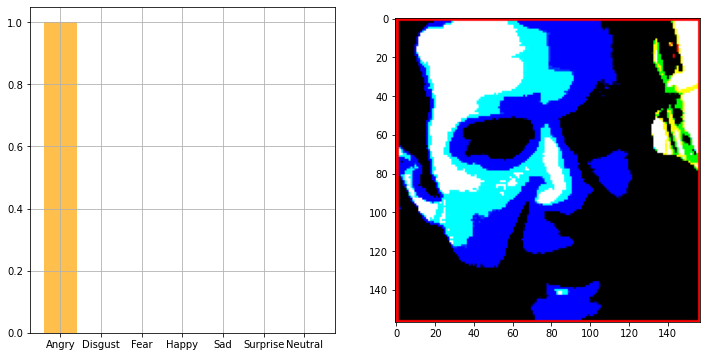

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -62.939003  -51.779     -50.68    ]
   ...
   [  80.061      72.221      35.32    ]
   [  85.061      76.221      41.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -51.939003  -61.779     -63.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-103.939    

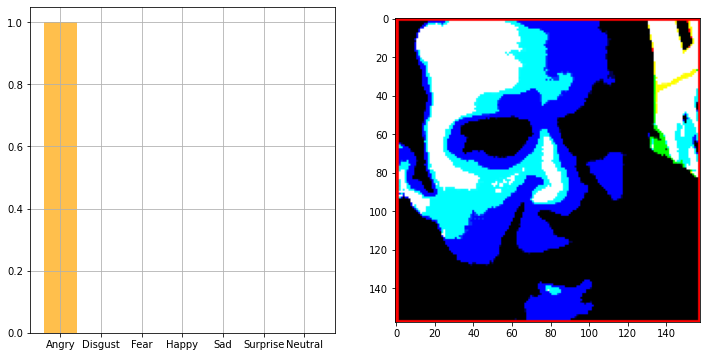

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -55.939003  -44.779     -43.68    ]
   ...
   [  65.061      55.221      23.32    ]
   [  53.060997   43.221      11.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -56.939003  -65.779     -70.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

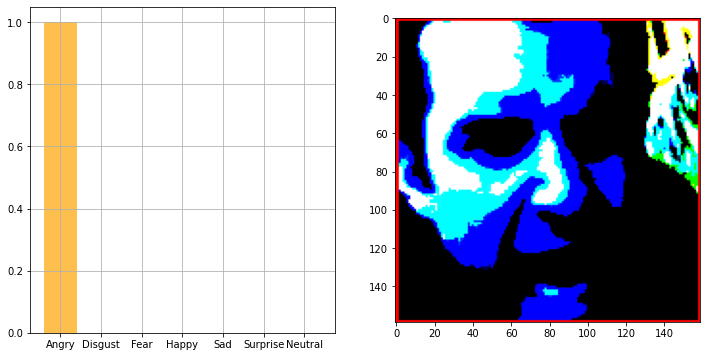

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -10.939003    -0.7789993   -1.6800003]
   ...
   [  57.060997    59.221       41.32     ]
   [  61.060997    63.221       45.32     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -51.939003   -62.779      -67.68     ]
 

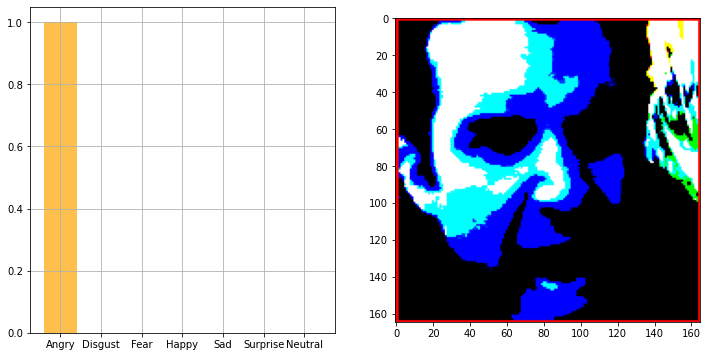

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -54.939003  -45.779     -44.68    ]
   ...
   [  69.061      71.221      41.32    ]
   [  69.061      72.221      40.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -47.939003  -57.779     -59.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-102.939    

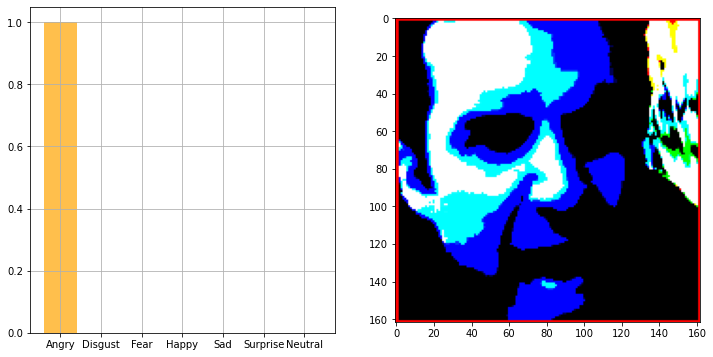

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -61.939003  -52.779     -51.68    ]
   ...
   [  69.061      64.221      24.32    ]
   [  70.061      64.221      22.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -60.939003  -69.779     -74.68    ]
   ...
   [-103.939    -115.779    -122.68    ]
   [-102.939    

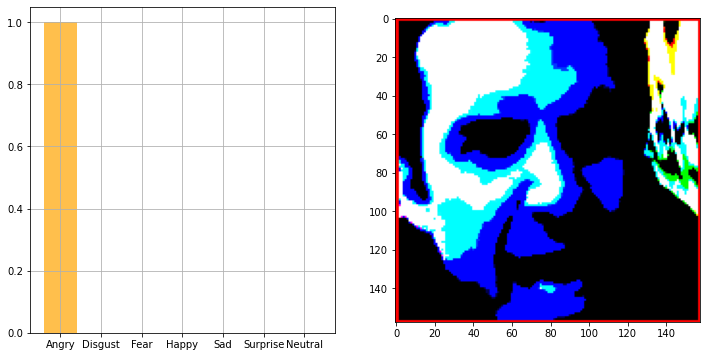

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [  73.061      84.221      80.32    ]
   ...
   [  63.060997   58.221      18.32    ]
   [  65.061      59.221      17.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -38.939003  -51.779     -58.68    ]
   ...
   [-103.939    -116.779    -123.68    ]
   [-102.939    

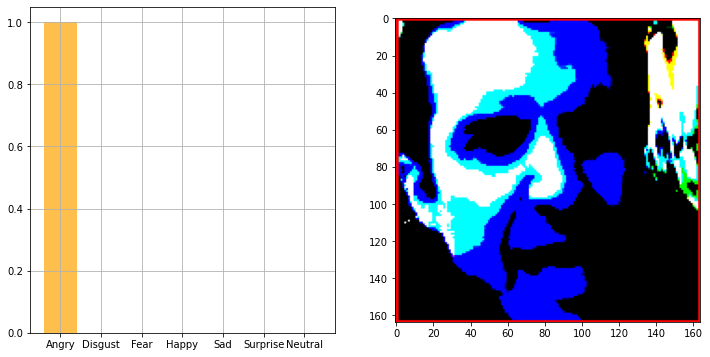

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 102.061     111.221     106.32    ]
   ...
   [  48.060997   50.221      25.32    ]
   [  53.060997   55.221      25.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -53.939003  -62.779     -67.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

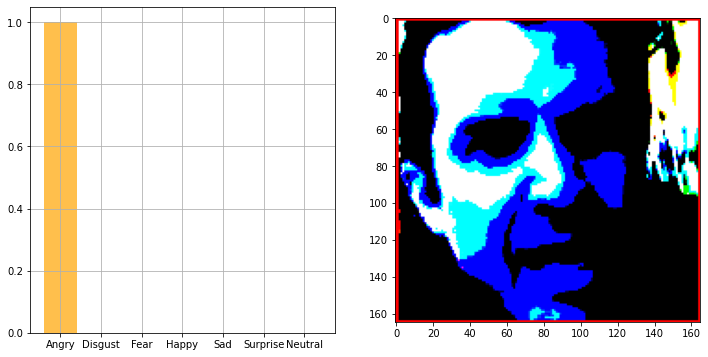

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [  83.061       91.221       88.32     ]
   ...
   [ -15.939003    -8.778999   -20.68     ]
   [ -13.939003    -6.7789993  -18.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -75.939      -80.779      -83.68     ]
 

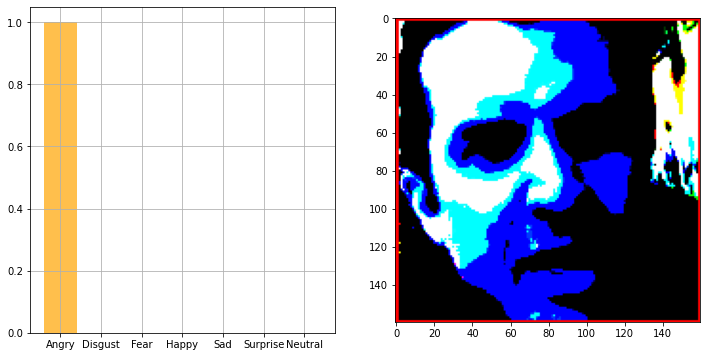

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   ...
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]]

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ 122.061      128.22101    120.32     ]
   ...
   [  -3.939003     7.2210007   -4.6800003]
   [  -9.939003     1.2210007  -10.68     ]
   [ 151.061     -116.779     -123.68     ]]

  ...

  [[ 151.061     -116.779     -123.68     ]
   [ 151.061     -116.779     -123.68     ]
   [ -84.939      -85.779      -87.68     ]
 

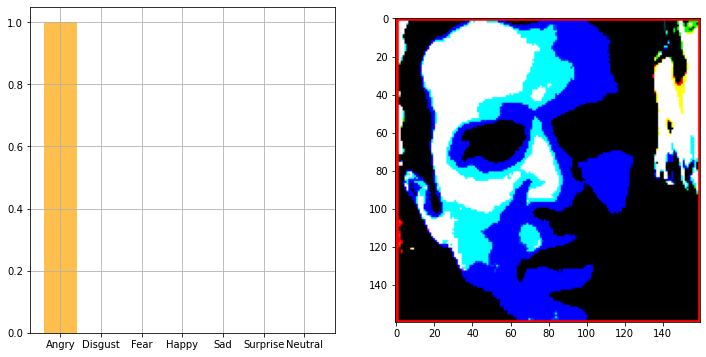

[[1. 0. 0. 0. 0. 0. 0.]]
HERE
tf.Tensor(
[[[[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   ...
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]]

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ 128.061     133.22101   128.32    ]
   ...
   [  28.060997   34.221      11.32    ]
   [  42.060997   46.221      21.32    ]
   [ 151.061    -116.779    -123.68    ]]

  ...

  [[ 151.061    -116.779    -123.68    ]
   [ 151.061    -116.779    -123.68    ]
   [ -83.939     -79.779     -82.68    ]
   ...
   [-102.939    -115.779    -122.68    ]
   [-102.939    

In [ ]:
import cv2
import time
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np

ho = 'HO'
ho
''''''
# Load the Haar cascade classifier for face detection
#face_cascade = cv2.CascadeClassifier("path/to/haarcascade_frontalface_default.xml")
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Open the video
cap = cv2.VideoCapture("path/to/save/video.mp4")

print("HI")

# Get the video frame width and height
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

# Set the time interval for face detection
detection_interval = 5
print("HEY")

while True:
    # Read the next frame from the video
    ret, frame = cap.read()
    
    print("HERE")

    # Check if the video has ended
    if not ret:
        print("AGAIN")
        break

    # Convert the frame to grayscale
    #gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect faces in the frame
    #faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    
    # Draw a rectangle around the detected faces
    if len(faces) == 0:
        print("No Face detected") 
        continue

    
    for (x, y, w, h) in faces:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 0), 2)
    
    
    # Display the frame
    #cv2.imshow("Video", frame)


        face_img = frame[y:y + h, x:x + w]
        face_img = cv2.cvtColor(face_img, cv2.COLOR_BGR2RGB)
        face_img = tf.keras.preprocessing.image.img_to_array(face_img)
        face_img = tf.expand_dims(face_img, axis=0)
        face_img = tf.keras.applications.vgg16.preprocess_input(face_img)
        
        # Resize the tensor to size (48, 48)
        resized_tensor = tf.image.resize(face_img, (48, 48))

        # Convert the tensor to a numpy array
        numpy_array = resized_tensor.numpy()
        numpy_array = np.mean(numpy_array, axis=-1, keepdims=True)

        #numpy_array = face_img.numpy()
        #numpy_array = np.reshape(numpy_array, (numpy_array.shape[0], numpy_array.shape[1], numpy_array.shape[2], 1))
        numpy_array = np.reshape(numpy_array, (1, 48, 48, 1))        #numpy_array = np.reshape(numpy_array, (numpy_array.shape[0], numpy_array.shape[1], numpy_array.shape[2]))
        #face_img = np.reshape(face_img, (48, 48, 1))
        #face_img = face_img.astype('float32')/255
        #numpy_array = np.reshape(numpy_array, (1, 48, 48, 1))

        face_features = model.predict(numpy_array)
        test_image_array2 = face_img
        print(face_img)
        plt.imshow(face_img[0])
        plt.show()
        print(face_features)

        fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=False)

        bar_label = emotions.values()

        #axs[0].imshow(face_img, 'gray')
        #axs[0].set_title("HELLO")

        axs[0].bar(bar_label, face_features[0], color='orange', alpha=0.7)
        axs[0].grid()

    
    
    # Check if the user pressed the 'q' key
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

    # Sleep for the specified interval before detecting faces again
    time.sleep(detection_interval)

# Release the video capture and close the display window
cap.release()
cv2.destroyAllWindows()
